In [84]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
import torch.nn as nn
import torch.optim as optim
import torch.functional as F
from torch.utils.data import TensorDataset,DataLoader
import matplotlib.pyplot as plt

In [85]:
data = pd.read_csv('../traffic/data/5.csv')
data

,service_name,datetime,volumn,packets,unknown
0,S201709282113260015,2018-07-25 00:00:00,92408,26971036,177711644
1,S201709282113260015,2018-07-25 00:01:00,92150,26948190,220370286
2,S201709282113260015,2018-07-25 00:02:00,94896,26238222,188035073
3,S201709282113260015,2018-07-25 00:03:00,92694,26087970,191997884
4,S201709282113260015,2018-07-25 00:04:00,93674,25314568,169497214
...,...,...,...,...,...
38875,S201709282113260015,2018-08-20 23:55:00,81521,23637112,138239574
38876,S201709282113260015,2018-08-20 23:56:00,83092,24617816,164460450
38877,S201709282113260015,2018-08-20 23:57:00,84873,25101336,173568370
38878,S201709282113260015,2018-08-20 23:58:00,81736,24181689,157334718


In [86]:
data['datetime'] = pd.to_datetime(data['datetime'])
data['datetime'].dtypes

dtype('<M8[ns]')

In [87]:
scaler = MinMaxScaler()
data[['volumn']] = scaler.fit_transform(data[['volumn']])
data

,service_name,datetime,volumn,packets,unknown
0,S201709282113260015,2018-07-25 00:00:00,0.148677,26971036,177711644
1,S201709282113260015,2018-07-25 00:01:00,0.148146,26948190,220370286
2,S201709282113260015,2018-07-25 00:02:00,0.153802,26238222,188035073
3,S201709282113260015,2018-07-25 00:03:00,0.149266,26087970,191997884
4,S201709282113260015,2018-07-25 00:04:00,0.151285,25314568,169497214
...,...,...,...,...,...
38875,S201709282113260015,2018-08-20 23:55:00,0.126251,23637112,138239574
38876,S201709282113260015,2018-08-20 23:56:00,0.129487,24617816,164460450
38877,S201709282113260015,2018-08-20 23:57:00,0.133156,25101336,173568370
38878,S201709282113260015,2018-08-20 23:58:00,0.126694,24181689,157334718


In [88]:
data.drop(columns=['unknown','service_name','packets'],inplace = True)

In [89]:
device = torch.device("cuda:0")

In [131]:
def seq_data(x,sequence_length):
    x_seq = []
    target = []
    for i in range(len(x)-sequence_length):
        x_seq.append(x[i:i+sequence_length])
        target.append(x[i+sequence_length])

    
    return torch.FloatTensor(x_seq).to(device), torch.FloatTensor(target).to(device).view(-1,1)

In [132]:
class VanillaRNN(nn.Module):
    
    def __init__(self,input_size,hidden_size,num_layers,device,sequence_length):
        super(VanillaRNN,self).__init__()
        self.device = device
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.rnn = nn.RNN(input_size,hidden_size,num_layers,batch_first = True)
        # input_size는 feature 개수를 의미함
        # hidden_state는 hidden_state의 벡터의크기를 의미함
        # rnn이나 lstm은 데이터를 받을때 sequence,batch,input_size이런식으로 받는데 이러면 아웃풋도 같은 형태로 나오게 되서
        # 헷갈리므로batch_first를  써주면서 batch,sequence,input_size로 바꿔서 본
        self.fc = nn.Sequential(nn.Linear(hidden_size*sequence_length,1))
   
    def forward(self,x):
        h0 = torch.zeros(self.num_layers,x.size()[0],self.hidden_size).to(self.device)
        out,h_n = self.rnn(x,h0) # 64x60x10
        out = out.reshape(out.shape[0],-1)
        out = self.fc(out) # 64x1
        return out

In [133]:
split = 1440
sequence_length = 60
X = data[['volumn']].values[:-split]
x_seq, target = seq_data(X,sequence_length)

In [134]:
batch_size = 128
train = TensorDataset(x_seq,target)
train_loader = DataLoader(dataset = train,batch_size = batch_size)
# shuffle 제거

In [135]:
input_size = x_seq.size(2)
num_layers = 2
hidden_size = 10

In [136]:
model = VanillaRNN(input_size = input_size, hidden_size = hidden_size,sequence_length=sequence_length,
                  num_layers = num_layers, device=device).to(device) # GPU 연산을 위한 to(device)
criterion = nn.MSELoss()
num_epochs = 100
optimizer = optim.Adam(model.parameters(),lr=1e-3)

<font color = blue><font size =6> 기본 모델 training </font></font>

In [137]:
import time
count = 0

loss_graph = []
n = len(train_loader)
begin = time.time()
for epoch in range(num_epochs):

    running_loss = 0.0
    for dt in train_loader:
        seq,target = dt
        out = model(seq)
        #print(seq)
        #print('out1',out) #size는 64x1
  
        loss = criterion(out,target)# 손실함수 계산
        
        optimizer.zero_grad() # optimizer 초기화
        
        loss.backward()
        
        optimizer.step() # optimizer 최적화
        
        running_loss = running_loss + loss.item()
        
        count+=1
        
    loss_graph.append(running_loss/n)
    #print('out2',out)
    print('mse',running_loss/n)

end = time.time()
#시간차
result = end - begin
print(count) # 64크기를 갖는 배치가 585개 있는데(마지막은 < 64) 이걸 50번 돌았음

mse 0.014097053218669093
mse 0.0063459914264607595
mse 0.0006562650086265167
mse 0.0043595639022437245
mse 0.0014846311676300667
mse 0.00014442623615517044
mse 0.00015144009986827183
mse 0.001052675684059999
mse 0.009771871302247945
mse 0.003374626623575651
mse 0.000155368104280861
mse 0.00014003609918141754
mse 0.00012138854264571586
mse 0.0005440486797324225
mse 0.001022950529966587
mse 0.00046116147149507586
mse 0.010694599829936688
mse 0.00024031557178536957
mse 0.0001697818192936152
mse 0.0010111786944686583
mse 0.0017195774041932337
mse 0.0005290239040400423
mse 0.0003278270209746105
mse 0.00011297291516851678
mse 0.0010884717886169197
mse 0.004022706141269935
mse 0.00010894246736642012
mse 0.00019076723381801454
mse 0.0016370581811998685
mse 0.0012126696369286264
mse 0.00011592052479304569
mse 0.0002931015989735227
mse 0.0008227006011474548
mse 0.008396692669499415
mse 0.0008431209704032924
mse 9.100262713476038e-05
mse 9.311744499160781e-05
mse 0.00038036866893387104
mse 0.0003

In [125]:
out

tensor([[0.1043],
        [0.1047],
        [0.1020],
        [0.1025]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [126]:
Y = data[['volumn']].values[-2*split:-split]
len(Y)

1440

In [127]:
[[1,2]]+[[3,4]]

[[1, 2], [3, 4]]

<font color = blue><font size =6> One Step Training and forecasting</font></font>

In [138]:
out_list = []
Y = data[['volumn']].values[-split:]

# for num in range(split)
#     new_tr = torch.FloatTensor(new_train).unsqueeze(0).to(device)
#     out = model(new_tr)
#     target = torch.FloatTensor(Y[num]).to(device)
for num in range(split):
    if num==0:
        new_train=X[-60:].tolist()
        target = torch.FloatTensor(X[-60]).unsqueeze(0).to(device)
    else:
        target = torch.FloatTensor([[out.cpu()[0].item() + out.cpu()[0].item()-new_train[-1][0]]]).unsqueeze(0).to(device)
        # 실시간으로 들어오는 이전정보 반영
        new_train = new_train[1:]+out.cpu().tolist()        
    #print(type(new_train))
    new_tr = torch.FloatTensor(new_train).unsqueeze(0).to(device)
##############################################################################################
# target을 Y[num] 말고 다른걸로도 시도해볼만 한가

    
    
##############################################################################################

    train_loader = DataLoader(dataset = new_tr, batch_size = 64,shuffle = False)
    #print(next(iter(train_loader)))
    
    for epoch in range(num_epochs):
        running_loss = 0.0
        for dt in train_loader:

            out = model(dt)
           
            #print(target)
            print(out)
           
            loss = criterion(out,target)# 손실함수 계산

            optimizer.zero_grad() # optimizer 초기화

            loss.backward()

            optimizer.step() # optimizer 최적화

            running_loss = running_loss + loss.item()
   
        print('mse',running_loss/n)
    out_list.append(out)
    loss_graph.append(running_loss/n)

tensor([[0.0844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2117504486655214e-05
tensor([[0.0890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9140438108924307e-05
tensor([[0.0995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2856377179610444e-05
tensor([[0.1141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.543620760225192e-05
tensor([[0.1308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.718901291591316e-06
tensor([[0.1481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7844682194979118e-06
tensor([[0.1647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.533417579613042e-07
tensor([[0.1798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.722855818011709e-09
tensor([[0.1929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5425203945106306e-07
tensor([[0.2038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7143681855179343e-06
tensor([[0.2123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2604349786638195e-06
tensor([[0.2184]], device

mse 1.662197842393131e-10
tensor([[0.1811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.111266572399621e-10
tensor([[0.1810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5444281178490526e-10
tensor([[0.1810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.715272563137204e-10
tensor([[0.1809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.465114859848272e-10
tensor([[0.1809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.725781706317795e-10
tensor([[0.2049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.984361268452817e-06
tensor([[0.2068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.315253677221695e-06
tensor([[0.2102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.138389336167749e-06
tensor([[0.2149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.655585529352618e-06
tensor([[0.2205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.071470593404241e-06
tensor([[0.2267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.562828544972293e-06
tenso

/home/sjlee/sj_virtual/lib/python3.8/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1, 1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


mse 2.7762365785117407e-12
tensor([[0.2591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.76053117042103e-12
tensor([[0.2591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.96722238615899e-11
tensor([[0.2592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.109907766756048e-10
tensor([[0.2592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7935403333150933e-10
tensor([[0.2593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4341399582347645e-10
tensor([[0.2593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9488362604988094e-10
tensor([[0.2593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2843589054336853e-10
tensor([[0.2593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.418218609187453e-10
tensor([[0.2593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.355418029130759e-10
tensor([[0.2593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.122332123605332e-10
tensor([[0.2593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.758279611540343e-10
ten

tensor([[0.3370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5938252492541798e-09
tensor([[0.3371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2696924346193009e-09
tensor([[0.3371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.519388872164392e-10
tensor([[0.3372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.633536283792414e-10
tensor([[0.3373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2022380114885827e-10
tensor([[0.3374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.321919797122663e-10
tensor([[0.3375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0211449736601028e-10
tensor([[0.3376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7245567197878514e-11
tensor([[0.3377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.705708708551831e-13
tensor([[0.3377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1657026500695035e-11
tensor([[0.3378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.928033407968262e-11
tensor([[0.3378]], device=

mse 3.4185798947054514e-09
tensor([[0.4157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.797376776939344e-09
tensor([[0.4158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1421040807671466e-09
tensor([[0.4159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5158418017200058e-09
tensor([[0.4161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.697483377556997e-10
tensor([[0.4162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.375828595322723e-10
tensor([[0.4164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3458582971482896e-10
tensor([[0.4165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.024385086352641e-11
tensor([[0.4166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.220700625694678e-13
tensor([[0.4167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.182164429571343e-11
tensor([[0.4168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2548583635980818e-10
tensor([[0.4169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5190757633057845e-10


tensor([[0.4959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.058248874122019e-10
tensor([[0.4961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2531203469656863e-09
tensor([[0.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.892305773585747e-09
tensor([[0.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3816546641565135e-09
tensor([[0.4964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6353291880916295e-09
tensor([[0.4964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.627826632821373e-09
tensor([[0.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.385054599021823e-09
tensor([[0.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.972047196000492e-09
tensor([[0.4962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4734370962619494e-09
tensor([[0.4960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[0.4959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.430057798930462e-10
tensor([[0.4958]], device='c

mse 6.483634077103923e-09
tensor([[0.5759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5951426284536305e-09
tensor([[0.5758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.893748385047798e-09
tensor([[0.5757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.623423300637011e-09
tensor([[0.5755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.121173381182121e-09
tensor([[0.5752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7211065883062852e-09
tensor([[0.5750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.746115838875299e-10
tensor([[0.5747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0847393972818178e-10
tensor([[0.5744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7870222556182467e-11
tensor([[0.5742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.935099262611483e-10
tensor([[0.5740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.66735074369383e-10
tensor([[0.5739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.259291252996828e-09
ten

tensor([[0.6544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.717301269638775e-09
tensor([[0.6541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0066811302200014e-09
tensor([[0.6537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7032401003433216e-09
tensor([[0.6533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2597935272606387e-10
tensor([[0.6530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8583772367001757e-11
tensor([[0.6526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.794629758961321e-10
tensor([[0.6523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5893798222924851e-09
tensor([[0.6522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5810900902369223e-09
tensor([[0.6521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.190813165451257e-09
tensor([[0.6521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2453324062985754e-09
tensor([[0.6521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7800913334797524e-09
tensor([[0.6523]], devic

tensor([[0.7340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2603252988075043e-08
tensor([[0.7335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.285344344484318e-09
tensor([[0.7329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7165652238132125e-09
tensor([[0.7323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.805322148262671e-10
tensor([[0.7317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8263576083259146e-10
tensor([[0.7313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.04476486709634e-09
tensor([[0.7309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.360662365897238e-09
tensor([[0.7307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.060113745670823e-09
tensor([[0.7307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.4545069660660856e-09
tensor([[0.7308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.503194908495856e-09
tensor([[0.7310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.704043276117894e-09
tensor([[0.7313]], device='cu

mse 1.63207706765259e-08
tensor([[0.8127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2556386074236413e-08
tensor([[0.8122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.852105146459917e-09
tensor([[0.8116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0504373746870265e-09
tensor([[0.8109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.007832890605629e-11
tensor([[0.8103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.630369342332738e-10
tensor([[0.8098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5659083361505394e-09
tensor([[0.8095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.011418918205891e-09
tensor([[0.8094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.923775967425482e-09
tensor([[0.8095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.960769297947643e-09
tensor([[0.8097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.778588860840044e-09
tensor([[0.8101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.525074783183194e-09
tens

mse 2.4628854617473483e-09
tensor([[0.8916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5927252805980124e-08
tensor([[0.8924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0648838461467315e-08
tensor([[0.8927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6460627560740584e-08
tensor([[0.8924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.045528991832859e-08
tensor([[0.8917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7343455563623573e-08
tensor([[0.8907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.198583249125865e-09
tensor([[0.8895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.962315276173288e-11
tensor([[0.8885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7581028246275887e-09
tensor([[0.8877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.551105171830613e-09
tensor([[0.8873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5112641992590966e-08
tensor([[0.8873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5926374352053157e-0

tensor([[0.9656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7081955444987915e-08
tensor([[0.9667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0003505064122484e-08
tensor([[0.9680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.184599962090948e-10
tensor([[0.9693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.630504869672477e-09
tensor([[0.9703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1717911889196895e-08
tensor([[0.9708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9254286859622352e-08
tensor([[0.9708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94519296809578e-08
tensor([[0.9703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[0.9696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5950543605237755e-09
tensor([[0.9686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9361702684814083e-10
tensor([[0.9678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3833001183651653e-09
tensor([[0.9671]], device

mse 2.0641964891264013e-10
tensor([[1.0458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.513951601855514e-09
tensor([[1.0446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1884840424510304e-08
tensor([[1.0441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0663471082710176e-08
tensor([[1.0444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5663834367461548e-08
tensor([[1.0452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.225079740647945e-08
tensor([[1.0464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6843232701629092e-09
tensor([[1.0477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.660649618154563e-10
tensor([[1.0487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.930305683276132e-09
tensor([[1.0492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4633634724156016e-08
tensor([[1.0492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4899365485025214e-08
tensor([[1.0488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.047462392472043e-09

tensor([[1.1302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.310575239005921e-08
tensor([[1.1312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.679274703852782e-08
tensor([[1.1307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.889938552477699e-08
tensor([[1.1289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.165180004025418e-08
tensor([[1.1265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4158671292658727e-09
tensor([[1.1242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.674009567630437e-09
tensor([[1.1226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.776736036991961e-08
tensor([[1.1220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.248543065766019e-08
tensor([[1.1225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.987204906476642e-08
tensor([[1.1238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4438835237792664e-08
tensor([[1.1256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6944600210482683e-10
tensor([[1.1273]], device='cu

tensor([[1.2010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0225544296945653e-08
tensor([[1.1995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.510150904776752e-08
tensor([[1.1999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.297660371166282e-08
tensor([[1.2017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2331912728454025e-08
tensor([[1.2044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.632639496407826e-10
tensor([[1.2069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4758584707015458e-08
tensor([[1.2085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.656456737980126e-08
tensor([[1.2088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.388915657587095e-08
tensor([[1.2078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.993371798744292e-08
tensor([[1.2059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.220167163015683e-09
tensor([[1.2039]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.774219194906104e-09
tensor([[1.2024]], device='cu

mse 1.3494123224965248e-10
tensor([[1.2852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.963830496084403e-09
tensor([[1.2862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.167107036862516e-08
tensor([[1.2861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1015858589973518e-08
tensor([[1.2852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.9824867777613e-09
tensor([[1.2838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.989947242527718e-11
tensor([[1.2825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9937626366265545e-09
tensor([[1.2817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.297974266558242e-08
tensor([[1.2818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2315632272813685e-08
tensor([[1.2825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.555014477093718e-09
tensor([[1.2836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1645140672764509e-11
tensor([[1.2846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0924480541731603e-09
te

tensor([[1.2837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.389834378372382e-14
tensor([[1.2837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.708877381097856e-13
tensor([[1.2836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.288628665283966e-12
tensor([[1.2837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.578314161263867e-13
tensor([[1.3491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.113251640998565e-07
tensor([[1.3548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0140819148233625e-07
tensor([[1.3633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.011519809270996e-09
tensor([[1.3706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2331416291429474e-07
tensor([[1.3736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2417298234783036e-07
tensor([[1.3715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7690861837417143e-07
tensor([[1.3657]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.430461604883195e-08
tensor([[1.3591]], device='c

mse 9.779784111854375e-13
tensor([[1.3624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.757371426371257e-11
tensor([[1.3624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.563478908373231e-11
tensor([[1.3624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6415893363503346e-11
tensor([[1.3625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9790433986317495e-12
tensor([[1.3625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.6039733408758365e-12
tensor([[1.3626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5212917836195647e-11
tensor([[1.3626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5143027591674808e-11
tensor([[1.3625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.682785768965386e-12
tensor([[1.3625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2426959796277838e-13
tensor([[1.3624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0085147733994006e-11
tensor([[1.4388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.00736003503944e-08


mse 8.450850940535144e-13
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6557322893706517e-12
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0163852524432696e-13
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5042124681684123e-13
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9206964422413464e-12
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9206964422413464e-12
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.105142467899992e-13
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2125302658022187e-13
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1502547113506168e-12
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3204454594586161e-12
tensor([[1.4412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.928598061199189e-

tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.941398302430872e-14
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-13
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.660966341743729e-14
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94004842528355e-16
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.660966341743729e-14
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.377034137140699e-14
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.565714042437495e-14
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3765593209723486e-15
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.802494913555758e-14
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3651089568879874e-14
tensor([[1.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0912772392219969e-14
tensor([[1.5200]], device='cu

tensor([[1.5988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4311910846283336e-11
tensor([[1.5992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.816444148467315e-10
tensor([[1.5992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.787783713941432e-10
tensor([[1.5990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2556386268241255e-10
tensor([[1.5986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.669926058839225e-11
tensor([[1.5984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[1.5984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6892756275046355e-10
tensor([[1.5987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1063154254514134e-11
tensor([[1.5990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3236484794087592e-10
tensor([[1.5991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4757563228784594e-10
tensor([[1.5990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7361803765610533e-10
tensor([[1.5988]], device

tensor([[1.6779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9849261104693153e-10
tensor([[1.6778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.574260231800899e-11
tensor([[1.6776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6420569871599967e-12
tensor([[1.6774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0638066385320881e-10
tensor([[1.6774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1742802710493283e-10
tensor([[1.6776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0989210300176141e-11
tensor([[1.6777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4795205018356155e-11
tensor([[1.6778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.683601361049881e-11
tensor([[1.6777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7559337513489525e-11
tensor([[1.6776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.080020879980164e-12
tensor([[1.6775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.699163856049968e-11
tensor([[1.6775]], device

tensor([[1.7569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.869569552976498e-10
tensor([[1.7567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9974698794359235e-10
tensor([[1.7562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.35744041979121e-11
tensor([[1.7559]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.751543609357136e-10
tensor([[1.7561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.69730597294899e-10
tensor([[1.7564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.414913582644361e-12
tensor([[1.7567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0930292905446276e-10
tensor([[1.7567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7187629085326263e-10
tensor([[1.7564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1468494306684e-12
tensor([[1.7561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1654670169262027e-10
tensor([[1.7561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.23845299458252e-10
tensor([[1.7563]], device='cuda:0

tensor([[1.8350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.486024613320548e-10
tensor([[1.8342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.587983759172156e-09
tensor([[1.8344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1409761366126867e-09
tensor([[1.8353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.286321551149628e-11
tensor([[1.8361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4017492977359154e-09
tensor([[1.8360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[1.8352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1058761036222555e-12
tensor([[1.8345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5664187671647267e-09
tensor([[1.8346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5123189647869547e-09
tensor([[1.8352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2173852369864908e-11
tensor([[1.8358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.93970618364735e-10
tensor([[1.8358]], device=

tensor([[1.9140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.486443663780409e-11
tensor([[1.9138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.647666814092565e-12
tensor([[1.9138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2056155366578326e-11
tensor([[1.9138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2418055965397476e-11
tensor([[1.9139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1645140672764509e-11
tensor([[1.9140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.773025577975701e-11
tensor([[1.9139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.378250745781689e-12
tensor([[1.9138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2418055965397476e-11
tensor([[1.9138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.648752965160694e-11
tensor([[1.9139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8066215948346738e-12
tensor([[1.9139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2076849948600731e-11
tensor([[1.9140]], device=

tensor([[2.0683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.506465562807599e-08
tensor([[2.0702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.526322902653862e-09
tensor([[2.0733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0909862319582044e-08
tensor([[2.0742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.422744579396271e-08
tensor([[2.0721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.588237409820024e-10
tensor([[2.0696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3636882852368794e-08
tensor([[2.0695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4205470692812156e-08
tensor([[2.0717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0912772392219969e-10
tensor([[2.0735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3384322692249162e-08
tensor([[2.0730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.739580009735361e-09
tensor([[2.0709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5340630275375328e-09
tensor([[2.0698]], device=

tensor([[2.1488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.563770782248572e-09
tensor([[2.1495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4711873169688215e-09
tensor([[2.1511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.077012740031088e-09
tensor([[2.1516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.584084839578368e-09
tensor([[2.1504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.369741594249226e-11
tensor([[2.1492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.846962375501997e-09
tensor([[2.1495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435418e-09
tensor([[2.1507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.982209161105136e-10
tensor([[2.1513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5009151618648004e-09
tensor([[2.1506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.756544965742086e-10
tensor([[2.1496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7988177500439708e-09
tensor([[2.1496]], device='c

mse 1.930884195256457e-07
tensor([[2.2226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4564044721529474e-07
tensor([[2.2179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.297793932646869e-07
tensor([[2.2272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2867319963414718e-08
tensor([[2.2379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6342924882947077e-07
tensor([[2.2369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0656023995391388e-07
tensor([[2.2266]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1405333399601e-08
tensor([[2.2204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6019365779432524e-07
tensor([[2.2252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.223683130040562e-08
tensor([[2.2343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.922050522883509e-08
tensor([[2.2362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7219157126627276e-07
tensor([[2.2295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.843136888877854e-10
te

mse 1.6869812141074847e-08
tensor([[2.3172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1219515035647274e-07
tensor([[2.3115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.957216081993e-08
tensor([[2.3014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3313202069017007e-07
tensor([[2.3004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.818602759654891e-07
tensor([[2.3087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.80045320659299e-09
tensor([[2.3149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7902031822969227e-07
tensor([[2.3112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.227115640455679e-08
tensor([[2.3034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.372658651061483e-08
tensor([[2.3018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1749943951144814e-07
tensor([[2.3079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3364993601778375e-10
tensor([[2.3131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0011854256525534e-07
ten

mse 2.8404248994576455e-12
tensor([[2.3727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.400014265081226e-07
tensor([[2.3918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.988069573239306e-08
tensor([[2.4014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.693453552042462e-07
tensor([[2.3889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1364595486747526e-08
tensor([[2.3742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.074403325807773e-07
tensor([[2.3779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4992395402965335e-07
tensor([[2.3929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4350088110587753e-07
tensor([[2.3975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1811685268560573e-07
tensor([[2.3863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9006460417660412e-11
tensor([[2.3764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3931371218718767e-07
tensor([[2.3811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.585468240762479e-08

mse 4.563478908373231e-11
tensor([[2.3863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7136621353496185e-11
tensor([[2.3865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.183604143781241e-11
tensor([[2.3865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1588624087960935e-11
tensor([[2.3864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.802494913555758e-14
tensor([[2.3863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.261221402901648e-11
tensor([[2.3864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.475390513927386e-12
tensor([[2.3865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.281382584415532e-11
tensor([[2.4411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.996206103763686e-06
tensor([[2.4756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.684233534769648e-07
tensor([[2.4918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4065983230597738e-06
tensor([[2.4685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5305019867774925e-08
te

tensor([[2.4649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2434680197618777e-10
tensor([[2.4652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6557322893706517e-12
tensor([[2.4655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3092027796949291e-10
tensor([[2.4654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.177300926447495e-10
tensor([[2.4651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.888999633651557e-11
tensor([[2.4650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9829642364992474e-10
tensor([[2.4652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.60673994906946e-12
tensor([[2.4654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2603252988075044e-10
tensor([[2.4654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.121217312595216e-11
tensor([[2.4652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0871816978570545e-11
tensor([[2.4651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1894223490086663e-10
tensor([[2.4652]], device=

mse 1.7142267885805447e-12
tensor([[2.5445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2823118676112427e-10
tensor([[2.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0999278160111673e-11
tensor([[2.5441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.127526548352576e-11
tensor([[2.5441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.616651557335064e-11
tensor([[2.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.474325526481074e-12
tensor([[2.5444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.749019022204566e-11
tensor([[2.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4317516594840716e-12
tensor([[2.5441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.888999633651557e-11
tensor([[2.5442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7136621353496185e-11
tensor([[2.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-11
tensor([[2.5444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2673499167379496e-11


mse 1.6420569871599966e-10
tensor([[2.6227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.996875530643604e-10
tensor([[2.6232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.890594551735478e-11
tensor([[2.6237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.532579558825402e-10
tensor([[2.6236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-10
tensor([[2.6231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7325117449888422e-10
tensor([[2.6229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.586968915567395e-10
tensor([[2.6233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.657181208126832e-13
tensor([[2.6236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3592907516605623e-10
tensor([[2.6235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3852430768630867e-10
tensor([[2.6231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5819329464120342e-10
tensor([[2.6230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9686019588677043e-10


mse 1.6599539338832376e-10
tensor([[2.7014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.737177363173311e-09
tensor([[2.7019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.145101248758881e-10
tensor([[2.7030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3185440179969958e-09
tensor([[2.7033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[2.7024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.026285616974998e-13
tensor([[2.7016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.001537096093857e-09
tensor([[2.7019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.385356845745996e-10
tensor([[2.7028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5533402153026985e-10
tensor([[2.7031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6013409968537283e-09
tensor([[2.7025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.696158820178372e-11
tensor([[2.7019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.970469531527071e-10
t

tensor([[2.7814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.320264638398389e-10
tensor([[2.7808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.792590289464484e-09
tensor([[2.7816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1742802710493283e-10
tensor([[2.7825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.692908760464159e-09
tensor([[2.7823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730853952241961e-09
tensor([[2.7815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7750763083003945e-10
tensor([[2.7811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6609678031902907e-09
tensor([[2.7816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.47647898023314e-11
tensor([[2.7823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.743080335696436e-10
tensor([[2.7822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.174161333260373e-10
tensor([[2.7815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.495552290276284e-10
tensor([[2.7812]], device='cu

tensor([[2.8610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.98417433102078e-11
tensor([[2.8627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1988591325589306e-08
tensor([[2.8619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0980061937724285e-09
tensor([[2.8599]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2136708159979476e-09
tensor([[2.8592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.970783918511134e-09
tensor([[2.8607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1863861732230978e-10
tensor([[2.8622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.114449845946795e-09
tensor([[2.8619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6896461767538644e-09
tensor([[2.8603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.518314085336785e-10
tensor([[2.8596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.590331795507781e-09
tensor([[2.8605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3651089568879876e-10
tensor([[2.8618]], device='

tensor([[2.9420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.5415787580431e-09
tensor([[2.9443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5665756697343735e-08
tensor([[2.9421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1082209237509903e-08
tensor([[2.9381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5854386139165215e-08
tensor([[2.9369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.926251999439462e-08
tensor([[2.9394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4573586517934006e-09
tensor([[2.9427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.900289228059663e-08
tensor([[2.9430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.481195444780332e-08
tensor([[2.9404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.242695979627784e-11
tensor([[2.9379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8991373049066667e-08
tensor([[2.9383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.375097787627909e-08
tensor([[2.9408]], device='cu

mse 2.0995671222079385e-08
tensor([[3.0199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.088454563628883e-09
tensor([[3.0219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7339286572195005e-08
tensor([[3.0205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1316118031873685e-09
tensor([[3.0177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.162227319377083e-09
tensor([[3.0167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9708222494247677e-08
tensor([[3.0186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.389834378372383e-10
tensor([[3.0209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0646687766518e-08
tensor([[3.0209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1196874635657232e-08
tensor([[3.0189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6207086942881766e-10
tensor([[3.0173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.100317088864448e-08
tensor([[3.0179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.633372644981236e-09
te

mse 1.4568297307677695e-07
tensor([[3.0958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.250318352288786e-08
tensor([[3.0903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2453351904647648e-07
tensor([[3.0936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.881724542648923e-08
tensor([[3.1015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.271119995579066e-08
tensor([[3.1054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6891284597045885e-07
tensor([[3.1017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.806298339692558e-08
tensor([[3.0950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.968314732561594e-08
tensor([[3.0924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.223711152886813e-07
tensor([[3.0962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.630653848127802e-08
tensor([[3.1019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1399404180868694e-08
tensor([[3.1034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.566209634387732e-08
te

tensor([[3.1859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0833654208394854e-07
tensor([[3.1905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.271141743128516e-07
tensor([[3.1828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.617294390244035e-08
tensor([[3.1714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.516763879575865e-07
tensor([[3.1675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.840054499395446e-07
tensor([[3.1739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.946152197092187e-08
tensor([[3.1836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0592082077112849e-07
tensor([[3.1871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8083641868745813e-07
tensor([[3.1817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4546113061438926e-08
tensor([[3.1734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.553613619917031e-08
tensor([[3.1703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0493022678737805e-07
tensor([[3.1749]], device='

mse 1.214179896738431e-07
tensor([[3.2634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1137461040642608e-07
tensor([[3.2683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.823672420084604e-07
tensor([[3.2622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.84232543995e-08
tensor([[3.2523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0038315275415409e-07
tensor([[3.2487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7588345332916684e-07
tensor([[3.2543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9108116972361893e-08
tensor([[3.2627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.538510709398652e-08
tensor([[3.2653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9818942454713477e-07
tensor([[3.2601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.041844318196918e-08
tensor([[3.2531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.261725418935546e-08
tensor([[3.2513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.410631000647582e-07
tenso

tensor([[3.3114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.216472435081473e-06
tensor([[3.3389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4321915503375155e-08
tensor([[3.3620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1508571043381714e-06
tensor([[3.3596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7698543899574988e-06
tensor([[3.3369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.601018845402467e-12
tensor([[3.3166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4086526106572599e-06
tensor([[3.3163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4415413297000801e-06
tensor([[3.3342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3924875841555487e-08
tensor([[3.3528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.622782563936894e-07
tensor([[3.3552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1510316619439744e-06
tensor([[3.3411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.069739179529962e-08
tensor([[3.3247]], device

tensor([[3.3858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.033071881916641e-06
tensor([[3.3830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6175544739227245e-06
tensor([[3.4094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.284575531634251e-07
tensor([[3.4389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8579029134846588e-06
tensor([[3.4443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8080289465066924e-06
tensor([[3.4232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0032823326164672e-07
tensor([[3.3977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.095471754288714e-06
tensor([[3.3905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.149468265575557e-06
tensor([[3.4058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.232015634540456e-07
tensor([[3.4283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.483786446763895e-07
tensor([[3.4373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6065188262408198e-06
tensor([[3.4262]], device='

mse 5.847325354288872e-11
tensor([[3.4155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.573681523902628e-11
tensor([[3.4525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.982277450809706e-06
tensor([[3.4903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5226268991351176e-08
tensor([[3.5285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.97131202977672e-06
tensor([[3.5309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.553637362431748e-06
tensor([[3.4996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.278342744244943e-08
tensor([[3.4670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5621456818801346e-06
tensor([[3.4621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5522049515422293e-06
tensor([[3.4860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.409400584878648e-07
tensor([[3.5150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4546821561384527e-06
tensor([[3.5227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7469331525749315e-06
te

tensor([[3.4946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0462253355508934e-10
tensor([[3.4943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.816193694625854e-11
tensor([[3.4940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.354780238210947e-10
tensor([[3.4941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.963398848130263e-10
tensor([[3.4944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.660966341743729e-12
tensor([[3.4946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1963210620698058e-10
tensor([[3.4946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.750893703818404e-10
tensor([[3.4944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2786818387291997e-14
tensor([[3.5182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0364934477840674e-05
tensor([[3.5670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3302023665194397e-07
tensor([[3.6173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.606407406336212e-06
tensor([[3.6217]], device='

mse 1.0129429339301103e-09
tensor([[3.5733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9350992626114826e-12
tensor([[3.5738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.313165604653602e-10
tensor([[3.5738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.900224258144404e-10
tensor([[3.5734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2673499167379496e-11
tensor([[3.5729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5236671746379867e-10
tensor([[3.5728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.320947238026583e-10
tensor([[3.5731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[3.5735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.688790813676652e-10
tensor([[3.5737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.174506761019242e-10
tensor([[3.5735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2880853525857177e-10
tensor([[3.5732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7048910772797424e-11


tensor([[3.6519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.592556552449718e-10
tensor([[3.6513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7238297351416868e-09
tensor([[3.6514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[3.6521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2028494241600538e-11
tensor([[3.6528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3124817546776697e-09
tensor([[3.6530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.942162302047739e-09
tensor([[3.6525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9542203798910774e-10
tensor([[3.6519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1014874166667577e-10
tensor([[3.6515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.471432832233789e-09
tensor([[3.6518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.285756897918702e-10
tensor([[3.6523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.859066725637026e-11
tensor([[3.6527]], device='

tensor([[3.7305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0723037596275664e-09
tensor([[3.7300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.527337069378422e-09
tensor([[3.7304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3490648598235566e-09
tensor([[3.7313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5714392244796756e-10
tensor([[3.7318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2111461361164527e-09
tensor([[3.7317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.686038660980545e-09
tensor([[3.7311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1550272304768144e-11
tensor([[3.7305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1035431953908521e-09
tensor([[3.7304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5979984874218072e-09
tensor([[3.7308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.126698544231655e-10
tensor([[3.7314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9119136447417504e-10
tensor([[3.7316]], devic

tensor([[3.8106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.822811100665328e-09
tensor([[3.8118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.886489896416432e-08
tensor([[3.8114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1836569130984087e-08
tensor([[3.8096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[3.8080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.086109420271914e-09
tensor([[3.8075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2936932781010743e-08
tensor([[3.8085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[3.8101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.31551114029375e-09
tensor([[3.8111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.685495917476338e-09
tensor([[3.8108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.204085515330485e-09
tensor([[3.8097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0480626605488058e-10
tensor([[3.8085]], device='cu

tensor([[3.8878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.548846864871404e-11
tensor([[3.8898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6463434077527552e-08
tensor([[3.8901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1548218742142504e-08
tensor([[3.8887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.677811105340265e-09
tensor([[3.8866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5190693590092336e-09
tensor([[3.8855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5822833191576405e-08
tensor([[3.8859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.533417362327618e-09
tensor([[3.8875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4993470249961387e-11
tensor([[3.8890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.935370472834347e-09
tensor([[3.8894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0672572668627503e-08
tensor([[3.8884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3819945606406233e-09
tensor([[3.8870]], device

mse 3.6390574740161705e-09
tensor([[3.9688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.968314732561594e-08
tensor([[3.9685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.391104696100775e-08
tensor([[3.9661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6871827075369345e-09
tensor([[3.9634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3584883346416234e-08
tensor([[3.9624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.116797058745335e-08
tensor([[3.9636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.13417784045804e-08
tensor([[3.9659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.944098453282192e-10
tensor([[3.9677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7875761394436652e-08
tensor([[3.9676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7259179860029255e-08
tensor([[3.9660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3378333374750625e-09
tensor([[3.9641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.557056084917318e-09
t

mse 7.733831391908203e-08
tensor([[4.0444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.148089022472987e-09
tensor([[4.0491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2652790960585603e-07
tensor([[4.0492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.332540233514618e-07
tensor([[4.0453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7508937038184038e-08
tensor([[4.0402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.697661857568872e-08
tensor([[4.0375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0425919567953172e-07
tensor([[4.0387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.409279315544883e-08
tensor([[4.0426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.567232802936985e-10
tensor([[4.0464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.956115708063411e-08
tensor([[4.0476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.168193356294515e-08
tensor([[4.0456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3261664855236715e-08
te

mse 1.3280696169641696e-07
tensor([[4.1224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.519739641466674e-09
tensor([[4.1283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7740920268685744e-07
tensor([[4.1290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0950797125983207e-07
tensor([[4.1244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.631714778736157e-08
tensor([[4.1181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.038119558887016e-08
tensor([[4.1145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5108026850193028e-07
tensor([[4.1155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0763212351872245e-07
tensor([[4.1201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5075113265107644e-09
tensor([[4.1249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.924398222830903e-08
tensor([[4.1268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0862141784436288e-07
tensor([[4.1247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4164764726655275e-0

tensor([[4.2038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.954986401601558e-08
tensor([[4.2115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.795951682934378e-07
tensor([[4.2107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1804483808805916e-07
tensor([[4.2028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4534600253436244e-08
tensor([[4.1937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2135004762595094e-07
tensor([[4.1893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6481378318697417e-07
tensor([[4.1920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.980654228599456e-07
tensor([[4.1994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.147059352455006e-10
tensor([[4.2062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.465668156822514e-07
tensor([[4.2081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4265231729132275e-07
tensor([[4.2043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.377033826732951e-08
tensor([[4.1979]], device='

tensor([[4.2824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7710664179366805e-08
tensor([[4.2979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2635798495479004e-06
tensor([[4.3000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5569456659079412e-06
tensor([[4.2888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.50685139963842e-07
tensor([[4.2725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2819810195129886e-07
tensor([[4.2616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.867031907554678e-07
tensor([[4.2622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.270334845160868e-07
tensor([[4.2726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2408241803627524e-07
tensor([[4.2857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7046200412678383e-07
tensor([[4.2932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.2354978266722e-07
tensor([[4.2910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.241452856148265e-07
tensor([[4.2815]], device='cu

mse 6.668871576951836e-07
tensor([[4.3828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3327993527817645e-06
tensor([[4.3775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4752494258672608e-06
tensor([[4.3598]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2786818387291994e-08
tensor([[4.3420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.351117511359345e-07
tensor([[4.3350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5990068594076425e-06
tensor([[4.3420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.374064342052049e-07
tensor([[4.3572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0604778064415654e-09
tensor([[4.3707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.675698064146849e-07
tensor([[4.3741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.038615782538575e-06
tensor([[4.3665]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.265358889856894e-07
tensor([[4.3536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.323220384049741e-08
t

tensor([[4.4794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.827177740506345e-06
tensor([[4.4570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7035932124373043e-06
tensor([[4.4232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4412360846068163e-07
tensor([[4.4000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.100697528278461e-06
tensor([[4.4000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090549926505561e-06
tensor([[4.4209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.497997823155425e-07
tensor([[4.4480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.087903495966981e-07
tensor([[4.4644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.01679280831291e-06
tensor([[4.4609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.357969894916226e-06
tensor([[4.4419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7792584534270415e-07
tensor([[4.4204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.906170602220368e-07
tensor([[4.4097]], device='cud

mse 1.4491630368468704e-05
tensor([[4.5242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.119549028683492e-07
tensor([[4.4696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.102451437976173e-06
tensor([[4.4463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4679727332075301e-05
tensor([[4.4640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.845634600916821e-06
tensor([[4.5079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4860273423785844e-08
tensor([[4.5501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.984544106972096e-06
tensor([[4.5652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.701561036522885e-06
tensor([[4.5469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.177661962273178e-06
tensor([[4.5100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2797894942506262e-08
tensor([[4.4781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8961717007052366e-06
tensor([[4.4690]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.275284882800164e-06
t

tensor([[4.5125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.838963349019224e-10
tensor([[4.5122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.812325238065839e-10
tensor([[4.5165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8557121996281497e-05
tensor([[4.5602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.070738993000252e-06
tensor([[4.6181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6464794441396465e-06
tensor([[4.6532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3558674006128473e-05
tensor([[4.6458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.053449875792749e-05
tensor([[4.6055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.950412065788799e-07
tensor([[4.5605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0137936238186757e-06
tensor([[4.5378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.377887504296091e-06
tensor([[4.5478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1391163045228955e-06
tensor([[4.5813]], device='

mse 7.407329933349926e-10
tensor([[4.5902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-14
tensor([[4.5898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.927825723647588e-10
tensor([[4.5897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0316471348031116e-09
tensor([[4.5899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.169466713488693e-10
tensor([[4.5902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.135407223334415e-12
tensor([[4.5906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.435230067171436e-10
tensor([[4.5907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.711791532110969e-10
tensor([[4.5905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2880853525857177e-10
tensor([[4.5862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.324455115728004e-05
tensor([[4.6350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.890784810147798e-06
tensor([[4.6995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.233341597109626e-06
tens

tensor([[4.6686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.196704596822999e-11
tensor([[4.6680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9816461675991097e-09
tensor([[4.6679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6016522754868176e-09
tensor([[4.6682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.651931238809677e-10
tensor([[4.6689]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.450850940535143e-11
tensor([[4.6694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3789002825414647e-09
tensor([[4.6694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6769002568780892e-09
tensor([[4.6691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[4.6686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.297897522685789e-11
tensor([[4.6682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.578570049377667e-10
tensor([[4.6682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.076869663596471e-09
tensor([[4.6685]], device='

mse 5.294426297451093e-09
tensor([[4.7479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.022884414667969e-12
tensor([[4.7468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.93558533960769e-09
tensor([[4.7464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.665867770677544e-09
tensor([[4.7468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.995227860336497e-09
tensor([[4.7478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.53216448760156e-11
tensor([[4.7487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1824217791317044e-09
tensor([[4.7491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.979009344371643e-09
tensor([[4.7488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9326827382929495e-09
tensor([[4.7481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0854648541398474e-10
tensor([[4.7473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1932073834863946e-09
tensor([[4.7469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.191600049092552e-09
tens

tensor([[4.8247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.921625130602044e-09
tensor([[4.8244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1035337667555052e-08
tensor([[4.8251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.953080696306897e-09
tensor([[4.8263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.0961324864563e-11
tensor([[4.8274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.753603654051019e-09
tensor([[4.8276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.342521451674274e-09
tensor([[4.8271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9508136548562793e-09
tensor([[4.8261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0622929157482607e-11
tensor([[4.8253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8458376345641867e-09
tensor([[4.8250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.838487756831504e-09
tensor([[4.8254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.164240421309317e-09
tensor([[4.8262]], device='cud

mse 3.287767473514487e-08
tensor([[4.9014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-08
tensor([[4.9029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.002473445509087e-09
tensor([[4.9051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1702247938211155e-09
tensor([[4.9068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.773821972127775e-08
tensor([[4.9072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3972296833224378e-08
tensor([[4.9062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.199126842147639e-09
tensor([[4.9044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.229482210664009e-11
tensor([[4.9029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.881300348923986e-09
tensor([[4.9024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5945714306795123e-08
tensor([[4.9030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.308050960124353e-09
tensor([[4.9043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7656691126253635e-10
te

tensor([[4.9770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.721441156237224e-08
tensor([[4.9777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.698136406403938e-08
tensor([[4.9803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[4.9833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.803061787158635e-09
tensor([[4.9853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.236857787628083e-08
tensor([[4.9854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.522482270661761e-08
tensor([[4.9838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3578389616327125e-08
tensor([[4.9813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.784155338374046e-10
tensor([[4.9794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0120990301288487e-08
tensor([[4.9787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.165675414791299e-08
tensor([[4.9797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5588928537114297e-08
tensor([[4.9815]], device='cud

mse 1.7990540246615892e-07
tensor([[5.0549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1066917775821818e-07
tensor([[5.0589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.55518936177552e-09
tensor([[5.0633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5230565680701084e-08
tensor([[5.0660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0042728652777119e-07
tensor([[5.0660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.816257643065203e-08
tensor([[5.0634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7473025750440353e-08
tensor([[5.0599]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8812641819780885e-09
tensor([[5.0570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.477570925635817e-08
tensor([[5.0561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.059715160585101e-08
tensor([[5.0573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6914161217332194e-08
tensor([[5.0600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.395500888906931e-09


tensor([[5.1379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.626892973832967e-09
tensor([[5.1444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.390197266567079e-08
tensor([[5.1480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.491168690521156e-07
tensor([[5.1473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1458770714242508e-07
tensor([[5.1432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.959076976442532e-08
tensor([[5.1378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.807944789905906e-09
tensor([[5.1337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1326046163890091e-07
tensor([[5.1325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6315807256634656e-07
tensor([[5.1346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.02470455955358e-08
tensor([[5.1386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.234787566226958e-09
tensor([[5.1426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4804319753867824e-08
tensor([[5.1448]], device='cu

tensor([[5.2299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.394213200378337e-07
tensor([[5.2305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.878894287876709e-07
tensor([[5.2252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0917657994801884e-07
tensor([[5.2170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.141873305596716e-10
tensor([[5.2097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9759459638771039e-07
tensor([[5.2066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.953781193471911e-07
tensor([[5.2085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.686160133035898e-07
tensor([[5.2141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.633838588548284e-08
tensor([[5.2206]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5598746303440334e-08
tensor([[5.2250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.999045266855648e-07
tensor([[5.2256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3225482486493555e-07
tensor([[5.2225]], device='c

mse 7.203780114650726e-07
tensor([[5.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4321915503375155e-08
tensor([[5.2845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4558983402860705e-07
tensor([[5.2780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.367682688167071e-07
tensor([[5.2794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.89833607536712e-07
tensor([[5.2872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8550163200887956e-07
tensor([[5.2975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8913562923491815e-08
tensor([[5.3055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.058512767662418e-07
tensor([[5.3079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.056644690760218e-07
tensor([[5.3042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1783940618597096e-07
tensor([[5.2967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5305026506674524e-08
tensor([[5.2890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0641095460529213e-07


tensor([[5.3452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.288001107922898e-06
tensor([[5.3468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0149451960196063e-06
tensor([[5.3588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.177114021395406e-07
tensor([[5.3750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.086435723426806e-08
tensor([[5.3879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.600991111426731e-07
tensor([[5.3922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5116752039501285e-06
tensor([[5.3868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.354836609214544e-07
tensor([[5.3751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2792212843208384e-08
tensor([[5.3628]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.358667045885716e-07
tensor([[5.3554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.411459948981988e-07
tensor([[5.3556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.212349023161386e-07
tensor([[5.3625]], device='cu

mse 6.618011391597702e-07
tensor([[5.4587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5747769743827115e-07
tensor([[5.4766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.965914743472488e-06
tensor([[5.4796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6160180300677594e-06
tensor([[5.4680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4974606150297175e-06
tensor([[5.4484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.136252110150131e-09
tensor([[5.4303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.663874258004357e-07
tensor([[5.4213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2709254038745836e-06
tensor([[5.4245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7466940980646188e-06
tensor([[5.4372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.341570448483191e-07
tensor([[5.4530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.200145741633804e-07
tensor([[5.4647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0584691641121186e-06


tensor([[5.5735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.837710875293094e-06
tensor([[5.5516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8800936066148223e-06
tensor([[5.5185]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.718103074389208e-08
tensor([[5.4912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3634599558881934e-06
tensor([[5.4812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8420021531931775e-06
tensor([[5.4908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4452856235434986e-06
tensor([[5.5136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.74072087539913e-07
tensor([[5.5382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.341092250783493e-07
tensor([[5.5534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2346442170161437e-06
tensor([[5.5532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.192297647049199e-06
tensor([[5.5393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.58298448212572e-07
tensor([[5.5195]], device='cu

tensor([[5.6052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.901131860932507e-07
tensor([[5.5582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.327077715978687e-06
tensor([[5.5345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3645797166909781e-05
tensor([[5.5422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0548246096272924e-05
tensor([[5.5748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8014581699191303e-06
tensor([[5.6156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0911026038229465e-06
tensor([[5.6445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.444678777161312e-06
tensor([[5.6473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.390520289286006e-06
tensor([[5.6255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6219740188950767e-06
tensor([[5.5929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.092713655519328e-08
tensor([[5.5663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3683660869254595e-06
tensor([[5.5571]], device=

mse 3.748367562490347e-10
tensor([[5.5766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.15137627080032e-05
tensor([[5.6219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.81586134840604e-06
tensor([[5.6867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.747358051882008e-07
tensor([[5.7388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4927312922457379e-05
tensor([[5.7536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.232944249547382e-05
tensor([[5.7281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0473466138180612e-05
tensor([[5.6796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.618330039714905e-07
tensor([[5.6333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.301775461628575e-06
tensor([[5.6101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3372628812903838e-05
tensor([[5.6180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0218995753612128e-05
tensor([[5.6503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7143727547199855e-06
ten

tensor([[5.6734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8523776369449865e-09
tensor([[5.6732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0102848735826294e-09
tensor([[5.6728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.928033407968262e-11
tensor([[5.6724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-10
tensor([[5.6721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[5.6722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.475390513927386e-10
tensor([[5.6724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1226380228775366e-10
tensor([[5.6532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0311002513654403e-05
tensor([[5.6979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.379066293048371e-06
tensor([[5.7617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.985571414213182e-07
tensor([[5.8127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4535141886297754e-05
tensor([[5.8268]], device=

mse 1.4142953020317079e-11
tensor([[5.7468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[5.7465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9146076951242677e-09
tensor([[5.7467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1050371275439943e-09
tensor([[5.7471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.002294779869604e-10
tensor([[5.7477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.701323427364815e-10
tensor([[5.7481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5340630275375328e-09
tensor([[5.7482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7228406035888037e-09
tensor([[5.7479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.914268665251707e-10
tensor([[5.7474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1468494306684e-12
tensor([[5.7470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[5.7469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
t

tensor([[5.8211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.347795188721387e-09
tensor([[5.8219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6195387459485614e-10
tensor([[5.8228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3014038841644582e-09
tensor([[5.8234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4030749285514165e-09
tensor([[5.8233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9251067500530484e-09
tensor([[5.8227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.034735674802182e-10
tensor([[5.8220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[5.8214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593556e-09
tensor([[5.8213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9296663510013186e-09
tensor([[5.8216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.295381197833008e-09
tensor([[5.8222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.073705526660022e-12
tensor([[5.8227]], device

tensor([[5.8984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.069840083585308e-09
tensor([[5.8991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2040500037275564e-08
tensor([[5.8988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.615540875338095e-09
tensor([[5.8978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1626135958390432e-09
tensor([[5.8966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2144710902468724e-09
tensor([[5.8958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.485877549102921e-09
tensor([[5.8958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.030813095164597e-09
tensor([[5.8964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.240058289788768e-09
tensor([[5.8974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-11
tensor([[5.8981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.890594551735478e-09
tensor([[5.8984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.873429581009602e-09
tensor([[5.8981]], device='cu

tensor([[5.9750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.857143482304601e-08
tensor([[5.9732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1759494887144423e-09
tensor([[5.9714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.433156832285009e-09
tensor([[5.9703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8533490579924944e-08
tensor([[5.9705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6370631473094427e-08
tensor([[5.9716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6005094878251565e-09
tensor([[5.9732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.735813013434493e-10
tensor([[5.9743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.258001103700033e-09
tensor([[5.9746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2230763690420601e-08
tensor([[5.9739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.053984455815151e-09
tensor([[5.9727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[5.9716]], device=

mse 1.9454842857673204e-08
tensor([[6.0448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.007582222375345e-08
tensor([[6.0453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.735434734075785e-08
tensor([[6.0474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4372643028110195e-09
tensor([[6.0498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.768981253889186e-09
tensor([[6.0515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7132406016277728e-08
tensor([[6.0516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9666823197518548e-08
tensor([[6.0503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.338586835189462e-09
tensor([[6.0484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.070250796110436e-10
tensor([[6.0467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2522072825748107e-08
tensor([[6.0462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0573980744321014e-08
tensor([[6.0469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0675450924471253e-08

tensor([[6.1234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1264774778503417e-08
tensor([[6.1273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.468422653097119e-08
tensor([[6.1298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.175653696111037e-08
tensor([[6.1299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.370982117277058e-08
tensor([[6.1277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0862678574468087e-08
tensor([[6.1246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[6.1221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4493198068001956e-08
tensor([[6.1213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.22177288075909e-08
tensor([[6.1226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4798791607247454e-08
tensor([[6.1249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1984724766342765e-10
tensor([[6.1272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3571898990315497e-08
tensor([[6.1284]], device='

tensor([[6.2093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6428523759735882e-07
tensor([[6.2100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0002909952301035e-07
tensor([[6.2070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.297050441478605e-08
tensor([[6.2020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.641276889414695e-10
tensor([[6.1977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.294040727953557e-08
tensor([[6.1961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3435453056507193e-07
tensor([[6.1976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.69978214520961e-08
tensor([[6.2012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.105142467899992e-09
tensor([[6.2051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5283691966779048e-08
tensor([[6.2072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.031018873964319e-08
tensor([[6.2068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.697365021612814e-08
tensor([[6.2042]], device='cu

mse 1.7516353920915834e-07
tensor([[6.3524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0070998107207106e-07
tensor([[6.3436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.84472824424607e-07
tensor([[6.3425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.937004934335223e-07
tensor([[6.3489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7261565438608416e-07
tensor([[6.3588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.664308368300291e-09
tensor([[6.3673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.102215282291606e-07
tensor([[6.3704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.419612997259195e-07
tensor([[6.3671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9450662691565707e-07
tensor([[6.3596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1496572540375665e-08
tensor([[6.3520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1301684122192498e-07
tensor([[6.3480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.289919344187037e-07
t

mse 1.280987317397326e-06
tensor([[6.4112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.131088352333055e-06
tensor([[6.4181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1150937951757945e-06
tensor([[6.4330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.452424815503893e-08
tensor([[6.4479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7478434485113153e-07
tensor([[6.4558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.314881459552375e-06
tensor([[6.4534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0126053018705226e-06
tensor([[6.4429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5643246788944757e-07
tensor([[6.4303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.181305108795343e-07
tensor([[6.4217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.11327415506384e-07
tensor([[6.4209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.894375272502061e-07
tensor([[6.4275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5282904772730003e-07
te

mse 3.9034331560694315e-06
tensor([[6.5023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.382761886063645e-07
tensor([[6.5276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.548752553494006e-07
tensor([[6.5442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9384409261822905e-06
tensor([[6.5448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.057085819949266e-06
tensor([[6.5308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653333639478113e-07
tensor([[6.5106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.26621610936375e-08
tensor([[6.4946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4074295544647214e-06
tensor([[6.4899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.120933797426598e-06
tensor([[6.4978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0008660284961246e-06
tensor([[6.5130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.173676605581317e-08
tensor([[6.5277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.620782547264833e-07
ten

mse 6.801580077310573e-08
tensor([[6.6282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.012163874690037e-06
tensor([[6.6446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.76119064720214e-06
tensor([[6.6304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.559405284708067e-06
tensor([[6.5981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.95906578022637e-08
tensor([[6.5676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3562592254004382e-06
tensor([[6.5541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.414359805526993e-06
tensor([[6.5617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5306069294289516e-06
tensor([[6.5844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0456875481105603e-07
tensor([[6.6096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.415036839544265e-07
tensor([[6.6245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1955834993069083e-06
tensor([[6.6228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8465316255828015e-06
ten

mse 1.6167615270146737e-05
tensor([[6.7505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0440343652975845e-05
tensor([[6.7186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.04432847200807e-06
tensor([[6.6679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.138862264291749e-08
tensor([[6.6259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.611144740935478e-06
tensor([[6.6119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2784923741485886e-05
tensor([[6.6301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.322687374167272e-06
tensor([[6.6691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5422837801878386e-08
tensor([[6.7077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.08030219960945e-06
tensor([[6.7239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.789413217645863e-06
tensor([[6.7096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.547991815306018e-06
tensor([[6.6771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.518699620306848e-08
tens

mse 1.2478469073360804e-10
tensor([[6.6736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.441918957585138e-10
tensor([[6.6736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.424010271432176e-10
tensor([[6.6734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.831042825272974e-10
tensor([[6.6592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9801826529942275e-05
tensor([[6.7056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.538921152060349e-06
tensor([[6.7714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2036220849183335e-06
tensor([[6.8214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6114118257887127e-05
tensor([[6.8304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0639061826080998e-05
tensor([[6.7989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.299609393288251e-06
tensor([[6.7482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.75081971908821e-08
tensor([[6.7056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.564030307958557e-06
te

mse 2.45873977226736e-09
tensor([[6.7534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7976364545578155e-09
tensor([[6.7529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.237799297402368e-10
tensor([[6.7524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9638042191119783e-10
tensor([[6.7520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.418488910707801e-09
tensor([[6.7520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.395500888906931e-09
tensor([[6.7523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.400858328359856e-10
tensor([[6.7528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.911405153775988e-11
tensor([[6.7531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.498589811275265e-10
tensor([[6.7532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.996875530643604e-10
tensor([[6.7530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.813366944931047e-10
tensor([[6.7388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9991002619876797e-05
tens

mse 2.453217618429633e-09
tensor([[6.8326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94004842528355e-14
tensor([[6.8318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.009021802918601e-09
tensor([[6.8315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9565844237629594e-09
tensor([[6.8317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3091426381937456e-09
tensor([[6.8324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2169225354370607e-10
tensor([[6.8330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.7601937011342e-10
tensor([[6.8334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[6.8333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9176866511143616e-09
tensor([[6.8329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.041033666825666e-10
tensor([[6.8323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.237799297402368e-10
tensor([[6.8319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3459970612486556e-09
ten

mse 1.3562366368373024e-09
tensor([[6.9113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.091120177344737e-09
tensor([[6.9112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.750521684575622e-09
tensor([[6.9120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5931339108610826e-09
tensor([[6.9131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5714392244796756e-10
tensor([[6.9139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.03759851794469e-09
tensor([[6.9142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.114449845946795e-09
tensor([[6.9137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.792590289464484e-09
tensor([[6.9129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[6.9121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7577032737911492e-09
tensor([[6.9118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9216169909456486e-09
tensor([[6.9120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5395086443281347e-09


mse 2.3955047474665498e-08
tensor([[6.9916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[6.9932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1467448663317723e-10
tensor([[6.9948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.359487761441402e-09
tensor([[6.9956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4799223289389558e-08
tensor([[6.9954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1129180137944127e-08
tensor([[6.9942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5406165111181405e-09
tensor([[6.9929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5780167646607567e-09
tensor([[6.9920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.32329275657275e-09
tensor([[6.9920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.625886765580447e-09
tensor([[6.9927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.371130289459035e-09
tensor([[6.9938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2461415056310873e-10

mse 7.867172627420555e-09
tensor([[7.0758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4252846029240624e-09
tensor([[7.0776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.024539219910031e-08
tensor([[7.0778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.457602727149038e-08
tensor([[7.0764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1258862286922522e-08
tensor([[7.0743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[7.0726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4435487490229996e-08
tensor([[7.0720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.373995352973494e-08
tensor([[7.0727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1991641857733222e-08
tensor([[7.0743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5390112159118923e-10
tensor([[7.0759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.796312944975097e-09
tensor([[7.0767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4833132231786033e-08

mse 3.408054200775044e-08
tensor([[7.1612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.994588467893238e-08
tensor([[7.1605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.691598887285122e-08
tensor([[7.1577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.284824213228005e-09
tensor([[7.1544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.290193491249818e-09
tensor([[7.1522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.982678208749665e-08
tensor([[7.1521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.267706398499348e-08
tensor([[7.1539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.53809398255365e-08
tensor([[7.1566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.647666814092565e-10
tensor([[7.1587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4231782190202904e-08
tensor([[7.1594]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.698913089664011e-08
tensor([[7.1583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tenso

mse 8.295252848672442e-08
tensor([[7.2378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5854386139165216e-10
tensor([[7.2333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.671979544032683e-08
tensor([[7.2315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.458637793818584e-07
tensor([[7.2330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.573548915182517e-08
tensor([[7.2368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.137503540523608e-09
tensor([[7.2408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.626757588537105e-08
tensor([[7.2431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.666787952909392e-08
tensor([[7.2427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.367957504180104e-08
tensor([[7.2401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.431524794494714e-08
tensor([[7.2367]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.586166899548382e-09
tensor([[7.2344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.562856075226777e-08
tenso

tensor([[7.3106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3664152363105436e-07
tensor([[7.3112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9420433943430057e-07
tensor([[7.3162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.209165648534995e-08
tensor([[7.3228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.805124110256166e-08
tensor([[7.3276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.726542650555092e-07
tensor([[7.3285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2017246401477796e-07
tensor([[7.3255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.526304855930012e-08
tensor([[7.3204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.95431902494326e-11
tensor([[7.3158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.489438680455139e-08
tensor([[7.3140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4582122868775634e-07
tensor([[7.3154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760531092819093e-08
tensor([[7.3192]], device='cu

tensor([[7.3948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5592001358447626e-07
tensor([[7.4051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.231216795140568e-09
tensor([[7.4137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.521383448770912e-07
tensor([[7.4165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.732439939129729e-07
tensor([[7.4128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9269528595902305e-07
tensor([[7.4050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.578314161263867e-09
tensor([[7.3973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3167238412838138e-07
tensor([[7.3933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5299847233061497e-07
tensor([[7.3946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6867377397734607e-07
tensor([[7.4000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0823281192341536e-08
tensor([[7.4066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.239455611608706e-08
tensor([[7.4110]], device=

mse 8.538145049071455e-07
tensor([[7.5075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4416082784431787e-06
tensor([[7.5020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.811430845657561e-07
tensor([[7.4901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3527395400733593e-08
tensor([[7.4778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.834851404178392e-07
tensor([[7.4711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.552050322879093e-07
tensor([[7.4725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.086984357087787e-07
tensor([[7.4806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3650736970979554e-07
tensor([[7.4909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.364047030444692e-08
tensor([[7.4983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.413432490125095e-07
tensor([[7.4996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.457413211185167e-07
tensor([[7.4947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0663620293801555e-07
te

tensor([[7.5860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.885467315111754e-07
tensor([[7.5650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1361699597830582e-07
tensor([[7.5491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5989364340977661e-06
tensor([[7.5452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.225398271958067e-06
tensor([[7.5538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.800732785791361e-07
tensor([[7.5696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.971149820191134e-09
tensor([[7.5843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.277588455947339e-07
tensor([[7.5912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4321248995858552e-06
tensor([[7.5878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.94799717459764e-07
tensor([[7.5767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2228343130801343e-07
tensor([[7.5640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.568955714169114e-07
tensor([[7.5557]], device='cu

mse 1.1209848872465383e-06
tensor([[7.6164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.128742561202001e-06
tensor([[7.6167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.060709526590723e-06
tensor([[7.6353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3536224324485038e-06
tensor([[7.6615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3693999119640135e-07
tensor([[7.6822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4843558116018163e-06
tensor([[7.6878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6362818451820785e-06
tensor([[7.6774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6782365249844948e-06
tensor([[7.6575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8647438160154917e-08
tensor([[7.6387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.285897944669268e-07
tensor([[7.6296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2414679569112764e-06
tensor([[7.6334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6264589233228574e-

tensor([[7.6900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.593462789018e-06
tensor([[7.7276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.413052715748904e-07
tensor([[7.7691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.863853669219965e-06
tensor([[7.7918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.119335034347232e-06
tensor([[7.7838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.494614130375532e-06
tensor([[7.7533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.906265794773151e-07
tensor([[7.7200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3858988784164597e-06
tensor([[7.7007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.31730915931508e-06
tensor([[7.7026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.821214205092741e-06
tensor([[7.7222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.097630404266481e-06
tensor([[7.7485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3784608788368747e-07
tensor([[7.7682]], device='cuda:0'

mse 1.0062799369439533e-06
tensor([[7.8958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.680575400184039e-05
tensor([[7.9077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2977248864064038e-05
tensor([[7.8776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.218532808201305e-06
tensor([[7.8264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.001537096093857e-09
tensor([[7.7811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7792225743519974e-06
tensor([[7.7623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3688226379835566e-05
tensor([[7.7766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.216651423545013e-06
tensor([[7.8149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9551827465358854e-07
tensor([[7.8569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.325963295907189e-06
tensor([[7.8782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.426746975134664e-06
tensor([[7.8669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.794294518593432e-06
t

mse 5.078899333712013e-10
tensor([[7.8257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.91191364474175e-12
tensor([[7.8261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34599744071135e-10
tensor([[7.8262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.630369342332738e-10
tensor([[7.8131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3208617222187055e-05
tensor([[7.8606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.897603975780587e-06
tensor([[7.9287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.853754402376685e-07
tensor([[7.9819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6826545063139227e-05
tensor([[7.9940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.314178622725067e-05
tensor([[7.9641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.365777926894584e-06
tensor([[7.9128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.227408975777582e-09
tensor([[7.8673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.741268795504912e-06
tensor

tensor([[7.9125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0643364636202853e-09
tensor([[7.9125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.077012740031088e-09
tensor([[7.9121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.646386778688554e-10
tensor([[7.9116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.245890941966719e-11
tensor([[7.9112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.004979229149164e-09
tensor([[7.9110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4799938779248802e-09
tensor([[7.9113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.784155338374046e-10
tensor([[7.9117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.217954244642636e-12
tensor([[7.9120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0677072934857203e-10
tensor([[7.9122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.424010271432176e-10
tensor([[7.8990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3602763742920484e-05
tensor([[7.9467]], device='c

mse 3.7048910772797424e-09
tensor([[7.9986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2284345845143554e-10
tensor([[7.9978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.571917722466538e-10
tensor([[7.9973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3380286960779933e-09
tensor([[7.9973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1320770353467425e-09
tensor([[7.9978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.590408423147085e-10
tensor([[7.9985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[7.9990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6564296419138673e-09
tensor([[7.9991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.287774168818302e-09
tensor([[7.9988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.873946302223937e-10
tensor([[7.9983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3474585945930953e-12
tensor([[7.9978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.798674660788868e-10


tensor([[8.0841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[8.0837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.129790287447374e-09
tensor([[8.0841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.093670086402751e-09
tensor([[8.0850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.486024613320548e-10
tensor([[8.0860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.741390570611995e-09
tensor([[8.0866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.44137332537577e-09
tensor([[8.0864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5672433783376505e-09
tensor([[8.0858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.951197189609472e-10
tensor([[8.0850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2786818387291994e-10
tensor([[8.0844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.789646847993644e-09
tensor([[8.0843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4811639168566736e-09
tensor([[8.0847]], device='cu

mse 1.857143482304601e-08
tensor([[8.1716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0837522699821855e-09
tensor([[8.1732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.873946302223937e-10
tensor([[8.1745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0486331123877761e-08
tensor([[8.1747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3950965828151019e-08
tensor([[8.1740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.860113377488972e-09
tensor([[8.1728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.389834378372381e-12
tensor([[8.1716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1696483020213e-09
tensor([[8.1711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.02363083761586e-09
tensor([[8.1714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[8.1723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.341754455666086e-10
tensor([[8.1733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1399289976118877e-09
tenso

tensor([[8.2630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1096704287951933e-08
tensor([[8.2638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6073356646124226e-08
tensor([[8.2629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986888954463596e-08
tensor([[8.2610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[8.2591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[8.2580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1421639118605824e-08
tensor([[8.2582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8163698725601016e-08
tensor([[8.2595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7150716753962607e-09
tensor([[8.2611]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1664160907525988e-09
tensor([[8.2623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0750416723682319e-08
tensor([[8.2625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3819663350727828e-08
tensor([[8.2618]], devi

mse 5.9305386873655045e-08
tensor([[8.3501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.338653482263113e-09
tensor([[8.3469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1017786437461198e-08
tensor([[8.3449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.939245646235409e-08
tensor([[8.3449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.026301051213473e-08
tensor([[8.3466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4765354700000327e-08
tensor([[8.3492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.729183967104468e-10
tensor([[8.3513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.227809134439276e-08
tensor([[8.3519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.56302899387967e-08
tensor([[8.3510]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8525907318640196e-08
tensor([[8.3491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.202226172919693e-10
tensor([[8.3472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.534725929263967e-09
ten

tensor([[8.4323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[8.4308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4247909329717172e-07
tensor([[8.4325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.747782357736354e-08
tensor([[8.4363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.667681724502174e-09
tensor([[8.4401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6793912575189214e-08
tensor([[8.4423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.406343435989407e-08
tensor([[8.4419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247469632698814e-08
tensor([[8.4395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5812322785227586e-08
tensor([[8.4363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.810764175963687e-09
tensor([[8.4339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0744521434429985e-08
tensor([[8.4333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4964719422848154e-08
tensor([[8.4347]], device='

mse 2.9933364122610146e-07
tensor([[8.5215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.250469413175925e-08
tensor([[8.5279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0947721200572396e-08
tensor([[8.5329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5476222587876504e-07
tensor([[8.5342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.233207435585533e-07
tensor([[8.5317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0648366451619428e-07
tensor([[8.5269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9816461675991097e-09
tensor([[8.5222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.274102039740074e-08
tensor([[8.5198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3747656202967258e-07
tensor([[8.5205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.071027044799662e-07
tensor([[8.5238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.889169180893686e-08
tensor([[8.5278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.397904979821561e-09


mse 3.160202305377763e-09
tensor([[8.6245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1277131680208464e-07
tensor([[8.6279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.723585123545887e-07
tensor([[8.6250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4496780173414396e-07
tensor([[8.6178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7602462677297788e-08
tensor([[8.6100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.351510528112689e-08
tensor([[8.6053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.207988088232157e-07
tensor([[8.6054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1034566649575893e-07
tensor([[8.6099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.62746798264899e-08
tensor([[8.6163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1275265483525755e-09
tensor([[8.6214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.425211597551868e-07
tensor([[8.6231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2405857035934723e-07
t

tensor([[8.7200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.806898560591118e-07
tensor([[8.7085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.352841888481287e-08
tensor([[8.6962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0451428040499725e-07
tensor([[8.6885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.05407732728322e-07
tensor([[8.6887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.924600544070933e-07
tensor([[8.6957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2888402021474145e-07
tensor([[8.7058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2366694347367149e-08
tensor([[8.7140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5055317942199294e-07
tensor([[8.7168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.688233405936496e-07
tensor([[8.7134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0700264954716985e-07
tensor([[8.7059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4402037951300626e-08
tensor([[8.6983]], device='

mse 7.059807041278522e-07
tensor([[8.7679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1552308240059904e-06
tensor([[8.7697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8548663807301797e-06
tensor([[8.7820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.183330454739643e-07
tensor([[8.7981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.56539388282587e-08
tensor([[8.8103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0159157880871167e-06
tensor([[8.8135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4271286758037964e-06
tensor([[8.8071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.724951578997101e-07
tensor([[8.7949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2304814562794305e-08
tensor([[8.7832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.328378864169858e-07
tensor([[8.7771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.71719817119196e-07
tensor([[8.7788]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.89783925826283e-07
tens

tensor([[8.8609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5951343613387475e-06
tensor([[8.8874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.099054664996399e-08
tensor([[8.9090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.389644596840131e-06
tensor([[8.9158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.778197684995957e-06
tensor([[8.9062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.908208238781007e-06
tensor([[8.8866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6675885591032966e-08
tensor([[8.8673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.873103650344008e-07
tensor([[8.8571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2026007349758626e-06
tensor([[8.8596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7983936259694678e-06
tensor([[8.8722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6185847793200366e-07
tensor([[8.8883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1497315501320612e-07
tensor([[8.9002]], device=

mse 1.7675944228907698e-06
tensor([[9.0226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.660556157294394e-06
tensor([[9.0207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.008298988584366e-06
tensor([[8.9935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.54778272717708e-06
tensor([[8.9591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.911405153775989e-07
tensor([[8.9352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.686742588725106e-06
tensor([[8.9315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.669711450108489e-06
tensor([[8.9472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1424901007385385e-06
tensor([[8.9730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.956922190467296e-09
tensor([[8.9959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.916066471665284e-06
tensor([[9.0055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.771486520487497e-06
tensor([[8.9986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.361136351937727e-06
tenso

tensor([[9.1196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1295316988799353e-05
tensor([[9.0692]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7535013151466338e-07
tensor([[9.0214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6503590914729104e-06
tensor([[8.9977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4132478372940838e-05
tensor([[9.0068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.042052378731783e-05
tensor([[9.0419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3923341028532172e-06
tensor([[9.0847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.746031365106232e-06
tensor([[9.1125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.689765675381182e-06
tensor([[9.1104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.979000470388058e-06
tensor([[9.0830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.492283609775197e-06
tensor([[9.0485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.238802387013573e-07
tensor([[9.0249]], device='

tensor([[9.0619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2046614293892688e-10
tensor([[9.0623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4616790447708335e-10
tensor([[9.0516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4479767643550966e-05
tensor([[9.0992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.562712919234009e-06
tensor([[9.1673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.92658467039644e-07
tensor([[9.2217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.65375505825155e-05
tensor([[9.2362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4154481919857423e-05
tensor([[9.2087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0915457369575321e-05
tensor([[9.1582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2662701659165195e-07
tensor([[9.1110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.755200028521209e-06
tensor([[9.0885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.382543912011202e-05
tensor([[9.0987]], device='c

mse 2.031559733484805e-09
tensor([[9.1528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[9.1525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.249482070741088e-10
tensor([[9.1519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.146340939702638e-11
tensor([[9.1516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.944098453282192e-10
tensor([[9.1515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3603433313439425e-09
tensor([[9.1517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.900727127243227e-10
tensor([[9.1521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2628724832507327e-12
tensor([[9.1524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.889905735405334e-10
tensor([[9.1418]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4693399692151326e-05
tensor([[9.1896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.584433713819794e-06
tensor([[9.2582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.321259927271576e-07
te

tensor([[9.2425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7427628617288715e-11
tensor([[9.2419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.976688955862825e-09
tensor([[9.2416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4811639168566736e-09
tensor([[9.2419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.976688955862825e-09
tensor([[9.2424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.108807516792859e-10
tensor([[9.2431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[9.2434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[9.2433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7834911734793883e-09
tensor([[9.2430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.889905735405334e-10
tensor([[9.2425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.724764338513334e-11
tensor([[9.2421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.015604486364757e-09
tensor([[9.2420]], device='cu

mse 7.554082956432076e-09
tensor([[9.3320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.926584670396439e-09
tensor([[9.3327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.425699971565411e-09
tensor([[9.3337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.076632960594606e-11
tensor([[9.3345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587002e-09
tensor([[9.3348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.548752677657104e-09
tensor([[9.3344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9811560122277143e-09
tensor([[9.3337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2540783428780913e-10
tensor([[9.3329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1100305233201578e-09
tensor([[9.3325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3251653989989934e-09
tensor([[9.3326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[9.3331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.475592675520292e-10


tensor([[9.4246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7427628617288715e-11
tensor([[9.4260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.409510547779946e-09
tensor([[9.4265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4122587167967822e-08
tensor([[9.4261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.605201193250704e-09
tensor([[9.4249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.711791532110969e-10
tensor([[9.4237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.13839897628454e-09
tensor([[9.4230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.046079237083984e-09
tensor([[9.4230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.534725929263967e-09
tensor([[9.4237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[9.4248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4510106193410304e-10
tensor([[9.4256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8038886443444815e-09
tensor([[9.4258]], device='cu

mse 3.548320943554037e-08
tensor([[9.5184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[9.5167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4311910846283336e-09
tensor([[9.5147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.417875169978219e-09
tensor([[9.5134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9571584107635588e-08
tensor([[9.5134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983748869684369e-08
tensor([[9.5145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[9.5161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0604962326281104e-10
tensor([[9.5174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.781820097811036e-09
tensor([[9.5178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4096115595214513e-08
tensor([[9.5173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.35207269808163e-09
tensor([[9.5161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.592556552449718e-10
ten

tensor([[9.6069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.393420380975657e-09
tensor([[9.6043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.548320943554037e-08
tensor([[9.6034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.641092153730144e-08
tensor([[9.6046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9618862096368058e-08
tensor([[9.6069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1399289976118877e-09
tensor([[9.6093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1335845736495884e-08
tensor([[9.6106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3660147482340155e-08
tensor([[9.6104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8179339956652705e-08
tensor([[9.6088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792071999117427e-09
tensor([[9.6068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.741390570611995e-09
tensor([[9.6053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.653499858383941e-08
tensor([[9.6050]], device='

tensor([[9.6931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3280696169641696e-07
tensor([[9.6934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1836041127404662e-07
tensor([[9.6964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.823548340604167e-08
tensor([[9.7005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5747769743827116e-09
tensor([[9.7036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.193903520379101e-08
tensor([[9.7044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.85477833491162e-08
tensor([[9.7028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[9.6998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.122026411927728e-10
tensor([[9.6968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.124261765807562e-08
tensor([[9.6953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4703790669841216e-08
tensor([[9.6958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.226542938160535e-08
tensor([[9.6978]], device='cu

mse 1.1905145341905514e-07
tensor([[9.7915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.174506761019242e-10
tensor([[9.7970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.20130405918641e-07
tensor([[9.7992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.282447540821069e-07
tensor([[9.7975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4184889107078008e-07
tensor([[9.7930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2753813162186968e-08
tensor([[9.7880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1035324044481125e-08
tensor([[9.7850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2646846031395037e-07
tensor([[9.7850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.255192085878078e-07
tensor([[9.7878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.634900803862095e-08
tensor([[9.7918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.951996019505816e-09
tensor([[9.7951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.546219129617558e-08
te

mse 3.0116534493100725e-07
tensor([[9.8958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-07
tensor([[9.8931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.657566280971971e-07
tensor([[9.8860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.456566896493811e-08
tensor([[9.8781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.621138479795828e-08
tensor([[9.8731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.19726809457186e-07
tensor([[9.8731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2199906867073766e-07
tensor([[9.8775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.585468240762479e-08
tensor([[9.8839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1696483020213e-09
tensor([[9.8892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3846991648865742e-07
tensor([[9.8910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.284577434625057e-07
tensor([[9.8888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2492774524837224e-07
tenso

tensor([[9.9777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.123193631209306e-08
tensor([[9.9655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.873844328835454e-07
tensor([[9.9587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.704718289763346e-07
tensor([[9.9599]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.48547787759008e-07
tensor([[9.9677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.675987782261935e-07
tensor([[9.9779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.575660105963133e-08
tensor([[9.9857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.123725710633773e-07
tensor([[9.9876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.705054029313777e-07
tensor([[9.9834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5971073783622614e-07
tensor([[9.9756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9508136548562793e-09
tensor([[9.9682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.445898659838802e-07
tensor([[9.9645]], device='cuda

mse 2.3214105173385996e-06
tensor([[10.0451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6420569871599967e-06
tensor([[10.0588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2771271520195713e-07
tensor([[10.0750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.183983719879094e-07
tensor([[10.0859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2252954988654563e-06
tensor([[10.0872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3868172880287566e-06
tensor([[10.0790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.949176397155525e-07
tensor([[10.0662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8982178771569564e-09
tensor([[10.0551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.832289255551562e-07
tensor([[10.0505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.293416268653125e-07
tensor([[10.0539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.869500107789863e-07
tensor([[10.0629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.627867542

tensor([[10.1707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0695230546486865e-07
tensor([[10.1900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1279215633665744e-06
tensor([[10.1927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6965559773884537e-06
tensor([[10.1793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2947074391914107e-06
tensor([[10.1582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.512423421437423e-09
tensor([[10.1403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2958487463994238e-06
tensor([[10.1334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3829314457220834e-06
tensor([[10.1393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4328583558455567e-06
tensor([[10.1540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1327921026688285e-07
tensor([[10.1699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.522044741437348e-07
tensor([[10.1797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3500596468142987e-06
tensor([[10.

tensor([[10.3052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.323710276913725e-06
tensor([[10.3008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.803089369991127e-06
tensor([[10.2713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1484627770863907e-06
tensor([[10.2362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.560636117571247e-07
tensor([[10.2136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28741704217403e-06
tensor([[10.2123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.649299831240861e-06
tensor([[10.2302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.760638508081131e-06
tensor([[10.2571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.892609343816345e-08
tensor([[10.2794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3827596039927658e-06
tensor([[10.2869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.934425854921951e-06
tensor([[10.2777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0896492656256763e-06
tensor([[10.2580]],

mse 1.1496937995833749e-05
tensor([[10.3526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3669269555168857e-07
tensor([[10.3038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.146573242270499e-06
tensor([[10.2804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4817949270022201e-05
tensor([[10.2909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0464453287804087e-05
tensor([[10.3278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1690938169829574e-06
tensor([[10.3716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1851060549655466e-06
tensor([[10.3986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.366288882880487e-06
tensor([[10.3943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.877971042494319e-06
tensor([[10.3648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1717459407822569e-06
tensor([[10.3297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.35043494372848e-07
tensor([[10.3071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.241907789

tensor([[10.3466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.23845299458252e-10
tensor([[10.3369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6236137126289534e-05
tensor([[10.3860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.941638831951919e-06
tensor([[10.4560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.852970023534608e-07
tensor([[10.5116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7521484936158406e-05
tensor([[10.5259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5212917311606552e-05
tensor([[10.4970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1120732943606864e-05
tensor([[10.4450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.80180539026119e-08
tensor([[10.3969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.321006305134337e-06
tensor([[10.3746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4567234372217907e-05
tensor([[10.3864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.786256560388278e-06
tensor([[10.4244]]

mse 1.7647177128776044e-09
tensor([[10.4402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.080020879980164e-10
tensor([[10.4397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6278092715247144e-10
tensor([[10.4393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1588173090804483e-09
tensor([[10.4393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3727006637936286e-09
tensor([[10.4395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.016313371512365e-10
tensor([[10.4400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866878e-12
tensor([[10.4403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.941722389657063e-10
tensor([[10.4306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.655679498516252e-05
tensor([[10.4798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057565447820332e-05
tensor([[10.5501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.741142776549981e-07
tensor([[10.6058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.758497538

tensor([[10.5334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.618105925320816e-09
tensor([[10.5330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6474648678719796e-09
tensor([[10.5332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.525489854407036e-09
tensor([[10.5338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.080020879980164e-10
tensor([[10.5344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.04526481330204e-10
tensor([[10.5348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9915792155365616e-09
tensor([[10.5348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0871816978570546e-09
tensor([[10.5345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.369846356864193e-10
tensor([[10.5340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-11
tensor([[10.5335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.017996936988836e-10
tensor([[10.5334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[10.5336]

mse 7.867172627420555e-09
tensor([[10.6277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.903075758413866e-09
tensor([[10.6287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.002294779869604e-10
tensor([[10.6295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1122849501825155e-09
tensor([[10.6297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.817540954844549e-09
tensor([[10.6293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[10.6285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[10.6277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5428041097224902e-09
tensor([[10.6274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[10.6275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6330057860975098e-09
tensor([[10.6281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5462222767695023e-10
tensor([[10.6287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.716077396

mse 8.247223457817382e-11
tensor([[10.7246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.226997288954746e-09
tensor([[10.7251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.491467013904259e-08
tensor([[10.7246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.740101296473739e-09
tensor([[10.7235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8198038273278e-10
tensor([[10.7222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[10.7215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e-09
tensor([[10.7215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.817833315868744e-09
tensor([[10.7223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.883681482315992e-09
tensor([[10.7233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.041033666825666e-10
tensor([[10.7241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1122849501825155e-09
tensor([[10.7243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792071999117427

tensor([[10.8210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.105495733454499e-08
tensor([[10.8194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.115153984386004e-09
tensor([[10.8173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4101079015105759e-09
tensor([[10.8157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6851726233634983e-08
tensor([[10.8154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3287164851738643e-08
tensor([[10.8162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0474923639137094e-08
tensor([[10.8178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-11
tensor([[10.8193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.171216438889961e-09
tensor([[10.8200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tensor([[10.8197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0669695188803122e-08
tensor([[10.8186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5253467779724189e-09
tensor([[10.81

mse 6.856907154322179e-10
tensor([[10.9098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.491874846610727e-08
tensor([[10.9088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.02589470593405e-08
tensor([[10.9099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4255618185802987e-08
tensor([[10.9123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.041616944521475e-09
tensor([[10.9148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0304556346622394e-08
tensor([[10.9162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.487711657893942e-08
tensor([[10.9161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.140941815019296e-08
tensor([[10.9145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.48644200405551e-09
tensor([[10.9124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2359225936949177e-09
tensor([[10.9108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6492041255587414e-08
tensor([[10.9104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3389301417155

mse 1.1365455531581931e-07
tensor([[11.0059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9075925015556744e-08
tensor([[11.0101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0901135205745748e-08
tensor([[11.0130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.556676723574743e-08
tensor([[11.0135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.128759112908368e-08
tensor([[11.0115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5210866989637807e-08
tensor([[11.0083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3803403762140575e-12
tensor([[11.0054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.938918519543433e-08
tensor([[11.0041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.02042532141349e-08
tensor([[11.0049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9605495723364905e-08
tensor([[11.0072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.300168551919416e-09
tensor([[11.0097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1716606108

tensor([[11.1108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.774561363383619e-07
tensor([[11.1120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.40270496559021e-07
tensor([[11.1092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0688401601331328e-07
tensor([[11.1041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.984566022524349e-10
tensor([[11.0993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.299732696366697e-08
tensor([[11.0970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5105861445742662e-07
tensor([[11.0979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1193310844301923e-07
tensor([[11.1014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.747946071842965e-08
tensor([[11.1055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2280106106049894e-08
tensor([[11.1084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.769508416837545e-08
tensor([[11.1088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.095123329330172e-08
tensor([[11.1068]]

mse 2.2627930188672331e-07
tensor([[11.1990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455786e-11
tensor([[11.1916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.918174612094289e-07
tensor([[11.1884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9188263011276216e-07
tensor([[11.1904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5965394563464377e-07
tensor([[11.1962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9427402597373677e-08
tensor([[11.2027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4799290932977174e-08
tensor([[11.2070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.114761798760183e-07
tensor([[11.2072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2263672904496052e-07
tensor([[11.2037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.059715160585101e-08
tensor([[11.1984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.769401765795609e-09
tensor([[11.1940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.97788728

tensor([[11.2778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0072861547000173e-06
tensor([[11.2814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.304102244154382e-07
tensor([[11.2908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.072484425653675e-08
tensor([[11.3011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2885723417980832e-07
tensor([[11.3077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.511464388189208e-07
tensor([[11.3079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.646291111020607e-07
tensor([[11.3022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7525682294560094e-07
tensor([[11.2938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.998685315500869e-09
tensor([[11.2868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2947079018902656e-07
tensor([[11.2842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9593883990326027e-07
tensor([[11.2868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2952418032169036e-07
tensor([[11.292

mse 7.405674280503403e-07
tensor([[11.3933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5882459415898438e-08
tensor([[11.4075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.196989219190724e-07
tensor([[11.4130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6315076929285054e-06
tensor([[11.4080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.753355127044098e-07
tensor([[11.3959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.938134321885712e-08
tensor([[11.3829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.304860966839532e-07
tensor([[11.3749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.005645936857209e-07
tensor([[11.3750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.894957017166216e-07
tensor([[11.3823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.623294617618361e-07
tensor([[11.3930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1634380388178516e-08
tensor([[11.4017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.821089082642

tensor([[11.5222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.205722425374562e-06
tensor([[11.5160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.858670406145244e-06
tensor([[11.4974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5978353871572953e-07
tensor([[11.4760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.170367827181269e-07
tensor([[11.4620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1570306922922567e-06
tensor([[11.4606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.387233647444753e-06
tensor([[11.4714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.430376445474071e-07
tensor([[11.4881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.701500648651717e-09
tensor([[11.5028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.408905169052476e-07
tensor([[11.5089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.627951463105939e-06
tensor([[11.5046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.048062707109968e-06
tensor([[11.4928]],

mse 1.5303648296273202e-06
tensor([[11.5675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.249247316334638e-07
tensor([[11.5429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.515820725023136e-06
tensor([[11.5400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.333339177453477e-06
tensor([[11.5575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2382993146192294e-06
tensor([[11.5851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3198053210802096e-08
tensor([[11.6090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2874112835363725e-06
tensor([[11.6185]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.26879886906505e-06
tensor([[11.6106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.586997571836763e-06
tensor([[11.5911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1715038384504795e-07
tensor([[11.5700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.824341988604223e-07
tensor([[11.5571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.29922326682

mse 6.364223010100602e-06
tensor([[11.6106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.607455611991801e-05
tensor([[11.6205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1739633348055261e-05
tensor([[11.6583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4837204284787992e-06
tensor([[11.7040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1033632289300397e-06
tensor([[11.7333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.978915574251589e-06
tensor([[11.7304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.948530315233985e-06
tensor([[11.7007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.579691352379912e-06
tensor([[11.6639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.969300749746657e-07
tensor([[11.6390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.505619087469456e-06
tensor([[11.6359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.400819139955597e-06
tensor([[11.6532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.307679071869

tensor([[11.7180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1206735656580828e-05
tensor([[11.7906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.02510312310207e-07
tensor([[11.8488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8462441772629377e-05
tensor([[11.8656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7848817662370898e-05
tensor([[11.8377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3316048582564442e-05
tensor([[11.7841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6726057441466497e-07
tensor([[11.7323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.288551064303507e-06
tensor([[11.7062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6259593704759873e-05
tensor([[11.7157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2096607224831402e-05
tensor([[11.7532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6580881318872089e-06
tensor([[11.7988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8966813339715118e-06
tensor([[11.8

mse 4.4587279336984707e-10
tensor([[11.7751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[11.7747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0514255404891923e-09
tensor([[11.7746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-09
tensor([[11.7748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.539701476594618e-10
tensor([[11.7752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.739439261358854e-12
tensor([[11.7628]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0129256202702636e-05
tensor([[11.8138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1270239618654544e-05
tensor([[11.8864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.873103650344008e-07
tensor([[11.9447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8431811431365615e-05
tensor([[11.9617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7932970444496988e-05
tensor([[11.9340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.346651280

tensor([[11.8702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.749107884969435e-09
tensor([[11.8704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.164240421309317e-09
tensor([[11.8710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.381966335072783e-10
tensor([[11.8717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.285756897918702e-10
tensor([[11.8720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1590597159944397e-09
tensor([[11.8720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.976688955862825e-09
tensor([[11.8716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.818645717557075e-10
tensor([[11.8711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.26633497399402e-11
tensor([[11.8707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.026285616974998e-09
tensor([[11.8706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.465028344372243e-09
tensor([[11.8708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.827759866780719e-10
tensor([[11.8712]], d

mse 6.230007666369754e-10
tensor([[11.9677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1702247938211155e-09
tensor([[11.9684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.165495335222969e-09
tensor([[11.9684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.294426297451093e-09
tensor([[11.9678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.595772087848952e-09
tensor([[11.9670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.347528039779731e-11
tensor([[11.9663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2532622593712483e-09
tensor([[11.9661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7218665010009735e-09
tensor([[11.9663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[11.9669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0169268233714301e-10
tensor([[11.9676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.886116523413249e-10
tensor([[11.9679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.19023707020

tensor([[12.0651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4428795099182137e-08
tensor([[12.0643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.724427942663381e-09
tensor([[12.0630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.970783918511135e-13
tensor([[12.0619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[12.0613]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.41952177539544e-09
tensor([[12.0616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.383088351395808e-09
tensor([[12.0625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.575066520199943e-10
tensor([[12.0635]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0406140386247721e-09
tensor([[12.0642]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.069840083585308e-09
tensor([[12.0643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3839882449946226e-09
tensor([[12.0637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7367437666237558e-09
tensor([[12.0629]

mse 8.146340939702638e-11
tensor([[12.1571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.01131620332551e-08
tensor([[12.1562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3560025678580443e-08
tensor([[12.1566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7186063314977168e-08
tensor([[12.1579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.615880590637847e-09
tensor([[12.1596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.961854569583737e-09
tensor([[12.1607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2083332426408973e-08
tensor([[12.1608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4096115595214513e-08
tensor([[12.1600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.245890941966719e-09
tensor([[12.1588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.739439261358854e-12
tensor([[12.1576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.719094848681445e-09
tensor([[12.1571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.419521775395

tensor([[12.2506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.478200100603873e-08
tensor([[12.2523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134816e-08
tensor([[12.2549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[12.2571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.191369748080734e-08
tensor([[12.2579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.830794477537306e-08
tensor([[12.2571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2394664974171198e-08
tensor([[12.2553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6136267415165214e-09
tensor([[12.2533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.868646486482739e-09
tensor([[12.2521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.16014117658863e-08
tensor([[12.2521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0581973743833183e-08
tensor([[12.2533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.615353764077719e-09
tensor([[12.2549]

mse 3.9119136447417504e-10
tensor([[12.3540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2357865489523466e-08
tensor([[12.3554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.807531460452151e-08
tensor([[12.3543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.10272683173024e-08
tensor([[12.3513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.665565321401537e-09
tensor([[12.3481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2879962870992606e-08
tensor([[12.3461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3769587511323875e-08
tensor([[12.3460]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4391495642687734e-08
tensor([[12.3478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6492041255587414e-08
tensor([[12.3504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.846716179083334e-10
tensor([[12.3526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2729408689663324e-08
tensor([[12.3534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.843891201

tensor([[12.4519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4446278505183045e-07
tensor([[12.4471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0090763010156146e-08
tensor([[12.4420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.863578191847118e-08
tensor([[12.4390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.408852860903679e-07
tensor([[12.4391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3472237616281564e-07
tensor([[12.4421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.765646099377544e-08
tensor([[12.4462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4421919352190613e-09
tensor([[12.4496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.069739179529962e-08
tensor([[12.4507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.755257554050319e-08
tensor([[12.4493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.299723095263739e-08
tensor([[12.4463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7020653018826433e-09
tensor([[12.4431

tensor([[12.5368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.205235287166477e-08
tensor([[12.5310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.193488818157858e-07
tensor([[12.5301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.790842206694135e-07
tensor([[12.5341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4855718741164807e-07
tensor([[12.5406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[12.5465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1523778382656975e-07
tensor([[12.5492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.476452383349424e-07
tensor([[12.5478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7330307933047363e-07
tensor([[12.5433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4266485776434375e-08
tensor([[12.5381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2145236828229342e-08
tensor([[12.5346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.267460020896327e-07
tensor([[12.534

mse 1.0305687224130073e-06
tensor([[12.6224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.95603880803053e-07
tensor([[12.6321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.360454082298299e-08
tensor([[12.6424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.533626594243781e-07
tensor([[12.6486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.740457398772443e-07
tensor([[12.6485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.60867565178627e-07
tensor([[12.6426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6514448349287817e-07
tensor([[12.6342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.98417433102078e-09
tensor([[12.6273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3743868392253289e-07
tensor([[12.6248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.006504818619111e-07
tensor([[12.6274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-07
tensor([[12.6334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.67650479740707

tensor([[12.7420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.787467370038604e-07
tensor([[12.7513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.526369956407836e-06
tensor([[12.7502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3777777177532786e-06
tensor([[12.7403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5372708622944693e-07
tensor([[12.7268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.683926913996129e-08
tensor([[12.7162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.640238572967337e-07
tensor([[12.7128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0241310147142655e-06
tensor([[12.7175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.437264520096443e-07
tensor([[12.7274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.569284973171009e-08
tensor([[12.7375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8605394672313164e-07
tensor([[12.7433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.943146705112512e-07
tensor([[12.7426]

mse 3.6653435595155576e-06
tensor([[12.8417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0263876045446957e-06
tensor([[12.8201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.18281575561892e-08
tensor([[12.8026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6153225859582627e-06
tensor([[12.7966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.635071537244442e-06
tensor([[12.8035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4810070177737255e-06
tensor([[12.8191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.520033045843523e-08
tensor([[12.8355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1984788494966543e-07
tensor([[12.8453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4896984347189958e-06
tensor([[12.8447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4175604687170872e-06
tensor([[12.8352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.983263473055062e-07
tensor([[12.8217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.390333664

tensor([[12.8764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9724016172283745e-06
tensor([[12.8760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.096122099830429e-06
tensor([[12.8974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4849421933751058e-06
tensor([[12.9268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.46095037208584e-07
tensor([[12.9486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1423242842149206e-06
tensor([[12.9536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.251549535338789e-06
tensor([[12.9414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.819825567521231e-06
tensor([[12.9197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.634791786130836e-09
tensor([[12.8996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1911243240034316e-06
tensor([[12.8903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6637281818830315e-06
tensor([[12.8950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8412332724360272e-06
tensor([[12.9099

tensor([[12.9523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2436518509182507e-05
tensor([[12.9905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6760719151779652e-06
tensor([[13.0368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9846907212897983e-06
tensor([[13.0668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.98454800975404e-06
tensor([[13.0648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.265958741561544e-06
tensor([[13.0357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8133676957351762e-06
tensor([[12.9988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.540733768601517e-07
tensor([[12.9731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3570814805785545e-06
tensor([[12.9687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.603114402283987e-06
tensor([[12.9851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.607109609978598e-06
tensor([[13.0124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4835509524391425e-10
tensor([[13.0371

tensor([[13.1225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.422193600583199e-07
tensor([[13.1816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9098872020077786e-05
tensor([[13.1982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8468484103476228e-05
tensor([[13.1691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3258371743732752e-05
tensor([[13.1143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9323534172095052e-07
tensor([[13.0620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.864203375354155e-06
tensor([[13.0370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6623758313598892e-05
tensor([[13.0496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1176914262741092e-05
tensor([[13.0899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.766565087496116e-07
tensor([[13.1358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8731955021441797e-06
tensor([[13.1625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0569246943544203e-05
tensor([[13.1

mse 1.5436266902548105e-10
tensor([[13.1062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1436942435956779e-09
tensor([[13.1062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[13.1064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.527865340291132e-10
tensor([[13.1068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-15
tensor([[13.0908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.145937873234928e-05
tensor([[13.1423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.176943169722378e-05
tensor([[13.2157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.341566885767486e-07
tensor([[13.2749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860539501996984e-05
tensor([[13.2929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8768319115296972e-05
tensor([[13.2658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4298427023578423e-05
tensor([[13.2117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.90279907995

mse 9.253751621629292e-10
tensor([[13.2012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.245890941966719e-11
tensor([[13.2017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.439550076412679e-09
tensor([[13.2019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[13.2016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[13.2012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6571812081268315e-11
tensor([[13.2007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[13.2004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3644562340055438e-09
tensor([[13.2005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[13.2008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340256e-10
tensor([[13.1846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1376910595153376e-05
tensor([[13.2360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608

tensor([[13.2960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.902841004007417e-09
tensor([[13.2958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7150716753962607e-09
tensor([[13.2950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[13.2942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[13.2937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2358176328016145e-09
tensor([[13.2937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2739605368814295e-09
tensor([[13.2942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.769183687258626e-10
tensor([[13.2948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0340590935976025e-11
tensor([[13.2953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3892640212293295e-09
tensor([[13.2955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3225483728124546e-09
tensor([[13.2953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2793889906537106e-09
tensor([[13.2

tensor([[13.3875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1664160907525988e-09
tensor([[13.3866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.48644200405551e-09
tensor([[13.3865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.886551672001544e-09
tensor([[13.3871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3962208366040585e-09
tensor([[13.3881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.514302759167481e-13
tensor([[13.3890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[13.3894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.868646486482739e-09
tensor([[13.3892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.900711029114793e-09
tensor([[13.3884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.529594022577228e-10
tensor([[13.3876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.539701476594618e-10
tensor([[13.3871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1414381570084206e-09
tensor([[13.3871]]

mse 1.9759095220074832e-08
tensor([[13.4800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.507198103555755e-09
tensor([[13.4816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-10
tensor([[13.4829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.065818837358308e-08
tensor([[13.4832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4982789119351146e-08
tensor([[13.4826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.993489667539621e-09
tensor([[13.4813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.132398505644307e-10
tensor([[13.4801]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6071987747955343e-09
tensor([[13.4795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.258001103700033e-09
tensor([[13.4797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[13.4805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.267460020896327e-09
tensor([[13.4816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369

tensor([[13.5771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.767656321491118e-08
tensor([[13.5776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.802494913555758e-08
tensor([[13.5765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7450009231295105e-08
tensor([[13.5745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103953e-10
tensor([[13.5726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.365526347622949e-09
tensor([[13.5716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3611364016029667e-08
tensor([[13.5719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.819374619561181e-08
tensor([[13.5733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1978982223003924e-09
tensor([[13.5749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5824462832253642e-09
tensor([[13.5761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[13.5763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4562953327887345e-08
tensor([[13.57

mse 3.02163318257283e-08
tensor([[13.6669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2724832848712497e-10
tensor([[13.6641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.473160053073324e-08
tensor([[13.6630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294140390377911e-08
tensor([[13.6640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.802494913555758e-08
tensor([[13.6663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.122729882033726e-09
tensor([[13.6689]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.970783918511134e-09
tensor([[13.6705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.506465562807599e-08
tensor([[13.6705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4317516594840714e-08
tensor([[13.6690]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.801835478275519e-09
tensor([[13.6669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.68617329179427e-10
tensor([[13.6652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.52568170793256e

mse 1.3595214957902175e-07
tensor([[13.7540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4641754680437134e-07
tensor([[13.7568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.959076976442532e-08
tensor([[13.7609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.818645717557075e-10
tensor([[13.7645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.402828132854488e-08
tensor([[13.7660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.003213754041381e-07
tensor([[13.7648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.216108849043275e-08
tensor([[13.7619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.732861721177773e-09
tensor([[13.7586]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3172463196053236e-08
tensor([[13.7566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.491248400700708e-08
tensor([[13.7565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.561975426908341e-08
tensor([[13.7583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.699668665197

tensor([[13.8556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6107939604078594e-08
tensor([[13.8608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8213360861210795e-07
tensor([[13.8621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.541755220404613e-07
tensor([[13.8594]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1997597185583348e-07
tensor([[13.8543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435418e-09
tensor([[13.8493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8790929488354577e-08
tensor([[13.8467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5546439303746352e-07
tensor([[13.8474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.245342103054003e-07
tensor([[13.8508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4318587716943792e-08
tensor([[13.8550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.440610588927126e-09
tensor([[13.8581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.48029282656673e-08
tensor([[13.858

mse 6.275822856676456e-07
tensor([[13.9589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.332601980589102e-07
tensor([[13.9524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1951326565028713e-07
tensor([[13.9438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4318587716943792e-08
tensor([[13.9372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.886402433016576e-07
tensor([[13.9355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0801926380907004e-07
tensor([[13.9389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.963335462868112e-07
tensor([[13.9453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5672433783376505e-09
tensor([[13.9516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.061549627301585e-08
tensor([[13.9549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.473126302247568e-07
tensor([[13.9541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0220283531733238e-07
tensor([[13.9499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1626436407

mse 6.94511758653072e-07
tensor([[14.0212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0700795065242885e-06
tensor([[14.0261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.618694123935984e-07
tensor([[14.0362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4301214195285692e-08
tensor([[14.0466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0145194655850072e-07
tensor([[14.0524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.243203720554658e-07
tensor([[14.0516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-07
tensor([[14.0451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.294579228375158e-07
tensor([[14.0364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1096704287951933e-08
tensor([[14.0298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8565474158095725e-07
tensor([[14.0279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.141634002760205e-07
tensor([[14.0312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.03256433712

tensor([[14.1192]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.734549221859246e-07
tensor([[14.1365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.665682323585318e-08
tensor([[14.1503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1216338132682921e-06
tensor([[14.1545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7113101973799104e-06
tensor([[14.1484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.996131070237925e-07
tensor([[14.1356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.04526481330204e-08
tensor([[14.1225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.152689817059569e-07
tensor([[14.1151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.924672391430917e-07
tensor([[14.1160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.845632481023211e-07
tensor([[14.1241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1876303901031307e-07
tensor([[14.1350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8573517443663076e-08
tensor([[14.1435]]

mse 3.648722789062778e-06
tensor([[14.2608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.347433644400928e-06
tensor([[14.2464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.54058245938818e-06
tensor([[14.2236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.605201193250704e-09
tensor([[14.2040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5244432430994084e-06
tensor([[14.1964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.826357605221837e-06
tensor([[14.2028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7101442562130124e-06
tensor([[14.2187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4168107222587683e-07
tensor([[14.2359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.968508675322572e-07
tensor([[14.2465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5602843619806774e-06
tensor([[14.2464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5433498065435541e-06
tensor([[14.2368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.60043751377

tensor([[14.3472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8351690133861917e-06
tensor([[14.3103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2358411832461485e-07
tensor([[14.2815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.638140582489072e-06
tensor([[14.2728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.085793781962004e-06
tensor([[14.2857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6474457964199396e-06
tensor([[14.3120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.373939439034528e-07
tensor([[14.3386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4052491511119714e-06
tensor([[14.3535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.222420673601253e-06
tensor([[14.3511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.655110930852312e-06
tensor([[14.3342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.538145049071455e-07
tensor([[14.3119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4277367025006676e-07
tensor([[14.2948

mse 6.577369531317783e-06
tensor([[14.3396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7372546431452748e-05
tensor([[14.3506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2452634680800063e-05
tensor([[14.3908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3852430985916292e-06
tensor([[14.4382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.536171158845616e-06
tensor([[14.4670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0720118816700404e-05
tensor([[14.4614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.693379715542744e-06
tensor([[14.4290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.11021597332515e-06
tensor([[14.3913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3176300332471474e-06
tensor([[14.3679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.338387549737208e-06
tensor([[14.3681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.282125574253728e-06
tensor([[14.3888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.67318815270

tensor([[14.4443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2172297050114784e-05
tensor([[14.5200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.655925171684995e-07
tensor([[14.5806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0007893710107933e-05
tensor([[14.5973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9686968710031932e-05
tensor([[14.5675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3739808300452834e-05
tensor([[14.5121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2295230197793337e-07
tensor([[14.4597]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.726811045570992e-06
tensor([[14.4344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6551601474805903e-05
tensor([[14.4468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1207855309744336e-05
tensor([[14.4885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.269500801079103e-07
tensor([[14.5372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7412519118535642e-06
tensor([[14.5

mse 1.1932073834863946e-11
tensor([[14.5036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.31372463601759e-10
tensor([[14.5034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5297017986774953e-09
tensor([[14.5035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1361699597830583e-09
tensor([[14.5038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7730800976099465e-10
tensor([[14.5042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2791592889201569e-10
tensor([[14.4841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.382765257521294e-05
tensor([[14.5373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2320474286026515e-05
tensor([[14.6132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.5042008443548e-07
tensor([[14.6740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0019857867687636e-05
tensor([[14.6911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9982766931170896e-05
tensor([[14.6614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3990413537

tensor([[14.5964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6947244475118866e-09
tensor([[14.5968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3114727354916798e-09
tensor([[14.5975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639987e-12
tensor([[14.5980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.31551114029375e-09
tensor([[14.5983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5031404965477694e-09
tensor([[14.5981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5428041097224902e-09
tensor([[14.5976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3300661595995973e-10
tensor([[14.5971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5672368813121736e-10
tensor([[14.5968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3975829488769453e-09
tensor([[14.5968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3603433313439425e-09
tensor([[14.5971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7375886534394715e-10
tensor([[14.5

mse 1.769401765795609e-09
tensor([[14.6911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.000566097583507e-10
tensor([[14.6919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.447550150691357e-09
tensor([[14.6921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.136252110150131e-09
tensor([[14.6917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8014299261094464e-09
tensor([[14.6909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-11
tensor([[14.6901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5340630275375328e-09
tensor([[14.6897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.831428019751067e-09
tensor([[14.6898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-09
tensor([[14.6904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.916982892137847e-10
tensor([[14.6911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.831042825272974e-10
tensor([[14.6915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9421623020477

tensor([[14.7858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5023735005395813e-08
tensor([[14.7850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.817540954844549e-09
tensor([[14.7837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-13
tensor([[14.7825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.75744572595245e-09
tensor([[14.7820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.879210817630787e-09
tensor([[14.7823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.662048690486699e-09
tensor([[14.7832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.042074977134199e-10
tensor([[14.7842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0550417907539208e-09
tensor([[14.7849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.262044561175e-09
tensor([[14.7850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.690754910155419e-09
tensor([[14.7844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.903075758413866e-09
tensor([[14.7836]], de

mse 4.597415011447661e-09
tensor([[14.8756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0116535734731718e-09
tensor([[14.8742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983748869684369e-08
tensor([[14.8739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3886112121979582e-08
tensor([[14.8749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.430339485414822e-09
tensor([[14.8765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675685e-12
tensor([[14.8780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.275836555161688e-09
tensor([[14.8787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5602844116459173e-08
tensor([[14.8784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0796679894451e-08
tensor([[14.8772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4437809340185375e-09
tensor([[14.8759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4778512884439971e-09
tensor([[14.8750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.096132486456

tensor([[14.9652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.670593948457104e-08
tensor([[14.9675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.313904961381972e-09
tensor([[14.9702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0381536606648375e-09
tensor([[14.9720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.226432764947211e-08
tensor([[14.9723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.839523143412342e-08
tensor([[14.9710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4778897790047547e-08
tensor([[14.9689]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-13
tensor([[14.9671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2169225354370607e-08
tensor([[14.9662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5283691966779048e-08
tensor([[14.9667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7011216838658172e-08
tensor([[14.9682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[14.9698

mse 3.8937547914810964e-09
tensor([[15.0660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.789960894485739e-08
tensor([[15.0670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0312892657103901e-07
tensor([[15.0655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.322834814552205e-08
tensor([[15.0623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0215273550679786e-09
tensor([[15.0591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0295231482498794e-08
tensor([[15.0573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.094471227263224e-08
tensor([[15.0576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2664275185774005e-08
tensor([[15.0597]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2083332426408973e-08
tensor([[15.0623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2479760154220355e-09
tensor([[15.0644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8104568938303537e-08
tensor([[15.0650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9961098

tensor([[15.1578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.223046173341572e-08
tensor([[15.1524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394419784e-09
tensor([[15.1482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1279219292650959e-07
tensor([[15.1470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6577904384405233e-07
tensor([[15.1490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.351510528112689e-08
tensor([[15.1530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8191511044453564e-09
tensor([[15.1571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.353759850341185e-08
tensor([[15.1593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.838963349019225e-08
tensor([[15.1589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.428973402452907e-08
tensor([[15.1563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9261052196491e-08
tensor([[15.1529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6071987747955343e-09
tensor([[15.1503]],

mse 1.7229914617543537e-08
tensor([[15.2375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8043795446944724e-07
tensor([[15.2354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2571652833207067e-07
tensor([[15.2385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2358411832461485e-07
tensor([[15.2449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0090763010156146e-08
tensor([[15.2514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.816167667892733e-08
tensor([[15.2551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4709102392527225e-07
tensor([[15.2546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2179629385897274e-07
tensor([[15.2506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6278675420324195e-08
tensor([[15.2452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.276705407985699e-09
tensor([[15.2409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0797969328236381e-07
tensor([[15.2396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.652350

tensor([[15.3258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.378266685219552e-07
tensor([[15.3361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7730800976099464e-08
tensor([[15.3464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1772193142336891e-07
tensor([[15.3520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.384868850238596e-07
tensor([[15.3511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.504848481610469e-07
tensor([[15.3445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2933767087592303e-07
tensor([[15.3359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-08
tensor([[15.3292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.855951929585722e-07
tensor([[15.3273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.186214018555886e-07
tensor([[15.3305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.115786889307328e-07
tensor([[15.3369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.428706162919071e-09
tensor([[15.3433]

mse 6.632976521620266e-07
tensor([[15.4521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6873431433335506e-06
tensor([[15.4497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3446272628973063e-06
tensor([[15.4388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7107605678839895e-07
tensor([[15.4250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.121267443446526e-08
tensor([[15.4147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.810938166479863e-07
tensor([[15.4122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.062944896182255e-06
tensor([[15.4178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.984514705150201e-07
tensor([[15.4281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.968012266191606e-09
tensor([[15.4382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.408716942854353e-07
tensor([[15.4436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.468838367630241e-07
tensor([[15.4423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.304160187777

tensor([[15.5289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1600952362419192e-07
tensor([[15.5071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.531724990774646e-07
tensor([[15.4939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.495344941195978e-06
tensor([[15.4943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.427516527372212e-06
tensor([[15.5066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.027076158367428e-07
tensor([[15.5241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3885401072864237e-08
tensor([[15.5385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0444154905682945e-06
tensor([[15.5436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7452953262540667e-06
tensor([[15.5381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0053858632991032e-06
tensor([[15.5256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.325673760741364e-08
tensor([[15.5123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.580665452437596e-07
tensor([[15.5042

mse 5.922672408712399e-06
tensor([[15.5674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.832710845529423e-06
tensor([[15.5855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4065550149707663e-06
tensor([[15.6142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5325712079004267e-08
tensor([[15.6390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.474617848725856e-06
tensor([[15.6489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.610105945312326e-06
tensor([[15.6408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.805602104234614e-06
tensor([[15.6205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.426248772463955e-07
tensor([[15.5987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-07
tensor([[15.5852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4693620744011915e-06
tensor([[15.5853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4588672132723976e-06
tensor([[15.5974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.39129768357

tensor([[15.6842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.216062234155198e-06
tensor([[15.7315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.769510374553883e-06
tensor([[15.7596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.090735994889671e-05
tensor([[15.7525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.364718998607515e-06
tensor([[15.7188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.472376352067999e-07
tensor([[15.6808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6863299724439305e-06
tensor([[15.6584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.795479397928348e-06
tensor([[15.6605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1603936878487516e-06
tensor([[15.6832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3434645996362276e-06
tensor([[15.7131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.427462258976932e-07
tensor([[15.7350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.480640122406312e-06
tensor([[15.7392]]

mse 1.9489941679882108e-05
tensor([[15.8885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0378213489218375e-05
tensor([[15.8607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5125355648302788e-05
tensor([[15.8052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.186934661183748e-07
tensor([[15.7504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.524607564605544e-06
tensor([[15.7225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.754107926384174e-05
tensor([[15.7329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2813027909998195e-05
tensor([[15.7726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5824935645335465e-06
tensor([[15.8197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2274764642475407e-06
tensor([[15.8495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.045976806775295e-05
tensor([[15.8468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.442491253437442e-06
tensor([[15.8166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.716269966

mse 1.4353254269617817e-09
tensor([[15.7936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1100305233201578e-09
tensor([[15.7939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9555998534606229e-10
tensor([[15.7716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3770867326764116e-05
tensor([[15.8238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2711520106515787e-05
tensor([[15.8985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.423212401886747e-07
tensor([[15.9595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9027355664215804e-05
tensor([[15.9790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0306399936562106e-05
tensor([[15.9525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5626944372678374e-05
tensor([[15.8973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.305783247810378e-07
tensor([[15.8416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.3785675232880355e-06
tensor([[15.8125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.786080

mse 4.5059099114013665e-10
tensor([[15.8856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[15.8856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.169427334779155e-09
tensor([[15.8852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[15.8847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.654162889333766e-11
tensor([[15.8843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.719353642594387e-10
tensor([[15.8841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5166553610271484e-09
tensor([[15.8843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.686481462076383e-10
tensor([[15.8847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6571812081268315e-11
tensor([[15.8624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.362060653471703e-05
tensor([[15.9144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2718274579113253e-05
tensor([[15.9888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1161928164

mse 6.023304042868863e-09
tensor([[15.9765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[15.9758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.091463087314149e-10
tensor([[15.9750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.174506761019242e-10
tensor([[15.9745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.172742778398796e-09
tensor([[15.9744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4877414570377546e-09
tensor([[15.9748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2009179119478416e-09
tensor([[15.9755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0442116644246179e-11
tensor([[15.9760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2754064592462885e-09
tensor([[15.9763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.371130289459035e-09
tensor([[15.9761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46076644599158e-09
tensor([[15.9756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.279159288920

mse 1.0057211036669924e-08
tensor([[16.0641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.329785132901457e-09
tensor([[16.0651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.119254181867166e-10
tensor([[16.0661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2793889906537106e-09
tensor([[16.0668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[16.0668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.590331795507781e-09
tensor([[16.0662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6997928282964351e-09
tensor([[16.0654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.911405153775988e-11
tensor([[16.0647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[16.0644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.93558533960769e-09
tensor([[16.0647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.221637918000386e-09
tensor([[16.0653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.342948081143

mse 7.788304226797189e-09
tensor([[16.1567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.146340939702638e-11
tensor([[16.1581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.574219395918295e-09
tensor([[16.1587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5854386139165215e-08
tensor([[16.1583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-09
tensor([[16.1571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[16.1558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0973754883028645e-09
tensor([[16.1550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.67770933911662e-09
tensor([[16.1550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[16.1557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6616719416295e-09
tensor([[16.1567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-11
tensor([[16.1576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6474648678719796

mse 4.0318291243356444e-08
tensor([[16.2493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2931446884711092e-08
tensor([[16.2474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4864309585999711e-09
tensor([[16.2454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.526322902653862e-09
tensor([[16.2442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2897711770653523e-08
tensor([[16.2442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1437951045765608e-08
tensor([[16.2455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099478e-09
tensor([[16.2471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.116637155680627e-10
tensor([[16.2485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0124370857037019e-08
tensor([[16.2489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5658568515388277e-08
tensor([[16.2483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.1664677780859e-09
tensor([[16.2471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2585363758

mse 1.7025753233499138e-08
tensor([[16.3327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.868290759203479e-08
tensor([[16.3328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.465167941709936e-08
tensor([[16.3348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4536072016906616e-08
tensor([[16.3374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[16.3396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5710713697610097e-08
tensor([[16.3403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.000566097583507e-08
tensor([[16.3393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-08
tensor([[16.3374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.253751621629292e-10
tensor([[16.3354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.534725929263967e-09
tensor([[16.3342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3440453509955887e-08
tensor([[16.3344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.05979628469

tensor([[16.4255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.573681523902628e-09
tensor([[16.4296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.767656321491118e-08
tensor([[16.4320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.492548302200595e-08
tensor([[16.4318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.77868001303181e-08
tensor([[16.4294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[16.4260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2532622593712483e-09
tensor([[16.4233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.203665887129591e-08
tensor([[16.4224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.460157628711503e-08
tensor([[16.4236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3517195402132823e-08
tensor([[16.4262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[16.4287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567015e-08
tensor([[16.4301]

mse 1.7348867833118493e-07
tensor([[16.5259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.647892817530667e-07
tensor([[16.5234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3768321909201126e-07
tensor([[16.5184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[16.5132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.086435723426806e-08
tensor([[16.5103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5550833435827682e-07
tensor([[16.5108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3611654152238658e-07
tensor([[16.5140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.234443768108766e-08
tensor([[16.5183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.101625836985154e-09
tensor([[16.5216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.050836257360011e-08
tensor([[16.5226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0269996789586015e-07
tensor([[16.5209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0663511004

mse 1.6632392118866126e-09
tensor([[16.5989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2670354236413186e-07
tensor([[16.5959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.270990099440052e-07
tensor([[16.5982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.693962293864568e-07
tensor([[16.6043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6793912575189214e-08
tensor([[16.6110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2945939176350374e-08
tensor([[16.6153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3118205568769075e-07
tensor([[16.6154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.39397381645319e-07
tensor([[16.6118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.599621014701323e-08
tensor([[16.6064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7089933139484999e-09
tensor([[16.6018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.492548302200595e-08
tensor([[16.6001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6714291340

mse 9.536681579165288e-07
tensor([[16.6883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.784940569880879e-07
tensor([[16.6993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2665877751243195e-08
tensor([[16.7083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.079480935205982e-07
tensor([[16.7115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.832288591661602e-07
tensor([[16.7081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9132479014059487e-07
tensor([[16.7002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.697661857568872e-08
tensor([[16.6918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0535945456694341e-07
tensor([[16.6868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8341872963049916e-07
tensor([[16.6870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.685248195616458e-07
tensor([[16.6918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.050703035414842e-07
tensor([[16.6987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.79207199911

mse 1.5896505242334392e-06
tensor([[16.8083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5114012504880135e-06
tensor([[16.7984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.186934661183748e-07
tensor([[16.7844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8198048231627397e-08
tensor([[16.7732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.823081152875981e-07
tensor([[16.7694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-06
tensor([[16.7740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.026763599302378e-07
tensor([[16.7841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3762442355708505e-08
tensor([[16.7947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8653489248795313e-07
tensor([[16.8008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.273174706096332e-07
tensor([[16.8003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.780205483398951e-07
tensor([[16.7940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.516655361

mse 5.423305111177545e-07
tensor([[16.8679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.271410599312786e-07
tensor([[16.8523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.208558179806829e-06
tensor([[16.8498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6630008841130514e-06
tensor([[16.8602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0468081631554678e-06
tensor([[16.8775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9712133631873048e-10
tensor([[16.8931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.100143327050343e-07
tensor([[16.9003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.738236505067796e-06
tensor([[16.8966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2183979903776898e-06
tensor([[16.8848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7330307933047363e-07
tensor([[16.8711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5149200575524757e-07
tensor([[16.8616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.825731619

mse 4.256375804670638e-06
tensor([[16.9630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.361909519617188e-08
tensor([[16.9925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1077288034985498e-06
tensor([[17.0052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.829904032750341e-06
tensor([[16.9969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.928612175248182e-06
tensor([[16.9744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.583332931916881e-07
tensor([[16.9509]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.567174049723677e-07
tensor([[16.9385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.89704335961529e-06
tensor([[16.9424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.172934296683952e-06
tensor([[16.9584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.885803718552146e-07
tensor([[16.9770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0018773435300323e-07
tensor([[16.9889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.55166674758158

mse 1.6973451266236884e-06
tensor([[17.1117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.63244450504259e-06
tensor([[17.1131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0147523897804905e-05
tensor([[17.0875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8528329525333624e-06
tensor([[17.0505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2744693167177077e-07
tensor([[17.0209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.864248936620792e-06
tensor([[17.0123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.316025940275436e-06
tensor([[17.0269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.442907254545355e-06
tensor([[17.0549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.803980813908419e-08
tensor([[17.0816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.806172394470245e-06
tensor([[17.0950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.50685588522169e-06
tensor([[17.0903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4243245084639

mse 1.4973629533023964e-05
tensor([[17.1595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8743103534911375e-07
tensor([[17.1045]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.71063686495348e-06
tensor([[17.0769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.769120496643688e-05
tensor([[17.0880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2638922240394375e-05
tensor([[17.1278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5070207763475972e-06
tensor([[17.1741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1749058080385773e-06
tensor([[17.2030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0000398770330708e-05
tensor([[17.2000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.92388125811624e-06
tensor([[17.1698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4920113449312313e-06
tensor([[17.1313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0516019514205614e-06
tensor([[17.1056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.382226460

mse 2.0983563767866876e-10
tensor([[17.1271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.333846347323863e-05
tensor([[17.1794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2412559202913539e-05
tensor([[17.2546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.563770658085473e-07
tensor([[17.3155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9592889377993528e-05
tensor([[17.3337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0121429101802385e-05
tensor([[17.3053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4689547540588183e-05
tensor([[17.2499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5061915969291744e-07
tensor([[17.1958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.583086199066745e-06
tensor([[17.1685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7315467164784975e-05
tensor([[17.1788]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2673013255559543e-05
tensor([[17.2183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5680885

mse 1.888520739108019e-09
tensor([[17.2401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2585363758810553e-10
tensor([[17.2395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[17.2391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2477025677332393e-09
tensor([[17.2391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5123189647869547e-09
tensor([[17.2393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.68617329179427e-10
tensor([[17.2398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-13
tensor([[17.2175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.353674936009755e-05
tensor([[17.2704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.227631751740345e-05
tensor([[17.3461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.420148386012877e-07
tensor([[17.4069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9975510384544172e-05
tensor([[17.4240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.989801657688

mse 2.7427628617288717e-09
tensor([[17.3301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[17.3308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.217954244642636e-10
tensor([[17.3312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435418e-09
tensor([[17.3312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3386864716333336e-09
tensor([[17.3309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[17.3303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[17.3299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0227190319499567e-09
tensor([[17.3297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866126e-09
tensor([[17.3299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-10
tensor([[17.3303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[17.3307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907

mse 2.5031404965477694e-09
tensor([[17.4223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-10
tensor([[17.4232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.034059093597603e-09
tensor([[17.4235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[17.4231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3962208366040585e-09
tensor([[17.4223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4215433229485674e-10
tensor([[17.4215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2477025677332393e-09
tensor([[17.4211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[17.4211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2421592630941815e-09
tensor([[17.4217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.211516965689207e-10
tensor([[17.4223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6420569871599966e-10
tensor([[17.4229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.82133608

mse 1.0298584101550002e-09
tensor([[17.5121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.200679186852363e-09
tensor([[17.5112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.333203588818985e-09
tensor([[17.5112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.333203588818985e-09
tensor([[17.5120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[17.5131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5854386139165216e-10
tensor([[17.5140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[17.5143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.671146741581909e-09
tensor([[17.5139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4745925848305532e-09
tensor([[17.5130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2169225354370607e-10
tensor([[17.5122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3603433313439425e-09
tensor([[17.5118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9776393813

mse 8.348726791428218e-09
tensor([[17.6021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4895396706594136e-08
tensor([[17.6024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-08
tensor([[17.6037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5747769743827116e-09
tensor([[17.6054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1026179862968344e-09
tensor([[17.6067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[17.6070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.616455797732207e-08
tensor([[17.6063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.266334973994019e-09
tensor([[17.6050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[17.6037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1624561544990884e-09
tensor([[17.6031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0124370857037019e-08
tensor([[17.6034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.55408295643

tensor([[17.6997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.365108956887988e-08
tensor([[17.6992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.250495573575688e-08
tensor([[17.6974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.165495335222969e-09
tensor([[17.6951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4352949639280096e-09
tensor([[17.6936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2294726095610512e-08
tensor([[17.6933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6394144644636546e-08
tensor([[17.6944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.945774655121636e-09
tensor([[17.6962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-12
tensor([[17.6977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.719279144734855e-09
tensor([[17.6984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7523684510293673e-08
tensor([[17.6979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.137146502558409e-08
tensor([[17.6967]

mse 1.0593894858361435e-07
tensor([[17.7936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.739106750049002e-08
tensor([[17.7909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7730800976099464e-08
tensor([[17.7873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.523879704806229e-09
tensor([[17.7847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.146927985365887e-08
tensor([[17.7841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.775451194711105e-08
tensor([[17.7857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.914137737793727e-08
tensor([[17.7884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.368898168880073e-10
tensor([[17.7909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8723596701137848e-08
tensor([[17.7921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[17.7916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1035324044481125e-08
tensor([[17.7897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4104719451

mse 8.328984858652532e-10
tensor([[17.8764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.169685175931621e-08
tensor([[17.8740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6970375249616852e-07
tensor([[17.8750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2492774524837224e-07
tensor([[17.8786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.924559078656086e-08
tensor([[17.8830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3950965828151019e-08
tensor([[17.8861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.719353642594388e-08
tensor([[17.8865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0184473246844555e-07
tensor([[17.8843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.754842357706825e-08
tensor([[17.8809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.2590618315868e-11
tensor([[17.8778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4503547062321786e-08
tensor([[17.8765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.787057961226

tensor([[17.9822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6261488789431876e-07
tensor([[17.9818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3733011570857653e-07
tensor([[17.9776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8574985026194373e-08
tensor([[17.9719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394419784e-09
tensor([[17.9675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2055561486822348e-07
tensor([[17.9663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7656540268088084e-07
tensor([[17.9684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.59476963046989e-08
tensor([[17.9727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.92745828702283e-09
tensor([[17.9769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.009485974631339e-08
tensor([[17.9791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0776011084139652e-07
tensor([[17.9785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.59476963046989e-08
tensor([[17.9756]]

mse 1.5323177910149225e-07
tensor([[18.0557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.256438184211685e-07
tensor([[18.0567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.485109695986727e-07
tensor([[18.0623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.05675511229974e-08
tensor([[18.0694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.179838410648597e-08
tensor([[18.0746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0466548622722511e-07
tensor([[18.0758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7078606145386504e-07
tensor([[18.0727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1855216876447913e-07
tensor([[18.0673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.328984858652532e-10
tensor([[18.0623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.199552609448547e-08
tensor([[18.0598]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.710836390993294e-07
tensor([[18.0608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.265080931752

tensor([[18.1516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3161086536715054e-07
tensor([[18.1591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.285110094320703e-09
tensor([[18.1661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3114727354916798e-07
tensor([[18.1695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.142687237786555e-07
tensor([[18.1681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2893733584954573e-07
tensor([[18.1630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.335419408547924e-08
tensor([[18.1570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8310428252729744e-08
tensor([[18.1529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6514448349287817e-07
tensor([[18.1525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.874986464640844e-07
tensor([[18.1555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.608269306506847e-08
tensor([[18.1602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[18.164

mse 2.401612826969487e-07
tensor([[18.2523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[18.2444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.637581817119195e-07
tensor([[18.2413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.816036305863906e-07
tensor([[18.2440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.877429662488477e-07
tensor([[18.2507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.18312997440887e-08
tensor([[18.2578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.265479490240407e-08
tensor([[18.2621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.710180477884442e-07
tensor([[18.2619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5704865615636925e-07
tensor([[18.2577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.851072730289918e-08
tensor([[18.2518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[18.2472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.22731945671319

mse 4.964081432238069e-07
tensor([[18.3620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.298665555073234e-07
tensor([[18.3577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.608537253005106e-07
tensor([[18.3491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.879210817630787e-09
tensor([[18.3406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511105e-07
tensor([[18.3361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.400117736017338e-07
tensor([[18.3371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6326745594931136e-07
tensor([[18.3427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.562804172521158e-08
tensor([[18.3499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.095129377838008e-08
tensor([[18.3552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0851459196822736e-07
tensor([[18.3565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8120558041405355e-07
tensor([[18.3535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.26587371314

mse 3.6259618056969836e-07
tensor([[18.4557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.251145357088069e-07
tensor([[18.4529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7068552228498174e-07
tensor([[18.4450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9466777389468595e-08
tensor([[18.4361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.824961808265374e-08
tensor([[18.4304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.963596534791304e-07
tensor([[18.4302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1037145922589833e-07
tensor([[18.4350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2785919877198293e-07
tensor([[18.4422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7696041085728705e-09
tensor([[18.4482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6832945323247245e-07
tensor([[18.4503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8714554308064967e-07
tensor([[18.4481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6234891

mse 6.798674660788868e-08
tensor([[18.5425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5331902851131284e-07
tensor([[18.5495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.38664984573378e-07
tensor([[18.5495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.383088351395807e-07
tensor([[18.5432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8615008621085626e-07
tensor([[18.5341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.549744033855434e-09
tensor([[18.5268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.799071323876698e-07
tensor([[18.5243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5491879529386455e-07
tensor([[18.5273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4620559203212783e-07
tensor([[18.5340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1562378206941912e-08
tensor([[18.5408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.523051782730497e-08
tensor([[18.5447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.67433409448

mse 3.2294822106640085e-09
tensor([[18.6416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0837521458190863e-07
tensor([[18.6456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.585105851750325e-07
tensor([[18.6424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6595773912343253e-07
tensor([[18.6342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.09472021735162e-08
tensor([[18.6252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0377404078564674e-07
tensor([[18.6196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.195591312461237e-07
tensor([[18.6196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.172526775150474e-07
tensor([[18.6247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.226538843308407e-07
tensor([[18.6320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[18.6380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.803310211539688e-07
tensor([[18.6400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.973859691865

tensor([[18.7079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.160315187876796e-06
tensor([[18.7106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.459047195040732e-07
tensor([[18.7203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2817814894125452e-07
tensor([[18.7317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.713538752713022e-08
tensor([[18.7396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.952599490182189e-07
tensor([[18.7406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.920994682962221e-07
tensor([[18.7350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5468136250667607e-07
tensor([[18.7260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[18.7181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.351637179534183e-07
tensor([[18.7147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.629202130641598e-07
tensor([[18.7171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9690004448142575e-07
tensor([[18.7234]]

tensor([[18.8069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.807984078023265e-07
tensor([[18.8037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1461950622422703e-06
tensor([[18.8092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.633738718342049e-07
tensor([[18.8200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4188874742562911e-08
tensor([[18.8307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5513142890872196e-07
tensor([[18.8364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.989762663790391e-07
tensor([[18.8349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.625378071893096e-07
tensor([[18.8277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0732161644019771e-07
tensor([[18.8186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[18.8120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4627797075709387e-07
tensor([[18.8107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.407512393554374e-07
tensor([[18.8148

mse 3.0792945258497377e-07
tensor([[18.9134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.45163440969121e-08
tensor([[18.9027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.434468861224301e-07
tensor([[18.9001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.135721060514145e-06
tensor([[18.9062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.096851517494018e-07
tensor([[18.9172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.181524791332032e-09
tensor([[18.9276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9109993912978895e-07
tensor([[18.9329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.14337923675267e-07
tensor([[18.9310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.411823004414248e-07
tensor([[18.9236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.118662169679949e-08
tensor([[18.9145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.116637155680628e-08
tensor([[18.9081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.581812387529391

tensor([[19.0300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.565709092390466e-07
tensor([[19.0158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[19.0027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.232985926086382e-07
tensor([[18.9966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1696962563403636e-06
tensor([[18.9995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.291808440137032e-07
tensor([[19.0093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1641338488258701e-07
tensor([[19.0207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.069568873362444e-07
tensor([[19.0284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.071829837794597e-07
tensor([[19.0293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.876570119366762e-07
tensor([[19.0236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4377884909052896e-07
tensor([[19.0145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2793889906537106e-09
tensor([[19.0066

mse 6.31932563342332e-08
tensor([[19.1314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2117652969479358e-06
tensor([[19.1359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.851377695633588e-06
tensor([[19.1292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.423848114424598e-07
tensor([[19.1155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0177605355082164e-08
tensor([[19.1019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9021030216201277e-07
tensor([[19.0945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974577e-06
tensor([[19.0962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.176696995559304e-07
tensor([[19.1052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8279997954930182e-07
tensor([[19.1168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.10272683173024e-08
tensor([[19.1252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.482548788990889e-07
tensor([[19.1270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.105757817689

tensor([[19.2353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.165712970833424e-06
tensor([[19.2274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0250333327889035e-06
tensor([[19.2115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.707601027512357e-09
tensor([[19.1965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.317379749332373e-07
tensor([[19.1900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.374901802383948e-06
tensor([[19.1944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.358911145478487e-07
tensor([[19.2061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3202646383983894e-08
tensor([[19.2184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3646236464076074e-07
tensor([[19.2253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.869149303960109e-07
tensor([[19.2241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.709426225070864e-07
tensor([[19.2164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3537756000476994e-07
tensor([[19.2064]

mse 2.5857432265432213e-06
tensor([[19.2963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.250624371253895e-07
tensor([[19.3162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6261488789431876e-07
tensor([[19.3294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6454856766470462e-06
tensor([[19.3304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8088688196633456e-06
tensor([[19.3204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.721056169541012e-07
tensor([[19.3051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413198e-08
tensor([[19.2925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.614247427789221e-07
tensor([[19.2882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.263830361016883e-06
tensor([[19.2934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.74415464392218e-07
tensor([[19.3046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7602462677297788e-08
tensor([[19.3159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4642680100

tensor([[19.3921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.511927929582907e-07
tensor([[19.3777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7097545487888843e-06
tensor([[19.3780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6550059724891552e-06
tensor([[19.3913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.273935742275757e-07
tensor([[19.4100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.841328742208258e-08
tensor([[19.4249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2379088804583501e-06
tensor([[19.4295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9005196623555019e-06
tensor([[19.4226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.569354353745948e-07
tensor([[19.4087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[19.3949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.140916836699121e-07
tensor([[19.3875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1528853673500615e-06
tensor([[19.389

mse 1.750702803053356e-07
tensor([[19.4876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.650186517946548e-07
tensor([[19.4747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0177604858429764e-06
tensor([[19.4781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3662759096015233e-06
tensor([[19.4940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.696079191087456e-07
tensor([[19.5130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.542316934265476e-07
tensor([[19.5258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5630693899613802e-06
tensor([[19.5272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7647807877320072e-06
tensor([[19.5178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.077040714742584e-07
tensor([[19.5031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.657181208126832e-09
tensor([[19.4905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.564185198129444e-07
tensor([[19.4856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.20857817918

mse 3.199668365940706e-06
tensor([[19.6413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.815221795933035e-06
tensor([[19.6298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3097107774949926e-06
tensor([[19.6072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.085705976348383e-08
tensor([[19.5854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1538427145102732e-06
tensor([[19.5744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9461819491009052e-06
tensor([[19.5783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2208292685677982e-06
tensor([[19.5936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5233673267702194e-07
tensor([[19.6121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3657073419375836e-07
tensor([[19.6249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5174347824661805e-06
tensor([[19.6266]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7757518391789227e-06
tensor([[19.6176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5227226

mse 5.414230278581889e-06
tensor([[19.7341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204453711115053e-06
tensor([[19.7075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.57512305748455e-08
tensor([[19.6808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.763892773246399e-06
tensor([[19.6712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5684999180226604e-06
tensor([[19.6832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4016849748510549e-06
tensor([[19.7058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.857143482304601e-08
tensor([[19.7240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4300587262843859e-06
tensor([[19.7287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.166040960076319e-06
tensor([[19.7195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.794355107655705e-07
tensor([[19.7029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0227190319499567e-09
tensor([[19.6883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.847418278334

mse 1.9510115302921154e-07
tensor([[19.8260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.887331753269906e-06
tensor([[19.8410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.042301999474955e-06
tensor([[19.8346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5135634084559544e-06
tensor([[19.8125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.418335277879604e-07
tensor([[19.7873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.875081320188355e-07
tensor([[19.7726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.063226032862281e-06
tensor([[19.7752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5493197330613796e-06
tensor([[19.7917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.041139370167418e-07
tensor([[19.8115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215705e-07
tensor([[19.8246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6638324135094372e-06
tensor([[19.8255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8049744688

tensor([[19.8561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.428573730557445e-06
tensor([[19.8741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.809709816878668e-06
tensor([[19.9041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.523879704806229e-09
tensor([[19.9302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.57107132009577e-06
tensor([[19.9407]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.906117130999069e-06
tensor([[19.9323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9638041694467384e-06
tensor([[19.9108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.183983719879094e-07
tensor([[19.8877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.802077391067259e-07
tensor([[19.8740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.829543133695378e-06
tensor([[19.8754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.57107132009577e-06
tensor([[19.8895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.01811638442043e-07
tensor([[19.9085]], dev

mse 3.868836350103287e-06
tensor([[19.9549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.047131643512957e-06
tensor([[19.9737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0154381392352002e-06
tensor([[20.0087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.430852899830089e-08
tensor([[20.0359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5912692451487224e-06
tensor([[20.0419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.054820421129567e-06
tensor([[20.0267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8462262183122668e-06
tensor([[20.0004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0682986417829785e-08
tensor([[19.9783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1454269056917255e-06
tensor([[19.9726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.231638874032188e-06
tensor([[19.9846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.209068275771959e-06
tensor([[20.0049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.9265846703

tensor([[20.1150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.925804763956078e-07
tensor([[20.0771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5092698824385327e-06
tensor([[20.0573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.513243031176284e-06
tensor([[20.0634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.695211173451598e-06
tensor([[20.0892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.72157848062496e-07
tensor([[20.1196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.102149306081312e-07
tensor([[20.1394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.224252327640919e-06
tensor([[20.1402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.415539786245025e-06
tensor([[20.1238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3044885114954193e-06
tensor([[20.0998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.596816502234965e-08
tensor([[20.0805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9248683441036187e-06
tensor([[20.0744]],

mse 1.0383148509182621e-05
tensor([[20.2361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.109817192873857e-06
tensor([[20.1938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.019189485542655e-07
tensor([[20.1615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.752267460825094e-06
tensor([[20.1606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.015965249605553e-06
tensor([[20.1890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.830538882737274e-07
tensor([[20.2242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1409520022189658e-06
tensor([[20.2444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.055321444067532e-06
tensor([[20.2403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.016182388563612e-06
tensor([[20.2174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.456471890185677e-07
tensor([[20.1908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.865195950881003e-07
tensor([[20.1755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1551766549411

tensor([[20.3389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4354681962840387e-06
tensor([[20.3652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1482207683064425e-05
tensor([[20.3583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.922549435048787e-06
tensor([[20.3256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1595951412318102e-06
tensor([[20.2870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3906253206165373e-06
tensor([[20.2625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.823684486207702e-06
tensor([[20.2629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.70255692643924e-06
tensor([[20.2852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6489179420313534e-06
tensor([[20.3159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.581797819902466e-07
tensor([[20.3391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.478561334133962e-06
tensor([[20.3446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.785437353031627e-06
tensor([[20.3318]

mse 5.452151079709823e-06
tensor([[20.4187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.876234220169205e-07
tensor([[20.4545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.886116473748009e-06
tensor([[20.4601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.712116622528118e-06
tensor([[20.4342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.079353065455631e-06
tensor([[20.3924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0028177730853546e-06
tensor([[20.3627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.488829188633697e-06
tensor([[20.3693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.52315051975714e-06
tensor([[20.4040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0456524530279453e-07
tensor([[20.4378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.729600778567913e-06
tensor([[20.4498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.530485479676072e-06
tensor([[20.4360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.37691499858636

mse 1.9999421217539204e-05
tensor([[20.4548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.059534543101698e-05
tensor([[20.5005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4066187511849833e-07
tensor([[20.5448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.019756299211507e-06
tensor([[20.5666]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.074896041469159e-05
tensor([[20.5573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.477855157272401e-06
tensor([[20.5236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.854996367843993e-07
tensor([[20.4842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3700482825472085e-06
tensor([[20.4626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.84672723618994e-06
tensor([[20.4721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.027800146808193e-06
tensor([[20.5030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9245241888252057e-07
tensor([[20.5339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.857143432639

tensor([[20.5615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.93520254883343e-06
tensor([[20.5376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9206155294952945e-05
tensor([[20.5533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2006862534038443e-05
tensor([[20.5964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.072387079253742e-07
tensor([[20.6429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.124375266591945e-06
tensor([[20.6698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1127794943368475e-05
tensor([[20.6652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.406230860602734e-06
tensor([[20.6347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.659523258653212e-06
tensor([[20.5963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.138309738500228e-07
tensor([[20.5697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.285756699257743e-06
tensor([[20.5673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.016555669974955e-06
tensor([[20.5877]],

tensor([[20.7047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.063838371314083e-07
tensor([[20.6475]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.583155562446386e-05
tensor([[20.6440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.753688036581762e-05
tensor([[20.6866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.869796810461901e-06
tensor([[20.7360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4104053962963027e-06
tensor([[20.7646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.182988721406907e-06
tensor([[20.7614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.152986480717773e-06
tensor([[20.7304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.42486492911856e-07
tensor([[20.6896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.316828799646971e-06
tensor([[20.6669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.101591764100582e-06
tensor([[20.6807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.166736801507733e-06
tensor([[20.7170]], d

mse 2.9921172498232675e-05
tensor([[20.8761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1952868074738124e-05
tensor([[20.8143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4825120392436665e-08
tensor([[20.7585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1656550951174909e-05
tensor([[20.7408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.981646242096969e-05
tensor([[20.7670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.522400969429635e-06
tensor([[20.8148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.540859094773238e-08
tensor([[20.8566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.355792170956273e-06
tensor([[20.8727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0605504157803571e-05
tensor([[20.8576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.62839632783937e-06
tensor([[20.8207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8578613908141345e-08
tensor([[20.7831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9233822922

tensor([[20.9981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1392234788616362e-05
tensor([[21.0123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9715509138009655e-05
tensor([[20.9789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2272414226885948e-05
tensor([[20.9196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[20.8659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.619997998655046e-06
tensor([[20.8441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9142725234755883e-05
tensor([[20.8621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1048391747444156e-05
tensor([[20.9066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.239436447416962e-07
tensor([[20.9529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.940616925040406e-06
tensor([[20.9774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1669489342096316e-05
tensor([[20.9693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.636634993929505e-06
tensor([[20.93

tensor([[20.9648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1189583269402436e-05
tensor([[21.0429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4776188551222607e-06
tensor([[21.1027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2202725410969996e-05
tensor([[21.1152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9614764192608843e-05
tensor([[21.0789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1014342848402241e-05
tensor([[21.0165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0535945456694341e-07
tensor([[20.9624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2122198729537453e-05
tensor([[20.9482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8630396104306493e-05
tensor([[20.9773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.84057702485205e-06
tensor([[21.0259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[21.0659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5573806629703724e-06
tensor([[21.

mse 5.066351100497279e-10
tensor([[21.0128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.203823544466455e-05
tensor([[21.0675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0808956818877634e-05
tensor([[21.1445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4603321731357545e-06
tensor([[21.2035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1671444025055947e-05
tensor([[21.2163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9226742786555568e-05
tensor([[21.1816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.141133181013345e-05
tensor([[21.1217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5436266902548104e-08
tensor([[21.0686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0383148509182621e-05
tensor([[21.0493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8930752402482993e-05
tensor([[21.0702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.784513906458133e-06
tensor([[21.1158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.16527730

mse 1.0878674101097184e-09
tensor([[21.1240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[21.1139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.31728406265734e-05
tensor([[21.1702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0757729309410773e-05
tensor([[21.2483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.652640252415434e-06
tensor([[21.3071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.22457998746898e-05
tensor([[21.3177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.847383364577342e-05
tensor([[21.2781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.144252681081206e-06
tensor([[21.2106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.452899631672243e-07
tensor([[21.1566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6600596035096425e-05
tensor([[21.1578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6036158929810996e-05
tensor([[21.2022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983434985369

tensor([[21.2259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.633155648428121e-10
tensor([[21.2258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.080529370945926e-09
tensor([[21.2259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.285756897918702e-10
tensor([[21.2165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.231032149376723e-05
tensor([[21.2726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.039751566971935e-05
tensor([[21.3502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7186064184118864e-06
tensor([[21.4086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2285760923864084e-05
tensor([[21.4201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9072731275607294e-05
tensor([[21.3834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0564900241766774e-05
tensor([[21.3209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.623489140650518e-07
tensor([[21.2670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2615164773659495e-05
tensor([[21.2525

mse 1.0442116644246178e-09
tensor([[21.3285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[21.3282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.740690493453993e-10
tensor([[21.3278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689212e-13
tensor([[21.3274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[21.3194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.096436965892746e-05
tensor([[21.3740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0299299281001498e-05
tensor([[21.4505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5882458919246042e-06
tensor([[21.5085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1629965206156817e-05
tensor([[21.5203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8494052563511065e-05
tensor([[21.4849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692044844653825e-05
tensor([[21.4251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08141084

tensor([[21.4284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0952302818933545e-09
tensor([[21.4289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639987e-12
tensor([[21.4294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.97411711998411e-10
tensor([[21.4296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5297017986774953e-09
tensor([[21.4295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[21.4291]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-11
tensor([[21.4190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2599285777925226e-05
tensor([[21.4755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0413330671323444e-05
tensor([[21.5539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.830513725762888e-06
tensor([[21.6123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2690520707657718e-05
tensor([[21.6216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.821281539600457e-05
tensor([[21.5813]

mse 4.0340590935976025e-11
tensor([[21.5313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1399289976118877e-09
tensor([[21.5314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6906171752642141e-09
tensor([[21.5312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[21.5307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903552e-13
tensor([[21.5303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[21.5302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1100305233201578e-09
tensor([[21.5303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.174506761019242e-10
tensor([[21.5222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.080619739285915e-05
tensor([[21.5780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.78590850638855e-06
tensor([[21.6553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.923631679635406e-06
tensor([[21.7127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.24723639570

mse 1.4353254269617817e-09
tensor([[21.6307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.525489854407036e-09
tensor([[21.6309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2555869245335918e-09
tensor([[21.6315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100454e-11
tensor([[21.6320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.798674660788868e-10
tensor([[21.6322]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.618105925320816e-09
tensor([[21.6321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[21.6317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-11
tensor([[21.6312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.906533989597608e-10
tensor([[21.6224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.115858379077586e-05
tensor([[21.6782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.926537420511653e-06
tensor([[21.7562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.97778963690

tensor([[21.7313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.604494834439543e-09
tensor([[21.7314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[21.7319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340256e-10
tensor([[21.7325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[21.7328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[21.7328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[21.7325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[21.7320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.168250600543547e-10
tensor([[21.7316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.253751621629292e-10
tensor([[21.7316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0370226209798871e-09
tensor([[21.7242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.964999697009044e-05
tensor([[21.779

mse 1.947076056699297e-09
tensor([[21.8321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-11
tensor([[21.8314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1855216876447913e-09
tensor([[21.8311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.615880590637847e-09
tensor([[21.8313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[21.8319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.146340939702638e-11
tensor([[21.8324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.527865340291132e-10
tensor([[21.8327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[21.8326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2009179119478416e-09
tensor([[21.8322]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.368898168880073e-10
tensor([[21.8317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[21.8315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.8040424773

tensor([[21.9311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.028194624625477e-10
tensor([[21.9305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[21.9304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[21.9307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1100305233201578e-09
tensor([[21.9314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[21.9319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[21.9321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8982178771569564e-09
tensor([[21.9318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.389834378372383e-10
tensor([[21.9314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.05148993300293e-12
tensor([[21.9309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.475592675520292e-10
tensor([[21.9307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2320083519920656e-09
tensor([[21.9309]

mse 1.5298135454667916e-10
tensor([[22.0316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4778512884439971e-09
tensor([[22.0321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1624561544990884e-09
tensor([[22.0319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9811560122277143e-09
tensor([[22.0313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[22.0305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.341754455666086e-10
tensor([[22.0301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.547938542745677e-09
tensor([[22.0302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.221637918000386e-09
tensor([[22.0306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.802494913555758e-10
tensor([[22.0312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103953e-10
tensor([[22.0316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5123189647869547e-09
tensor([[22.0316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.57359345

mse 2.1902370702081166e-11
tensor([[22.1306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[22.1309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.544679839132233e-09
tensor([[22.1305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0567493222386864e-09
tensor([[22.1297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[22.1290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4864309585999711e-09
tensor([[22.1288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9690004448142576e-09
tensor([[22.1290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6002264390334029e-09
tensor([[22.1296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-11
tensor([[22.1302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[22.1305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9176866511143616e-09
tensor([[22.1303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.18552168

tensor([[22.2269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.019916916596656e-09
tensor([[22.2277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.817871935652893e-10
tensor([[22.2286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4950354613757886e-09
tensor([[22.2291]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.249171662993043e-09
tensor([[22.2289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[22.2282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.906533989597608e-10
tensor([[22.2275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[22.2271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.638726600893986e-09
tensor([[22.2271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2111461361164527e-09
tensor([[22.2276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3803403762140573e-10
tensor([[22.2282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.906533989597608e-10
tensor([[22.2286]

mse 1.1932073834863946e-11
tensor([[22.3264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.436688405846217e-09
tensor([[22.3268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.022347698134367e-09
tensor([[22.3265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8250705802005815e-09
tensor([[22.3257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[22.3250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2320083519920656e-09
tensor([[22.3246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.191600049092552e-09
tensor([[22.3248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593556e-09
tensor([[22.3253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5854386139165216e-10
tensor([[22.3260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[22.3263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9965550517377287e-09
tensor([[22.3262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.555962294

tensor([[22.4250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0604962326281104e-10
tensor([[22.4238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.45873977226736e-09
tensor([[22.4232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.058870851510418e-09
tensor([[22.4234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.006566568223741e-09
tensor([[22.4243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.818645717557075e-10
tensor([[22.4252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091896e-09
tensor([[22.4258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.380921127573418e-09
tensor([[22.4257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6609365641371483e-09
tensor([[22.4251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.633155648428121e-10
tensor([[22.4243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-10
tensor([[22.4238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6616719416295e-09
tensor([[22.4238]], d

mse 9.397904979821561e-09
tensor([[22.5228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8213360861210794e-09
tensor([[22.5216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[22.5208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.118807194709981e-09
tensor([[22.5207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[22.5214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.654162889333766e-09
tensor([[22.5224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9830184587159865e-10
tensor([[22.5231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.634018004226654e-09
tensor([[22.5233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.499720380905342e-09
tensor([[22.5228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4101079015105759e-09
tensor([[22.5220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.146340939702638e-11
tensor([[22.5213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.128105855359

mse 1.0669695188803122e-08
tensor([[22.6208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.409926783032842e-09
tensor([[22.6198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[22.6186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-09
tensor([[22.6179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.616651557335064e-09
tensor([[22.6180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9114051537759886e-09
tensor([[22.6187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0227190319499567e-09
tensor([[22.6197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.398000339611907e-10
tensor([[22.6204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.034059093597603e-09
tensor([[22.6204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[22.6198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[22.6190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.53901121591

mse 3.755933751348953e-09
tensor([[22.7145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.67770933911662e-09
tensor([[22.7149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[22.7159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2628724832507326e-10
tensor([[22.7169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[22.7174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[22.7172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.797019320880238e-09
tensor([[22.7164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[22.7156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0227190319499567e-09
tensor([[22.7151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5009151618648004e-09
tensor([[22.7152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7311039467122878e-09
tensor([[22.7158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2184316948

mse 4.1480904839195486e-09
tensor([[22.8143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.856907154322179e-10
tensor([[22.8155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.82363822962771e-09
tensor([[22.8157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[22.8149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.634018004226654e-09
tensor([[22.8136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[22.8126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.022347698134367e-09
tensor([[22.8124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.496086372787279e-09
tensor([[22.8129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.030026608079977e-09
tensor([[22.8139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639987e-12
tensor([[22.8148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.789646847993644e-09
tensor([[22.8151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.94369037477967

tensor([[22.9122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.314689801392422e-08
tensor([[22.9115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0381536606648375e-09
tensor([[22.9102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0340590935976025e-11
tensor([[22.9090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.262044561175e-09
tensor([[22.9087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.698481825615816e-09
tensor([[22.9092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.810764175963687e-09
tensor([[22.9103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-13
tensor([[22.9112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[22.9116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099478e-09
tensor([[22.9112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[22.9103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[22.9095]],

mse 8.594867719318273e-09
tensor([[23.0058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8754103574615746e-08
tensor([[23.0064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0854648541398473e-08
tensor([[23.0078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.716077396499928e-10
tensor([[23.0093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5296685204367586e-09
tensor([[23.0100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1997743698040424e-08
tensor([[23.0097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.986220206950915e-09
tensor([[23.0085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.68617329179427e-10
tensor([[23.0073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435418e-09
tensor([[23.0066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627826e-09
tensor([[23.0068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.758200305650716e-09
tensor([[23.0077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.51123708609

tensor([[23.1069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4536072016906616e-08
tensor([[23.1068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[23.1057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[23.1042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46076644599158e-09
tensor([[23.1032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[23.1032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.970783918511134e-09
tensor([[23.1041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.976688955862825e-09
tensor([[23.1053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.119254181867166e-10
tensor([[23.1061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.44137332537577e-09
tensor([[23.1062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.171216438889961e-09
tensor([[23.1056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.654162889333766e-09
tensor([[23.1046]], 

mse 1.1730730953171798e-08
tensor([[23.1987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.166696988227348e-08
tensor([[23.1995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0854648541398473e-08
tensor([[23.2011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.83495908906944e-11
tensor([[23.2026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[23.2033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.40828891210703e-08
tensor([[23.2028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.12623893393922e-09
tensor([[23.2015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6830404110049427e-10
tensor([[23.2002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4352949639280096e-09
tensor([[23.1996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.055413486938224e-09
tensor([[23.1999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9285520777780145e-09
tensor([[23.2009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9339836356277

tensor([[23.3011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.429525768597302e-08
tensor([[23.3020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.04881124336069e-08
tensor([[23.3013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tensor([[23.2994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.739439261358854e-10
tensor([[23.2976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.419105251272028e-09
tensor([[23.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9462615467684262e-08
tensor([[23.2971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2968637052376726e-08
tensor([[23.2985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.253751621629292e-10
tensor([[23.3001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.701500648651717e-09
tensor([[23.3009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2218443606900681e-08
tensor([[23.3007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.376313016867526e-09
tensor([[23.2996]]

mse 8.226997288954746e-09
tensor([[23.3964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1790223271417538e-09
tensor([[23.3982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5212869334985017e-08
tensor([[23.3983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7454559593509132e-08
tensor([[23.3969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[23.3949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2320083519920656e-09
tensor([[23.3934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5160624822283818e-08
tensor([[23.3931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.866265745204158e-08
tensor([[23.3942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099478e-09
tensor([[23.3958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9783098620486544e-10
tensor([[23.3971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.076632960594606e-09
tensor([[23.3974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.249091952

mse 2.1568669956622473e-08
tensor([[23.4884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.558096903633746e-08
tensor([[23.4893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.585384891838878e-08
tensor([[23.4916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.200848540259405e-10
tensor([[23.4939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[23.4950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9065339895976077e-08
tensor([[23.4945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9307473675211186e-08
tensor([[23.4927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.385113869637963e-09
tensor([[23.4908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[23.4898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8268973513350602e-08
tensor([[23.4901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.40828891210703e-08
tensor([[23.4914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.69979282829

mse 2.898940174449426e-08
tensor([[23.5912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.500208673830249e-08
tensor([[23.5897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0715784531232898e-08
tensor([[23.5875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.798674660788868e-10
tensor([[23.5857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6621080860527353e-08
tensor([[23.5853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3714208311112058e-08
tensor([[23.5863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.034218845901687e-09
tensor([[23.5881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[23.5896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.333203588818985e-09
tensor([[23.5901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5714392244796754e-08
tensor([[23.5894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.228390730872954e-09
tensor([[23.5880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.43532542696

tensor([[23.6804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.482287881775114e-08
tensor([[23.6804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.393090352927789e-08
tensor([[23.6823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.333203588818985e-09
tensor([[23.6849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1790223271417538e-09
tensor([[23.6868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.694002771034913e-08
tensor([[23.6870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.03714860345113e-08
tensor([[23.6855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.247223457817383e-09
tensor([[23.6834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[23.6818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5995000849029767e-08
tensor([[23.6815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0661981340891874e-08
tensor([[23.6826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8359732557939995e-09
tensor([[23.6843]]

mse 3.885511603324003e-08
tensor([[23.7859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.325673760741364e-08
tensor([[23.7846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8155432136525934e-08
tensor([[23.7817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.398000339611907e-10
tensor([[23.7788]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9900315225048072e-08
tensor([[23.7775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.701952270387891e-08
tensor([[23.7783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9484775261444902e-08
tensor([[23.7805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6906171752642141e-09
tensor([[23.7829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453318e-09
tensor([[23.7842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9561359061042655e-08
tensor([[23.7838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1996250421400007e-08
tensor([[23.7821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.425699971

tensor([[23.8793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983748869684369e-08
tensor([[23.8761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5031404965477694e-09
tensor([[23.8736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.832975712782821e-08
tensor([[23.8731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.056323688604421e-08
tensor([[23.8746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7909297847535473e-08
tensor([[23.8772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2585363758810553e-10
tensor([[23.8794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1145286204598512e-08
tensor([[23.8801]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3844390001192484e-08
tensor([[23.8790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.499643153987774e-08
tensor([[23.8770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[23.8751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1229323109599154e-08
tensor([[23.8744

mse 1.1580587967073246e-07
tensor([[23.9698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.787057961226018e-08
tensor([[23.9733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[23.9770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.624951946666725e-08
tensor([[23.9789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.325673760741364e-08
tensor([[23.9781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.141873305596716e-08
tensor([[23.9754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.742086750579165e-09
tensor([[23.9723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924624048910857e-08
tensor([[23.9706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.515376106085758e-08
tensor([[23.9709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.772135794165929e-08
tensor([[23.9729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[23.9754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.881211503253

tensor([[24.0639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1709872794134142e-07
tensor([[24.0658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.543595563331079e-08
tensor([[24.0696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[24.0731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7375886534394714e-08
tensor([[24.0745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-08
tensor([[24.0733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[24.0703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.719353642594387e-10
tensor([[24.0674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.043835118289007e-08
tensor([[24.0660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.916982892137847e-08
tensor([[24.0668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.03714860345113e-08
tensor([[24.0691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[24.0716]]

mse 4.9280334079682625e-09
tensor([[24.1627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.811191297024997e-08
tensor([[24.1604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1048391399787479e-07
tensor([[24.1612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.953839712305814e-08
tensor([[24.1645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.966316862146247e-09
tensor([[24.1683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7142267885805448e-08
tensor([[24.1705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.775451194711105e-08
tensor([[24.1702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809056269459477e-08
tensor([[24.1677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.506237283889396e-09
tensor([[24.1646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8359732557939995e-09
tensor([[24.1626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.058722851626295e-08
tensor([[24.1626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.13087651184

mse 4.726752607825724e-09
tensor([[24.2565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.94453087281245e-08
tensor([[24.2556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2335733036946112e-07
tensor([[24.2580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6297452200375774e-08
tensor([[24.2620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6306531842378424e-10
tensor([[24.2654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.843136888877854e-08
tensor([[24.2666]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.220005664837773e-08
tensor([[24.2650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.894302350748648e-08
tensor([[24.2619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94004842528355e-10
tensor([[24.2590]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5071522062835075e-08
tensor([[24.2577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3305503095376206e-08
tensor([[24.2587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.083933259236

tensor([[24.3588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1855216876447913e-09
tensor([[24.3637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0320050659773827e-07
tensor([[24.3654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7283951639954268e-07
tensor([[24.3632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.37406723834765e-08
tensor([[24.3587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-10
tensor([[24.3545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8873774427602725e-08
tensor([[24.3525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1100305233201577e-07
tensor([[24.3537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.985892748313959e-08
tensor([[24.3571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.604973440112565e-09
tensor([[24.3607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0726099165328127e-08
tensor([[24.3627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.810301293399655e-08
tensor([[24.3622

mse 7.422501112035644e-08
tensor([[24.4467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5542046413296013e-07
tensor([[24.4484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-08
tensor([[24.4525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.318743062691935e-09
tensor([[24.4567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.550420231154068e-08
tensor([[24.4588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.727435086777517e-08
tensor([[24.4580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.833584357765042e-08
tensor([[24.4549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5083316695771525e-09
tensor([[24.4514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.535331353596046e-08
tensor([[24.4493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.949549299486795e-08
tensor([[24.4496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.106560078548083e-08
tensor([[24.4519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.6777093391166

mse 1.8088688693285853e-08
tensor([[24.5560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5480606786909897e-07
tensor([[24.5565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8279997954930182e-07
tensor([[24.5534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.825181331154938e-08
tensor([[24.5484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3819945606406233e-09
tensor([[24.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.156235497079331e-08
tensor([[24.5432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.250853330538999e-07
tensor([[24.5452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.538349672389112e-08
tensor([[24.5491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-11
tensor([[24.5526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.973866064727637e-08
tensor([[24.5541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.143511262671457e-08
tensor([[24.5529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.73584010505

mse 3.025508312899429e-08
tensor([[24.6371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.209050759654047e-07
tensor([[24.6366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4786709296062535e-07
tensor([[24.6405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.301566253397169e-08
tensor([[24.6464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[24.6510]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1786257932773146e-07
tensor([[24.6522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7071512302084995e-07
tensor([[24.6497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.10419534924901e-08
tensor([[24.6451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669923e-12
tensor([[24.6410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.825181331154938e-08
tensor([[24.6394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1234356681641458e-07
tensor([[24.6409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.19667732401

tensor([[24.7328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064779e-07
tensor([[24.7310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.73693017598e-07
tensor([[24.7340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2125302658022188e-07
tensor([[24.7398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656036e-10
tensor([[24.7451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.864728765682963e-08
tensor([[24.7472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7882000590172364e-07
tensor([[24.7454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0099307293828843e-07
tensor([[24.7410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5405852720649984e-09
tensor([[24.7365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.167191735103269e-08
tensor([[24.7342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1294193362416668e-07
tensor([[24.7352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.88485345274922e-08
tensor([[24.7385]],

mse 3.415729839405611e-07
tensor([[24.8390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.654179854073749e-08
tensor([[24.8317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.842303176741068e-08
tensor([[24.8266]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1715038384504795e-07
tensor([[24.8261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.449907306041378e-07
tensor([[24.8300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.116080241106171e-08
tensor([[24.8359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.657181208126832e-09
tensor([[24.8405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1878247889721887e-07
tensor([[24.8416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6805526386046904e-07
tensor([[24.8390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317554e-08
tensor([[24.8344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[24.8304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.13028483160

tensor([[24.9284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[24.9217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5114524305175112e-07
tensor([[24.9190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.987242984003785e-07
tensor([[24.9213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.704389967044987e-07
tensor([[24.9269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.98417433102078e-09
tensor([[24.9327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.499868712734444e-08
tensor([[24.9357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8576567725567689e-07
tensor([[24.9347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.379314087110384e-07
tensor([[24.9306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6793915894639015e-08
tensor([[24.9257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3748539408045875e-08
tensor([[24.9227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0959679348658096e-07
tensor([[24.9228

tensor([[25.0239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.740101296473739e-09
tensor([[25.0311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-07
tensor([[25.0332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0496440458114643e-07
tensor([[25.0296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8232387614534983e-07
tensor([[25.0228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[25.0164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2210815026084717e-07
tensor([[25.0136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.615880590637847e-07
tensor([[25.0155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6145220816249834e-07
tensor([[25.0206]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.039524507429133e-08
tensor([[25.0261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.79909747921617e-08
tensor([[25.0292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.588658038916149e-07
tensor([[25.0285]]

tensor([[25.1161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-11
tensor([[25.1093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6252855323700062e-07
tensor([[25.1066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.140189076230286e-07
tensor([[25.1089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.791971637319087e-07
tensor([[25.1146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.066081912368028e-09
tensor([[25.1205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.482834777152706e-08
tensor([[25.1237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9128101453925688e-07
tensor([[25.1227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4701508171935866e-07
tensor([[25.1186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0534043683457496e-08
tensor([[25.1137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0854632805638754e-08
tensor([[25.1105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0996599246210612e-07
tensor([[25.110

tensor([[25.2133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.866265745204158e-08
tensor([[25.2204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.039848405880529e-07
tensor([[25.2221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1624561544990887e-07
tensor([[25.2179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671878e-07
tensor([[25.2106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.68617329179427e-10
tensor([[25.2042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5647654578967002e-07
tensor([[25.2020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7814133445582903e-07
tensor([[25.2046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4034209736390834e-07
tensor([[25.2103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.956922190467296e-09
tensor([[25.2157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.61191316152392e-08
tensor([[25.2182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.781609357547638e-07
tensor([[25.2168]]

tensor([[25.2954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-07
tensor([[25.3041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0085147733994007e-09
tensor([[25.3122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9490432968433095e-07
tensor([[25.3156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1065703435410005e-07
tensor([[25.3130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.412546629486637e-07
tensor([[25.3064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0600747419807284e-08
tensor([[25.2995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.0716155297552e-08
tensor([[25.2959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5908647060597714e-07
tensor([[25.2972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8576567725567689e-07
tensor([[25.3023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8632225076423213e-08
tensor([[25.3080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.973866064727637e-08
tensor([[25.3114

mse 2.8619097717386055e-07
tensor([[25.4107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.665565197238438e-07
tensor([[25.4068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7790631854162893e-07
tensor([[25.3983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.851463180162496e-10
tensor([[25.3903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.894336042023e-07
tensor([[25.3874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7028565096951795e-07
tensor([[25.3906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.781609357547638e-07
tensor([[25.3974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3418594165593895e-10
tensor([[25.4037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2140828011948425e-07
tensor([[25.4061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.387435884300759e-07
tensor([[25.4038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.218746367201476e-07
tensor([[25.3984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1550272304768

tensor([[25.4912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[25.5010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.609046157004483e-07
tensor([[25.5050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.520567529971486e-07
tensor([[25.5017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0128767041635697e-07
tensor([[25.4936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.84306578396632e-09
tensor([[25.4856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5270880412758542e-07
tensor([[25.4820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.579145364158186e-07
tensor([[25.4844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1035036822278752e-07
tensor([[25.4908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.285344344484318e-09
tensor([[25.4973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.673349972703072e-08
tensor([[25.5005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2787226478445245e-07
tensor([[25.4989]

mse 5.672276957729774e-07
tensor([[25.5728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.352072573918531e-07
tensor([[25.5786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.667423673037681e-07
tensor([[25.5883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5031404965477694e-09
tensor([[25.5966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.842866132232923e-07
tensor([[25.5994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.890558004709844e-07
tensor([[25.5960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4742348303973877e-07
tensor([[25.5886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.336781145801367e-09
tensor([[25.5814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.267460020896327e-07
tensor([[25.5779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.101594715121714e-07
tensor([[25.5796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0953347436041149e-07
tensor([[25.5851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.924559078656

mse 4.9466777389468595e-08
tensor([[25.6686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.044482998810581e-07
tensor([[25.6671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.381307852553019e-07
tensor([[25.6725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3408424396881572e-07
tensor([[25.6814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5209979654223032e-09
tensor([[25.6891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4005206883487646e-07
tensor([[25.6919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.266622041609558e-07
tensor([[25.6889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2734064805884003e-07
tensor([[25.6822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.671146741581909e-09
tensor([[25.6754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.90899133697826e-08
tensor([[25.6719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.66052219133074e-07
tensor([[25.6732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.944127058929

mse 8.880250146390025e-07
tensor([[25.7825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.547938542745677e-07
tensor([[25.7715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9060538103486134e-08
tensor([[25.7627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.207147420431668e-07
tensor([[25.7603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.21506140913827e-07
tensor([[25.7648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7708455748576355e-07
tensor([[25.7733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.526910439909217e-10
tensor([[25.7812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8528572479564914e-07
tensor([[25.7847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0100320439417004e-07
tensor([[25.7824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5310925900961555e-07
tensor([[25.7762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8815191819431076e-08
tensor([[25.7694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7464777355

tensor([[25.8757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.250089643860026e-07
tensor([[25.8647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.921751419037784e-08
tensor([[25.8562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4713615290439167e-07
tensor([[25.8542]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.172967138588937e-07
tensor([[25.8591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5042554811787485e-07
tensor([[25.8677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[25.8755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0994172263064076e-07
tensor([[25.8785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.072366886273179e-07
tensor([[25.8759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3193274578556368e-07
tensor([[25.8693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.945774655121636e-09
tensor([[25.8626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.666787952909392e-08
tensor([[25.8590

mse 9.348280465630847e-07
tensor([[25.9745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.969282705552952e-07
tensor([[25.9655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.369358641680317e-08
tensor([[25.9548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0227190319499566e-07
tensor([[25.9478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.274985336027912e-07
tensor([[25.9477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.415102400190797e-07
tensor([[25.9537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.468442332948345e-07
tensor([[25.9624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5160624822283818e-08
tensor([[25.9691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6893374667448905e-07
tensor([[25.9708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8328075959464797e-07
tensor([[25.9672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6342823905393532e-07
tensor([[25.9604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2665877751

mse 1.971213363187305e-08
tensor([[26.0449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4147363699044485e-07
tensor([[26.0393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.687538753940689e-07
tensor([[26.0412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.039735498548876e-07
tensor([[26.0488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.997678309691746e-08
tensor([[26.0579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.039005997266506e-08
tensor([[26.0638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7232262111005115e-07
tensor([[26.0639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8328075959464797e-07
tensor([[26.0588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0291433548666028e-07
tensor([[26.0515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.137146502558409e-08
tensor([[26.0458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9313738945197734e-07
tensor([[26.0444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7287751436

mse 9.159084708261409e-08
tensor([[26.1541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2979118065024908e-07
tensor([[26.1621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.924406517691172e-07
tensor([[26.1612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.960350576902615e-07
tensor([[26.1527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.594881962590657e-07
tensor([[26.1417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8790929488354577e-08
tensor([[26.1339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.892116499931231e-07
tensor([[26.1328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.82094091299044e-07
tensor([[26.1383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9460928091165886e-07
tensor([[26.1470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6201089219072575e-09
tensor([[26.1543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.42899377026147e-07
tensor([[26.1567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9635965347913

mse 1.2341923809073129e-08
tensor([[26.2267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.812943651388581e-07
tensor([[26.2239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.401839130694752e-07
tensor([[26.2288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2726855060155584e-07
tensor([[26.2382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331706845732374e-10
tensor([[26.2467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.226892997011695e-07
tensor([[26.2503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6337519632493476e-07
tensor([[26.2476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.775539933312875e-07
tensor([[26.2408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5630693899613802e-08
tensor([[26.2335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.96453727298947e-08
tensor([[26.2295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.845243110604355e-07
tensor([[26.2304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.302186990334

mse 8.118092592999518e-08
tensor([[26.3469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.596755827023765e-07
tensor([[26.3485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.294490031135163e-07
tensor([[26.3416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1702325730219025e-07
tensor([[26.3305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.133964693917553e-09
tensor([[26.3212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9481779611303944e-07
tensor([[26.3183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.411608118633819e-07
tensor([[26.3226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9994358003470065e-07
tensor([[26.3313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.618105925320816e-09
tensor([[26.3395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9118355892268057e-07
tensor([[26.3430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.148090483919549e-07
tensor([[26.3406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.51095134879

mse 3.031253339500252e-07
tensor([[26.4404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.10212861138806e-07
tensor([[26.4385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.042029368732467e-07
tensor([[26.4295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.797065752819054e-08
tensor([[26.4186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0370226209798872e-07
tensor([[26.4115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.388895046512625e-07
tensor([[26.4115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.387259073517326e-07
tensor([[26.4179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2993947700152346e-07
tensor([[26.4268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5425635221805234e-08
tensor([[26.4335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.987242984003785e-07
tensor([[26.4347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.80114004581709e-07
tensor([[26.4303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.32847575446171

tensor([[26.5307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.277737616373818e-07
tensor([[26.5176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.966316862146247e-09
tensor([[26.5049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.306016013077095e-07
tensor([[26.5002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.64245297876743e-07
tensor([[26.5056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7381992875614266e-07
tensor([[26.5167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0659277904778719e-09
tensor([[26.5261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.394922090586237e-07
tensor([[26.5288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.489151285954913e-07
tensor([[26.5241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1663143175555578e-07
tensor([[26.5153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.006525348604946e-09
tensor([[26.5079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2989801058081636e-07
tensor([[26.5059]]

tensor([[26.6258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.532328917559096e-07
tensor([[26.6280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2181520481107584e-06
tensor([[26.6193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5075112023476654e-07
tensor([[26.6055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.34650435810114e-08
tensor([[26.5952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.591296955822321e-07
tensor([[26.5940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.760794153882019e-07
tensor([[26.6017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8759515844110667e-07
tensor([[26.6127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4587279336984707e-08
tensor([[26.6205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4312166191523086e-07
tensor([[26.6212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.957802752636805e-07
tensor([[26.6151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2312262486300904e-07
tensor([[26.6064

mse 8.808990460486746e-07
tensor([[26.7021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9206265013588677e-09
tensor([[26.7160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.803950434493428e-07
tensor([[26.7217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1970907085775413e-06
tensor([[26.7171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.80468514809582e-07
tensor([[26.7056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4127820427227548e-08
tensor([[26.6939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.796713714948744e-07
tensor([[26.6881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.56764752669546e-07
tensor([[26.6906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.250734296141021e-07
tensor([[26.6992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.818645717557075e-08
tensor([[26.7089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1947475025690964e-07
tensor([[26.7145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5627262006249

mse 1.5575019165924384e-06
tensor([[26.7828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.351333225737151e-07
tensor([[26.7970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.527978242562493e-09
tensor([[26.8089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.264352172918287e-07
tensor([[26.8128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0356653693097137e-06
tensor([[26.8075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.06190904145965e-07
tensor([[26.7967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.241443087807745e-09
tensor([[26.7863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8144198695496487e-07
tensor([[26.7814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.640238572967337e-07
tensor([[26.7840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.407512393554374e-07
tensor([[26.7920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.841706861919841e-08
tensor([[26.8009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0413330671323

tensor([[26.8728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.808362362442264e-07
tensor([[26.8658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5108533435637837e-06
tensor([[26.8701]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.606451307877948e-07
tensor([[26.8823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.133926203356795e-08
tensor([[26.8956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.585195915601868e-07
tensor([[26.9032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.074509771597976e-07
tensor([[26.9019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.659040010810763e-07
tensor([[26.8932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3496788385889966e-07
tensor([[26.8822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.458975264061967e-08
tensor([[26.8747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.085720543975309e-07
tensor([[26.8740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.670598769280742e-07
tensor([[26.8798]],

mse 1.0847683984837129e-06
tensor([[26.9578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4833131735133637e-06
tensor([[26.9655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.957758715280901e-07
tensor([[26.9789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0026266272894962e-10
tensor([[26.9909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.114367950879317e-07
tensor([[26.9956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.753355127044098e-07
tensor([[26.9913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.415102400190797e-07
tensor([[26.9810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.896834700231666e-08
tensor([[26.9706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.228996816564847e-07
tensor([[26.9653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.139744073152542e-07
tensor([[26.9672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4505229877759367e-07
tensor([[26.9748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.00135047642

mse 3.9720192627898664e-07
tensor([[27.0493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.378562627201296e-06
tensor([[27.0511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1476270104329333e-06
tensor([[27.0620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9098872218738745e-07
tensor([[27.0755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.267460020896327e-07
tensor([[27.0847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.930553419699848e-07
tensor([[27.0852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.479556952421983e-07
tensor([[27.0777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3118205568769075e-07
tensor([[27.0667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.535461392905245e-08
tensor([[27.0582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.287026012030274e-07
tensor([[27.0563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.901128919032297e-07
tensor([[27.0612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.30218699033

mse 1.4428795099182137e-06
tensor([[27.1503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9435544592604904e-07
tensor([[27.1651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0341539567355511e-07
tensor([[27.1754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.493928086177888e-07
tensor([[27.1764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.652375761711964e-07
tensor([[27.1687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8440546214186393e-07
tensor([[27.1572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0215937823260604e-08
tensor([[27.1480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.607998549861916e-07
tensor([[27.1456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.729521277700725e-07
tensor([[27.1504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8678740703726485e-07
tensor([[27.1594]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915486e-10
tensor([[27.1676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.17981978

mse 2.0867508022375276e-06
tensor([[27.2637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.585333982438053e-07
tensor([[27.2464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.769651536346626e-08
tensor([[27.2331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073886645137755e-06
tensor([[27.2301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4662629973982484e-06
tensor([[27.2380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.685712398369971e-07
tensor([[27.2515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6002264390334029e-09
tensor([[27.2634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.398715354355986e-07
tensor([[27.2677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.729160208878054e-07
tensor([[27.2630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.047649157840644e-07
tensor([[27.2526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[27.2423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.50425548117

mse 2.0168436001414122e-06
tensor([[27.3249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.636238863977759e-07
tensor([[27.3423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.53299724697787e-09
tensor([[27.3564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.30195802851952e-07
tensor([[27.3594]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1805675799859872e-06
tensor([[27.3513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.784670059032001e-07
tensor([[27.3380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5425635221805234e-08
tensor([[27.3277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.856701872174854e-07
tensor([[27.3258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.668794760537738e-07
tensor([[27.3324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3743868392253289e-07
tensor([[27.3428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4778897790047547e-08
tensor([[27.3509]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.520722156104

tensor([[27.4241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1168119798544732e-07
tensor([[27.4091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7891407931547726e-06
tensor([[27.4110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5070207763475972e-06
tensor([[27.4260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2140828011948425e-07
tensor([[27.4425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7942733297779293e-07
tensor([[27.4507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1878430409477737e-06
tensor([[27.4472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859267907871932e-07
tensor([[27.4355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.244889277701009e-08
tensor([[27.4231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155473e-07
tensor([[27.4168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859267907871932e-07
tensor([[27.4195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.297669934255068e-07
tensor([[27.42

mse 1.5552777084982843e-06
tensor([[27.5514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5818027864264342e-06
tensor([[27.5413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0367996240536914e-06
tensor([[27.5226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.590331795507781e-09
tensor([[27.5065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0370265941990622e-06
tensor([[27.5014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7212366895057235e-06
tensor([[27.5089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.620082596800078e-07
tensor([[27.5234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[27.5364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.369281250055333e-07
tensor([[27.5414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0513733919875207e-06
tensor([[27.5368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.668920580831709e-07
tensor([[27.5259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.342948081

tensor([[27.5839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5441242183841536e-06
tensor([[27.5974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2029498162339266e-06
tensor([[27.6190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8535858775670212e-08
tensor([[27.6369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4768062324704977e-06
tensor([[27.6423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3321185416761317e-06
tensor([[27.6335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0322661809750385e-06
tensor([[27.6165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.268985278421295e-10
tensor([[27.6009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.924600544070933e-07
tensor([[27.5948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-06
tensor([[27.6005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.295867580176671e-07
tensor([[27.6140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.596682824181717e-08
tensor([[27.62

mse 4.430537893986743e-06
tensor([[27.6829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9912892450346476e-06
tensor([[27.7067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[27.7278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4651837717398442e-06
tensor([[27.7354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7561750590368953e-06
tensor([[27.7274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4191529349624194e-06
tensor([[27.7096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2729408689663324e-08
tensor([[27.6923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.451773555981116e-07
tensor([[27.6842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7751580415732218e-06
tensor([[27.6887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1502546989343068e-06
tensor([[27.7020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.555613555500455e-08
tensor([[27.7166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.09787230

mse 2.1506528808725775e-06
tensor([[27.7971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[27.7738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1405332902948606e-06
tensor([[27.7657]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741467260332848e-06
tensor([[27.7755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8559288195375696e-06
tensor([[27.7963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.153595297997849e-08
tensor([[27.8163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0458963093548097e-06
tensor([[27.8253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3882668830912063e-06
tensor([[27.8196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.471935463083889e-06
tensor([[27.8037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.991595227516069e-08
tensor([[27.7867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.970364085058507e-07
tensor([[27.7778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.509757827

tensor([[27.8744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.488370381149466e-07
tensor([[27.8531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.456845770110042e-06
tensor([[27.8632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3219198840368323e-06
tensor([[27.8911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1634380388178516e-08
tensor([[27.9133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9762227979231205e-06
tensor([[27.9172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.658638488119881e-06
tensor([[27.9035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.932123173218945e-07
tensor([[27.8827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4812801765920053e-07
tensor([[27.8680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.544180507342563e-06
tensor([[27.8677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5803916322595024e-06
tensor([[27.8801]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8678740703726485e-07
tensor([[27.896

mse 1.6696074130824121e-07
tensor([[28.0154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.985424904286251e-06
tensor([[28.0220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.672895587955319e-06
tensor([[28.0068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2408006547508386e-06
tensor([[27.9800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.819129953644025e-09
tensor([[27.9565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.081281666043167e-06
tensor([[27.9481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7393121862523386e-06
tensor([[27.9577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8894755036757667e-06
tensor([[27.9785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675685e-08
tensor([[27.9988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.052744947246724e-06
tensor([[28.0079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4294266524905842e-06
tensor([[28.0022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4999160644

tensor([[28.1172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.081048168979407e-06
tensor([[28.1018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1109964443249915e-06
tensor([[28.0627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.709020297885348e-07
tensor([[28.0347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6556751933520975e-06
tensor([[28.0434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.708287238947564e-06
tensor([[28.0746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.064396195574552e-08
tensor([[28.0983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4363787927420066e-06
tensor([[28.0998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7119561095337413e-06
tensor([[28.0820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6987894232171894e-07
tensor([[28.0593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.199185750564821e-07
tensor([[28.0473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0190596631362577e-06
tensor([[28.052

tensor([[28.1258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.546685023519366e-06
tensor([[28.1105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.147622765585424e-06
tensor([[28.1238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.049811383715669e-06
tensor([[28.1558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4573613971586214e-07
tensor([[28.1878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.224151674441917e-06
tensor([[28.2034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.763490150329807e-06
tensor([[28.1961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.896501477896761e-06
tensor([[28.1721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.243428209968191e-07
tensor([[28.1454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.768767244223848e-07
tensor([[28.1301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.538672167032245e-06
tensor([[28.1329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9450344834031708e-06
tensor([[28.1506]],

mse 3.2120379905372144e-06
tensor([[28.2006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.962535912825793e-06
tensor([[28.2379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.638422811804371e-07
tensor([[28.2840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.53154897969534e-06
tensor([[28.2958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.589949537869606e-06
tensor([[28.2669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.815862971647252e-07
tensor([[28.2232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8014975701659004e-06
tensor([[28.2157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.458727884033231e-06
tensor([[28.2507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.019916916596656e-09
tensor([[28.2811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.924037410690109e-06
tensor([[28.2808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.861497152927284e-06
tensor([[28.2544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.23946649741711

tensor([[28.2926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.43479784377199e-06
tensor([[28.2872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0375968107489595e-05
tensor([[28.3194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8007853052518474e-06
tensor([[28.3575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.798140924169647e-07
tensor([[28.3787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.504963838250564e-06
tensor([[28.3752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.693771545390627e-06
tensor([[28.3519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.084243170332176e-07
tensor([[28.3228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.306525580966432e-06
tensor([[28.3065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.376290737946896e-06
tensor([[28.3145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6506503309685825e-06
tensor([[28.3398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1963210620698058e-08
tensor([[28.3640]]

mse 1.1995282189431044e-05
tensor([[28.4404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5489376426607677e-07
tensor([[28.3872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.383693836044533e-06
tensor([[28.3751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1703010597631792e-05
tensor([[28.4065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5163352594364422e-06
tensor([[28.4482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.207563612610102e-07
tensor([[28.4729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.241907789743801e-06
tensor([[28.4709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.726630133344655e-06
tensor([[28.4474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.406255695752723e-07
tensor([[28.4172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.223724017714376e-07
tensor([[28.3980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.332576983261841e-06
tensor([[28.4007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.70320039181

mse 2.108052223539393e-06
tensor([[28.5646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.775266374642532e-06
tensor([[28.5910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5579849011153493e-05
tensor([[28.5731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.401174873825633e-06
tensor([[28.5282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.816167667892733e-08
tensor([[28.4847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.129752156194363e-06
tensor([[28.4671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0848557894394666e-05
tensor([[28.4825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.719168890432896e-06
tensor([[28.5181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.713538752713022e-08
tensor([[28.5521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8022435420660027e-06
tensor([[28.5667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.377723214213352e-06
tensor([[28.5561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.644254109456

tensor([[28.5326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3187908944721515e-05
tensor([[28.5480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.534761435037587e-05
tensor([[28.6039]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2404598832995003e-07
tensor([[28.6562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.790808018767386e-06
tensor([[28.6770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.311472715625584e-05
tensor([[28.6599]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.873256752566266e-06
tensor([[28.6180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9907215373914803e-08
tensor([[28.5765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.066852918079078e-06
tensor([[28.5611]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.904081580378497e-06
tensor([[28.5804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.082553425593995e-06
tensor([[28.6181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1825498007905413e-08
tensor([[28.6494]

tensor([[28.7541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.777586070750761e-06
tensor([[28.6861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3974666080529778e-06
tensor([[28.6358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.698047552041633e-05
tensor([[28.6292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.030053242735895e-05
tensor([[28.6653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7549330281926506e-06
tensor([[28.7199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.243203720554658e-07
tensor([[28.7616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0419803840003322e-05
tensor([[28.7683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3101010809019971e-05
tensor([[28.7399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8386498174213715e-06
tensor([[28.6961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.591154915766962e-07
tensor([[28.6623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.6277618701140626e-06
tensor([[28.655

tensor([[28.8874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.820452885009323e-05
tensor([[28.8898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9709438059110283e-05
tensor([[28.8403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5727979453350494e-06
tensor([[28.7710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2082270119885943e-06
tensor([[28.7230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.839356045572424e-05
tensor([[28.7246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.762377943703746e-05
tensor([[28.7678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7988869665069792e-06
tensor([[28.8216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.158831156561399e-06
tensor([[28.8544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1443726260710901e-05
tensor([[28.8477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.945197578990012e-06
tensor([[28.8082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.739017935418889e-07
tensor([[28.7629

mse 9.451396032252409e-06
tensor([[28.9201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.493957558437012e-06
tensor([[28.9788]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8094566036206465e-05
tensor([[28.9806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.923638340556174e-05
tensor([[28.9315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.449400088130003e-06
tensor([[28.8646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8830480270164005e-06
tensor([[28.8179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.679913144011953e-05
tensor([[28.8154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.800850466046317e-05
tensor([[28.8541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.930890087178136e-06
tensor([[28.9091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5146907779734594e-06
tensor([[28.9472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924376914678174e-05
tensor([[28.9446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.09139848945

tensor([[28.8624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6677957368385266e-05
tensor([[28.9277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.081014924692213e-06
tensor([[29.0144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.194532250890146e-06
tensor([[29.0719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.925687250220328e-05
tensor([[29.0687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7274948134764063e-05
tensor([[29.0101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2380520471025246e-06
tensor([[28.9322]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.573226721060967e-06
tensor([[28.8972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2983391460908556e-05
tensor([[28.9340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.014785203510584e-06
tensor([[28.9933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.709426225070864e-07
tensor([[29.0312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.199596445613347e-06
tensor([[29.0302]

mse 1.2320083519920656e-09
tensor([[28.9797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9783098620486544e-10
tensor([[28.9559]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.531618576407839e-05
tensor([[29.0177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.771970453522718e-06
tensor([[29.1022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2839298156112332e-06
tensor([[29.1615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.784587748018141e-05
tensor([[29.1652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0174044059405148e-05
tensor([[29.1175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.3226580377223145e-06
tensor([[29.0496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.582633719839944e-06
tensor([[29.0004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7094540285779348e-05
tensor([[28.9953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9644218601871268e-05
tensor([[29.0323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.15755078

tensor([[29.0705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.654162889333766e-09
tensor([[29.0708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.423568336947888e-10
tensor([[29.0713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.981156012227714e-11
tensor([[29.0456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.694631812718948e-05
tensor([[29.1111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.159759360877321e-06
tensor([[29.1974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.075351965839342e-06
tensor([[29.2550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.893950446880718e-05
tensor([[29.2525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.740545725964849e-05
tensor([[29.1930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0925491850174735e-06
tensor([[29.1114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.034065777632971e-06
tensor([[29.0797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3583423842138806e-05
tensor([[29.1255]],

mse 1.6091537658671877e-11
tensor([[29.1633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.285756897918702e-10
tensor([[29.1635]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[29.1633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[29.1629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-12
tensor([[29.1401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4722558212158215e-05
tensor([[29.2018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.503537382129516e-06
tensor([[29.2861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3873096013079326e-06
tensor([[29.3448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7762443056082154e-05
tensor([[29.3476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.953961949299627e-05
tensor([[29.2991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.771391359358111e-06
tensor([[29.2309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9119041272

tensor([[29.2541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.26479253635675e-10
tensor([[29.2538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9176866511143616e-09
tensor([[29.2540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0659277904778719e-09
tensor([[29.2545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100454e-11
tensor([[29.2550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.527865340291132e-10
tensor([[29.2552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[29.2285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.828107184110648e-05
tensor([[29.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.811064878218003e-06
tensor([[29.3838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.515376056420518e-06
tensor([[29.4394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.886162937297756e-05
tensor([[29.4317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.420215101423117e-05
tensor([[29.3607]]

tensor([[29.3478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[29.3471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.112778498501908e-10
tensor([[29.3467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8788484336789253e-09
tensor([[29.3468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6002264390334029e-09
tensor([[29.3472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103953e-10
tensor([[29.3477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103953e-10
tensor([[29.3480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2164134667302664e-09
tensor([[29.3480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.080529370945926e-09
tensor([[29.3245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6160199231255176e-05
tensor([[29.3875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.696876611115582e-06
tensor([[29.4733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.588313567404454e-06
tensor([[29.53

mse 2.425699971565411e-09
tensor([[29.4417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7311039467122878e-09
tensor([[29.4413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639986e-10
tensor([[29.4406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-10
tensor([[29.4402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[29.4401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[29.4405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[29.4410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2665877751243197e-10
tensor([[29.4414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0952302818933545e-09
tensor([[29.4414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1626135958390432e-09
tensor([[29.4201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.496282672210765e-05
tensor([[29.4828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.25442925

mse 2.7427628617288717e-09
tensor([[29.5347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1205719704437784e-10
tensor([[29.5354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0659277904778719e-09
tensor([[29.5358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8726498798209752e-09
tensor([[29.5356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7740920268685744e-09
tensor([[29.5350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.98417433102078e-11
tensor([[29.5344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[29.5341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.888520739108019e-09
tensor([[29.5343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1550272304768144e-09
tensor([[29.5347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0340590935976025e-11
tensor([[29.5352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.916982892137847e-10
tensor([[29.5354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.255586924

tensor([[29.6303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.200679186852363e-09
tensor([[29.6305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5538583073714182e-09
tensor([[29.6301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[29.6294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0871816978570545e-11
tensor([[29.6288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5471839630474104e-09
tensor([[29.6286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[29.6290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[29.6296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-11
tensor([[29.6300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.080529370945926e-09
tensor([[29.6301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[29.6298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.673002402174188e-10
tensor([[29.6294

mse 1.2398430435527306e-09
tensor([[29.7228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103953e-10
tensor([[29.7234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6847166128443877e-09
tensor([[29.7235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.017771710187146e-09
tensor([[29.7230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[29.7223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2628724832507326e-10
tensor([[29.7218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8982178771569564e-09
tensor([[29.7218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9372547555511416e-09
tensor([[29.7222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6306531842378424e-10
tensor([[29.7228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[29.7232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[29.7231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2241984

tensor([[29.8140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[29.8140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6071987747955343e-09
tensor([[29.8147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.298889383126953e-10
tensor([[29.8156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.804042477364121e-10
tensor([[29.8160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[29.8158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7834911734793883e-09
tensor([[29.8151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-11
tensor([[29.8145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1399289976118877e-09
tensor([[29.8143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0871816978570546e-09
tensor([[29.8146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.513854112285396e-10
tensor([[29.8152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1768466576984716e-11
tensor([[29.8156

mse 1.5123189647869547e-09
tensor([[29.9075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.511237086098858e-10
tensor([[29.9082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.635269236321793e-09
tensor([[29.9082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.380921127573418e-09
tensor([[29.9075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.119254181867166e-10
tensor([[29.9066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331706845732374e-10
tensor([[29.9061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3444696568499348e-09
tensor([[29.9062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5931339108610826e-09
tensor([[29.9068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0026266272894962e-10
tensor([[29.9075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.513854112285396e-10
tensor([[29.9079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.32792153093112e-09
tensor([[29.9077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.460766445991

tensor([[30.0020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.267474459299863e-09
tensor([[30.0013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6616719416295e-09
tensor([[30.0002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.699668665197217e-10
tensor([[29.9993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[29.9992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.392167489155618e-09
tensor([[29.9997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[30.0006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.368898168880073e-10
tensor([[30.0013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[30.0014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.527337069378422e-09
tensor([[30.0010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0370226209798871e-09
tensor([[30.0002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[29.9997]],

mse 8.886551672001544e-09
tensor([[30.0924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-09
tensor([[30.0937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[30.0944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.490365269120287e-09
tensor([[30.0944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.826043023063512e-09
tensor([[30.0936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[30.0926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.328984858652532e-10
tensor([[30.0919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2637111619114876e-09
tensor([[30.0920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.824533863666979e-09
tensor([[30.0927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.633155648428121e-10
tensor([[30.0935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[30.0940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8014299261094

tensor([[30.1875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1249300952263355e-09
tensor([[30.1861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4808904691678773e-09
tensor([[30.1853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-09
tensor([[30.1855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.4383132827210754e-09
tensor([[30.1865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.073705526660021e-10
tensor([[30.1876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5297017986774953e-09
tensor([[30.1883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.136252110150131e-09
tensor([[30.1882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.943690374779671e-09
tensor([[30.1874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[30.1864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.664979806239796e-10
tensor([[30.1859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.048226103218393e-09
tensor([[30.1860]

mse 4.943690374779671e-09
tensor([[30.2791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1205719704437785e-08
tensor([[30.2795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.066621444108594e-09
tensor([[30.2807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.616651557335064e-11
tensor([[30.2819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5141136993116893e-09
tensor([[30.2823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.4383132827210754e-09
tensor([[30.2819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.742288226744878e-09
tensor([[30.2809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-11
tensor([[30.2800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5031404965477694e-09
tensor([[30.2797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.881211503253099e-09
tensor([[30.2801]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435418e-09
tensor([[30.2809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929

tensor([[30.3765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.53809398255365e-08
tensor([[30.3755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[30.3740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-10
tensor([[30.3729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.515393734715701e-09
tensor([[30.3726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0012561986191078e-08
tensor([[30.3734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0423063385926517e-09
tensor([[30.3746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340256e-10
tensor([[30.3756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.101625836985154e-09
tensor([[30.3757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5083316695771525e-09
tensor([[30.3751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8595783206802689e-09
tensor([[30.3741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2628724832507326e-10
tensor([[30.37

mse 1.2515839062147986e-08
tensor([[30.4695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.822399413842491e-10
tensor([[30.4680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.105142467899992e-09
tensor([[30.4672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2046614293892687e-08
tensor([[30.4675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-09
tensor([[30.4688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-10
tensor([[30.4700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.091673586841787e-09
tensor([[30.4706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.046079237083984e-09
tensor([[30.4702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6961588201783726e-09
tensor([[30.4692]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[30.4682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.32792153093112e-09
tensor([[30.4678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.359487761441

tensor([[30.5617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0227190319499567e-09
tensor([[30.5636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6237068365776194e-09
tensor([[30.5645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6449139800730062e-08
tensor([[30.5640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0600747419807284e-08
tensor([[30.5626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[30.5612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.191261993517698e-09
tensor([[30.5605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.099440652587842e-08
tensor([[30.5609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.526322902653862e-09
tensor([[30.5621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134815e-10
tensor([[30.5632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0792945258497376e-09
tensor([[30.5637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.30437854759446e-09
tensor([[30.5634

mse 2.5390112159118923e-10
tensor([[30.6583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.907572484699176e-09
tensor([[30.6591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tensor([[30.6584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.746753623384868e-09
tensor([[30.6568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-11
tensor([[30.6553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.65295684754645e-09
tensor([[30.6548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.274123233615869e-08
tensor([[30.6554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.758200305650716e-09
tensor([[30.6568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.022884414667969e-12
tensor([[30.6579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.975078806262018e-09
tensor([[30.6583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.369101956009916e-09
tensor([[30.6577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.267587865814058

mse 1.699792828296435e-11
tensor([[30.7476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.527058366295141e-08
tensor([[30.7470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5603623024534446e-08
tensor([[30.7480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0034874095120579e-08
tensor([[30.7499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[30.7515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[30.7519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6621080860527353e-08
tensor([[30.7510]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.690754910155419e-09
tensor([[30.7494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6105291610615446e-10
tensor([[30.7482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.006148384375428e-09
tensor([[30.7479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0738866451377551e-08
tensor([[30.7487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.17902232

tensor([[30.8406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9065339895976077e-08
tensor([[30.8411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.008939079253747e-08
tensor([[30.8430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0659277904778719e-09
tensor([[30.8450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[30.8459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.971213363187305e-08
tensor([[30.8454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1779055231387501e-08
tensor([[30.8438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.468486575555984e-10
tensor([[30.8422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9114051537759886e-09
tensor([[30.8416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3249307738159348e-08
tensor([[30.8421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.671146741581909e-09
tensor([[30.8435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[30.844

mse 4.07220323930841e-08
tensor([[30.9387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0790316320243753e-08
tensor([[30.9364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-11
tensor([[30.9342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4455577079683491e-08
tensor([[30.9334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.697661857568872e-08
tensor([[30.9344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1395242259084365e-08
tensor([[30.9364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-11
tensor([[30.9380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[30.9385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7494195774229364e-08
tensor([[30.9376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.066621444108594e-09
tensor([[30.9359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[30.9346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.59486771931

tensor([[31.0323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.567617730081793e-08
tensor([[31.0313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4058636748343197e-08
tensor([[31.0288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[31.0265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5160624822283818e-08
tensor([[31.0256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.029385926488011e-08
tensor([[31.0266]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4109348277513688e-08
tensor([[31.0286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-13
tensor([[31.0304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.132398505644307e-08
tensor([[31.0310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986888954463596e-08
tensor([[31.0302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.146340939702638e-09
tensor([[31.0285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.911405153775988e-11
tensor([[31.0271

mse 3.789468962816782e-08
tensor([[31.1197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0514255404891923e-09
tensor([[31.1225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[31.1238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1354072233344154e-08
tensor([[31.1228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1732627329140037e-08
tensor([[31.1205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1205719704437784e-10
tensor([[31.1182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4162341088259994e-08
tensor([[31.1174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7417645904111576e-08
tensor([[31.1184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2095584220224324e-08
tensor([[31.1203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-11
tensor([[31.1221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1017786437461198e-08
tensor([[31.1226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.787948

mse 6.053278877466612e-08
tensor([[31.2095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6335009079928742e-08
tensor([[31.2127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1165062066854165e-09
tensor([[31.2149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.500208673830249e-08
tensor([[31.2150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.733281435527594e-08
tensor([[31.2131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-09
tensor([[31.2106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.454984416257043e-09
tensor([[31.2090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.592556552449718e-08
tensor([[31.2092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[31.2109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[31.2129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054397531e-09
tensor([[31.2140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.845015230772

tensor([[31.3002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.179838410648597e-08
tensor([[31.2985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.119254181867166e-08
tensor([[31.2994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6476585623067596e-08
tensor([[31.3022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[31.3050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.851074390014818e-08
tensor([[31.3062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.112778498501908e-08
tensor([[31.3052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-08
tensor([[31.3028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-11
tensor([[31.3006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5078416434291482e-08
tensor([[31.2999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7123230363245508e-08
tensor([[31.3009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1017786437461198e-08
tensor([[31.3029

mse 5.2689852784212944e-08
tensor([[31.3944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.891362414355215e-09
tensor([[31.3913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0012561986191078e-08
tensor([[31.3895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[31.3901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9599688209771296e-08
tensor([[31.3924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4778512884439971e-09
tensor([[31.3948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1017786437461198e-08
tensor([[31.3959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8913562923491815e-08
tensor([[31.3952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[31.3932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.573681523902628e-11
tensor([[31.3913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0532023144390039e-08
tensor([[31.3906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9307473

tensor([[31.4788]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.386731296726868e-08
tensor([[31.4787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.573940692835014e-08
tensor([[31.4814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0124370857037019e-08
tensor([[31.4848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.037253564344433e-08
tensor([[31.4869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8775288257302885e-08
tensor([[31.4864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.668971158287555e-08
tensor([[31.4839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.179819786183714e-09
tensor([[31.4812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567015e-08
tensor([[31.4799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4752369913154954e-08
tensor([[31.4807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8754103574615746e-08
tensor([[31.4829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-11
tensor([[31.4850

mse 1.0305737137695959e-07
tensor([[31.5789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.133926203356795e-08
tensor([[31.5752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[31.5713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.16270232938052e-08
tensor([[31.5697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.289527399296978e-08
tensor([[31.5712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.26658711123436e-08
tensor([[31.5746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94004842528355e-10
tensor([[31.5774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.246478897315981e-08
tensor([[31.5780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[31.5762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2466024826741666e-08
tensor([[31.5734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7778886024976853e-09
tensor([[31.5715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7936697324083

tensor([[31.6675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[31.6711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.24558326327671e-08
tensor([[31.6710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.785046187073705e-08
tensor([[31.6676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[31.6636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4231782190202904e-08
tensor([[31.6618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.711791532110969e-08
tensor([[31.6633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9830184587159866e-08
tensor([[31.6666]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[31.6694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3476407824039664e-08
tensor([[31.6697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.07220323930841e-08
tensor([[31.6676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.634791786130836e-09
tensor([[31.6648]], 

mse 1.6118368062781926e-07
tensor([[31.7619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9615586863881544e-08
tensor([[31.7568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.34752803977973e-09
tensor([[31.7530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.078329028529926e-08
tensor([[31.7528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.547557521678202e-08
tensor([[31.7561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4402037951300626e-08
tensor([[31.7603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.577031530468461e-08
tensor([[31.7627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.098256628213406e-08
tensor([[31.7620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.101525264874787e-08
tensor([[31.7589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.221637918000386e-09
tensor([[31.7557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0565990848886325e-08
tensor([[31.7543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.046306209759

mse 2.7454559593509132e-08
tensor([[31.8420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.590435061192159e-07
tensor([[31.8425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3554160429145695e-07
tensor([[31.8468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4135832266576918e-08
tensor([[31.8518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.131075504747674e-08
tensor([[31.8546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1346680829349155e-07
tensor([[31.8535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.71060792583044e-08
tensor([[31.8498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2421592630941815e-09
tensor([[31.8458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1035324044481125e-08
tensor([[31.8440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.822399413842492e-08
tensor([[31.8453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1535549019161395e-08
tensor([[31.8486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.585438613

mse 2.0446389501933455e-07
tensor([[31.9469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064779e-07
tensor([[31.9421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9214686591165466e-08
tensor([[31.9363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.898701449353947e-08
tensor([[31.9332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.456510755765878e-07
tensor([[31.9343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.014184557162098e-07
tensor([[31.9385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.990810270932957e-09
tensor([[31.9430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.793808463134456e-08
tensor([[31.9451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0049792291491639e-07
tensor([[31.9438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.590920328598075e-08
tensor([[31.9401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-10
tensor([[31.9366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.39264369771

tensor([[32.0367]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.710836390993294e-07
tensor([[32.0313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.83495908906944e-09
tensor([[32.0254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.108233465180564e-08
tensor([[32.0227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6216937422358237e-07
tensor([[32.0247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.277611134720032e-08
tensor([[32.0295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-12
tensor([[32.0340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.534003631971497e-08
tensor([[32.0352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0688401601331328e-07
tensor([[32.0328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087727309e-08
tensor([[32.0286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5141136993116893e-09
tensor([[32.0254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8574985026194373e-08
tensor([[32.0252]]

mse 7.392174275051612e-08
tensor([[32.1292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3451573557121864e-07
tensor([[32.1273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3619877474299876e-07
tensor([[32.1215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.015604486364757e-09
tensor([[32.1159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.588237409820024e-08
tensor([[32.1141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5895464258910547e-07
tensor([[32.1169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707449880476291e-08
tensor([[32.1219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[32.1259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.200848540259405e-08
tensor([[32.1263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.70659431057375e-08
tensor([[32.1233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[32.1191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1682506005435

mse 3.034935520370666e-07
tensor([[32.2199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6596057029510928e-07
tensor([[32.2134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[32.2073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0688401601331328e-07
tensor([[32.2052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0385971737853903e-07
tensor([[32.2079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.484059603052029e-08
tensor([[32.2134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[32.2180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.931205689004359e-08
tensor([[32.2191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3050242007706862e-07
tensor([[32.2163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.969424750668604e-08
tensor([[32.2118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.559715990447551e-09
tensor([[32.2083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.12797506601

tensor([[32.3023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.226432764947211e-08
tensor([[32.3101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.452890030569285e-08
tensor([[32.3141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.577270336652575e-07
tensor([[32.3122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5842198289345962e-07
tensor([[32.3062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593556e-09
tensor([[32.3003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.078329028529926e-08
tensor([[32.2982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7740920268685744e-07
tensor([[32.3010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317554e-08
tensor([[32.3063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[32.3105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.997930938524191e-08
tensor([[32.3111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0908095789087917e-07
tensor([[32.3079

mse 3.32902178069761e-07
tensor([[32.3890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8511900264045075e-07
tensor([[32.3955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[32.4030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.972706295232012e-08
tensor([[32.4067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4875550476815105e-07
tensor([[32.4046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268947525248693e-07
tensor([[32.3986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-10
tensor([[32.3929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.335282079099896e-08
tensor([[32.3911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.686953867184882e-07
tensor([[32.3940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.814428806762646e-08
tensor([[32.3993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[32.4033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.011305787571

mse 1.738601743240456e-07
tensor([[32.5022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.085176544893317e-07
tensor([[32.4980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.570059275794965e-07
tensor([[32.4896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.844584544465811e-09
tensor([[32.4832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.221637918000386e-07
tensor([[32.4829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3537991074177695e-07
tensor([[32.4884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8011244848853694e-08
tensor([[32.4951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.177308212482583e-08
tensor([[32.4986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-07
tensor([[32.4968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0543180440485782e-07
tensor([[32.4915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[32.4866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.3317068457

tensor([[32.5912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8576567725567689e-07
tensor([[32.5811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[32.5736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5379336449180953e-07
tensor([[32.5730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9383819892544794e-07
tensor([[32.5790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.735380947386446e-08
tensor([[32.5873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.203665887129591e-08
tensor([[32.5926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.657074927044047e-07
tensor([[32.5920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3236225077837908e-07
tensor([[32.5865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5248268234572108e-08
tensor([[32.5799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.238336859010287e-08
tensor([[32.5763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.92745828702283e-07
tensor([[32.5776

mse 4.1366158269422046e-07
tensor([[32.6776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[32.6875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.44836933827568e-07
tensor([[32.6902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.560379186104793e-07
tensor([[32.6848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8423201465413433e-07
tensor([[32.6754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4428795099182137e-08
tensor([[32.6682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9206265013588676e-07
tensor([[32.6674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.430072167322497e-07
tensor([[32.6729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.068600271965151e-08
tensor([[32.6806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-08
tensor([[32.6856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2744693167177077e-07
tensor([[32.6851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.99257388612

mse 4.3250482295776494e-07
tensor([[32.7702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[32.7803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.687954454527017e-07
tensor([[32.7827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.623706836577619e-07
tensor([[32.7767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5753620334363736e-07
tensor([[32.7669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.146869050968222e-08
tensor([[32.7600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3728836371274124e-07
tensor([[32.7602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.201680106139478e-07
tensor([[32.7667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3967497714067276e-08
tensor([[32.7746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.648849200279334e-08
tensor([[32.7787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.625007075082778e-07
tensor([[32.7767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5718258683

tensor([[32.8482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.332444539249147e-07
tensor([[32.8522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5989262005282447e-07
tensor([[32.8631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[32.8733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10656123909044e-07
tensor([[32.8766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.577009591614071e-07
tensor([[32.8715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0345742893707224e-07
tensor([[32.8621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.746753623384868e-09
tensor([[32.8547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8298106306763336e-07
tensor([[32.8537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.450987193059596e-07
tensor([[32.8592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.163719139014189e-08
tensor([[32.8670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5210866989637807e-08
tensor([[32.8720]

mse 9.98582023453387e-07
tensor([[32.9462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.76359626923532e-07
tensor([[32.9587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[32.9694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.457959860766707e-07
tensor([[32.9717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.400905756133612e-07
tensor([[32.9649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.636084742087604e-07
tensor([[32.9543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.605800366353358e-08
tensor([[32.9471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0170914611108476e-07
tensor([[32.9478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.548546113334469e-07
tensor([[32.9550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9984345491149116e-08
tensor([[32.9634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0042728652777119e-07
tensor([[32.9674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0521480024890

tensor([[33.0701]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1168005908028867e-06
tensor([[33.0589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6342823905393532e-07
tensor([[33.0445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9392170291711853e-07
tensor([[33.0362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.5042008443548e-07
tensor([[33.0389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.887441178974489e-07
tensor([[33.0495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-08
tensor([[33.0606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.543440858639599e-07
tensor([[33.0652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.918260943462418e-07
tensor([[33.0610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.799071323876698e-07
tensor([[33.0517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103953e-10
tensor([[33.0435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.465374551637181e-07
tensor([[33.0414]],

mse 1.0591571270122667e-06
tensor([[33.1313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.511530275720429e-07
tensor([[33.1428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.630653184237842e-08
tensor([[33.1550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7217946941853076e-07
tensor([[33.1603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.898764521678204e-07
tensor([[33.1562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5009151618648005e-07
tensor([[33.1462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[33.1371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.792001477007217e-07
tensor([[33.1343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7512991558887547e-07
tensor([[33.1391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6796391706837424e-07
tensor([[33.1477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[33.1545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.392883664

mse 2.6341494524044083e-07
tensor([[33.2309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4631619652091136e-07
tensor([[33.2214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0994406029226024e-06
tensor([[33.2256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.465254027282012e-07
tensor([[33.2386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[33.2503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.076634620319505e-07
tensor([[33.2534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.736835974201865e-07
tensor([[33.2470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0125194463828013e-07
tensor([[33.2363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1389673113339795e-08
tensor([[33.2286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9776393813128765e-07
tensor([[33.2284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.105142467899992e-07
tensor([[33.2351]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.10823346

tensor([[33.3163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.827825505985742e-07
tensor([[33.3360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4446217639962964e-08
tensor([[33.3512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2095583723571927e-06
tensor([[33.3528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4273948814885202e-06
tensor([[33.3413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.703223867761448e-07
tensor([[33.3252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.770339321357805e-07
tensor([[33.3152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669922e-06
tensor([[33.3172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.85531703805481e-07
tensor([[33.3287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.692292381268719e-08
tensor([[33.3413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7217946941853076e-07
tensor([[33.3470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.28154048377667e-07
tensor([[33.3429]]

tensor([[33.4539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.601175607140764e-06
tensor([[33.4380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6443773446280396e-07
tensor([[33.4163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.453606041148305e-07
tensor([[33.4030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8553217116476326e-06
tensor([[33.4058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4337921616821565e-06
tensor([[33.4212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.81172602188872e-08
tensor([[33.4382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.794408583937295e-07
tensor([[33.4460]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.320317419366625e-06
tensor([[33.4409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.224601769737213e-07
tensor([[33.4273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[33.4145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.791322882595526e-07
tensor([[33.4102]],

tensor([[33.4913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.680120889555167e-06
tensor([[33.5129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4151335271145297e-07
tensor([[33.5362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.654565005477377e-07
tensor([[33.5423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7968994968987161e-06
tensor([[33.5302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.042556319455696e-07
tensor([[33.5113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.221637918000386e-07
tensor([[33.5003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2421276445783446e-06
tensor([[33.5044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.588988183536678e-07
tensor([[33.5184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[33.5310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.601949323668008e-07
tensor([[33.5342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.561832720432876e-07
tensor([[33.5275]],

mse 4.282623287862478e-06
tensor([[33.5852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4839167708829807e-06
tensor([[33.6097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0215937823260604e-08
tensor([[33.6333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5155137309950773e-06
tensor([[33.6413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.898940174449426e-06
tensor([[33.6306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1591151763554727e-06
tensor([[33.6096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[33.5923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3553731321474798e-06
tensor([[33.5890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.832926661767854e-06
tensor([[33.6004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7359501135634074e-07
tensor([[33.6179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0981823837403653e-07
tensor([[33.6300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0868584

tensor([[33.7369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6238619593630065e-06
tensor([[33.7062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2022166579656633e-08
tensor([[33.6756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.822799388789683e-06
tensor([[33.6828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.583755359613041e-06
tensor([[33.7124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.200679186852363e-07
tensor([[33.7289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.061715746876933e-06
tensor([[33.7213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.812869977066135e-07
tensor([[33.6996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.797487329615363e-08
tensor([[33.6842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.381442416459322e-06
tensor([[33.6887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.356873877346516e-07
tensor([[33.7056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[33.7188]],

mse 3.4702533328390774e-06
tensor([[33.8080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7177888606595506e-07
tensor([[33.8319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.021990440353599e-06
tensor([[33.8204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7808039860208694e-06
tensor([[33.7884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861117e-07
tensor([[33.7684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.90425475241788e-06
tensor([[33.7803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0232290939615448e-06
tensor([[33.8060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3776458722536068e-07
tensor([[33.8203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7535486957852954e-06
tensor([[33.8150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0304555849969997e-06
tensor([[33.7971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.873946302223937e-10
tensor([[33.7813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.03421834

tensor([[33.9268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.662409799853689e-06
tensor([[33.8983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4191188306544523e-07
tensor([[33.8668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8130675190265065e-06
tensor([[33.8539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.432414445403086e-06
tensor([[33.8662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.922704528940924e-06
tensor([[33.8924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.10481782447e-08
tensor([[33.9139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9630865406867995e-06
tensor([[33.9177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6473857354334597e-06
tensor([[33.9035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.351079601069766e-07
tensor([[33.8820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1239955601228383e-07
tensor([[33.8675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7153940707089145e-06
tensor([[33.8686]],

mse 3.6681172638216115e-06
tensor([[33.9705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.856701872174854e-07
tensor([[33.9416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.031366573716593e-06
tensor([[33.9640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3192933221242736e-06
tensor([[34.0018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1323984559790673e-06
tensor([[34.0170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.808581289348952e-06
tensor([[34.0030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2821856403005002e-06
tensor([[33.9748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6800997321630605e-07
tensor([[33.9565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5057408691673148e-06
tensor([[33.9625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.526507628452249e-06
tensor([[33.9835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[34.0012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.05549064

tensor([[34.1158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.214900229723787e-06
tensor([[34.1183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.887741852335556e-06
tensor([[34.0756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.034059093597603e-09
tensor([[34.0354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8424058322613556e-06
tensor([[34.0564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4157036840661394e-06
tensor([[34.0987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6489179420313534e-06
tensor([[34.1108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.969424750668604e-06
tensor([[34.0876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0510624850569323e-07
tensor([[34.0547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6534998583839412e-06
tensor([[34.0496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5092698824385327e-06
tensor([[34.0742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769967e-08
tensor([[34.09

mse 7.023641509051616e-06
tensor([[34.1744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3408459137247893e-08
tensor([[34.2126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.069739129864722e-06
tensor([[34.2145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.635796513929709e-06
tensor([[34.1840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.28023710317986e-07
tensor([[34.1454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1294619150637766e-06
tensor([[34.1305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.441228700197801e-06
tensor([[34.1490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5636266339506713e-06
tensor([[34.1800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.121484650311667e-07
tensor([[34.1994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.861874012766031e-06
tensor([[34.1969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.403099108932368e-06
tensor([[34.1774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6705181494151

mse 2.433596744675685e-12
tensor([[34.2125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.64056450769356e-06
tensor([[34.2229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.414230278581889e-06
tensor([[34.2760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.004293554910671e-07
tensor([[34.3079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.958824000718651e-06
tensor([[34.2977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.152646574347499e-06
tensor([[34.2577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.904585120531988e-08
tensor([[34.2252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.830393533352699e-06
tensor([[34.2346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7152600399386964e-06
tensor([[34.2683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0284285479044039e-07
tensor([[34.2911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7358635652924765e-06
tensor([[34.2894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4141669082661

tensor([[34.2919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3408510160629252e-05
tensor([[34.3182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5182177027744645e-06
tensor([[34.3656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1251570628415603e-07
tensor([[34.3917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7000194979202215e-06
tensor([[34.3857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.300508668601716e-06
tensor([[34.3558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.680899175284462e-09
tensor([[34.3236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.27868178906396e-06
tensor([[34.3160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.091463037648909e-06
tensor([[34.3404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.887662850650911e-07
tensor([[34.3736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2277636626169543e-06
tensor([[34.3886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.951684327052315e-06
tensor([[34.3759]

mse 8.09905446633544e-06
tensor([[34.5145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5079887717351978e-05
tensor([[34.4826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.096524058857062e-06
tensor([[34.4308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0066152766423218e-06
tensor([[34.3940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.958158682637655e-06
tensor([[34.3937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0062512900337017e-05
tensor([[34.4269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5221053016063704e-06
tensor([[34.4698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.620424994022773e-06
tensor([[34.4945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.3933861068999806e-06
tensor([[34.4868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.146927985365887e-06
tensor([[34.4536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0659277904778719e-07
tensor([[34.4184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9784013793

tensor([[34.4612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2268931956726537e-05
tensor([[34.4938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.926209101853925e-06
tensor([[34.5512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8989878530795255e-07
tensor([[34.5942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.331197411127058e-06
tensor([[34.5965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0171675507881942e-05
tensor([[34.5561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.795496582101281e-07
tensor([[34.5011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.691488664406558e-06
tensor([[34.4900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.222593438198136e-06
tensor([[34.5326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.961719024023709e-07
tensor([[34.5762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.993437298074517e-06
tensor([[34.5865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.782413863993342e-06
tensor([[34.5625]]

tensor([[34.6418]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.306634844493744e-07
tensor([[34.5710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4270631971517927e-05
tensor([[34.5574]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.08758895282249e-05
tensor([[34.6038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4578100050268725e-06
tensor([[34.6620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.377602166842682e-06
tensor([[34.6927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1124077599508364e-05
tensor([[34.6798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.65302995477927e-06
tensor([[34.6332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94004842528355e-08
tensor([[34.5880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.755227971809308e-06
tensor([[34.5877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.839861513455573e-06
tensor([[34.6299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1070625285964472e-07
tensor([[34.6706]], 

tensor([[34.8271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.213039043108351e-05
tensor([[34.8071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0289488467340176e-05
tensor([[34.7362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2889723953037642e-07
tensor([[34.6647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4568510570216912e-05
tensor([[34.6518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0898296895084122e-05
tensor([[34.6991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.267392681422087e-06
tensor([[34.7576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.595427948282237e-06
tensor([[34.7872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1152340696787672e-05
tensor([[34.7705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.599354479601766e-06
tensor([[34.7187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3779715089883923e-07
tensor([[34.6754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0178784391629818e-05
tensor([[34.69

mse 5.466209918438574e-06
tensor([[34.8704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.575066321538984e-06
tensor([[34.9187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.106561219224344e-05
tensor([[34.9008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.051295184946711e-05
tensor([[34.8353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.915525714005423e-07
tensor([[34.7684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0295723383744014e-05
tensor([[34.7444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.123790224155875e-05
tensor([[34.7743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.209785700810647e-06
tensor([[34.8312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.117837567054015e-07
tensor([[34.8764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.608251573486132e-06
tensor([[34.8806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1207481827141888e-05
tensor([[34.8419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1774217837041

mse 9.595820959975288e-10
tensor([[34.8042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4146171252882115e-05
tensor([[34.8789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.204726802026249e-06
tensor([[34.9685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.69436507389814e-06
tensor([[35.0133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0978725835324964e-05
tensor([[34.9812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3646208792416309e-05
tensor([[34.8822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.373493988969627e-06
tensor([[34.8274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.801901765752571e-05
tensor([[34.9081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3033547848272343e-07
tensor([[34.9722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0044141529515742e-05
tensor([[34.9774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2046277662898087e-05
tensor([[34.9382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3903624921

mse 7.884853452749219e-10
tensor([[34.9186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-09
tensor([[34.9183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2955465805510204e-10
tensor([[34.9015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.228278549559694e-05
tensor([[34.9717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.770447257105198e-06
tensor([[35.0609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.88610501678934e-06
tensor([[35.1102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2365783006461406e-05
tensor([[35.0913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1000298967031896e-05
tensor([[35.0218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.710180477884442e-07
tensor([[34.9508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3148645733708815e-05
tensor([[34.9336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1427294474616393e-05
tensor([[34.9748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.94866037531

tensor([[35.0124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.119254181867166e-10
tensor([[35.0123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1026179862968344e-09
tensor([[35.0125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-10
tensor([[35.0130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[35.0005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9152000035849044e-05
tensor([[35.0694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9953715265458356e-06
tensor([[35.1552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.708132610284427e-06
tensor([[35.2013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.991629656366114e-05
tensor([[35.1806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.815064260322893e-05
tensor([[35.1090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[35.0387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6231299616370997e-05
tensor([[35.0371

mse 9.615190403453319e-11
tensor([[35.1073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[35.1071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0442116644246178e-09
tensor([[35.1072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[35.1076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-14
tensor([[35.1080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[35.0899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.36795023571916e-05
tensor([[35.1647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9953715265458356e-06
tensor([[35.2544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.016658309783545e-06
tensor([[35.2993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.164212629453314e-05
tensor([[35.2696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5128389598464804e-05
tensor([[35.1778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.16669693856

tensor([[35.2022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[35.2027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[35.2033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[35.2037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-09
tensor([[35.2036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[35.2031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455786e-11
tensor([[35.2026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4822878817751137e-10
tensor([[35.1883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.05191370753298e-05
tensor([[35.2577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.359403032542496e-06
tensor([[35.3455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.91868223544884e-06
tensor([[35.3935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.159200016142158e-05
tensor([[35.3747]]

mse 4.2955465805510204e-10
tensor([[35.2981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[35.2980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[35.2974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[35.2968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.03309459211273e-10
tensor([[35.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[35.2968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[35.2973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675685e-12
tensor([[35.2978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-10
tensor([[35.2826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.153833772236983e-05
tensor([[35.3538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2281405853024925e-06
tensor([[35.4424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.35859706250

tensor([[35.3923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[35.3922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[35.3925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2955465805510204e-10
tensor([[35.3931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656036e-10
tensor([[35.3935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[35.3934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[35.3930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[35.3926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[35.3924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.26479253635675e-10
tensor([[35.3926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2585363758810553e-10
tensor([[35.3763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.213799503170996e-05
tensor([[35.452

mse 1.6270829173942881e-09
tensor([[35.4884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1289597655369966e-09
tensor([[35.4880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091896e-09
tensor([[35.4873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[35.4867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866126e-09
tensor([[35.4867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.888520739108019e-09
tensor([[35.4871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[35.4877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[35.4881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[35.4879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[35.4875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[35.4870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9665239

tensor([[35.5823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5592001358447626e-09
tensor([[35.5824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8369281561759144e-09
tensor([[35.5818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[35.5811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[35.5807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[35.5809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3195557532507812e-09
tensor([[35.5814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-12
tensor([[35.5820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[35.5821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[35.5818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[35.5813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[35.5

tensor([[35.6743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4864309585999711e-09
tensor([[35.6752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103953e-10
tensor([[35.6758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[35.6758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[35.6752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[35.6744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[35.6741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[35.6744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0442116644246178e-09
tensor([[35.6750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-11
tensor([[35.6755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091896e-09
tensor([[35.6756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[35.6

mse 1.5036647967714498e-09
tensor([[35.7691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.977639381312877e-09
tensor([[35.7688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.888520739108019e-09
tensor([[35.7680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-12
tensor([[35.7673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[35.7672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[35.7676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.68617329179427e-10
tensor([[35.7683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[35.7687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[35.7686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[35.7682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[35.7676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.06635110049

mse 5.9114051537759886e-09
tensor([[35.8628]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.112778498501908e-10
tensor([[35.8617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[35.8612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[35.8616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[35.8625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[35.8633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5592001358447626e-09
tensor([[35.8635]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.331593943461013e-09
tensor([[35.8629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[35.8621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2955465805510204e-10
tensor([[35.8616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3386864716333336e-09
tensor([[35.8618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118

mse 6.7624687010568565e-09
tensor([[35.9539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.749019022204567e-09
tensor([[35.9548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[35.9560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2241984930512441e-09
tensor([[35.9567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[35.9565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[35.9556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[35.9546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9667931568551387e-09
tensor([[35.9543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[35.9547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-09
tensor([[35.9555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-11
tensor([[35.9562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1075941113

tensor([[36.0509]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9114051537759886e-09
tensor([[36.0498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669923e-10
tensor([[36.0486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2294822106640085e-09
tensor([[36.0483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.980141845503154e-09
tensor([[36.0489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866126e-09
tensor([[36.0499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2955465805510204e-10
tensor([[36.0506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.810764175963687e-09
tensor([[36.0505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[36.0498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669923e-10
tensor([[36.0489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[36.0487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-09
tensor([[36.0

mse 8.653671363107987e-10
tensor([[36.1458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.98417433102078e-09
tensor([[36.1456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([[36.1446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.50362473263472e-10
tensor([[36.1435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[36.1431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[36.1436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.006525348604946e-09
tensor([[36.1445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[36.1453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-09
tensor([[36.1453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[36.1447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[36.1439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.513854112285396

tensor([[36.2379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[36.2391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.03309459211273e-10
tensor([[36.2405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9811560122277143e-09
tensor([[36.2411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.670746604457446e-09
tensor([[36.2405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7427628617288717e-09
tensor([[36.2393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[36.2384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.559715990447551e-09
tensor([[36.2385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.977639381312877e-09
tensor([[36.2394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.502373500539581e-10
tensor([[36.2403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[36.2406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[36.2401]]

mse 7.827688761869185e-09
tensor([[36.3355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-11
tensor([[36.3369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106161760795646e-09
tensor([[36.3370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0146807129065738e-08
tensor([[36.3360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[36.3346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7740920268685744e-09
tensor([[36.3338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[36.3342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.440122093280631e-09
tensor([[36.3353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[36.3363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.280339416103762e-09
tensor([[36.3365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1175559626148425e-09
tensor([[36.3359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.14746569773

tensor([[36.4319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.867172627420555e-09
tensor([[36.4327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118674081747034e-08
tensor([[36.4318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-09
tensor([[36.4301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103953e-10
tensor([[36.4287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.31168612372448e-09
tensor([[36.4286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-08
tensor([[36.4296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[36.4311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[36.4319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106161760795646e-09
tensor([[36.4316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[36.4305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[36.4294]

mse 9.268725691395001e-09
tensor([[36.5239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091896e-09
tensor([[36.5223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.653499858383941e-08
tensor([[36.5223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6880668652062732e-08
tensor([[36.5237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593556e-09
tensor([[36.5255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5938264090097396e-09
tensor([[36.5265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434801e-08
tensor([[36.5260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.146340939702638e-09
tensor([[36.5246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[36.5233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1175559626148425e-09
tensor([[36.5228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-09
tensor([[36.5235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.030026608

tensor([[36.6198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[36.6217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-09
tensor([[36.6223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7582736480281824e-08
tensor([[36.6213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[36.6194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[36.6182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1205719704437785e-08
tensor([[36.6184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[36.6197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[36.6211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[36.6216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.430376445474071e-09
tensor([[36.6210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[36.6197

mse 1.613623637439041e-08
tensor([[36.7136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2494827346310478e-08
tensor([[36.7151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.499720380905342e-09
tensor([[36.7171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9326827382929495e-09
tensor([[36.7184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5854386139165215e-08
tensor([[36.7180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0646687766518e-08
tensor([[36.7164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[36.7149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[36.7144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1205719704437785e-08
tensor([[36.7152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2294822106640085e-09
tensor([[36.7167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[36.7176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.98417433102

mse 2.015261464265935e-08
tensor([[36.8153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3577132249575223e-08
tensor([[36.8136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[36.8114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[36.8103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[36.8109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0012561986191078e-08
tensor([[36.8126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-12
tensor([[36.8142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-09
tensor([[36.8145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[36.8135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[36.8120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4864309585999711e-09
tensor([[36.8111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.226997288

mse 2.2965206831388507e-08
tensor([[36.9078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[36.9055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6363504511199307e-08
tensor([[36.9049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.697661857568872e-08
tensor([[36.9062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.827688761869185e-09
tensor([[36.9083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[36.9099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-08
tensor([[36.9098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5078416434291482e-08
tensor([[36.9083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[36.9066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[36.9057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2867319963414718e-08
tensor([[36.9063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.689361468

tensor([[37.0019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[37.0050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.226997288954746e-09
tensor([[37.0066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4544955455911035e-08
tensor([[37.0059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0661981340891874e-08
tensor([[37.0035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[37.0013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4751817818108069e-08
tensor([[37.0008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3440453509955887e-08
tensor([[37.0021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[37.0042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593556e-09
tensor([[37.0055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5298135454667916e-08
tensor([[37.0053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1779055231387501e-08
tensor([[37.0

mse 2.7417645904111576e-08
tensor([[37.0944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[37.0961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[37.0990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[37.1010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.914137737793727e-08
tensor([[37.1008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4684865755559843e-08
tensor([[37.0987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[37.0964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-09
tensor([[37.0955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[37.0964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[37.0984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[37.0999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1827478

tensor([[37.1890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4544955455911035e-08
tensor([[37.1881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.517390941241089e-08
tensor([[37.1900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5078416434291482e-08
tensor([[37.1932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[37.1953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3885401072864237e-08
tensor([[37.1951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.02163318257283e-08
tensor([[37.1930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3819945606406233e-09
tensor([[37.1905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[37.1894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6539167144523343e-08
tensor([[37.1902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3121357664415048e-08
tensor([[37.1922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-11
tensor([[37.1940

mse 3.4877414570377546e-09
tensor([[37.2832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.398955239993822e-08
tensor([[37.2818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.612018122417223e-08
tensor([[37.2835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0026266272894963e-08
tensor([[37.2867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9667931568551387e-09
tensor([[37.2890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.234443768108766e-08
tensor([[37.2889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0604962326281104e-08
tensor([[37.2867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593556e-09
tensor([[37.2841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0463522362551388e-08
tensor([[37.2831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6684586966327636e-08
tensor([[37.2841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0463522362551388e-08
tensor([[37.2863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.2300076

tensor([[37.3784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1437951045765608e-08
tensor([[37.3817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[37.3842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5127280391244145e-08
tensor([[37.3842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.487711657893942e-08
tensor([[37.3819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587002e-09
tensor([[37.3793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.571534657768218e-09
tensor([[37.3780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.921751419037784e-08
tensor([[37.3789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4162341088259994e-08
tensor([[37.3811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[37.3830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4056454797246757e-08
tensor([[37.3833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8359451163750865e-08
tensor([[37.381

mse 1.0012561986191078e-08
tensor([[37.4777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7343893023175998e-08
tensor([[37.4798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.510044456456403e-08
tensor([[37.4784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.286313812493159e-08
tensor([[37.4746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[37.4714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.969424750668604e-08
tensor([[37.4708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4131932683772193e-08
tensor([[37.4730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0831442458154602e-08
tensor([[37.4762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[37.4782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7764653614356656e-08
tensor([[37.4776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.624951946666725e-08
tensor([[37.4752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.16717153

tensor([[37.5679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[37.5639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.797487329615363e-08
tensor([[37.5636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.98456602252435e-08
tensor([[37.5667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3326375773844051e-08
tensor([[37.5709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6477734562480002e-08
tensor([[37.5732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.810301293399655e-08
tensor([[37.5722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176295373537943e-08
tensor([[37.5689]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2294726095610512e-10
tensor([[37.5658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7639500529794562e-08
tensor([[37.5650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6826424251974846e-08
tensor([[37.5667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3172463196053236e-08
tensor([[37.569

tensor([[37.6616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.848043568762903e-10
tensor([[37.6578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6649364353039974e-08
tensor([[37.6572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-08
tensor([[37.6601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0785104789526389e-08
tensor([[37.6639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[37.6659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.506926475238983e-08
tensor([[37.6648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8913562923491815e-08
tensor([[37.6617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[37.6590]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7123230363245508e-08
tensor([[37.6587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.471083735646648e-08
tensor([[37.6606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[37.6633

mse 1.4692964509078667e-07
tensor([[37.7616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0543180440485782e-07
tensor([[37.7569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-09
tensor([[37.7521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2689852784212944e-08
tensor([[37.7504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.064473095607432e-07
tensor([[37.7527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6903458358179585e-08
tensor([[37.7570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[37.7602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.031366573716593e-08
tensor([[37.7602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.042317759067634e-08
tensor([[37.7573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[37.7538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.574234135843076e-08
tensor([[37.7522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.00633562485

mse 2.539011215911892e-08
tensor([[37.8549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1189583468063394e-07
tensor([[37.8538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.997678309691746e-08
tensor([[37.8496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7591619919286245e-10
tensor([[37.8455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.644141931391922e-08
tensor([[37.8445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.772614977579983e-08
tensor([[37.8467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-08
tensor([[37.8505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[37.8530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.916982892137847e-08
tensor([[37.8527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.058722851626295e-08
tensor([[37.8500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.92745828702283e-09
tensor([[37.8470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.642056987159996

tensor([[37.9427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2873726779334373e-09
tensor([[37.9365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.594881962590657e-07
tensor([[37.9355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.079044544986694e-07
tensor([[37.9399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.942829014816077e-08
tensor([[37.9462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.816063788983297e-08
tensor([[37.9499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4744263735151636e-07
tensor([[37.9488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0156044863647569e-07
tensor([[37.9441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[37.9394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.423568336947888e-08
tensor([[37.9378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0514255404891922e-07
tensor([[37.9401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4960405185894956e-08
tensor([[37.9444

mse 2.7196685252742962e-08
tensor([[38.0295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6505393134461838e-07
tensor([[38.0320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.706019189628317e-08
tensor([[38.0381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-09
tensor([[38.0421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0922821532655189e-07
tensor([[38.0408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.511237086098857e-08
tensor([[38.0359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[38.0320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.810301293399655e-08
tensor([[38.0322]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.064249928913527e-08
tensor([[38.0360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[38.0397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7160773964999274e-08
tensor([[38.0403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.16717153706

mse 4.8036716477913665e-09
tensor([[38.1355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4370145417635454e-07
tensor([[38.1377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5501888747559063e-07
tensor([[38.1333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.196677324015634e-08
tensor([[38.1262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[38.1219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7330307933047363e-07
tensor([[38.1233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091898e-07
tensor([[38.1287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[38.1339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.922445072668506e-08
tensor([[38.1349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1870568402035245e-07
tensor([[38.1316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2494827346310478e-08
tensor([[38.1267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.829910

mse 1.2133064093354313e-07
tensor([[38.2251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.863578191847118e-08
tensor([[38.2312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.062005559262206e-07
tensor([[38.2303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.480890469167877e-07
tensor([[38.2236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2267761189910128e-08
tensor([[38.2164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.831974208164236e-08
tensor([[38.2135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.32792153093112e-07
tensor([[38.2165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.389834378372382e-08
tensor([[38.2228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[38.2277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.219524497344276e-07
tensor([[38.2281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.385113869637963e-07
tensor([[38.2241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94626154676842

tensor([[38.3119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[38.3051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3537991074177695e-07
tensor([[38.3050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.423505264623631e-07
tensor([[38.3110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tensor([[38.3182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.834870355527963e-08
tensor([[38.3212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.054728443635812e-07
tensor([[38.3182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.872342778871999e-08
tensor([[38.3120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[38.3075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2133064093354313e-07
tensor([[38.3077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0981823837403653e-07
tensor([[38.3122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9280334079682625e-09
tensor([[38.3171

mse 3.704212867391038e-07
tensor([[38.4121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8365853013146555e-07
tensor([[38.4042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.873946302223937e-10
tensor([[38.3975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8270470920327173e-07
tensor([[38.3964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3885250430071007e-07
tensor([[38.4013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.130876511843945e-08
tensor([[38.4081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.811191297024997e-08
tensor([[38.4119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7479065258958642e-07
tensor([[38.4103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0557657857854619e-07
tensor([[38.4050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134815e-10
tensor([[38.4000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.785046187073705e-08
tensor([[38.3989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.185521687

mse 2.0365852349256594e-07
tensor([[38.4931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[38.4858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.34962689533906e-07
tensor([[38.4870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.586329276371531e-07
tensor([[38.4948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[38.5023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4778512884439972e-07
tensor([[38.5041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4147363699044485e-07
tensor([[38.4996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.026301051213473e-08
tensor([[38.4926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.258536375881055e-08
tensor([[38.4887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7053101397732927e-07
tensor([[38.4903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0113476786711619e-07
tensor([[38.4957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.022884414667

tensor([[38.5890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.619290441287357e-08
tensor([[38.5773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10656123909044e-07
tensor([[38.5735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.115321191536333e-07
tensor([[38.5794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8923966144132127e-07
tensor([[38.5900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.250495573575688e-08
tensor([[38.5972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6771353787135446e-07
tensor([[38.5966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.237085462207731e-07
tensor([[38.5893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.996324108373183e-08
tensor([[38.5810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1702247938211155e-07
tensor([[38.5776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.913404678855943e-07
tensor([[38.5810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-07
tensor([[38.5881]]

mse 2.643307722602739e-07
tensor([[38.6936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.962339173099694e-07
tensor([[38.6883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.385838814899834e-07
tensor([[38.6762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.518807728352095e-08
tensor([[38.6669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4758333872253575e-07
tensor([[38.6670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4104719451873376e-07
tensor([[38.6754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.914137737793727e-08
tensor([[38.6851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5454312767388472e-07
tensor([[38.6889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7668680505185e-07
tensor([[38.6848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4000834695320996e-07
tensor([[38.6765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924624048910857e-08
tensor([[38.6704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.173581335426

mse 8.194687070623803e-07
tensor([[38.7533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.264434614686022e-07
tensor([[38.7635]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3488602312758514e-07
tensor([[38.7769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7237657428410782e-07
tensor([[38.7841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.062616107235234e-07
tensor([[38.7810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.336781145801367e-07
tensor([[38.7707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[38.7607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.792001477007217e-07
tensor([[38.7578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.853225637341725e-07
tensor([[38.7633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.442087845997599e-07
tensor([[38.7725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5818027864264342e-08
tensor([[38.7790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.90619179609

tensor([[38.8769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.740100799821342e-07
tensor([[38.8680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.720066675789171e-07
tensor([[38.8545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.421848267520247e-07
tensor([[38.8470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.576830464806217e-07
tensor([[38.8512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2067260944917036e-07
tensor([[38.8625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[38.8714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7668680505185e-07
tensor([[38.8714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7532026598185503e-07
tensor([[38.8634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-08
tensor([[38.8541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5612412124884922e-07
tensor([[38.8512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.252318784524607e-07
tensor([[38.8562]], 

mse 1.0212941362233292e-07
tensor([[38.9660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.26633497399402e-07
tensor([[38.9642]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.537138337193139e-07
tensor([[38.9536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6023198288862208e-08
tensor([[38.9424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.789646847993644e-07
tensor([[38.9385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.697481570218661e-07
tensor([[38.9441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.817533715370623e-07
tensor([[38.9544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9599688209771296e-08
tensor([[38.9615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.464091366551079e-07
tensor([[38.9608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9665723112459476e-07
tensor([[38.9534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2565752628033682e-08
tensor([[38.9452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.32279591348

tensor([[39.0523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.059577590401313e-07
tensor([[39.0613]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3610870186430195e-06
tensor([[39.0552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.497548849388652e-07
tensor([[39.0399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[39.0272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.865486327825756e-07
tensor([[39.0256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.500090549118283e-07
tensor([[39.0350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3900947965261982e-07
tensor([[39.0477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3636331568208264e-07
tensor([[39.0547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.066621444108594e-07
tensor([[39.0519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.79976630528734e-07
tensor([[39.0423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[39.0329]],

mse 2.334377515438067e-07
tensor([[39.1431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.840813300639086e-07
tensor([[39.1529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.609097346154903e-06
tensor([[39.1468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.299927713521105e-07
tensor([[39.1305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.385113869637963e-09
tensor([[39.1163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.519258187015766e-07
tensor([[39.1138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0304555849969997e-06
tensor([[39.1235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0125194463828013e-07
tensor([[39.1374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3309136969148604e-07
tensor([[39.1456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.152800236068946e-07
tensor([[39.1432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.928033407968262e-07
tensor([[39.1328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.140440377282

tensor([[39.2081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.971935493242212e-07
tensor([[39.1993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4903785505112732e-06
tensor([[39.2064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.44734722511277e-07
tensor([[39.2222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-08
tensor([[39.2344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.924703186409668e-07
tensor([[39.2353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859267907871932e-07
tensor([[39.2257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550001e-07
tensor([[39.2130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7348867833118493e-07
tensor([[39.2064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.479597348503692e-07
tensor([[39.2097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7286675347606476e-07
tensor([[39.2198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[39.2291

mse 1.8711400904880245e-06
tensor([[39.3174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5908647060597714e-07
tensor([[39.2970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.629202130641598e-07
tensor([[39.2883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.423669789851017e-06
tensor([[39.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.96565184711698e-07
tensor([[39.3128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7394392613588546e-08
tensor([[39.3236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627825e-07
tensor([[39.3224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.372409828210651e-07
tensor([[39.3115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7417645904111576e-08
tensor([[39.2997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.733433743106017e-07
tensor([[39.2952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.192242714763959e-07
tensor([[39.3003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.408170128565

tensor([[39.4216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0886827800613623e-06
tensor([[39.4182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5430729724975373e-06
tensor([[39.3910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1978307206488815e-07
tensor([[39.3730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9499941875223616e-06
tensor([[39.3869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4457524767965584e-07
tensor([[39.4103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.111836181667478e-07
tensor([[39.4162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2736201744030766e-06
tensor([[39.4015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.211516965689208e-08
tensor([[39.3831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.461670680238576e-07
tensor([[39.3818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.780439239440314e-07
tensor([[39.3968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-11
tensor([[39.40

mse 3.638300637844886e-06
tensor([[39.4719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.504021555369676e-07
tensor([[39.5002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.247223457817382e-07
tensor([[39.5126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6757445872948845e-06
tensor([[39.5016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.799629224165512e-07
tensor([[39.4777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6306806673572333e-07
tensor([[39.4617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.791526313947431e-06
tensor([[39.4669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.070194729880363e-06
tensor([[39.4862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.636238863977759e-09
tensor([[39.5018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0097479613008353e-06
tensor([[39.5023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0665091717736509e-06
tensor([[39.4891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.89196584701

tensor([[39.6023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2000668798239563e-06
tensor([[39.5820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6447735085333266e-07
tensor([[39.5562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.158414062818214e-07
tensor([[39.5435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.697661857568872e-06
tensor([[39.5515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.388261056546465e-06
tensor([[39.5723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[39.5902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1788732006688166e-06
tensor([[39.5935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6238310361605252e-06
tensor([[39.5812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0792945258497377e-07
tensor([[39.5632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.45873977226736e-07
tensor([[39.5527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2233227955450784e-06
tensor([[39.556

mse 5.513946160216381e-07
tensor([[39.6943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949912271300273e-06
tensor([[39.6840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.920850823534837e-06
tensor([[39.6553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.341853122255502e-08
tensor([[39.6336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4308162858970335e-06
tensor([[39.6361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.990660284439248e-06
tensor([[39.6569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.907507096350498e-08
tensor([[39.6768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.359056829338188e-07
tensor([[39.6821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-06
tensor([[39.6713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1509616314258694e-07
tensor([[39.6538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.425211597551868e-07
tensor([[39.6423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0999080521585

tensor([[39.7662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.03090813466103e-06
tensor([[39.7850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4521422732507e-06
tensor([[39.7730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986260738846792e-06
tensor([[39.7413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9529807570457152e-07
tensor([[39.7183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1849356692398775e-06
tensor([[39.7263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7399998197376526e-06
tensor([[39.7537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.188089540183748e-08
tensor([[39.7734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0502120853996115e-06
tensor([[39.7707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6340706179573268e-06
tensor([[39.7506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.023680054337905e-08
tensor([[39.7308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1116252741665157e-06
tensor([[39.7283]]

mse 4.446064042556815e-07
tensor([[39.7931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.520338737923945e-06
tensor([[39.8088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6837704900283455e-06
tensor([[39.8468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3884328303686995e-07
tensor([[39.8696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6621443234358633e-06
tensor([[39.8642]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5575103257296437e-06
tensor([[39.8393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0406503347940616e-08
tensor([[39.8149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6420569871599967e-06
tensor([[39.8083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.772849269287578e-06
tensor([[39.8221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.438313282721075e-07
tensor([[39.8441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7966916975358647e-07
tensor([[39.8585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.60401281

tensor([[39.9643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.028299580458488e-06
tensor([[39.9159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4092207130921987e-07
tensor([[39.8815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.709482247461231e-06
tensor([[39.9052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4600628882061702e-06
tensor([[39.9468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4909226828772867e-06
tensor([[39.9614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.297394127467387e-06
tensor([[39.9425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.423848114424598e-07
tensor([[39.9104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.150364320769703e-07
tensor([[39.8956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1326530714211e-06
tensor([[39.9098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785997441121132e-07
tensor([[39.9353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.017771710187146e-07
tensor([[39.9493]], 

mse 4.6307043054811785e-06
tensor([[40.0391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0919048621513126e-06
tensor([[40.0016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.513946160216381e-07
tensor([[39.9734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.699998505235532e-06
tensor([[39.9919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7177299262618857e-06
tensor([[40.0329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1779055231387501e-06
tensor([[40.0503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.410858142091145e-06
tensor([[40.0290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.407592352060124e-07
tensor([[39.9910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8571434326393612e-06
tensor([[39.9857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.801870456785472e-06
tensor([[40.0185]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.922401037842747e-08
tensor([[40.0417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5525231410

tensor([[40.1312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5925565027844782e-06
tensor([[40.0783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.192359563891391e-06
tensor([[40.0494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0054031666686104e-05
tensor([[40.0626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.745847865227139e-06
tensor([[40.1003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.889905735405334e-08
tensor([[40.1332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9791705946059763e-06
tensor([[40.1403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5809635746295946e-06
tensor([[40.1181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.096368107474298e-07
tensor([[40.0834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4045888020850896e-06
tensor([[40.0670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.579055634781769e-06
tensor([[40.0860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0660488743322295e-06
tensor([[40.118

mse 1.4142953367973757e-05
tensor([[40.1378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.908991684634937e-06
tensor([[40.1863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.748298212339142e-08
tensor([[40.2281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.527697009082134e-06
tensor([[40.2368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.9541212985031435e-06
tensor([[40.2102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.167287293554573e-06
tensor([[40.1684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8462262183122668e-06
tensor([[40.1469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.851072680624679e-06
tensor([[40.1667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.134017210847892e-06
tensor([[40.2056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.616651557335065e-07
tensor([[40.2285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.631663440590019e-06
tensor([[40.2199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.714525590374

mse 1.3130873524339127e-05
tensor([[40.3122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2472820339069637e-06
tensor([[40.2490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5663949065037553e-06
tensor([[40.2191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3226338061456387e-05
tensor([[40.2646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.562815428288724e-07
tensor([[40.3196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9973640959620885e-06
tensor([[40.3327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.996594347593727e-06
tensor([[40.3005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2495901448327934e-06
tensor([[40.2526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.805602104234614e-06
tensor([[40.2376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.511236887437898e-06
tensor([[40.2675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.501142129480025e-07
tensor([[40.3036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.701412312

mse 4.659522858801148e-06
tensor([[40.4286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1342177135749075e-05
tensor([[40.4001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9103345723994357e-06
tensor([[40.3407]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1184692749492952e-06
tensor([[40.3118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.19136055174948e-05
tensor([[40.3554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.231040536117686e-07
tensor([[40.4085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.827455337772801e-06
tensor([[40.4198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.162601339176246e-06
tensor([[40.3857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.434469689821678e-07
tensor([[40.3384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5992979291356057e-06
tensor([[40.3311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.414230278581889e-06
tensor([[40.3672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.760120199109

tensor([[40.5406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1808604318839292e-05
tensor([[40.5143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.806833862495504e-06
tensor([[40.4481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.43808598316087e-07
tensor([[40.3985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3213373447288425e-05
tensor([[40.4048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0656367720394005e-05
tensor([[40.4482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.385623597174425e-07
tensor([[40.4891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7425026158729105e-06
tensor([[40.5018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.751191050373654e-06
tensor([[40.4791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1586354101400937e-06
tensor([[40.4370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.912212250404594e-06
tensor([[40.4170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.510099752110019e-06
tensor([[40.4461]

mse 8.17534027449507e-06
tensor([[40.6118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2477025478671435e-05
tensor([[40.6320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2199575442808074e-05
tensor([[40.5683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.78639641770324e-07
tensor([[40.4876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.385611555071821e-05
tensor([[40.4981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.685776231384521e-06
tensor([[40.5633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.840813300639086e-07
tensor([[40.5997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.979000470388058e-06
tensor([[40.5907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2761493899157024e-06
tensor([[40.5531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.037253564344433e-08
tensor([[40.5165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.157189155830254e-06
tensor([[40.5058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.08520018301726

tensor([[40.6032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.215918168476417e-06
tensor([[40.5419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.438953424679948e-05
tensor([[40.6145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6263964104977893e-06
tensor([[40.6933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.905915155650813e-06
tensor([[40.7130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7080721429488765e-05
tensor([[40.6771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.145383529695634e-06
tensor([[40.6176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0726099165328128e-06
tensor([[40.5786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3824609511948283e-05
tensor([[40.5901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.291754469733189e-06
tensor([[40.6377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.950595662468225e-08
tensor([[40.6821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.423568138286929e-06
tensor([[40.6943]

mse 3.910460112037919e-05
tensor([[40.8143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3225484473103144e-05
tensor([[40.7381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.343953802247147e-07
tensor([[40.6649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5274364081665925e-05
tensor([[40.6441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6243220722309153e-05
tensor([[40.6838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.852346162747198e-06
tensor([[40.7500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1267139713054224e-06
tensor([[40.7967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4368455806181292e-05
tensor([[40.7944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3364478945732117e-05
tensor([[40.7480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.017280515906347e-07
tensor([[40.6919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.427720946968619e-06
tensor([[40.6717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.230444393

tensor([[40.8791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0983300881631951e-05
tensor([[40.9286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.848275735516597e-05
tensor([[40.8972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9100820486761198e-05
tensor([[40.8042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1257679478198595e-06
tensor([[40.7296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9392035061385445e-05
tensor([[40.7662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0796504749983244e-05
tensor([[40.8404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.104119068501142e-06
tensor([[40.8800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1318172534781512e-05
tensor([[40.8680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.088760187398045e-06
tensor([[40.8160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-07
tensor([[40.7653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1124077599508364e-05
tensor([[40.7

mse 4.807070418938028e-05
tensor([[40.8711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.670241874868349e-06
tensor([[40.9677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0653457734670249e-05
tensor([[41.0178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8358436916468494e-05
tensor([[40.9932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2615212311415135e-05
tensor([[40.9179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2603294582713282e-07
tensor([[40.8457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4907300612116837e-05
tensor([[40.8250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.575686690953811e-05
tensor([[40.8637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.909904599647473e-06
tensor([[40.9289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.981366255838717e-07
tensor([[40.9757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3904270967118976e-05
tensor([[40.9749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.357550138

mse 1.1778608244230316e-09
tensor([[40.8790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.23685576209843e-05
tensor([[40.9617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.783302607745847e-06
tensor([[41.0601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1177658844014484e-05
tensor([[41.1077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.751837441843931e-05
tensor([[41.0700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5386052861962303e-05
tensor([[40.9596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.381100450512085e-06
tensor([[40.9052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.257658930158452e-05
tensor([[40.9967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3098591118542406e-07
tensor([[41.0616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1786258280429823e-05
tensor([[41.0614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1679388220348863e-05
tensor([[41.0116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794

tensor([[41.0025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.900727127243227e-10
tensor([[41.0022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-09
tensor([[40.9716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.951841811372965e-05
tensor([[41.0500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.030271951833886e-06
tensor([[41.1474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0437796165715306e-05
tensor([[41.1984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8582361192019725e-05
tensor([[41.1730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2359465728847646e-05
tensor([[41.0913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593556e-09
tensor([[41.0135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-05
tensor([[41.0132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.121326033623552e-05
tensor([[41.0717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.422074741013221e-06
tensor([[41.1259]

mse 6.568227948639986e-10
tensor([[41.0921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903552e-13
tensor([[41.0925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[41.0925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[41.0585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2795182824541685e-05
tensor([[41.1430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4152672887865594e-06
tensor([[41.2410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1544213741509174e-05
tensor([[41.2863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.650965035571987e-05
tensor([[41.2436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2593802363443293e-05
tensor([[41.1260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.102174018786222e-05
tensor([[41.0919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8238860642340404e-05
tensor([[41.1969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.693007393

mse 1.5209979654223032e-09
tensor([[41.1836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[41.1832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[41.1826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719668525274296e-10
tensor([[41.1822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2873726779334373e-09
tensor([[41.1525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.869696617431608e-05
tensor([[41.2298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.049989449311645e-06
tensor([[41.3265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0171675507881942e-05
tensor([[41.3778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.824809585211627e-05
tensor([[41.3543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3150363612805616e-05
tensor([[41.2777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1489760176733187e-07
tensor([[41.2029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.62636384

tensor([[41.2716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-10
tensor([[41.2712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[41.2715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[41.2720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[41.2724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.523051782730496e-10
tensor([[41.2725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.873946302223937e-10
tensor([[41.2466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.601344758638343e-05
tensor([[41.3231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.347028044100101e-06
tensor([[41.4163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.79427610597106e-06
tensor([[41.4632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.445229203831214e-05
tensor([[41.4333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6996090271774005e-05
tensor([[41.3421]], d

mse 5.900727127243227e-10
tensor([[41.3624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[41.3620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[41.3621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1026179862968344e-09
tensor([[41.3627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[41.3631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639986e-10
tensor([[41.3633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[41.3630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340256e-10
tensor([[41.3269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.466719205672423e-05
tensor([[41.4197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.89606164253409e-06
tensor([[41.5144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2650809317522081e-05
tensor([[41.5452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.86978405642

tensor([[41.4537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.395096582815102e-10
tensor([[41.4542]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[41.4542]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[41.4537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[41.4531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[41.4528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-09
tensor([[41.4531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.475592675520292e-10
tensor([[41.4536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-11
tensor([[41.4540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[41.4189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4272451142402236e-05
tensor([[41.5113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.884633074899176e-06
tensor([[41.6077]]

tensor([[41.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0871816978570546e-09
tensor([[41.5450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[41.5457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[41.5459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435418e-09
tensor([[41.5455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.03309459211273e-10
tensor([[41.5449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[41.5444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3195557532507812e-09
tensor([[41.5444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[41.5449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656036e-10
tensor([[41.5454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2585363758810553e-10
tensor([[41.5456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[41.5

mse 4.440122093280631e-09
tensor([[41.6378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[41.6369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2294726095610512e-10
tensor([[41.6363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-09
tensor([[41.6364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3819945606406233e-09
tensor([[41.6370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134815e-10
tensor([[41.6377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-10
tensor([[41.6380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0871816978570546e-09
tensor([[41.6377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[41.6371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-11
tensor([[41.6366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[41.6366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.27143013

mse 2.793669732408312e-10
tensor([[41.7293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2294822106640085e-09
tensor([[41.7293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.030026608079977e-09
tensor([[41.7286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[41.7278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.32166883690162e-10
tensor([[41.7275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.604494834439543e-09
tensor([[41.7277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2241984930512441e-09
tensor([[41.7284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[41.7289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[41.7290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866126e-09
tensor([[41.7286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[41.7281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675

tensor([[41.8198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[41.8198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[41.8190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[41.8181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[41.8178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.280339416103762e-09
tensor([[41.8181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[41.8188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100454e-11
tensor([[41.8194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6270829173942881e-09
tensor([[41.8195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.006525348604946e-09
tensor([[41.8191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[41.8184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[41.818

mse 6.083991861689213e-09
tensor([[41.9109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639986e-10
tensor([[41.9098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[41.9093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.022347698134367e-09
tensor([[41.9096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[41.9104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-12
tensor([[41.9113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[41.9115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.331593943461013e-09
tensor([[41.9110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-10
tensor([[41.9102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2294726095610512e-10
tensor([[41.9097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[41.9097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.79291515271

tensor([[42.0029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.499720380905342e-09
tensor([[42.0025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435418e-09
tensor([[42.0017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-11
tensor([[42.0009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.169427334779155e-09
tensor([[42.0008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[42.0013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-10
tensor([[42.0021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[42.0025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[42.0023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[42.0017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[42.0012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.05148993300293e-10
tensor([[42.0011]

mse 6.682954652317555e-10
tensor([[42.0936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[42.0934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.410471945187338e-09
tensor([[42.0925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-11
tensor([[42.0915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[42.0912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[42.0917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[42.0927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[42.0932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-09
tensor([[42.0931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[42.0924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-11
tensor([[42.0917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.31955575325

tensor([[42.1813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.789646847993644e-09
tensor([[42.1807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[42.1813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-09
tensor([[42.1824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9712133631873048e-10
tensor([[42.1833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[42.1833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[42.1825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[42.1815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[42.1812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[42.1816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[42.1824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915486e-10
tensor([[42.1830]

mse 4.589862790937716e-09
tensor([[42.2728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903552e-13
tensor([[42.2738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6474648678719796e-09
tensor([[42.2741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[42.2734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[42.2723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.513854112285396e-10
tensor([[42.2718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[42.2720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[42.2728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[42.2735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[42.2737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.604494834439543e-09
tensor([[42.2732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1671715370

mse 1.2071086840748583e-08
tensor([[42.3627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[42.3643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5141136993116893e-09
tensor([[42.3650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0191754170982708e-08
tensor([[42.3645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8036716477913665e-09
tensor([[42.3632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[42.3621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.053984455815151e-09
tensor([[42.3619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.365295779277847e-09
tensor([[42.3628]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[42.3639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[42.3645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.742086750579165e-09
tensor([[42.3642]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.86071780

tensor([[42.4566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[42.4549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[42.4534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.058870851510418e-09
tensor([[42.4530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1490599519283901e-08
tensor([[42.4539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0792945258497376e-09
tensor([[42.4553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.26479253635675e-10
tensor([[42.4563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-09
tensor([[42.4562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.049275859147819e-09
tensor([[42.4552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-10
tensor([[42.4540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[42.4536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6404316060423036e-09
tensor([[42.4540]

mse 2.046654862272251e-09
tensor([[42.5456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[42.5464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.719279144734855e-09
tensor([[42.5461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.181524791332032e-09
tensor([[42.5449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-12
tensor([[42.5438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.865991922495918e-09
tensor([[42.5435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[42.5442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[42.5453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[42.5459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[42.5457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[42.5449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490

tensor([[42.6362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.83495908906944e-09
tensor([[42.6369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9900315225048072e-08
tensor([[42.6359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7624687010568565e-09
tensor([[42.6340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[42.6326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1538427145102732e-08
tensor([[42.6327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[42.6339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[42.6354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[42.6361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-09
tensor([[42.6356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.380921127573418e-09
tensor([[42.6343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[42.6333]

mse 1.2086532730291321e-09
tensor([[42.7260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[42.7268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[42.7260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.990810270932957e-09
tensor([[42.7244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.475592675520292e-10
tensor([[42.7232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.267474459299863e-09
tensor([[42.7233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.133964693917553e-09
tensor([[42.7245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[42.7258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1790223271417538e-09
tensor([[42.7262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.616651557335064e-09
tensor([[42.7255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[42.7244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9665239687258

tensor([[42.8136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7464731870784897e-08
tensor([[42.8157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[42.8177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[42.8182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.866265745204158e-08
tensor([[42.8169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[42.8150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2532622593712483e-09
tensor([[42.8139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2867319963414718e-08
tensor([[42.8143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.471350268216059e-09
tensor([[42.8157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-11
tensor([[42.8171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([[42.8175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.970783918511134e-09
tensor([[42.8166]]

tensor([[42.9048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5603623024534446e-08
tensor([[42.9047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340257e-08
tensor([[42.9067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-09
tensor([[42.9090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[42.9101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1963210620698058e-08
tensor([[42.9093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.037253564344433e-08
tensor([[42.9073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[42.9057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[42.9055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-08
tensor([[42.9068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.006525348604946e-09
tensor([[42.9084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[42.909

mse 1.335796286628515e-09
tensor([[43.0013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.354745886533334e-09
tensor([[43.0022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.176549330150308e-08
tensor([[43.0012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[42.9992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.513854112285396e-10
tensor([[42.9977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2615765524398751e-08
tensor([[42.9978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1973345649044058e-08
tensor([[42.9992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.26479253635675e-10
tensor([[43.0008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[43.0014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.037253564344433e-08
tensor([[43.0007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[42.9994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.574646025387500

tensor([[43.0932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5243056703854747e-08
tensor([[43.0907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4822878817751137e-10
tensor([[43.0887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.841989376045026e-08
tensor([[43.0887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tensor([[43.0904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[43.0924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[43.0932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[43.0924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[43.0906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[43.0893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.879210817630787e-09
tensor([[43.0895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.512423421437423e-09
tensor([[43.0907]]

mse 5.8467161790833335e-08
tensor([[43.1799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434801e-08
tensor([[43.1833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8359732557939995e-09
tensor([[43.1854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0139496380482315e-08
tensor([[43.1847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.539011215911892e-08
tensor([[43.1820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-11
tensor([[43.1796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8723596701137848e-08
tensor([[43.1791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.697661857568872e-08
tensor([[43.1808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.680899175284462e-09
tensor([[43.1831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6201089219072575e-09
tensor([[43.1844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0026266272894963e-08
tensor([[43.1837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727

tensor([[43.2705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7116220925550004e-08
tensor([[43.2717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0534043683457496e-08
tensor([[43.2749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6997928282964351e-09
tensor([[43.2772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9907215373914803e-08
tensor([[43.2768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2428027598931113e-08
tensor([[43.2743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[43.2720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6592361935678194e-08
tensor([[43.2717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0726099165328127e-08
tensor([[43.2735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4864309585999711e-09
tensor([[43.2757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.670746604457446e-09
tensor([[43.2764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6649824617996354e-08
tensor([[43.

tensor([[43.3686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3697663147396604e-08
tensor([[43.3686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4634349567898305e-08
tensor([[43.3657]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[43.3625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.130762945682624e-08
tensor([[43.3617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7851319457610925e-08
tensor([[43.3636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[43.3665]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.986220206950915e-09
tensor([[43.3679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8310428252729744e-08
tensor([[43.3667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[43.3643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[43.3627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.841989376045026e-08
tensor([[43.36

mse 5.4131932683772193e-08
tensor([[43.4585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.168250600543547e-08
tensor([[43.4624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1369212706964273e-07
tensor([[43.4618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.064904514242459e-08
tensor([[43.4575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[43.4531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.360454082298299e-08
tensor([[43.4516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[43.4539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875003e-08
tensor([[43.4579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6404316060423036e-09
tensor([[43.4606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4547531409475175e-08
tensor([[43.4602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3233044830122293e-08
tensor([[43.4572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.28737267

tensor([[43.5438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.22639633955453e-08
tensor([[43.5455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.404969368574969e-08
tensor([[43.5496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[43.5525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0063356248591945e-08
tensor([[43.5522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1945324495511045e-08
tensor([[43.5492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[43.5461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.337226313586528e-08
tensor([[43.5453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.863578191847118e-08
tensor([[43.5473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.65295684754645e-09
tensor([[43.5501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.285344344484318e-09
tensor([[43.5516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8611200944275782e-08
tensor([[43.5506]],

mse 3.811191297024997e-08
tensor([[43.6399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[43.6367]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021279231591131e-08
tensor([[43.6374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.907104475964051e-08
tensor([[43.6411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455786e-11
tensor([[43.6445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.664703672567427e-08
tensor([[43.6450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.789338259617623e-08
tensor([[43.6424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.053984455815151e-09
tensor([[43.6392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4003660647459202e-08
tensor([[43.6379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.819897613542174e-08
tensor([[43.6394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924624048910857e-08
tensor([[43.6422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.054610901725

tensor([[43.7397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0601149708248751e-07
tensor([[43.7392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.824961808265374e-08
tensor([[43.7339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.502373500539581e-10
tensor([[43.7294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.834870355527963e-08
tensor([[43.7299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.263427406155311e-08
tensor([[43.7344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-10
tensor([[43.7382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.569862266970678e-08
tensor([[43.7378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[43.7341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-12
tensor([[43.7308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.872344106651919e-08
tensor([[43.7309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor([[43.7340]

mse 5.900727127243227e-10
tensor([[43.8315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.12194223440675e-07
tensor([[43.8327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.674163578008222e-07
tensor([[43.8287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.929375033329778e-08
tensor([[43.8228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-08
tensor([[43.8197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527307e-07
tensor([[43.8214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.296936543372304e-08
tensor([[43.8262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-10
tensor([[43.8301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.67143728323408e-08
tensor([[43.8304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.404297560059272e-08
tensor([[43.8271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[43.8231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3168287996469708

mse 1.001449893053888e-09
tensor([[43.9246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1130024912630434e-07
tensor([[43.9260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.738601743240456e-07
tensor([[43.9221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.429687758367318e-08
tensor([[43.9162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.539011215911892e-08
tensor([[43.9129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241412961779245e-07
tensor([[43.9143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.127975066011269e-08
tensor([[43.9190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[43.9231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.130284831601707e-08
tensor([[43.9237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.023126446562517e-08
tensor([[43.9207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1347712624703657e-08
tensor([[43.9166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.717145863043

tensor([[44.0121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.873946302223937e-10
tensor([[44.0066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.250853330538999e-07
tensor([[44.0065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2905731059788845e-07
tensor([[44.0114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[44.0168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.814428806762646e-08
tensor([[44.0183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1026179862968344e-07
tensor([[44.0152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[44.0103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8299107897530846e-08
tensor([[44.0078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-08
tensor([[44.0094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5127280391244145e-08
tensor([[44.0135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.514302759167481e-09
tensor([[44.0165

mse 2.032564337120579e-07
tensor([[44.1099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.290798915581898e-08
tensor([[44.1033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2128092577560157e-08
tensor([[44.1001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5331902851131284e-07
tensor([[44.1026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1523759302146e-08
tensor([[44.1082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[44.1121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.595820959975288e-08
tensor([[44.1115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.452890030569285e-08
tensor([[44.1072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[44.1031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.848042572927963e-08
tensor([[44.1023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.97411711998411e-08
tensor([[44.1052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e

tensor([[44.1929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.465374551637181e-07
tensor([[44.1953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2793889906537106e-07
tensor([[44.2022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.169427334779155e-09
tensor([[44.2077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3718751033469273e-07
tensor([[44.2078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3817982182364414e-07
tensor([[44.2029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.133964693917553e-09
tensor([[44.1973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7822308318733964e-08
tensor([[44.1955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2024629975545122e-07
tensor([[44.1984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.03714860345113e-08
tensor([[44.2034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3121357664415048e-08
tensor([[44.2063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.149872138244402e-08
tensor([[44.2052

mse 3.194488082780366e-08
tensor([[44.3000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0056858413468143e-07
tensor([[44.3031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5143027591674806e-07
tensor([[44.2989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.556809910035886e-08
tensor([[44.2915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1865267448584986e-08
tensor([[44.2873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.781609357547638e-07
tensor([[44.2896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.213617473382998e-08
tensor([[44.2958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.573681523902628e-09
tensor([[44.3003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1309177365230313e-07
tensor([[44.2996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[44.2947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[44.2902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.3754721868

mse 1.2555869245335918e-07
tensor([[44.3779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.151438749671847e-07
tensor([[44.3824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[44.3906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.26658711123436e-08
tensor([[44.3954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1569891721518782e-07
tensor([[44.3934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2102033251597716e-07
tensor([[44.3868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[44.3814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.261912289460161e-07
tensor([[44.3814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2477025677332393e-07
tensor([[44.3864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[44.3917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.141325414384184e-08
tensor([[44.3931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.07613846710

mse 5.076189287826927e-07
tensor([[44.4855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.163719139014189e-08
tensor([[44.4729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1735813354265974e-07
tensor([[44.4716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9182182338864325e-07
tensor([[44.4819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[44.4896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5908647060597714e-07
tensor([[44.4865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0849292145298203e-07
tensor([[44.4773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[44.4731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0446389501933455e-07
tensor([[44.4783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3304172092254048e-08
tensor([[44.4857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.872342778871999e-08
tensor([[44.4870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.28897239

tensor([[44.5619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.76359626923532e-07
tensor([[44.5740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.793669732408312e-10
tensor([[44.5844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-07
tensor([[44.5839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5512017137005467e-07
tensor([[44.5740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-10
tensor([[44.5647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.72644733383921e-07
tensor([[44.5648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7055417444976523e-07
tensor([[44.5731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[44.5810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8442337482264932e-07
tensor([[44.5815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.072952110034258e-07
tensor([[44.5748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2637111619114876e-09
tensor([[44.5677]

mse 4.34559126266949e-07
tensor([[44.6526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.361740244768636e-07
tensor([[44.6617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.009473804117469e-08
tensor([[44.6735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7853739827159322e-07
tensor([[44.6782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.868763407577885e-07
tensor([[44.6730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5366827447679364e-07
tensor([[44.6629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741898354613334e-08
tensor([[44.6565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.224418342825496e-07
tensor([[44.6585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.050689666344444e-07
tensor([[44.6663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-11
tensor([[44.6733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6942844565627213e-07
tensor([[44.6740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0688954532566

mse 8.772078261046382e-08
tensor([[44.7731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.596755827023765e-07
tensor([[44.7709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.497410118662508e-07
tensor([[44.7595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[44.7482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3936238412208117e-07
tensor([[44.7455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.523879704806229e-07
tensor([[44.7524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.150487330917002e-07
tensor([[44.7629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.52607672777243e-08
tensor([[44.7689]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8965365415559796e-07
tensor([[44.7664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.261733162652307e-07
tensor([[44.7580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924624048910856e-10
tensor([[44.7507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9510115302921

mse 6.806523755269043e-07
tensor([[44.8516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.523051782730496e-10
tensor([[44.8388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.123934966000274e-07
tensor([[44.8376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.171216438889962e-07
tensor([[44.8478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7591619919286245e-08
tensor([[44.8595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3885250430071007e-07
tensor([[44.8632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.96565184711698e-07
tensor([[44.8569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091898e-07
tensor([[44.8466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.950595662468225e-08
tensor([[44.8409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.519400067424001e-07
tensor([[44.8440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.712680461342882e-07
tensor([[44.8524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5404554785518

tensor([[44.9305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.237922318966315e-07
tensor([[44.9461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[44.9584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.028944564684463e-07
tensor([[44.9584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.036420176562188e-07
tensor([[44.9475]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.085705976348383e-08
tensor([[44.9350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.756786338806966e-07
tensor([[44.9306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.115321191536333e-07
tensor([[44.9368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7948029284705583e-07
tensor([[44.9477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.644141931391922e-08
tensor([[44.9547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.932789683265694e-07
tensor([[44.9530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.761468777604681e-07
tensor([[44.9447]],

mse 3.567156175297682e-09
tensor([[45.0507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.224601769737213e-07
tensor([[45.0524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.038455787499406e-07
tensor([[45.0404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.174506761019242e-08
tensor([[45.0259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6045223150287877e-07
tensor([[45.0216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.198106854321251e-07
tensor([[45.0303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1535129373187498e-07
tensor([[45.0429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5665290705579946e-07
tensor([[45.0485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.226539377974976e-07
tensor([[45.0434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8213360861210795e-07
tensor([[45.0329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329866e-08
tensor([[45.0261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4483693382

tensor([[45.1098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.339850758135624e-06
tensor([[45.1158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.490365269120286e-07
tensor([[45.1345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.303278130590407e-08
tensor([[45.1464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.628305999949931e-07
tensor([[45.1419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.136704892428662e-07
tensor([[45.1266]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0682986417829785e-08
tensor([[45.1155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.762468701056856e-07
tensor([[45.1189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9188263011276216e-07
tensor([[45.1317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5463967689983673e-08
tensor([[45.1411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5266692366120456e-07
tensor([[45.1394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.298233305310684e-07
tensor([[45.1294]

tensor([[45.2375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.861793717255009e-07
tensor([[45.2174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2335733036946112e-07
tensor([[45.2040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-06
tensor([[45.2078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.324309372988374e-07
tensor([[45.2236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[45.2374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.685716536296564e-07
tensor([[45.2387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.970295544497593e-07
tensor([[45.2278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.717566357855606e-08
tensor([[45.2145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6639719388794166e-07
tensor([[45.2094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.627532714698146e-07
tensor([[45.2157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989112e-07
tensor([[45.2272]

mse 2.916420749531671e-06
tensor([[45.3341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.333203092166589e-07
tensor([[45.3098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0831111348122867e-07
tensor([[45.2939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9165291530382105e-06
tensor([[45.2981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2963561264880687e-06
tensor([[45.3170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1932073834863946e-09
tensor([[45.3343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.597716185521753e-07
tensor([[45.3370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2877433792824631e-06
tensor([[45.3244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6127316497342578e-07
tensor([[45.3078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.237085462207731e-07
tensor([[45.3004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.011540280470669e-06
tensor([[45.3069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.890974034

mse 1.6990875818928762e-06
tensor([[45.4213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.915810959718791e-07
tensor([[45.4011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.145220329718022e-07
tensor([[45.3913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4681525611073897e-06
tensor([[45.4007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4104719451873376e-07
tensor([[45.4192]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.712680461342882e-07
tensor([[45.4296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0454405811154395e-06
tensor([[45.4238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.687000053327645e-07
tensor([[45.4079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9007271272432276e-08
tensor([[45.3972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627825e-07
tensor([[45.4017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6447735085333266e-07
tensor([[45.4156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.212809257

tensor([[45.5077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2267761189910128e-08
tensor([[45.5316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2601913549514558e-06
tensor([[45.5220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.873950607388093e-07
tensor([[45.4958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4693399890812286e-07
tensor([[45.4832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7423523628111586e-06
tensor([[45.4956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5831463958673917e-07
tensor([[45.5148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155473e-07
tensor([[45.5225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.467166136479825e-07
tensor([[45.5150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8369281561759143e-07
tensor([[45.5006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.526910439909217e-08
tensor([[45.4915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.040159472458243e-07
tensor([[45.49

mse 2.5106821631942794e-06
tensor([[45.5888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2637111619114876e-07
tensor([[45.6127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.520567529971486e-07
tensor([[45.6230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.802879191757062e-06
tensor([[45.6110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1280202639095307e-07
tensor([[45.5883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6992137290715356e-07
tensor([[45.5793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4703135950166618e-06
tensor([[45.5942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1656550951174908e-07
tensor([[45.6137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.425891841567874e-07
tensor([[45.6169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73355657589517e-07
tensor([[45.6018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[45.5857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.976726531

tensor([[45.7004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.958158682637655e-08
tensor([[45.6747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4056454797246757e-06
tensor([[45.6670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6750155015762755e-06
tensor([[45.6837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.333846426788247e-07
tensor([[45.7083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.077040714742584e-07
tensor([[45.7186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-06
tensor([[45.7065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.508694393064433e-07
tensor([[45.6837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.310404433655861e-07
tensor([[45.6737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5386468063366087e-06
tensor([[45.6869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2469195116107882e-07
tensor([[45.7068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.794408583937295e-07
tensor([[45.7129

mse 2.4405548447558703e-06
tensor([[45.7746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.70395112904774e-07
tensor([[45.7498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.145916801085855e-06
tensor([[45.7672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.572556841368358e-06
tensor([[45.8030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.085108500984799e-07
tensor([[45.8209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5655533786824945e-06
tensor([[45.8083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3177578715741025e-06
tensor([[45.7792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.05461090172517e-07
tensor([[45.7613]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.545407105478817e-06
tensor([[45.7705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1196285295506793e-06
tensor([[45.7946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.222639501177461e-07
tensor([[45.8104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6255353485256

tensor([[45.8697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.785154459826369e-07
tensor([[45.8437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.875560294290045e-06
tensor([[45.8499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4025023967892236e-06
tensor([[45.8801]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1887358521896416e-09
tensor([[45.9083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.444734472666991e-06
tensor([[45.9128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3362334714916377e-06
tensor([[45.8926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.217272176194313e-07
tensor([[45.8658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.446754054913341e-07
tensor([[45.8538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6170144480599072e-06
tensor([[45.8646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.694021058494524e-07
tensor([[45.8874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2102033251597716e-07
tensor([[45.9033

tensor([[45.9295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.838245539840171e-06
tensor([[45.9588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.239130010357947e-07
tensor([[45.9983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9668352729783938e-06
tensor([[46.0079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.850447894439559e-06
tensor([[45.9867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.249119679198788e-07
tensor([[45.9571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0034873598468182e-06
tensor([[45.9448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9638041694467384e-06
tensor([[45.9573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.84380148834336e-07
tensor([[45.9809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4950354613757886e-07
tensor([[45.9961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.627240654195535e-06
tensor([[45.9925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.130502038466849e-06
tensor([[45.9747]]

mse 2.822050635636158e-06
tensor([[46.0450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6074015762110212e-06
tensor([[46.0252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.872610244429559e-06
tensor([[46.0595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064779e-07
tensor([[46.0944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.635071537244442e-06
tensor([[46.0972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1761918058014973e-06
tensor([[46.0720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.845954973136198e-08
tensor([[46.0446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6621080363874956e-06
tensor([[46.0394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5304958125760733e-06
tensor([[46.0577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.73576453280454e-07
tensor([[46.0803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.393775814324109e-07
tensor([[46.0889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.68748776851

tensor([[46.1763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0591571270122667e-06
tensor([[46.1222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.536236649054919e-06
tensor([[46.1220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.570475865295316e-06
tensor([[46.1823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9097476625503533e-06
tensor([[46.2004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.963690731509147e-06
tensor([[46.1521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448866157910116e-07
tensor([[46.1158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.272354236336698e-06
tensor([[46.1710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.19436623570557e-07
tensor([[46.1960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.774718005019446e-06
tensor([[46.1559]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.603332667830861e-08
tensor([[46.1227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3977624116904095e-06
tensor([[46.1654]],

mse 7.164912495393395e-06
tensor([[46.2752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.920850823534837e-06
tensor([[46.2247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.455897629261017e-06
tensor([[46.1993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.286320695189485e-06
tensor([[46.2362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.958362477357934e-07
tensor([[46.2852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.870590129047124e-06
tensor([[46.2941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.186695604143289e-06
tensor([[46.2572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1204497939541478e-07
tensor([[46.2146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.638380564927241e-06
tensor([[46.2235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.662637135897582e-06
tensor([[46.2652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.379527850362628e-07
tensor([[46.2853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.90310298155599

mse 8.213617473382998e-08
tensor([[46.2965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.922444874007548e-06
tensor([[46.2939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.820989979717105e-06
tensor([[46.3386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2857739538679045e-07
tensor([[46.3812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.536236649054919e-06
tensor([[46.3884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.51464948538729e-06
tensor([[46.3601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.066081912368028e-07
tensor([[46.3222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7341254151874435e-06
tensor([[46.3052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.322320977982401e-06
tensor([[46.3207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9624621492934513e-06
tensor([[46.3533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.545689204040241e-07
tensor([[46.3759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3142885873443

mse 9.289037582461337e-06
tensor([[46.4503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522722669428933e-07
tensor([[46.3839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.45961900665695e-06
tensor([[46.4029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8530722057046335e-06
tensor([[46.4703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.891664083551222e-06
tensor([[46.4848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.950069077643518e-06
tensor([[46.4369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.933983635627776e-10
tensor([[46.3891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.669819652423923e-06
tensor([[46.4250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5266692366120456e-07
tensor([[46.4693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.657880661939191e-06
tensor([[46.4677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.308611055804296e-06
tensor([[46.4310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.04998077866669

tensor([[46.5717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.231120167738749e-06
tensor([[46.5742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.95999927895061e-06
tensor([[46.5259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-08
tensor([[46.4735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0507030304483179e-05
tensor([[46.5026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.385168169456639e-06
tensor([[46.5622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7591619919286245e-06
tensor([[46.5760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.548102466929895e-06
tensor([[46.5362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7797285349206814e-07
tensor([[46.4886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.582492137423147e-06
tensor([[46.5026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.382415523212212e-06
tensor([[46.5469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.092441578684915e-06
tensor([[46.5637]],

mse 1.3531196811601977e-05
tensor([[46.7102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.729008133195773e-05
tensor([[46.6297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.700906984330037e-07
tensor([[46.5411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1715038185843835e-05
tensor([[46.5806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.532057682503612e-06
tensor([[46.6433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7306055403203281e-06
tensor([[46.6592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.019308582787424e-06
tensor([[46.6246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9466777389468595e-08
tensor([[46.5729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.852346162747198e-06
tensor([[46.5868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.940174308424313e-06
tensor([[46.6486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6329013649310676e-06
tensor([[46.6672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.3305003777

tensor([[46.6570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0279998176893276e-05
tensor([[46.6307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2483986417791543e-05
tensor([[46.6908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5210057131996944e-06
tensor([[46.7506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.104545656426368e-06
tensor([[46.7625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.729885653322467e-06
tensor([[46.7169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.5621333598404e-08
tensor([[46.6552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0961154952594445e-05
tensor([[46.6824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.964571596730386e-06
tensor([[46.7476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.357662299844999e-06
tensor([[46.7603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.009245409391846e-06
tensor([[46.7132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[46.6652]],

mse 2.761937220145411e-05
tensor([[46.8360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.611993159043504e-06
tensor([[46.7475]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0681116902634959e-05
tensor([[46.7278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9547539054330298e-05
tensor([[46.7896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.562379866666812e-07
tensor([[46.8451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.918063077147503e-06
tensor([[46.8515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.863591167656229e-06
tensor([[46.8052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0191754170982708e-08
tensor([[46.7494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.982083819221717e-06
tensor([[46.7717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087727309e-06
tensor([[46.8330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.976863147570106e-06
tensor([[46.8520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.028177004116

tensor([[46.9706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9818445851981842e-05
tensor([[46.9724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0788413545580855e-05
tensor([[46.8609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.83123062525593e-06
tensor([[46.7989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.112277569115772e-05
tensor([[46.9498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0470942349360665e-05
tensor([[46.9849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.796949545372875e-05
tensor([[46.9178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8760207929225709e-06
tensor([[46.8287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4698089961814393e-05
tensor([[46.8312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3595214908236937e-05
tensor([[46.8898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.985892748313959e-08
tensor([[46.9273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7023425737948954e-06
tensor([[46.917

mse 4.91740099399163e-05
tensor([[47.0121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.237465931897277e-06
tensor([[47.0808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.035672314134474e-05
tensor([[47.0166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.094117017303921e-06
tensor([[46.8591]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.537469842735004e-05
tensor([[47.0202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.875853055166303e-06
tensor([[47.0846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.282892686209988e-05
tensor([[47.0109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0298405960456503e-06
tensor([[46.8971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7278438210487366e-05
tensor([[46.9592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.546118311711139e-06
tensor([[47.0340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.683403294139348e-06
tensor([[47.0381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.07027292933073

tensor([[46.9862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[46.9723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7816547035357244e-05
tensor([[47.0570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4487747738690912e-06
tensor([[47.1486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7202514900790952e-05
tensor([[47.1737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.153691227220431e-05
tensor([[47.1185]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7213009198421915e-06
tensor([[47.0324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.971763186283892e-06
tensor([[46.9941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3793848708221124e-05
tensor([[47.0349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.205556475566923e-06
tensor([[47.1014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.938806992952327e-06
tensor([[47.1372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2134616628746937e-05
tensor([[47.11

mse 1.1442871223944446e-10
tensor([[47.0779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[47.0781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[47.0627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.935026049410524e-05
tensor([[47.1498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4030044809390661e-06
tensor([[47.2427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8038780590576524e-05
tensor([[47.2669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.205211801333639e-05
tensor([[47.2091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.195579259519691e-06
tensor([[47.1202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.463300128845632e-06
tensor([[47.0849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4733480078775323e-05
tensor([[47.1331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.663372113537869e-06
tensor([[47.2013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.333791530

tensor([[47.1694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.418488910707801e-09
tensor([[47.1698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.50362473263472e-10
tensor([[47.1703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.50362473263472e-10
tensor([[47.1706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[47.1560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9101813509806025e-05
tensor([[47.2407]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7095613849600428e-06
tensor([[47.3340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7167409125448492e-05
tensor([[47.3611]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.282381889152852e-05
tensor([[47.3066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.481699976091092e-06
tensor([[47.2198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.377723214213352e-06
tensor([[47.1782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4576348796130853e-05
tensor([[47.2156]]

mse 1.385113869637963e-09
tensor([[47.2631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-11
tensor([[47.2625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[47.2625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[47.2629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[47.2634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[47.2466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0960091296519844e-05
tensor([[47.3355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4579094034133307e-06
tensor([[47.4298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.851322746012398e-05
tensor([[47.4532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.212281270747299e-05
tensor([[47.3869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2288349732604042e-06
tensor([[47.2839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.783491153

tensor([[47.3567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[47.3560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915486e-10
tensor([[47.3556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[47.3558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639986e-10
tensor([[47.3563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-11
tensor([[47.3567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.26479253635675e-10
tensor([[47.3566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.900727127243227e-10
tensor([[47.3451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.744469822063381e-05
tensor([[47.4293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.431124939649992e-06
tensor([[47.5195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6590610540665864e-05
tensor([[47.5424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9237588085615593e-05
tensor([[47.4786]

tensor([[47.4492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[47.4498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[47.4504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[47.4504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1932073834863946e-09
tensor([[47.4499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-11
tensor([[47.4494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[47.4493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[47.4497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[47.4501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-10
tensor([[47.4279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5762845528003705e-05
tensor([[47.5315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.050816310175501e-07
tensor([[47.6207]]

mse 1.92745828702283e-09
tensor([[47.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[47.5435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.502373500539581e-10
tensor([[47.5430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[47.5433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[47.5440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[47.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1932073834863946e-09
tensor([[47.5438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[47.5433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[47.5432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[47.5437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[47.5156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.044482978944485e-05
tensor([[

tensor([[47.6363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[47.6362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[47.6371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-11
tensor([[47.6379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[47.6380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[47.6373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1768466576984716e-11
tensor([[47.6366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[47.6365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866126e-09
tensor([[47.6371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-11
tensor([[47.6377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.873946302223937e-10
tensor([[47.6378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[47.6373]]

mse 4.966523968725888e-12
tensor([[47.7300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9326827382929495e-09
tensor([[47.7299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5405852720649984e-09
tensor([[47.7306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[47.7315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.385113869637963e-09
tensor([[47.7318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-09
tensor([[47.7313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[47.7305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[47.7301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[47.7304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[47.7311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915486e-10
tensor([[47.7315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.40175172493

tensor([[47.8239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091896e-09
tensor([[47.8232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054397531e-09
tensor([[47.8236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4698027044076967e-09
tensor([[47.8246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-11
tensor([[47.8254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-09
tensor([[47.8254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[47.8246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924624048910856e-10
tensor([[47.8238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[47.8236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[47.8240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.68617329179427e-10
tensor([[47.8248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[47.8252]

mse 5.44137332537577e-09
tensor([[47.9174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[47.9163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3195557532507812e-09
tensor([[47.9159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[47.9164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1626135958390432e-09
tensor([[47.9173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[47.9178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[47.9176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[47.9168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-11
tensor([[47.9162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118376090308912e-09
tensor([[47.9163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2873726779334373e-09
tensor([[47.9169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.46987157185

tensor([[48.0099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.030026608079977e-09
tensor([[48.0100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.322117483783704e-09
tensor([[48.0093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[48.0082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[48.0079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[48.0085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[48.0094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.798674660788868e-10
tensor([[48.0098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5592001358447626e-09
tensor([[48.0094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[48.0086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[48.0082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7740920268685744e-09
tensor([[48.0084]

mse 6.544338968350416e-09
tensor([[48.1009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[48.0997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2532622593712483e-09
tensor([[48.0993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.245890941966719e-09
tensor([[48.0999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[48.1009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[48.1015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6474648678719796e-09
tensor([[48.1013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.006525348604946e-09
tensor([[48.1004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[48.0997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.169427334779155e-09
tensor([[48.0997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[48.1004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.43661506346

tensor([[48.1926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[48.1941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.015604486364757e-09
tensor([[48.1951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.670746604457446e-09
tensor([[48.1948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[48.1936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[48.1925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[48.1924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.053984455815151e-09
tensor([[48.1932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[48.1942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-09
tensor([[48.1947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[48.1942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-09
tensor([[48.1933]], device='cuda:0', gra

mse 1.7553682315064778e-09
tensor([[48.2845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[48.2838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.308050960124353e-09
tensor([[48.2845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[48.2859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[48.2867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[48.2862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[48.2850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[48.2843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[48.2845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[48.2855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[48.2862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6501868549

tensor([[48.3782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.322117483783704e-09
tensor([[48.3787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.48452115783614e-09
tensor([[48.3778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[48.3763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[48.3756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.946975066495023e-09
tensor([[48.3762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[48.3774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[48.3782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.742086750579165e-09
tensor([[48.3780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[48.3770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-11
tensor([[48.3761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.884606786275683e-09
tensor([[48.3762]]

mse 1.1490599519283901e-08
tensor([[48.4694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302948e-09
tensor([[48.4670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0792945258497376e-09
tensor([[48.4662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.087787945726219e-08
tensor([[48.4680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675685e-12
tensor([[48.4696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.886551672001544e-09
tensor([[48.4687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[48.4668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1480904839195486e-09
tensor([[48.4667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8656538669210656e-09
tensor([[48.4684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[48.4692]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.573681523902628e-09
tensor([[48.4682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.78794862874

mse 2.0597962846934997e-08
tensor([[48.5634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.987204906476642e-08
tensor([[48.5614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.689361468237211e-09
tensor([[48.5584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[48.5570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9676421005088113e-08
tensor([[48.5583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.354745886533334e-09
tensor([[48.5609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[48.5624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0406503347940616e-08
tensor([[48.5617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[48.5596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[48.5580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3019444592576792e-08
tensor([[48.5582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.04635223

tensor([[48.6511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[48.6510]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.551944376271434e-08
tensor([[48.6526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1626135958390432e-09
tensor([[48.6544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.50732876368045e-09
tensor([[48.6551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3019444592576792e-08
tensor([[48.6543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[48.6526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.015604486364757e-09
tensor([[48.6516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e-09
tensor([[48.6519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.77512373607415e-09
tensor([[48.6531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[48.6543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2637111619114876e-09
tensor([[48.6545]],

mse 1.7582736480281824e-08
tensor([[48.7474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5961461076481147e-08
tensor([[48.7457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.034059093597603e-09
tensor([[48.7434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[48.7423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tensor([[48.7430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.802716747409452e-09
tensor([[48.7449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[48.7464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[48.7464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0785104789526389e-08
tensor([[48.7450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[48.7435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[48.7430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.44116340

mse 1.0924415786849151e-08
tensor([[48.8370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[48.8388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5674991973965037e-08
tensor([[48.8383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7113101973799106e-08
tensor([[48.8361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100454e-11
tensor([[48.8341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567015e-08
tensor([[48.8338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7464731870784897e-08
tensor([[48.8352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[48.8371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.977639381312877e-09
tensor([[48.8380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3326375773844051e-08
tensor([[48.8373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.573681523902628e-09
tensor([[48.8357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.673241127

tensor([[48.9296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.603332667830861e-08
tensor([[48.9296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7123230363245508e-08
tensor([[48.9274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[48.9250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1586354101400937e-08
tensor([[48.9242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[48.9256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[48.9278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[48.9290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6477734562480002e-08
tensor([[48.9283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.827688761869185e-09
tensor([[48.9265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[48.9251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.879210817630787e-09
tensor([[48.9252

mse 1.1626135958390432e-09
tensor([[49.0213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[49.0220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1865267448584986e-08
tensor([[49.0202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[49.0175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.209455858242186e-09
tensor([[49.0163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.385168169456639e-08
tensor([[49.0174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[49.0197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[49.0211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5910557525251507e-08
tensor([[49.0207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.83495908906944e-09
tensor([[49.0189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1768466576984716e-11
tensor([[49.0173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.26872569139

mse 5.177308212482583e-08
tensor([[49.1133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0101959417628144e-08
tensor([[49.1091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.008939079253747e-08
tensor([[49.1085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.178575339984568e-08
tensor([[49.1118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2294726095610512e-10
tensor([[49.1145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8535858775670212e-08
tensor([[49.1132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.397904979821561e-09
tensor([[49.1100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106161760795646e-09
tensor([[49.1091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.10481782447e-08
tensor([[49.1114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656036e-10
tensor([[49.1137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4969152906979512e-08
tensor([[49.1131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.18661944908900

tensor([[49.2028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106161760795646e-09
tensor([[49.2002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7394392613588546e-08
tensor([[49.2014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9523054744933855e-08
tensor([[49.2049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[49.2076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.605219614993997e-08
tensor([[49.2073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-08
tensor([[49.2045]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656036e-10
tensor([[49.2019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0215937823260604e-08
tensor([[49.2016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.603332667830861e-08
tensor([[49.2036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.849980513110706e-09
tensor([[49.2060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.92356187667151e-09
tensor([[49.2068]

mse 1.996324108373183e-08
tensor([[49.3016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331706845732374e-08
tensor([[49.2999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0061574938862805e-08
tensor([[49.2961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-09
tensor([[49.2933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.548586010233636e-08
tensor([[49.2937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.596761624675257e-08
tensor([[49.2967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[49.2995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2628724832507327e-08
tensor([[49.3001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.339490716571287e-08
tensor([[49.2981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6201089219072575e-09
tensor([[49.2954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.986220206950915e-09
tensor([[49.2942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.56749919739

mse 8.471082075921749e-08
tensor([[49.3869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679695e-08
tensor([[49.3910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[49.3941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.016313371512365e-08
tensor([[49.3940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.558096903633746e-08
tensor([[49.3909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[49.3877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[49.3868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.085705976348383e-08
tensor([[49.3888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[49.3918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627826e-09
tensor([[49.3933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9984345491149116e-08
tensor([[49.3923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842

tensor([[49.4791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661947e-08
tensor([[49.4775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.267315198587883e-08
tensor([[49.4800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5036247326347202e-08
tensor([[49.4843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.970783918511134e-09
tensor([[49.4869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-08
tensor([[49.4861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9605495723364905e-08
tensor([[49.4827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413196e-12
tensor([[49.4796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.154780723650403e-08
tensor([[49.4792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1218225386489574e-08
tensor([[49.4815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[49.4844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0554906403575944e-08
tensor([[49.48

mse 6.67143728323408e-08
tensor([[49.5745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[49.5785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8899050715153735e-08
tensor([[49.5786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.308126121873844e-08
tensor([[49.5752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7427628617288717e-09
tensor([[49.5714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9065339895976077e-08
tensor([[49.5704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28946722326832e-08
tensor([[49.5727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.636238863977759e-09
tensor([[49.5761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1347712624703657e-08
tensor([[49.5777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.942829014816077e-08
tensor([[49.5763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[49.5734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927

mse 1.0212941362233292e-07
tensor([[49.6613]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.556809910035886e-08
tensor([[49.6660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[49.6700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.420568224525798e-08
tensor([[49.6698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9115591160190186e-08
tensor([[49.6661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[49.6624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.681788515019844e-08
tensor([[49.6618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.956595887312405e-08
tensor([[49.6646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5405852720649984e-09
tensor([[49.6680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8845773190768505e-08
tensor([[49.6690]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.907507096350498e-08
tensor([[49.6671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.05887085151

mse 1.337425803142654e-07
tensor([[49.7568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[49.7624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2555869245335918e-07
tensor([[49.7623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527307e-07
tensor([[49.7572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-09
tensor([[49.7519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.787057961226018e-08
tensor([[49.7508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0470942349360665e-07
tensor([[49.7545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0924415786849151e-08
tensor([[49.7594]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.218431694833594e-08
tensor([[49.7612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.073705526660021e-08
tensor([[49.7587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9649605095106792e-08
tensor([[49.7545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1395242259

tensor([[49.8533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.307589405340241e-08
tensor([[49.8478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[49.8436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-08
tensor([[49.8441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.283511697139857e-08
tensor([[49.8484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340256e-10
tensor([[49.8525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.076388445438073e-08
tensor([[49.8530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.420568224525798e-08
tensor([[49.8498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5296685204367586e-09
tensor([[49.8460]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5036247326347202e-08
tensor([[49.8448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1570447946901816e-08
tensor([[49.8470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.527978242562493e-09
tensor([[49.8504

mse 1.70347004264288e-07
tensor([[49.9416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2022166579656633e-08
tensor([[49.9471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8615008621085626e-07
tensor([[49.9429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.446216350135238e-08
tensor([[49.9352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.092320390439786e-08
tensor([[49.9339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1565425169396726e-07
tensor([[49.9400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.50362473263472e-10
tensor([[49.9450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.67884137463651e-08
tensor([[49.9432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1399404180868694e-08
tensor([[49.9374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[49.9349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.772614977579983e-08
tensor([[49.9385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.99081027093295

tensor([[50.0373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.81172602188872e-08
tensor([[50.0304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1017786437461198e-08
tensor([[50.0257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268947525248693e-07
tensor([[50.0270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.078329028529926e-08
tensor([[50.0326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[50.0372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.614381191991396e-08
tensor([[50.0372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.432209092818531e-08
tensor([[50.0329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[50.0285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[50.0276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.139879823964305e-08
tensor([[50.0307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.867172627420555e-09
tensor([[50.0347]]

mse 3.0275736418918233e-07
tensor([[50.1285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.058722851626295e-08
tensor([[50.1203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.7601937011342e-08
tensor([[50.1168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3193274578556368e-07
tensor([[50.1204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-08
tensor([[50.1274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9462615467684262e-08
tensor([[50.1318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5471839630474104e-07
tensor([[50.1302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.213120489041146e-08
tensor([[50.1247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[50.1199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.904585120531988e-08
tensor([[50.1198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.308065527751279e-08
tensor([[50.1239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1194336406200

tensor([[50.2092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8941901909257366e-07
tensor([[50.2171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9114051537759886e-09
tensor([[50.2252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5877699002674415e-07
tensor([[50.2270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.563711726217953e-07
tensor([[50.2218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.969424750668604e-08
tensor([[50.2143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5803863312604074e-08
tensor([[50.2109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9313738945197734e-07
tensor([[50.2137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.380060923091889e-08
tensor([[50.2200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[50.2244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2210815026084717e-07
tensor([[50.2235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.98456602252435e-08
tensor([[50.2187

tensor([[50.3187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8885207391080188e-07
tensor([[50.3098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627826e-09
tensor([[50.3030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3300725324619752e-07
tensor([[50.3043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6668766940413076e-07
tensor([[50.3117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.475592675520292e-10
tensor([[50.3179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5088543176663715e-07
tensor([[50.3177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4168107222587683e-07
tensor([[50.3119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[50.3061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.335282079099896e-08
tensor([[50.3055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.150487330917002e-07
tensor([[50.3101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.499720380905342e-09
tensor([[50.315

mse 1.314702962680939e-07
tensor([[50.4092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5488439375350294e-08
tensor([[50.4147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.151438749671847e-07
tensor([[50.4113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.276202468875376e-07
tensor([[50.4026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1437951045765608e-08
tensor([[50.3971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.209050759654047e-07
tensor([[50.3994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1309177365230313e-07
tensor([[50.4066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.4383132827210754e-09
tensor([[50.4118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-07
tensor([[50.4105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.887956866339713e-08
tensor([[50.4046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.015604486364757e-09
tensor([[50.3997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.9722288450

tensor([[50.5064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6324810322958964e-07
tensor([[50.5125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.768351383990396e-07
tensor([[50.5068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8232387614534983e-07
tensor([[50.4953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158325e-08
tensor([[50.4885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0965796839255114e-07
tensor([[50.4922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8289527472795175e-07
tensor([[50.5019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.92765198145761e-08
tensor([[50.5085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.752107873228426e-07
tensor([[50.5066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7441816329193197e-07
tensor([[50.4988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[50.4923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.759105044140547e-07
tensor([[50.4928

tensor([[50.5939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-11
tensor([[50.6030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.712501334535028e-07
tensor([[50.6035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.025121669008463e-07
tensor([[50.5959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1017786437461198e-08
tensor([[50.5874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.522736745463754e-07
tensor([[50.5855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5165381916058044e-07
tensor([[50.5912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7639500529794562e-08
tensor([[50.5988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.785046187073705e-08
tensor([[50.6016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9118355892268057e-07
tensor([[50.5975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0677072934857205e-08
tensor([[50.5909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329866e-08
tensor([[50.587

mse 4.808866631862653e-08
tensor([[50.7016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.490365269120286e-07
tensor([[50.6934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0952302818933546e-07
tensor([[50.6791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5704865615636925e-07
tensor([[50.6770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.94397826846244e-07
tensor([[50.6883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.523051782730496e-10
tensor([[50.6975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.191600049092552e-07
tensor([[50.6946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.570059275794965e-07
tensor([[50.6843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[50.6790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-07
tensor([[50.6842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.341859416559389e-08
tensor([[50.6927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.2904396661312

tensor([[50.7852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.086435723426806e-08
tensor([[50.7977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.170293159554029e-07
tensor([[50.7941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.600333878128398e-07
tensor([[50.7793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3481182325949238e-08
tensor([[50.7678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.252011354160797e-07
tensor([[50.7698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.520673648876999e-07
tensor([[50.7821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9667931568551387e-09
tensor([[50.7923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1366158269422046e-07
tensor([[50.7917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.704212867391038e-07
tensor([[50.7819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[50.7726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.604494834439543e-07
tensor([[50.7719]

mse 6.049275859147819e-09
tensor([[50.8603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010136999774711e-07
tensor([[50.8623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.122294191188424e-07
tensor([[50.8765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[50.8883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.451241311849231e-07
tensor([[50.8876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.871873941539497e-07
tensor([[50.8764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[50.8656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4352949639280097e-07
tensor([[50.8650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.916036604614388e-07
tensor([[50.8739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0463522362551388e-08
tensor([[50.8834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0285474125346734e-07
tensor([[50.8852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.08176835143

tensor([[50.9648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.622581918898703e-08
tensor([[50.9811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.155889581215057e-07
tensor([[50.9861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0205257156348878e-06
tensor([[50.9770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435419e-07
tensor([[50.9624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4134573252750846e-07
tensor([[50.9543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.270134861482492e-07
tensor([[50.9583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7887843274876934e-07
tensor([[50.9702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[50.9799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.142351168821289e-07
tensor([[50.9799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.148090483919549e-07
tensor([[50.9712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.866265745204158e-08
tensor([[50.9615]

mse 5.510636965296019e-07
tensor([[51.0588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[51.0469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.082101932081549e-07
tensor([[51.0497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.428229916344934e-07
tensor([[51.0632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[51.0745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.107994907322649e-07
tensor([[51.0740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6687093388556214e-07
tensor([[51.0632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9811560122277143e-09
tensor([[51.0525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.226949780092355e-07
tensor([[51.0517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8493818797349115e-07
tensor([[51.0604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[51.0699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.982638354924

mse 4.993959543781526e-07
tensor([[51.1353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5692050336723441e-06
tensor([[51.1441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.457824936022175e-07
tensor([[51.1622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0227190319499566e-07
tensor([[51.1741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0245821737515845e-06
tensor([[51.1706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.544338968350416e-07
tensor([[51.1560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.849980513110706e-09
tensor([[51.1434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.108352165103417e-07
tensor([[51.1431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.326239531440183e-07
tensor([[51.1543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9900315225048072e-08
tensor([[51.1664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.199158601920556e-07
tensor([[51.1693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.32365478765

mse 2.008939079253747e-06
tensor([[51.2639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.866939368031588e-07
tensor([[51.2388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.890558004709844e-07
tensor([[51.2295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5447343740955555e-06
tensor([[51.2467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8574985026194373e-08
tensor([[51.2660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859267907871932e-07
tensor([[51.2669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.865555195271358e-07
tensor([[51.2508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[51.2360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.480658362730829e-07
tensor([[51.2393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.562726200624995e-07
tensor([[51.2545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6826424251974846e-08
tensor([[51.2639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.880603268774347e-07
tensor([[5

tensor([[51.3463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.130762945682624e-08
tensor([[51.3664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7452953262540667e-06
tensor([[51.3662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7089787123680317e-06
tensor([[51.3478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3614669212429396e-08
tensor([[51.3279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.632096782987842e-07
tensor([[51.3230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4740992782465833e-06
tensor([[51.3357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2490327675594811e-07
tensor([[51.3537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3547881070473597e-07
tensor([[51.3619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1111554409990743e-06
tensor([[51.3544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8383283839901153e-07
tensor([[51.3391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.722989470084475e-08
tensor([[51.3

mse 9.046932650609228e-07
tensor([[51.4456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0005401905702344e-07
tensor([[51.4602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6915432333234226e-06
tensor([[51.4531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.780439239440314e-07
tensor([[51.4314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4727154060079377e-07
tensor([[51.4176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4167645335858591e-06
tensor([[51.4271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0510624850569323e-07
tensor([[51.4471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-07
tensor([[51.4555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0536597809617633e-06
tensor([[51.4455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9313738945197734e-07
tensor([[51.4283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.189082518092805e-07
tensor([[51.4232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.44600344

tensor([[51.5140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.17355584144694e-06
tensor([[51.4947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.880482318204011e-06
tensor([[51.5140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1754880179317331e-06
tensor([[51.5424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3444696568499346e-07
tensor([[51.5545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6454856766470462e-06
tensor([[51.5423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.270136189262411e-07
tensor([[51.5177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.569586457652851e-07
tensor([[51.5081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0463846833683526e-06
tensor([[51.5278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.550551757890312e-08
tensor([[51.5512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1861433971151964e-06
tensor([[51.5501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.055032726847678e-06
tensor([[51.5258]

mse 1.480057915043302e-06
tensor([[51.6091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1905163221391802e-06
tensor([[51.6315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-08
tensor([[51.6400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.101625836985154e-07
tensor([[51.6122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.2229550350966e-07
tensor([[51.6333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0384584430592459e-07
tensor([[51.6362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4322900522195136e-07
tensor([[51.6152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.375815208988588e-07
tensor([[51.6321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.409279315544883e-08
tensor([[51.6351]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8557362177380625e-07
tensor([[51.6178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3547881070473597e-07
tensor([[51.6296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.236669434736

tensor([[51.7317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.78023826498729e-07
tensor([[51.6920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.220031114212482e-06
tensor([[51.7024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4098761635021951e-06
tensor([[51.7373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331068150749995e-07
tensor([[51.7485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2816848814004312e-06
tensor([[51.7298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7219157126627276e-07
tensor([[51.7051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.049546108488947e-06
tensor([[51.7018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4909226828772867e-06
tensor([[51.7198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.786224912979192e-08
tensor([[51.7376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.588988183536678e-07
tensor([[51.7389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.987678046443153e-07
tensor([[51.7250]]

mse 2.3581259430993235e-07
tensor([[51.8516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.82599789560248e-06
tensor([[51.8446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.377602166842682e-06
tensor([[51.8154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.697661857568872e-08
tensor([[51.7908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5610754952953537e-06
tensor([[51.7915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4252601362027404e-06
tensor([[51.8147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.103744391402796e-08
tensor([[51.8383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3851118830283755e-06
tensor([[51.8424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.001995878745468e-06
tensor([[51.8252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6851237031024063e-07
tensor([[51.8032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302949e-07
tensor([[51.7965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.59893643409

tensor([[51.9069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0284285479044039e-07
tensor([[51.9430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1889140535997854e-06
tensor([[51.9485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.434291394141347e-06
tensor([[51.9222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2497774142098104e-07
tensor([[51.8893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.822080965385909e-06
tensor([[51.8799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6179251752717503e-06
tensor([[51.9005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.825320229118646e-07
tensor([[51.9293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.694021058494524e-07
tensor([[51.9403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.654642820256562e-06
tensor([[51.9263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.555160527425872e-07
tensor([[51.9015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.042556319455696e-07
tensor([[51.8887]

mse 3.315911647377364e-06
tensor([[52.0315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1699786189396837e-06
tensor([[52.0459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.333637898158499e-06
tensor([[52.0146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3537991074177695e-07
tensor([[51.9770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.929375033329778e-06
tensor([[51.9766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0115694157245217e-06
tensor([[52.0065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[52.0300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9196155496933356e-06
tensor([[52.0283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6500628251366241e-06
tensor([[52.0070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7740920268685744e-09
tensor([[51.9867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3192933221242736e-06
tensor([[51.9845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.63122301

mse 4.06590961047e-06
tensor([[52.0775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793887e-06
tensor([[52.0544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.981181305016267e-06
tensor([[52.0945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.851463180162496e-08
tensor([[52.1315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4860468790596257e-06
tensor([[52.1302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.20884352232053e-06
tensor([[52.0998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[52.0720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.594709987577318e-06
tensor([[52.0721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.576076582951452e-06
tensor([[52.0960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3790884802289584e-08
tensor([[52.1195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3517431991092175e-06
tensor([[52.1228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.833530193760533

tensor([[52.2215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.573215865145466e-06
tensor([[52.1640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0901982312316374e-06
tensor([[52.1517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.138012146914168e-06
tensor([[52.2242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.098822898094768e-06
tensor([[52.2354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.832713958727825e-06
tensor([[52.1639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1121756957761258e-06
tensor([[52.1682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2850523833121864e-06
tensor([[52.2341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.467252093828172e-06
tensor([[52.2082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.850721845371528e-07
tensor([[52.1491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.908356965401881e-06
tensor([[52.2137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.310604487771467e-06
tensor([[52.2250]]

tensor([[52.3270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.107567289608941e-06
tensor([[52.2723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.748436613650452e-07
tensor([[52.2371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.920552495091441e-06
tensor([[52.2570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3321641004126226e-06
tensor([[52.3000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6748022704604543e-07
tensor([[52.3242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.414603298485483e-06
tensor([[52.3114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8226827094299598e-06
tensor([[52.2748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.192242714763959e-07
tensor([[52.2531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2118944240409764e-06
tensor([[52.2727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.287750293402186e-07
tensor([[52.3069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1842024795482184e-06
tensor([[52.3178

tensor([[52.4145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3778823441714558e-06
tensor([[52.3375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.079269756076685e-06
tensor([[52.3301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.570984366912484e-06
tensor([[52.4083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1884016416102343e-06
tensor([[52.4402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1146388019819715e-05
tensor([[52.4014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.148104591377766e-06
tensor([[52.3398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.367596670502079e-06
tensor([[52.3480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1936196024456525e-06
tensor([[52.3995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.303086090820234e-07
tensor([[52.4216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.074380181806079e-06
tensor([[52.4021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2461048369725003e-06
tensor([[52.3663

tensor([[52.4618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.819803908416436e-07
tensor([[52.5224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.057939131613884e-06
tensor([[52.5302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.692712677420203e-06
tensor([[52.4754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[52.4148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3155111750594178e-05
tensor([[52.4582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1919756855421506e-06
tensor([[52.5202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.403638536282164e-06
tensor([[52.5218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.883777836941615e-06
tensor([[52.4699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.648729015459583e-07
tensor([[52.4303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.403084734906109e-06
tensor([[52.4606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-07
tensor([[52.5032]],

mse 9.972228646380096e-06
tensor([[52.4947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0137193387075495e-05
tensor([[52.6358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4134573054089887e-05
tensor([[52.6535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.297270826919087e-05
tensor([[52.5756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6968066196113114e-08
tensor([[52.4986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.810509838646996e-05
tensor([[52.5236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.813675615160945e-06
tensor([[52.5822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.941179632206063e-07
tensor([[52.6077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.483231521329171e-06
tensor([[52.5806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-07
tensor([[52.5264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.929460321727873e-06
tensor([[52.5495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.655219666303

mse 2.830521975971326e-05
tensor([[52.6728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4950354613757886e-07
tensor([[52.5246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.842239419754862e-05
tensor([[52.7796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.393615960159399e-05
tensor([[52.7945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.624709657231288e-05
tensor([[52.6562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.401417807284933e-07
tensor([[52.5387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.54443727988025e-05
tensor([[52.6136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.414434763555234e-06
tensor([[52.6884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6857512730710946e-06
tensor([[52.6890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7867568616497843e-06
tensor([[52.6129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.68300212975655e-06
tensor([[52.6417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.03810429594673

tensor([[52.8400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1744125328780035e-05
tensor([[52.8830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1501305589496884e-05
tensor([[52.7683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2808508033651237e-07
tensor([[52.6522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.977358315788438e-05
tensor([[52.6971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3564007655548968e-05
tensor([[52.8043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.640389952617904e-06
tensor([[52.8434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3657074611341588e-05
tensor([[52.7966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5182177027744645e-06
tensor([[52.7193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.706385057737396e-06
tensor([[52.6853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9143699468097588e-05
tensor([[52.7211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.216936107229048e-06
tensor([[52.78

tensor([[52.7597]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[52.7491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.723770303734334e-05
tensor([[52.8388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.373107292883277e-07
tensor([[52.9301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9989456383848354e-05
tensor([[52.9479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0403400520212414e-05
tensor([[52.8858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5546206688006175e-06
tensor([[52.8011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.370722995479766e-06
tensor([[52.7703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3667915142538605e-05
tensor([[52.8150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.064344624813913e-06
tensor([[52.8833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0309376672368e-06
tensor([[52.9173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3885995748201734e-05
tensor([[52.8921]]

mse 9.615190403453319e-11
tensor([[52.8539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[52.8541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1026179862968344e-09
tensor([[52.8439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.731117580632708e-05
tensor([[52.9281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4231379744644458e-06
tensor([[53.0205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.767902148715872e-05
tensor([[53.0451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.185056455102797e-05
tensor([[52.9893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.685110455664962e-06
tensor([[52.9065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.006216493660883e-06
tensor([[52.8657]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3393332322506368e-05
tensor([[52.8947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.865544532956523e-06
tensor([[52.9634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.627866133163

mse 1.8692009608696752e-09
tensor([[52.9491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1626135958390432e-09
tensor([[52.9485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675685e-12
tensor([[52.9479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[52.9479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1626135958390432e-09
tensor([[52.9352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.869595393894475e-05
tensor([[53.0235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1347712624703657e-06
tensor([[53.1163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.900937446351751e-05
tensor([[53.1369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.093904450078059e-05
tensor([[53.0708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8822687454521656e-06
tensor([[52.9751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.515787565260617e-05
tensor([[52.9655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9842262917

tensor([[53.0417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[53.0412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.015604486364757e-09
tensor([[53.0411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091896e-09
tensor([[53.0416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[53.0422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[53.0422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-10
tensor([[53.0359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.455701973861395e-05
tensor([[53.1199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.428174950106152e-07
tensor([[53.2079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7374868380738607e-05
tensor([[53.2261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.737630018805481e-05
tensor([[53.1624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2877482125224106e-06
tensor([[53.0733

tensor([[53.1371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[53.1372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-09
tensor([[53.1368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-10
tensor([[53.1361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.68617329179427e-10
tensor([[53.1359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[53.1363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-10
tensor([[53.1369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.588313567404454e-10
tensor([[53.1370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[53.1184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.396570763795449e-05
tensor([[53.2247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7404607131619503e-07
tensor([[53.3133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2621571051382775e-05
tensor([[53.3047]]

mse 3.3573702028587005e-11
tensor([[53.2327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2957757045435418e-09
tensor([[53.2326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[53.2319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-12
tensor([[53.2312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-09
tensor([[53.2312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-09
tensor([[53.2318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[53.2324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-10
tensor([[53.2325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2555869245335918e-09
tensor([[53.2320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[53.2237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391248424305444e-05
tensor([[53.3103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.554100172

mse 2.5592001358447626e-09
tensor([[53.3271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-11
tensor([[53.3264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[53.3262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[53.3268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[53.3275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[53.3277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-09
tensor([[53.3273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[53.3266]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.112778498501908e-10
tensor([[53.3264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1626135958390432e-09
tensor([[53.3267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[53.3272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.787948628

mse 3.1790223271417538e-09
tensor([[53.4228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.268985278421295e-10
tensor([[53.4220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.03309459211273e-10
tensor([[53.4216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3386864716333336e-09
tensor([[53.4220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[53.4227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[53.4231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6270829173942881e-09
tensor([[53.4229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-10
tensor([[53.4223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[53.4219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[53.4220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.513854112285396e-10
tensor([[53.4224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.46987157185

mse 5.268985278421295e-10
tensor([[53.5178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6270829173942881e-09
tensor([[53.5175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.383245792735762e-09
tensor([[53.5182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[53.5191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[53.5193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4698027044076967e-09
tensor([[53.5187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[53.5180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[53.5178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[53.5183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915486e-10
tensor([[53.5190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[53.5191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.25558692

mse 4.022884414667969e-12
tensor([[53.6149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0792945258497376e-09
tensor([[53.6148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-09
tensor([[53.6139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903552e-13
tensor([[53.6131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.169427334779155e-09
tensor([[53.6132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[53.6139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[53.6146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[53.6146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-09
tensor([[53.6140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[53.6134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[53.6133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.177860824

mse 4.090876127799827e-09
tensor([[53.7084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-10
tensor([[53.7094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866126e-09
tensor([[53.7096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[53.7089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[53.7081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2873726779334373e-09
tensor([[53.7079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593556e-09
tensor([[53.7085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924624048910856e-10
tensor([[53.7092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[53.7094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5209979654223032e-09
tensor([[53.7089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-11
tensor([[53.7082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945

mse 5.9457238343998844e-09
tensor([[53.8038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.849980513110706e-09
tensor([[53.8025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.26479253635675e-10
tensor([[53.8019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[53.8024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[53.8035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[53.8040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0792945258497376e-09
tensor([[53.8035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[53.8026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.341754455666086e-10
tensor([[53.8022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[53.8027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[53.8034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.47559267552

tensor([[53.8987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[53.8985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[53.8971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-12
tensor([[53.8959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[53.8959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[53.8970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[53.8981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.331593943461013e-09
tensor([[53.8982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[53.8973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656036e-10
tensor([[53.8964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[53.8962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[53.8969]

mse 1.0057211036669923e-10
tensor([[53.9925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[53.9927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.636238863977759e-09
tensor([[53.9914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[53.9900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[53.9897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7258654194073465e-09
tensor([[53.9907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[53.9919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[53.9923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1175559626148425e-09
tensor([[53.9915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[53.9904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[53.9900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.783299298

mse 4.499720380905342e-09
tensor([[54.0822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[54.0832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4877414570377546e-09
tensor([[54.0850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.169427334779155e-09
tensor([[54.0859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[54.0852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4877414570377546e-09
tensor([[54.0837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[54.0828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[54.0832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.280339416103762e-09
tensor([[54.0845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-10
tensor([[54.0854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[54.0851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8846067862

mse 1.3481182325949238e-08
tensor([[54.1769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-10
tensor([[54.1751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3741179855712038e-08
tensor([[54.1756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.389501953211458e-09
tensor([[54.1775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[54.1789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0600747419807284e-08
tensor([[54.1784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[54.1766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.7601937011342e-10
tensor([[54.1756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[54.1762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[54.1777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[54.1785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1537218582101

tensor([[54.2682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3481182325949238e-08
tensor([[54.2690]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.310654414518905e-09
tensor([[54.2709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5913239448194618e-09
tensor([[54.2720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.028194624625477e-08
tensor([[54.2711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8369281561759144e-09
tensor([[54.2695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[54.2687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627826e-09
tensor([[54.2696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3195557532507812e-09
tensor([[54.2710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.169427334779155e-09
tensor([[54.2715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.44137332537577e-09
tensor([[54.2706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[54.2694]]

tensor([[54.3630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[54.3613]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.92356187667151e-09
tensor([[54.3636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[54.3644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.544338968350416e-09
tensor([[54.3622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.696276197381597e-09
tensor([[54.3621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2294822106640085e-09
tensor([[54.3641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.034059093597603e-09
tensor([[54.3636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[54.3619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.499720380905342e-09
tensor([[54.3629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-11
tensor([[54.3641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[54.3629]], d

tensor([[54.4503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.484059603052029e-08
tensor([[54.4533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3636882852368794e-08
tensor([[54.4578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1437951045765608e-08
tensor([[54.4596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.241137646583669e-08
tensor([[54.4573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3688981688800729e-08
tensor([[54.4534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[54.4516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.586689182121701e-08
tensor([[54.4533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2968637052376726e-08
tensor([[54.4566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.365295779277847e-09
tensor([[54.4584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.323220384049741e-08
tensor([[54.4571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1538427145102732e-08
tensor([[54.4543

mse 2.4825120392436665e-08
tensor([[54.5479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[54.5503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[54.5501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0726099165328127e-08
tensor([[54.5478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-11
tensor([[54.5456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4969152906979512e-08
tensor([[54.5454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.699668665197217e-08
tensor([[54.5473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[54.5493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.140440377282812e-09
tensor([[54.5496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.327497225076774e-08
tensor([[54.5482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.32166883690162e-10
tensor([[54.5464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651

mse 4.149014257377732e-08
tensor([[54.6440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7787900265980093e-08
tensor([[54.6410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[54.6384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5106821631942797e-08
tensor([[54.6384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5461183117111388e-08
tensor([[54.6407]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[54.6432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3741179855712038e-08
tensor([[54.6436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-08
tensor([[54.6420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2532622593712483e-09
tensor([[54.6398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5083316695771525e-09
tensor([[54.6390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.630653848127802e-08
tensor([[54.6401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8107641759

mse 5.1570447946901816e-08
tensor([[54.7360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.786224912979192e-08
tensor([[54.7327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[54.7301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.315100117360874e-08
tensor([[54.7304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.632178239041221e-08
tensor([[54.7331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-11
tensor([[54.7356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9900315225048072e-08
tensor([[54.7358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.283031604039791e-08
tensor([[54.7337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[54.7314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-08
tensor([[54.7309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8541076945287172e-08
tensor([[54.7324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2744693167

mse 3.8811199545046574e-08
tensor([[54.8227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.612018122417223e-08
tensor([[54.8263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[54.8299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.413198898791148e-08
tensor([[54.8300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.664703672567427e-08
tensor([[54.8268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[54.8239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8310428252729744e-08
tensor([[54.8241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3714208311112058e-08
tensor([[54.8270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9712133631873048e-10
tensor([[54.8293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[54.8289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.513319719366653e-08
tensor([[54.8263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.900727127

tensor([[54.9217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0191754170982708e-08
tensor([[54.9242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.064249928913527e-08
tensor([[54.9226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[54.9187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.375815208988588e-09
tensor([[54.9164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[54.9176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.91529526982342e-08
tensor([[54.9208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[54.9230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0449212134621856e-08
tensor([[54.9221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6023198288862208e-08
tensor([[54.9194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[54.9175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1437951045765608e-08
tensor([[54.918

tensor([[55.0152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.315100117360874e-08
tensor([[55.0103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-08
tensor([[55.0076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.891965847017415e-08
tensor([[55.0096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769967e-08
tensor([[55.0138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.879210817630787e-09
tensor([[55.0159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9963678112539616e-08
tensor([[55.0141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4482383892804689e-08
tensor([[55.0105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.066081912368028e-09
tensor([[55.0088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.673241127269667e-08
tensor([[55.0104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-09
tensor([[55.0135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-09
tensor([[55.0149]

mse 5.207777837030717e-08
tensor([[55.1024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[55.0991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.897374059674378e-08
tensor([[55.1013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[55.1060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.513319719366653e-08
tensor([[55.1080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8467161790833335e-08
tensor([[55.1055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[55.1016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8907010431302895e-08
tensor([[55.1005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0677072934857205e-08
tensor([[55.1031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[55.1063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.015261464265935e-08
tensor([[55.1067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.64666062293

tensor([[54.9516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.00020566629722663566
tensor([[55.4870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0002868664244336073
tensor([[55.7030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0008735154269091506
tensor([[55.5384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0003974576808079925
tensor([[55.1596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.811799264935706e-06
tensor([[54.8463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0004200650817705096
tensor([[54.8174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0004921134930015017
tensor([[55.0432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.082502353110004e-05
tensor([[55.3290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.940569774486099e-05
tensor([[55.4958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.00030457767508542576
tensor([[55.4752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.00026392697677677404
tensor([[55.3064]]

tensor([[55.3022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8611200944275782e-08
tensor([[55.2968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0534043683457496e-08
tensor([[55.2931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2985915589263924e-07
tensor([[55.2926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5262172854610373e-07
tensor([[55.2952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7608151805202504e-08
tensor([[55.2994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-11
tensor([[55.3031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9764619831873086e-08
tensor([[55.3047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.014184557162098e-07
tensor([[55.3037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.636944774271278e-08
tensor([[55.3008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[55.2974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[55.2

mse 1.4117821167404335e-07
tensor([[55.3985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875003e-08
tensor([[55.3939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1490599519283901e-08
tensor([[55.3906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.957865989668479e-08
tensor([[55.3900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1115160106392037e-07
tensor([[55.3922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3790884802289584e-08
tensor([[55.3957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-14
tensor([[55.3990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.579875443181589e-08
tensor([[55.4004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.319643159012339e-08
tensor([[55.3995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.760120199109609e-08
tensor([[55.3969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[55.3941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.3116861237

tensor([[55.5004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.954950977104109e-07
tensor([[55.4979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.706197320601232e-08
tensor([[55.4932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[55.4888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4547531409475175e-08
tensor([[55.4868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2492774524837224e-07
tensor([[55.4878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.666787952909392e-08
tensor([[55.4911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[55.4949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[55.4973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.880269683071066e-08
tensor([[55.4974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.116080241106171e-08
tensor([[55.4953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0790316320243753e-08
tensor([[55.4922

mse 6.845240789519642e-08
tensor([[55.5984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0831111348122867e-07
tensor([[55.5977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.710836390993294e-07
tensor([[55.5936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.091765467535208e-08
tensor([[55.5885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.518807728352095e-08
tensor([[55.5849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1070625285964472e-07
tensor([[55.5845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3050242007706862e-07
tensor([[55.5870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.51064176711257e-08
tensor([[55.5910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.475592675520292e-10
tensor([[55.5945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[55.5957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.838207527689966e-08
tensor([[55.5944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.808866631862

mse 1.0099307293828843e-07
tensor([[55.6905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.365295779277847e-09
tensor([[55.6959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.585994367948622e-07
tensor([[55.6975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.395064465116722e-07
tensor([[55.6948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1115160106392037e-07
tensor([[55.6896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[55.6847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.763854361244131e-08
tensor([[55.6824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5366827447679364e-07
tensor([[55.6837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0113476786711619e-07
tensor([[55.6875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-09
tensor([[55.6917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.283031604039791e-08
tensor([[55.6943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.98456602252

tensor([[55.7790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7078606145386504e-07
tensor([[55.7853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3168287996469708e-08
tensor([[55.7923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.556809910035886e-08
tensor([[55.7964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.449907306041378e-07
tensor([[55.7959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.15491962161411e-07
tensor([[55.7914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176295373537943e-08
tensor([[55.7857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7347124583205467e-08
tensor([[55.7816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3537756000476994e-07
tensor([[55.7811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5771316059264307e-07
tensor([[55.7841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.056323688604421e-08
tensor([[55.7887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.849980513110706e-09
tensor([[55.7924]

tensor([[55.8766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.293115799013309e-07
tensor([[55.8753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.217272176194313e-07
tensor([[55.8798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.500210082698804e-07
tensor([[55.8872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[55.8935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6942844565627213e-07
tensor([[55.8956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8369281561759143e-07
tensor([[55.8928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3751788350909237e-07
tensor([[55.8871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3195557532507812e-09
tensor([[55.8816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-08
tensor([[55.8791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8213360861210795e-07
tensor([[55.8807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1459563711003333e-07
tensor([[55.885

tensor([[55.9870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5036247326347202e-08
tensor([[55.9776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5175233852537825e-07
tensor([[55.9726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.641340315221164e-07
tensor([[55.9741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.495642700019601e-07
tensor([[55.9808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[55.9885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.252277559845521e-08
tensor([[55.9933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8061501104893234e-07
tensor([[55.9929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5704865615636925e-07
tensor([[55.9881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.986409930696666e-08
tensor([[55.9817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.169978618939684e-08
tensor([[55.9773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6396924250984862e-07
tensor([[55.9769

tensor([[56.0961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.484513875287751e-07
tensor([[56.0897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.46095037208584e-07
tensor([[56.0796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.48452115783614e-09
tensor([[56.0713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.367708519152e-07
tensor([[56.0691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.038153660664837e-07
tensor([[56.0735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0305553781752293e-07
tensor([[56.0816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.112778498501908e-10
tensor([[56.0887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8846488370220001e-07
tensor([[56.0911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.32902178069761e-07
tensor([[56.0881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6055798552192926e-07
tensor([[56.0818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-10
tensor([[56.0758]], devi

mse 6.097222681541899e-08
tensor([[56.1863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3994290463804384e-07
tensor([[56.1931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.922616914397824e-07
tensor([[56.1911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.959479119183667e-07
tensor([[56.1822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.285756897918702e-08
tensor([[56.1718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2540080665639337e-07
tensor([[56.1658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.016032266255735e-07
tensor([[56.1669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1567069063528914e-07
tensor([[56.1738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7608151805202504e-08
tensor([[56.1822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.420568224525798e-08
tensor([[56.1875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.151438749671847e-07
tensor([[56.1871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.87026147844

tensor([[56.2624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.339927603442972e-07
tensor([[56.2760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.728667534760648e-09
tensor([[56.2876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-07
tensor([[56.2911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.949688111301575e-07
tensor([[56.2854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7450153450561057e-07
tensor([[56.2745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[56.2649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.419638493768998e-07
tensor([[56.2618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.887441178974489e-07
tensor([[56.2662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5908647060597714e-07
tensor([[56.2750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[56.2829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1445867684971758e-07
tensor([[56.2856]

mse 1.2731171648555242e-06
tensor([[56.3539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.221844360690068e-06
tensor([[56.3648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1756598257075094e-07
tensor([[56.3792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3768321909201126e-07
tensor([[56.3885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.414014728911501e-07
tensor([[56.3881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.994188498006339e-07
tensor([[56.3792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3917570920985305e-07
tensor([[56.3676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.335282079099896e-08
tensor([[56.3601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.550412862456751e-07
tensor([[56.3604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.223317593876463e-07
tensor([[56.3677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-08
tensor([[56.3772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.47716176514

mse 5.922401037842747e-08
tensor([[56.4583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.901128919032297e-07
tensor([[56.4503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5364361071876496e-06
tensor([[56.4551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.119145909114502e-07
tensor([[56.4689]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.337226313586528e-08
tensor([[56.4827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.313331206230631e-07
tensor([[56.4888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0200755499023625e-06
tensor([[56.4843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.627049803860969e-07
tensor([[56.4730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627826e-09
tensor([[56.4619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.131453457221694e-07
tensor([[56.4574]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.747815468739528e-07
tensor([[56.4614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4352949639280

mse 2.491649847363246e-06
tensor([[56.5873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.857072040387795e-07
tensor([[56.5684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2665877751243195e-08
tensor([[56.5524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.086858411100232e-06
tensor([[56.5485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6187232642501288e-06
tensor([[56.5577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.418382789272141e-07
tensor([[56.5733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.076110983985784e-08
tensor([[56.5856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.986220206950916e-07
tensor([[56.5877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0377075046351745e-06
tensor([[56.5795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8917928498060326e-07
tensor([[56.5667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.407114574984479e-08
tensor([[56.5573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.78528971398

mse 1.6997928282964353e-07
tensor([[56.6930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.056599035223393e-06
tensor([[56.6942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2541645774458863e-06
tensor([[56.6800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.499720380905342e-07
tensor([[56.6603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.265974574121599e-07
tensor([[56.6475]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5012810639274201e-06
tensor([[56.6484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3715067859294065e-06
tensor([[56.6612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.800472215580859e-07
tensor([[56.6770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5009110239382083e-07
tensor([[56.6862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0711171127118349e-06
tensor([[56.6839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.102149306081312e-07
tensor([[56.6726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.879092948

tensor([[56.7550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.899319284935657e-07
tensor([[56.7793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.358185703564219e-07
tensor([[56.7930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5404318404279064e-06
tensor([[56.7887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8058728137444514e-06
tensor([[56.7709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.308065527751279e-08
tensor([[56.7517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.660229825246253e-07
tensor([[56.7429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.768335229605945e-06
tensor([[56.7488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.68524620394658e-07
tensor([[56.7644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[56.7792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.213304749610532e-07
tensor([[56.7843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1832326167476056e-06
tensor([[56.7776]],

tensor([[56.8284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.926031237449052e-06
tensor([[56.8357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4148594403683935e-06
tensor([[56.8588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977483235e-08
tensor([[56.8817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2847104224252415e-06
tensor([[56.8904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6859615217423887e-06
tensor([[56.8808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1634380388178517e-06
tensor([[56.8607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.844584544465811e-09
tensor([[56.8436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.191489164854174e-06
tensor([[56.8399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7229914617543539e-06
tensor([[56.8504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.859437765521808e-07
tensor([[56.8673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.367619448605251e-08
tensor([[56.8794

mse 4.701952270387891e-08
tensor([[56.9345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0970652792157776e-06
tensor([[56.9245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.12272743931606e-06
tensor([[56.9376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6124914686351303e-06
tensor([[56.9630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.760120199109609e-08
tensor([[56.9836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0114668412928697e-06
tensor([[56.9867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5696421531585297e-06
tensor([[56.9722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.704212203501078e-07
tensor([[56.9510]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-07
tensor([[56.9371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6788140323915782e-06
tensor([[56.9387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4498479403682536e-06
tensor([[56.9532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2905731059

tensor([[57.0851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6495618675755964e-06
tensor([[57.0536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.529594022577228e-08
tensor([[57.0275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0022947302043643e-06
tensor([[57.0233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9277977306942485e-06
tensor([[57.0413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.582475248711507e-07
tensor([[57.0678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8632210987737664e-07
tensor([[57.0848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.603332667830861e-06
tensor([[57.0823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1464063042183582e-06
tensor([[57.0638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4881498725455471e-07
tensor([[57.0429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.973004121962718e-07
tensor([[57.0333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.946261546768426e-06
tensor([[57.040

mse 4.0380962816013e-06
tensor([[57.1988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.2801707504196375e-06
tensor([[57.1782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.698506697249494e-06
tensor([[57.1450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.070944970460933e-07
tensor([[57.1223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.862702097019034e-06
tensor([[57.1240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.477730136682556e-06
tensor([[57.1466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.981156012227714e-07
tensor([[57.1730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0012561986191078e-06
tensor([[57.1856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0053847027567467e-06
tensor([[57.1773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5675305204510486e-06
tensor([[57.1558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455786e-11
tensor([[57.1365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.289767337130

mse 3.87234390799096e-06
tensor([[57.2617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6778129798204418e-07
tensor([[57.2936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.170211447053192e-06
tensor([[57.2962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.874770881016913e-06
tensor([[57.2706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.669407297650498e-07
tensor([[57.2369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0775849175458273e-06
tensor([[57.2185]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.464376609734301e-06
tensor([[57.2262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7595058086712816e-06
tensor([[57.2523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.92765198145761e-08
tensor([[57.2774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.755910377262904e-06
tensor([[57.2847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0706412518085473e-06
tensor([[57.2711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.2130251317809

tensor([[57.3000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041582e-06
tensor([[57.3255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5227025418253076e-06
tensor([[57.3671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.04389976165909e-07
tensor([[57.3946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.996389530675403e-06
tensor([[57.3906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.915006414259253e-06
tensor([[57.3611]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.395064465116722e-07
tensor([[57.3287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.966210285602169e-06
tensor([[57.3160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.591463203621399e-06
tensor([[57.3297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7957047498927996e-06
tensor([[57.3578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.064904514242459e-08
tensor([[57.3796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.471288489718181e-06
tensor([[57.3807]], 

mse 5.238336859010287e-08
tensor([[57.4038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.197160731505209e-06
tensor([[57.3982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.067588622456117e-06
tensor([[57.4292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4385995582229244e-06
tensor([[57.4715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6153225859582627e-06
tensor([[57.4943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.783574838636271e-06
tensor([[57.4836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9277977306942485e-06
tensor([[57.4503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[57.4199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.030161697531926e-06
tensor([[57.4134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.504017814765001e-06
tensor([[57.4329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.645808030415721e-07
tensor([[57.4622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34644368288

mse 1.4356631505916549e-05
tensor([[57.5862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.405936580876035e-06
tensor([[57.5352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.304553868420702e-07
tensor([[57.4973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.232789845189951e-06
tensor([[57.4983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.891112862237484e-06
tensor([[57.5336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732779e-07
tensor([[57.5745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6925397820694454e-06
tensor([[57.5912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8569069556612205e-06
tensor([[57.5743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6510130858792584e-06
tensor([[57.5391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8137353178393414e-07
tensor([[57.5127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.881998035942328e-06
tensor([[57.5130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8172846259

mse 4.971935493242212e-07
tensor([[57.6901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.336534903012852e-06
tensor([[57.7088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4415800685870362e-05
tensor([[57.6780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.000566047918268e-06
tensor([[57.6253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.160075106108148e-06
tensor([[57.5914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.361174555158453e-06
tensor([[57.5991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.820773705840111e-06
tensor([[57.6385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.348905254346112e-08
tensor([[57.6779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.973866015062397e-06
tensor([[57.6884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.80448668579803e-06
tensor([[57.6653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5882458919246042e-06
tensor([[57.6289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.58898818353667

tensor([[57.6765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.467588443448926e-05
tensor([[57.7355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-07
tensor([[57.7936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.040765419805823e-06
tensor([[57.8074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4534504581942086e-05
tensor([[57.7711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8739510097703023e-06
tensor([[57.7169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.162762259613125e-06
tensor([[57.6869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0400389896470533e-05
tensor([[57.7009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.79402632629912e-06
tensor([[57.7441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3584883346416234e-08
tensor([[57.7815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2956193558388605e-06
tensor([[57.7859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.539701426929378e-06
tensor([[57.7573

tensor([[57.8116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9484774764792502e-06
tensor([[57.7629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0808740534880055e-05
tensor([[57.7786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3286382144272531e-05
tensor([[57.8401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[57.8962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.038745706805597e-05
tensor([[57.9046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3814668517572482e-05
tensor([[57.8639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7927196703266364e-06
tensor([[57.8099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2980798397200505e-06
tensor([[57.7849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0749690692375952e-05
tensor([[57.8049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.459669139655784e-06
tensor([[57.8502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.870261478444415e-07
tensor([[57.8

tensor([[58.0360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.171738542285796e-05
tensor([[57.9866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.557902014703067e-06
tensor([[57.9057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9224994429244115e-06
tensor([[57.8592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2046536575913837e-05
tensor([[57.8797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2231071292082604e-05
tensor([[57.9444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.073705526660021e-08
tensor([[57.9990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2040090565998806e-05
tensor([[58.0020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3299382517413068e-05
tensor([[57.9565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.773173544288903e-07
tensor([[57.9025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.691326889009199e-06
tensor([[57.8825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.110624579185105e-05
tensor([[57.9085

tensor([[58.0160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5364361071876496e-06
tensor([[58.1063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.626363844188e-05
tensor([[58.1325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0936565212015405e-05
tensor([[58.0804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.357478073229155e-06
tensor([[57.9995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.87752862706933e-06
tensor([[57.9566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.223318887702841e-05
tensor([[57.9816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0577942731030564e-05
tensor([[58.0479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.885415501085209e-07
tensor([[58.0993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3117955794157428e-05
tensor([[58.0966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1999913373701401e-05
tensor([[58.0475]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5724822756017436e-07
tensor([[57.9953]],

mse 1.335796286628515e-09
tensor([[58.0321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5506704942968517e-05
tensor([[58.1149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2610759268238276e-06
tensor([[58.2050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.717849122837135e-05
tensor([[58.2286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.046979142333867e-05
tensor([[58.1734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.27922108565988e-06
tensor([[58.0921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.002939779807276e-06
tensor([[58.0528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2545318618264214e-05
tensor([[58.0826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.04746744591018e-06
tensor([[58.1506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.333203092166589e-07
tensor([[58.1986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4210080111291222e-05
tensor([[58.1900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0684030861577

mse 4.3884205787661944e-10
tensor([[58.1334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4864309585999711e-09
tensor([[58.1337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-10
tensor([[58.1288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5480151124578284e-05
tensor([[58.2132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0536597809617633e-06
tensor([[58.3037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8165837782641726e-05
tensor([[58.3249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0263476455170952e-05
tensor([[58.2666]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.392156199434512e-06
tensor([[58.1849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.192378564906201e-06
tensor([[58.1489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2889467738187355e-05
tensor([[58.1833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.708132610284427e-06
tensor([[58.2529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.66383241

tensor([[58.2305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340256e-10
tensor([[58.2301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[58.2303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-10
tensor([[58.2309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[58.2260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.558642679107067e-05
tensor([[58.3117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.131919808762066e-07
tensor([[58.4027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.900937446351751e-05
tensor([[58.4219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0062746243875587e-05
tensor([[58.3608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6629973735927317e-06
tensor([[58.2787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.32769892626655e-06
tensor([[58.2459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.307108358667572e-05
tensor([[58.2844]

tensor([[58.3286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0442116644246178e-09
tensor([[58.3279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[58.3274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-09
tensor([[58.3275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[58.3281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-12
tensor([[58.3286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[58.3224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.686871811900123e-05
tensor([[58.4106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.422193600583199e-07
tensor([[58.5035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.032162386402742e-05
tensor([[58.5213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0775633942551986e-05
tensor([[58.4568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1722213678799393e-06
tensor([[58.3731]

mse 2.169427334779155e-09
tensor([[58.4271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[58.4264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[58.4257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[58.4256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[58.4262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[58.4268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.03309459211273e-10
tensor([[58.4269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2873726779334373e-09
tensor([[58.4206]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.736564387335305e-05
tensor([[58.5103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302949e-07
tensor([[58.6040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11681213878324e-05
tensor([[58.6203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.081768331572

tensor([[58.5259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2555869245335918e-09
tensor([[58.5262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7427628617288717e-09
tensor([[58.5257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.066351100497279e-10
tensor([[58.5249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[58.5245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[58.5248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[58.5255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[58.5259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[58.5257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639986e-10
tensor([[58.5187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.816544335755065e-05
tensor([[58.6103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.854411476027894e-07
tensor([[58.7052]

mse 2.046654862272251e-09
tensor([[58.6247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134815e-10
tensor([[58.6254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9811560122277143e-09
tensor([[58.6252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[58.6244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[58.6237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[58.6238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[58.6244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[58.6251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2241984930512441e-09
tensor([[58.6251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.418488910707801e-09
tensor([[58.6246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[58.6177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8162690711

mse 2.908595097044629e-09
tensor([[58.7224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[58.7232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340256e-10
tensor([[58.7242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[58.7244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[58.7238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7591619919286245e-10
tensor([[58.7230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.32166883690162e-10
tensor([[58.7227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[58.7231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-10
tensor([[58.7239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[58.7242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7367437666237558e-09
tensor([[58.7239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.86769014174

mse 2.650186854951821e-09
tensor([[58.8215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.066351100497279e-10
tensor([[58.8207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.742086750579165e-09
tensor([[58.8210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3386864716333336e-09
tensor([[58.8221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[58.8228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[58.8226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[58.8218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-11
tensor([[58.8211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[58.8211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[58.8219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-14
tensor([[58.8225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.38511386

mse 4.440122093280631e-09
tensor([[58.9208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.259061831586801e-09
tensor([[58.9198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-10
tensor([[58.9186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[58.9183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[58.9191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[58.9202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[58.9205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-09
tensor([[58.9199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[58.9189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[58.9186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.696276197381597e-09
tensor([[58.9191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.268985278421

mse 4.589862790937716e-09
tensor([[59.0167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[59.0178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[59.0174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.810764175963687e-09
tensor([[59.0161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[59.0151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455784e-09
tensor([[59.0154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[59.0164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[59.0173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.280339416103762e-09
tensor([[59.0172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.604494834439543e-09
tensor([[59.0163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413196e-12
tensor([[59.0155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.253262259371

mse 4.742086750579165e-09
tensor([[59.1109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.023680054337905e-08
tensor([[59.1120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[59.1135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.884606786275683e-09
tensor([[59.1141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627826e-09
tensor([[59.1133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.418488910707801e-09
tensor([[59.1119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7367437666237558e-09
tensor([[59.1113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099478e-09
tensor([[59.1120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[59.1132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073216164401977e-09
tensor([[59.1137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1480904839195486e-09
tensor([[59.1132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.10261798629

tensor([[59.2086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-12
tensor([[59.2070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.970783918511134e-09
tensor([[59.2071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.146340939702638e-09
tensor([[59.2086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[59.2100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[59.2100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[59.2087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[59.2075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.090876127799827e-09
tensor([[59.2074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8036716477913665e-09
tensor([[59.2085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[59.2095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.789646847993644e-09
tensor([[59.2097]], 

mse 1.5854386139165215e-08
tensor([[59.3061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.65295684754645e-09
tensor([[59.3041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1626135958390432e-09
tensor([[59.3028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1300282320802326e-08
tensor([[59.3034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[59.3051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.341754455666086e-10
tensor([[59.3062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.986220206950915e-09
tensor([[59.3058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[59.3044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[59.3034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099478e-09
tensor([[59.3037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.331593943461013e-09
tensor([[59.3049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.44823838928046

mse 3.5141136993116893e-09
tensor([[59.4023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[59.4032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6765047974070793e-08
tensor([[59.4019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9811560122277143e-09
tensor([[59.3999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[59.3990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.231717810339895e-08
tensor([[59.4001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4698027044076967e-09
tensor([[59.4018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-09
tensor([[59.4026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[59.4017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.046654862272251e-09
tensor([[59.4002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7740920268685744e-09
tensor([[59.3996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5804455976

tensor([[59.4952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.130762945682624e-08
tensor([[59.4972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[59.4994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0012561986191078e-08
tensor([[59.4999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6023198288862208e-08
tensor([[59.4983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.873946302223937e-10
tensor([[59.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.946975066495023e-09
tensor([[59.4959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[59.4972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.05148993300293e-10
tensor([[59.4989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8036716477913665e-09
tensor([[59.4993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.719279144734855e-09
tensor([[59.4982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[59.4968]]

tensor([[59.5953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[59.5928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[59.5927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9774761499118684e-08
tensor([[59.5949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-10
tensor([[59.5970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3172463196053236e-08
tensor([[59.5972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4860286701585043e-08
tensor([[59.5953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[59.5934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.354745886533334e-09
tensor([[59.5933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[59.5948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[59.5965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[59.59

tensor([[59.6961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.131075504747674e-08
tensor([[59.6956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2095518819224915e-08
tensor([[59.6928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[59.6905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2228224339669272e-08
tensor([[59.6908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6822808647827076e-08
tensor([[59.6932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[59.6952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.57983140835583e-08
tensor([[59.6950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2766400196370208e-08
tensor([[59.6929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[59.6912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[59.6914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-09
tensor([[59.693

tensor([[59.7891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3168287996469708e-08
tensor([[59.7926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[59.7949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5127280391244145e-08
tensor([[59.7939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[59.7910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[59.7890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5319140531605827e-08
tensor([[59.7897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.327497225076774e-08
tensor([[59.7922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[59.7940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[59.7934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.968012266191606e-09
tensor([[59.7912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[59.78

tensor([[59.8892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[59.8871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.217954244642636e-08
tensor([[59.8889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5298135454667916e-08
tensor([[59.8925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[59.8944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.811191297024997e-08
tensor([[59.8929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[59.8898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.181524791332032e-09
tensor([[59.8882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.749149811552653e-08
tensor([[59.8894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.886551672001544e-09
tensor([[59.8921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5405852720649984e-09
tensor([[59.8935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0026266272894963e-08
tensor([[59.8924

mse 4.0497483428148077e-08
tensor([[59.9955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.67143728323408e-08
tensor([[59.9922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.499720380905342e-09
tensor([[59.9882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8310428252729744e-08
tensor([[59.9873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.916982892137847e-08
tensor([[59.9901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.728667534760648e-09
tensor([[59.9935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983748869684369e-08
tensor([[59.9944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.630653184237842e-08
tensor([[59.9920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[59.9891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4109348277513688e-08
tensor([[59.9883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6757445872948846e-08
tensor([[59.9902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.44770167274

mse 3.56302899387967e-08
tensor([[60.0936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1205719704437785e-08
tensor([[60.0965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.380060923091889e-08
tensor([[60.0946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.697661857568872e-08
tensor([[60.0903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302948e-09
tensor([[60.0879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3614669212429396e-08
tensor([[60.0894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0279360334341233e-08
tensor([[60.0931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[60.0952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.872344106651919e-08
tensor([[60.0939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5243056703854747e-08
tensor([[60.0908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[60.0890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.823548340604

tensor([[60.1893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.076701668393083e-08
tensor([[60.1945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0785104789526389e-08
tensor([[60.1975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859842038042717e-08
tensor([[60.1957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.03714860345113e-08
tensor([[60.1912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.515393734715701e-09
tensor([[60.1886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7501222544155834e-08
tensor([[60.1901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2628724832507327e-08
tensor([[60.1940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[60.1962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1945324495511045e-08
tensor([[60.1949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6649824617996354e-08
tensor([[60.1917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[60.1897]

tensor([[60.2873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.49941576321835e-08
tensor([[60.2880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331706845732374e-08
tensor([[60.2929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.933983635627776e-10
tensor([[60.2971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.903671944011702e-08
tensor([[60.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3305503095376206e-08
tensor([[60.2923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[60.2888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9963678112539616e-08
tensor([[60.2892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.889905735405334e-08
tensor([[60.2928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[60.2959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6476585623067596e-08
tensor([[60.2955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8310428252729744e-08
tensor([[60.2924

mse 9.397904979821561e-09
tensor([[60.3858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.142940697746523e-07
tensor([[60.3876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2689852784212944e-08
tensor([[60.3931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[60.3965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.432209092818531e-08
tensor([[60.3948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.613687538360675e-08
tensor([[60.3902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7624687010568565e-09
tensor([[60.3873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-08
tensor([[60.3888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5319140531605827e-08
tensor([[60.3929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099478e-09
tensor([[60.3952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-08
tensor([[60.3938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.740587856175

mse 1.716371581956439e-07
tensor([[60.4899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7427628617288717e-09
tensor([[60.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0485370101489813e-07
tensor([[60.4968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2367061870140833e-07
tensor([[60.4914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-09
tensor([[60.4860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.847351230261371e-08
tensor([[60.4856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.904585120531988e-08
tensor([[60.4903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[60.4949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8899050715153735e-08
tensor([[60.4951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.375472186889766e-08
tensor([[60.4911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[60.4872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4352300671

tensor([[60.5906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[60.5960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7535013151466338e-07
tensor([[60.5939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.904585120531988e-08
tensor([[60.5872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.48452115783614e-09
tensor([[60.5827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2985915589263924e-07
tensor([[60.5845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.263427406155311e-08
tensor([[60.5904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[60.5941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.568226952805047e-08
tensor([[60.5924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3233044830122293e-08
tensor([[60.5874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.209455858242186e-09
tensor([[60.5843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.068600271965151e-08
tensor([[60.5859]]

mse 1.3603433313439425e-07
tensor([[60.6905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2218443606900681e-08
tensor([[60.6960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.894336042023e-07
tensor([[60.6938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.335282079099896e-08
tensor([[60.6867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1395242259084365e-08
tensor([[60.6821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.410107901510576e-07
tensor([[60.6842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.499868712734444e-08
tensor([[60.6903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[60.6941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0413330671323444e-07
tensor([[60.6922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.425848303394513e-08
tensor([[60.6870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[60.6838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.7229894700844

tensor([[60.7847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.944114680634017e-08
tensor([[60.7935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.187598186255824e-08
tensor([[60.7968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593558e-07
tensor([[60.7920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.290798915581898e-08
tensor([[60.7846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.207777505085737e-08
tensor([[60.7822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5454312767388472e-07
tensor([[60.7865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8845773190768505e-08
tensor([[60.7928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.116637155680628e-08
tensor([[60.7946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.096705836164463e-07
tensor([[60.7906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0463522362551388e-08
tensor([[60.7854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[60.7841]

tensor([[60.8813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.580673730820926e-07
tensor([[60.8779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5299847233061497e-07
tensor([[60.8848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7074902765580004e-08
tensor([[60.8941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2524302018990696e-07
tensor([[60.8966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5009110239382083e-07
tensor([[60.8905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0406503347940616e-08
tensor([[60.8826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0099307293828843e-07
tensor([[60.8808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.798581459905965e-07
tensor([[60.8863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1111554409990741e-08
tensor([[60.8929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.048396120515395e-08
tensor([[60.8942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2698413449762318e-07
tensor([[60.8

mse 4.83771269972541e-07
tensor([[60.9789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.970748496543832e-07
tensor([[60.9904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.986409930696666e-08
tensor([[60.9969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.62864621190208e-07
tensor([[60.9925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1993738196459646e-07
tensor([[60.9826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.248543065766019e-08
tensor([[60.9777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6962761973815973e-07
tensor([[60.9820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-08
tensor([[60.9905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.299723095263739e-08
tensor([[60.9941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9727276563453694e-07
tensor([[60.9899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.837340045720339e-08
tensor([[60.9827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.01631337151236

mse 7.235475477314341e-08
tensor([[61.0785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.23636813143923e-07
tensor([[61.0750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.601949323668008e-07
tensor([[61.0832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.996109883952568e-08
tensor([[61.0939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8156340199525852e-07
tensor([[61.0964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.275235816073499e-07
tensor([[61.0891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-08
tensor([[61.0801]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46247046036525e-07
tensor([[61.0783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3322245272976242e-07
tensor([[61.0849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0146807129065738e-08
tensor([[61.0925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1702247938211155e-07
tensor([[61.0935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.645111399400

tensor([[61.1910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.957865989668479e-08
tensor([[61.1804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327211145705737e-07
tensor([[61.1777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2915064805400248e-07
tensor([[61.1856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-10
tensor([[61.1930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.731175796602417e-07
tensor([[61.1909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.719353642594388e-08
tensor([[61.1829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.131075504747674e-08
tensor([[61.1793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.467588463315022e-07
tensor([[61.1843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[61.1907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.99789650480139e-08
tensor([[61.1905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.367957504180104e-08
tensor([[61.1847]],

mse 3.890974034711007e-07
tensor([[61.2965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6098762278670743e-07
tensor([[61.2858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.475592675520292e-10
tensor([[61.2765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.161455235211973e-07
tensor([[61.2779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3559620286061494e-07
tensor([[61.2873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.742086750579165e-09
tensor([[61.2947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.485332528205506e-07
tensor([[61.2928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4847130379591887e-07
tensor([[61.2844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[61.2786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9313738945197734e-07
tensor([[61.2810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.09176347586533e-08
tensor([[61.2883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.56864679637

tensor([[61.3918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.213617473382998e-08
tensor([[61.4017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.503806337644267e-07
tensor([[61.3951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3128923327493586e-07
tensor([[61.3806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3423203125138333e-07
tensor([[61.3738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.822641450797332e-07
tensor([[61.3809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2288814285013557e-07
tensor([[61.3932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3751788350909237e-07
tensor([[61.3978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0681016354888374e-07
tensor([[61.3907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.076388445438073e-08
tensor([[61.3803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4710054318055052e-07
tensor([[61.3777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.913404678855943e-07
tensor([[61.384

mse 9.294490031135163e-07
tensor([[61.4849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[61.5000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.788150099846741e-07
tensor([[61.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7286675347606476e-07
tensor([[61.4799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2164134667302663e-07
tensor([[61.4726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.028493936253082e-07
tensor([[61.4833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2494827346310478e-08
tensor([[61.4962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.596498895557311e-07
tensor([[61.4948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.700906984330037e-07
tensor([[61.4823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3233044830122293e-08
tensor([[61.4756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.612554674243408e-07
tensor([[61.4829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0604962326281

mse 2.872649879820975e-07
tensor([[61.5695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.469097784888825e-07
tensor([[61.5800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.218887619203776e-08
tensor([[61.5938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1090459910319934e-07
tensor([[61.5963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.915525714005423e-07
tensor([[61.5861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1111554409990741e-08
tensor([[61.5750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.915810959718791e-07
tensor([[61.5746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1790223271417536e-07
tensor([[61.5841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[61.5928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4964550586334676e-07
tensor([[61.5918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.966793156855139e-07
tensor([[61.5832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9216169909

mse 2.6903461677629386e-08
tensor([[61.6981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106161760795645e-07
tensor([[61.6972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.179211713882233e-07
tensor([[61.6806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4536072016906616e-08
tensor([[61.6679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.469097784888825e-07
tensor([[61.6722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7422882267448783e-07
tensor([[61.6870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.431867066554649e-08
tensor([[61.6956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.71094681000267e-07
tensor([[61.6898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7293217932048917e-07
tensor([[61.6771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0543180440485782e-07
tensor([[61.6714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3191877312945524e-07
tensor([[61.6779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.7477823577

mse 1.0623704680200323e-06
tensor([[61.7859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7074902765580004e-08
tensor([[61.7692]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.150225921988538e-07
tensor([[61.7694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.97325029684415e-07
tensor([[61.7845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.187600177925703e-08
tensor([[61.7959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.966362721404321e-07
tensor([[61.7915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7055417444976523e-07
tensor([[61.7779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.648849200279334e-08
tensor([[61.7708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.766673030833946e-07
tensor([[61.7775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.038085284811339e-08
tensor([[61.7890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4000834695320996e-07
tensor([[61.7925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.290558535821

mse 9.914683718425014e-07
tensor([[61.8945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004442e-07
tensor([[61.8757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.540672677826556e-08
tensor([[61.8648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.894957017166216e-07
tensor([[61.8739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6942844565627213e-07
tensor([[61.8900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.787293212284865e-07
tensor([[61.8941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.911405153775989e-07
tensor([[61.8831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.57983140835583e-08
tensor([[61.8708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5379336449180953e-07
tensor([[61.8711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3341670995292096e-07
tensor([[61.8823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[61.8908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3161758664525

mse 1.293313037921951e-06
tensor([[61.9778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3377878627399739e-08
tensor([[61.9956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.565966523039464e-07
tensor([[61.9950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.938493898221047e-07
tensor([[61.9785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[61.9649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.6006411387245e-07
tensor([[61.9685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.360294656878903e-07
tensor([[61.9838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3511514509598957e-08
tensor([[61.9933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.213304749610532e-07
tensor([[61.9876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.091256234120997e-07
tensor([[61.9742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0514255404891922e-07
tensor([[61.9681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.68700005332764

mse 7.307589405340241e-08
tensor([[62.0931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.098137844671772e-07
tensor([[62.0944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-07
tensor([[62.0776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100454e-11
tensor([[62.0626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.839523491834261e-07
tensor([[62.0650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.500715340363695e-07
tensor([[62.0806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.898940174449426e-08
tensor([[62.0915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.508331669577153e-07
tensor([[62.0867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.724120517359862e-07
tensor([[62.0727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.575180418306243e-08
tensor([[62.0654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.146292766950287e-07
tensor([[62.0720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.09965992462106

mse 6.625467137379552e-08
tensor([[62.1982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.520456018326836e-06
tensor([[62.1884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.38977594315726e-07
tensor([[62.1659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.237557943344574e-07
tensor([[62.1590]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1125653378233161e-06
tensor([[62.1748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6649824617996354e-08
tensor([[62.1914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.070109598599247e-07
tensor([[62.1894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.232985926086382e-07
tensor([[62.1731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.309988900307096e-08
tensor([[62.1630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.777137826250885e-07
tensor([[62.1707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.395084663157577e-07
tensor([[62.1850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.14046058038395

mse 7.137729815738244e-07
tensor([[62.2534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5613980553154245e-06
tensor([[62.2705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.386731296726868e-08
tensor([[62.2904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-07
tensor([[62.2912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.255856434487238e-07
tensor([[62.2738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1289597655369966e-09
tensor([[62.2590]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.537114992000341e-07
tensor([[62.2634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.446064042556815e-07
tensor([[62.2802]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.930048156974666e-08
tensor([[62.2892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.126437430190552e-07
tensor([[62.2812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268947525248693e-07
tensor([[62.2667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.215339868955

mse 9.562815428288724e-07
tensor([[62.3842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437907852187956e-07
tensor([[62.3949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4773479809050064e-06
tensor([[62.3792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.666787952909392e-08
tensor([[62.3586]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.263422272393779e-07
tensor([[62.3594]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.438313282721075e-07
tensor([[62.3780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.116637155680628e-08
tensor([[62.3897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.279636979846875e-07
tensor([[62.3820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1239955601228383e-07
tensor([[62.3659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-07
tensor([[62.3609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.949161165638639e-07
tensor([[62.3717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.971213363187

mse 1.6788140323915782e-06
tensor([[62.4712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[62.4507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5541662004340835e-06
tensor([[62.4605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.535670068000567e-07
tensor([[62.4840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.928033407968262e-07
tensor([[62.4897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0729630703405308e-06
tensor([[62.4727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[62.4562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.528880495260193e-07
tensor([[62.4619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4903742113935764e-07
tensor([[62.4798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.054728443635812e-07
tensor([[62.4859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.631161753762093e-07
tensor([[62.4744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9712133631

mse 1.7388241441837758e-06
tensor([[62.5762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-08
tensor([[62.5954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.059156596406328e-06
tensor([[62.5860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.776508235719068e-07
tensor([[62.5604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7805582738382926e-07
tensor([[62.5487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6805469519347462e-06
tensor([[62.5637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.770339321357805e-07
tensor([[62.5854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.175435665708811e-07
tensor([[62.5884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0522876297196836e-06
tensor([[62.5712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-10
tensor([[62.5551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.512423421437423e-07
tensor([[62.5592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.644377344628

mse 2.2736128893245404e-06
tensor([[62.6481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7229914617543539e-06
tensor([[62.6769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3718751033469273e-07
tensor([[62.6949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.023495365023206e-06
tensor([[62.6841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.262588560256993e-07
tensor([[62.6596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.105142467899992e-07
tensor([[62.6493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.540305824003122e-06
tensor([[62.6628]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0285474125346734e-07
tensor([[62.6831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-07
tensor([[62.6877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0128856124833176e-06
tensor([[62.6733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[62.6572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.056211113

mse 1.192949124240021e-06
tensor([[62.7957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.130112331042721e-06
tensor([[62.8045]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893422630358068e-06
tensor([[62.7739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.339490716571287e-08
tensor([[62.7417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8739510097703023e-06
tensor([[62.7456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.161451494607299e-06
tensor([[62.7774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.500210082698804e-07
tensor([[62.7979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5227025418253076e-06
tensor([[62.7856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.569586457652851e-07
tensor([[62.7570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.411608118633819e-07
tensor([[62.7468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.954353404940192e-06
tensor([[62.7659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.8473512302613

mse 1.1447639086954422e-06
tensor([[62.8919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4882028156910537e-06
tensor([[62.9043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7773315232158112e-06
tensor([[62.8788]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0994172263064076e-07
tensor([[62.8469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9868889047983565e-06
tensor([[62.8454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.228141779798391e-06
tensor([[62.8732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[62.8954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0387406069976072e-06
tensor([[62.8885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0422528673713526e-06
tensor([[62.8630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.200679186852363e-07
tensor([[62.8489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6718910953010919e-06
tensor([[62.8607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6071987

mse 1.785562313304826e-05
tensor([[62.9310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.143894829847707e-06
tensor([[62.9682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[63.0063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.540034649264284e-06
tensor([[62.9172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.474704525220516e-06
tensor([[63.0331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3646208792416309e-05
tensor([[62.9369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7014851530969347e-06
tensor([[62.9652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.319643159012339e-08
tensor([[63.0038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.942828816155118e-06
tensor([[62.9349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1608250486972795e-06
tensor([[62.9864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.367682688167071e-07
tensor([[62.9825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.451241311849

mse 6.969282705552952e-07
tensor([[63.1113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7213009198421915e-06
tensor([[63.0874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.826120663014695e-07
tensor([[63.0445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.289096723110399e-06
tensor([[63.0387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4164932934700833e-06
tensor([[63.0731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875003e-08
tensor([[63.0991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8145680706248754e-06
tensor([[63.0899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2958487463994238e-06
tensor([[63.0602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.522044741437348e-07
tensor([[63.0445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2789926280874643e-06
tensor([[63.0581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1590905059129e-07
tensor([[63.0829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.35622525184

mse 1.519260178685646e-07
tensor([[63.1383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.774733037875374e-06
tensor([[63.1425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8830254450440407e-06
tensor([[63.1838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.146292766950287e-07
tensor([[63.2055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.925147990826454e-06
tensor([[63.1838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1590905059129e-07
tensor([[63.1476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.961837757900103e-06
tensor([[63.1476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.948749576615799e-06
tensor([[63.1798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3386864716333334e-07
tensor([[63.1971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.237465931897277e-06
tensor([[63.1821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7942733297779293e-07
tensor([[63.1559]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.34872679142821

mse 1.4882028156910537e-06
tensor([[63.3157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.661080094149698e-06
tensor([[63.2892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-06
tensor([[63.2467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1074051847967477e-06
tensor([[63.2341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.780563405069678e-06
tensor([[63.2615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4405217337526964e-07
tensor([[63.2964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1119368399267717e-06
tensor([[63.3018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.120043663047381e-06
tensor([[63.2746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.250495573575688e-08
tensor([[63.2465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.139229279761632e-06
tensor([[63.2481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.878463528071349e-06
tensor([[63.2749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7938084631

mse 4.887377442760272e-06
tensor([[63.3571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.259371078792489e-07
tensor([[63.3253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.677227322253758e-06
tensor([[63.3714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[63.4129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.509018573795569e-06
tensor([[63.3964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9128286953595923e-06
tensor([[63.3478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.119067973702027e-06
tensor([[63.3413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.368059354405151e-06
tensor([[63.3817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.773192257432858e-07
tensor([[63.4035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2368489563363405e-06
tensor([[63.3849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.066666971421689e-07
tensor([[63.3534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.27060390506639

mse 9.885153958872724e-06
tensor([[63.5262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.791486111466388e-06
tensor([[63.3892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.376776531898121e-05
tensor([[63.4959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8462262183122668e-06
tensor([[63.5303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1343678217953383e-05
tensor([[63.4273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.023641509051616e-06
tensor([[63.4464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3625063179092604e-06
tensor([[63.5231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.682540773633397e-06
tensor([[63.4819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9061917960961626e-07
tensor([[63.4239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106667154274703e-06
tensor([[63.4798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-07
tensor([[63.5129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5320576825

tensor([[63.6181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.594527083681102e-06
tensor([[63.5708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.969424750668604e-08
tensor([[63.5264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.771372750604926e-06
tensor([[63.5555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1861433971151964e-06
tensor([[63.6080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.906626034998446e-06
tensor([[63.6084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.997000878352557e-06
tensor([[63.5594]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.407592352060124e-07
tensor([[63.5365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.835292909917368e-06
tensor([[63.5770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.771365073264764e-08
tensor([[63.6074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7738672734171457e-06
tensor([[63.5882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.696654312032888e-07
tensor([[63.5504]],

mse 7.753986738139044e-06
tensor([[63.6287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1041953492490095e-06
tensor([[63.6759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.636238863977759e-09
tensor([[63.7158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8650519895929936e-06
tensor([[63.7078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.819897414881215e-06
tensor([[63.6627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5898627909377164e-07
tensor([[63.6334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.71597164096279e-06
tensor([[63.6567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0568647782092615e-06
tensor([[63.6980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9202331866140863e-06
tensor([[63.7079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.850447894439559e-06
tensor([[63.6794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-08
tensor([[63.6476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.43846632209

mse 3.7117825452327323e-06
tensor([[63.7398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.926031237449052e-06
tensor([[63.7259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.797487130954405e-06
tensor([[63.7852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4847835600693987e-07
tensor([[63.8188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.948245701987182e-06
tensor([[63.7966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.778425617022726e-06
tensor([[63.7512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7352995014536502e-06
tensor([[63.7355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9854146392933334e-06
tensor([[63.7623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4312166191523086e-07
tensor([[63.7966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7927196703266364e-06
tensor([[63.8027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8656453924069227e-06
tensor([[63.7774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.65375215

tensor([[63.9155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.207777505085737e-06
tensor([[63.9233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.690422845832724e-06
tensor([[63.8723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.595820959975288e-10
tensor([[63.8219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.852789242062146e-06
tensor([[63.8440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8423031270758284e-06
tensor([[63.8995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4301213698633296e-06
tensor([[63.9165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522615392511208e-06
tensor([[63.8832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.687954454527017e-07
tensor([[63.8414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.363970514552178e-06
tensor([[63.8397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7548423080415857e-06
tensor([[63.8741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[63.9021]]

mse 1.3745176914202068e-05
tensor([[64.0101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.676857219417754e-06
tensor([[63.9454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6184567266204253e-06
tensor([[63.9165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0925767873334397e-05
tensor([[63.9492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.943153694729756e-06
tensor([[64.0019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8415517913298395e-06
tensor([[64.0177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.78705776256506e-06
tensor([[63.9811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1715038384504795e-07
tensor([[63.9349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9864099306966664e-06
tensor([[63.9429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1129619958508543e-06
tensor([[63.9894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.085127206538318e-07
tensor([[64.0102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.694223365

mse 1.3260400469443496e-07
tensor([[64.1274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.871145182705577e-06
tensor([[64.0947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5166113327921658e-06
tensor([[64.0089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4272315027160448e-05
tensor([[64.0818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2744693167177077e-07
tensor([[64.1257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.267315198587884e-06
tensor([[64.0736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903552e-13
tensor([[64.0217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555402e-06
tensor([[64.0958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6788140323915782e-06
tensor([[64.1145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.711709966075705e-06
tensor([[64.0697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2689852784212944e-08
tensor([[64.0349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.10454565

mse 1.4495447837452026e-05
tensor([[64.1539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2406378860486856e-06
tensor([[64.2202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.619293018819529e-06
tensor([[64.2191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.264277939096653e-06
tensor([[64.1588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.880266703156684e-07
tensor([[64.1227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.63270548016545e-06
tensor([[64.1630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.367708519152e-07
tensor([[64.2078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.139940219425911e-06
tensor([[64.2052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5479011605318904e-06
tensor([[64.1669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527307e-07
tensor([[64.1387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.006808769885998e-06
tensor([[64.1493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.916529153038210

mse 6.230007666369754e-10
tensor([[64.1868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5560443667828427e-05
tensor([[64.2938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353937663315913e-06
tensor([[64.3428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.649090975726424e-05
tensor([[64.2972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9499941875223616e-06
tensor([[64.2267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.428573730557445e-06
tensor([[64.2218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.081014924692213e-06
tensor([[64.2737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[64.3136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.525769665837288e-06
tensor([[64.3001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.451708465623876e-06
tensor([[64.2487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0649169695662152e-06
tensor([[64.2323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.75653661945

mse 8.637944566969578e-06
tensor([[64.3440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7358635652924765e-06
tensor([[64.3021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6862216624892207e-05
tensor([[64.3432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9080539445929967e-06
tensor([[64.4113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.18745482095069e-06
tensor([[64.4280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0563451606055576e-05
tensor([[64.3771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.7601937011342e-08
tensor([[64.3207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.102517986867209e-06
tensor([[64.3432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8974226033855422e-06
tensor([[64.3988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3920567382012617e-06
tensor([[64.4143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.992024552089769e-06
tensor([[64.3806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.321474486167

mse 9.294490031135163e-07
tensor([[64.5346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3309136770487645e-05
tensor([[64.4750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.66118273901858e-08
tensor([[64.3823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7563184525169203e-05
tensor([[64.5254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.667751325275304e-06
tensor([[64.5467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8947239672771494e-05
tensor([[64.4608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.428250114385789e-07
tensor([[64.3986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8465313615449054e-05
tensor([[64.4563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.60313400181182e-07
tensor([[64.5101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.907104475964052e-06
tensor([[64.5014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9080539445929967e-06
tensor([[64.4426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.981479034946

tensor([[64.6525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2549550891329404e-05
tensor([[64.6087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.793240755491289e-06
tensor([[64.5219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.28017604635844e-06
tensor([[64.5021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.628881275857268e-05
tensor([[64.5619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9182182338864325e-07
tensor([[64.6200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.119362384182601e-06
tensor([[64.6108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.359403032542496e-06
tensor([[64.5393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4611260537503117e-06
tensor([[64.5222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.193191948248258e-06
tensor([[64.5986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.568927768350868e-06
tensor([[64.6204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.259667878264861e-06
tensor([[64.5707]],

mse 6.62317280196696e-06
tensor([[64.5740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.149937647601443e-05
tensor([[64.6467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8650481521879853e-06
tensor([[64.7280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1438449825646527e-05
tensor([[64.7269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.10321007541829e-05
tensor([[64.6392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.244070083525909e-06
tensor([[64.6001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.672340347193207e-05
tensor([[64.6945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.039377116709439e-06
tensor([[64.7353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4505631992841336e-05
tensor([[64.6775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8653489248795313e-07
tensor([[64.6104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2133063894693355e-05
tensor([[64.6523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.076659753460

tensor([[64.7109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1165740775777212e-05
tensor([[64.6726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.112029004524185e-05
tensor([[64.7671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[64.8411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8182938517970844e-05
tensor([[64.8178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.42962073918699e-06
tensor([[64.7275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.624695671499792e-06
tensor([[64.6968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7348867634457533e-05
tensor([[64.7757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9431445563256538e-07
tensor([[64.8281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.227944126231882e-05
tensor([[64.7992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2940339106341678e-06
tensor([[64.7283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.413193268377219e-06
tensor([[64.7185

mse 1.6314006146717395e-05
tensor([[64.8017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5015914120771778e-05
tensor([[64.7830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4658171682532736e-05
tensor([[64.8848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.650186517946548e-07
tensor([[64.9267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.17510897282244e-05
tensor([[64.8572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.932789683265694e-07
tensor([[64.7821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5156438795678037e-05
tensor([[64.9568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6953505167782105e-05
tensor([[64.9419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.865733929817587e-05
tensor([[64.8114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0937557209270399e-05
tensor([[64.7993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6098689453186844e-05
tensor([[64.8838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.495982240

mse 4.186646523329178e-05
tensor([[65.0247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1088428287782766e-05
tensor([[64.8753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9153295446174545e-05
tensor([[64.9137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.944098254621233e-06
tensor([[65.0234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0589542941733839e-05
tensor([[65.0334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4757958428343001e-05
tensor([[64.9574]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6098762278670743e-07
tensor([[64.8914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.985417780666628e-05
tensor([[64.9386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.885296338463501e-06
tensor([[65.0138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.264277939096653e-06
tensor([[65.0248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1118132074334922e-05
tensor([[64.9712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977

mse 6.336879315738385e-07
tensor([[65.1761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.070376144537747e-05
tensor([[65.1300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3573858060527581e-05
tensor([[64.9803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5573965327324722e-05
tensor([[65.0098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1130024713969474e-05
tensor([[65.1162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.298141354180034e-06
tensor([[65.1284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2915339893041617e-05
tensor([[65.0546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.175110028974025e-07
tensor([[64.9895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0470581440185118e-05
tensor([[65.0553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6261700677586904e-07
tensor([[65.1229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0691316156257134e-05
tensor([[65.1142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.63899065

mse 4.537471287181353e-05
tensor([[65.1821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.585105851750325e-07
tensor([[65.2767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0931569939994164e-05
tensor([[65.2237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0887496236953313e-05
tensor([[65.0645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.599707329639396e-05
tensor([[65.1395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.620620939105037e-06
tensor([[65.2330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4792223470508035e-05
tensor([[65.2184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.952530552299356e-06
tensor([[65.1396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.599019539755461e-06
tensor([[65.0950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.778976464129145e-05
tensor([[65.1452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.652353783312918e-06
tensor([[65.2142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.548102466929

tensor([[65.1521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5723656872637036e-05
tensor([[65.2830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.835577588541109e-07
tensor([[65.3784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1722389948856305e-05
tensor([[65.3249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.11092169651501e-05
tensor([[65.1641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6728123374563026e-05
tensor([[65.2422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2441379601968635e-06
tensor([[65.3316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3854456334390737e-05
tensor([[65.3152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.658713710186017e-06
tensor([[65.2356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5445437903290316e-06
tensor([[65.1959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7695891775775687e-05
tensor([[65.2593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5053709624621243e-07
tensor([[65.32

tensor([[65.2684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[65.2535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.563328361857059e-05
tensor([[65.3847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.243176237435268e-07
tensor([[65.4799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1849161069140906e-05
tensor([[65.4251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.068840140267037e-05
tensor([[65.2640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.771246140727411e-05
tensor([[65.3459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8407797294672031e-06
tensor([[65.4339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.431950097808252e-05
tensor([[65.4149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.139879625303346e-06
tensor([[65.3335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.338145052613659e-06
tensor([[65.2978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7382299889883492e-05
tensor([[65.3661]]

mse 5.580386331260408e-10
tensor([[65.3695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[65.3698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[65.3548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615262786479533e-05
tensor([[65.4873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016652e-07
tensor([[65.5821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.206858448201072e-05
tensor([[65.5237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.419905886359182e-06
tensor([[65.3587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.310989847769103e-05
tensor([[65.4634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989112e-07
tensor([[65.5422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7263573743784386e-05
tensor([[65.5086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.801050515101631e-06
tensor([[65.4239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.62421504273

tensor([[65.4714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[65.4718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[65.4714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719668525274296e-10
tensor([[65.4557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.703492409336689e-05
tensor([[65.5897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.510583489014427e-07
tensor([[65.6852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.296369672635309e-05
tensor([[65.6249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.159084708261408e-06
tensor([[65.4577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.542877090262065e-05
tensor([[65.5697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.724674449489792e-08
tensor([[65.6458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8042566273806445e-05
tensor([[65.6071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.95877572863582e-06
tensor([[65.5194]],

mse 1.8308593958311113e-09
tensor([[65.5729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[65.5736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[65.5736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[65.5730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[65.5595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5272690139126046e-05
tensor([[65.6917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.879210817630787e-07
tensor([[65.7853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.177422933407611e-05
tensor([[65.7263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.094451557298162e-06
tensor([[65.5651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.097720792472566e-05
tensor([[65.6605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-07
tensor([[65.7439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6360847222

tensor([[65.6739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[65.6744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719668525274296e-10
tensor([[65.6751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[65.6752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[65.6747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[65.6601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6146572678772664e-05
tensor([[65.7937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0336252205938406e-06
tensor([[65.8883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2765264625028536e-05
tensor([[65.8277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.99525696201943e-06
tensor([[65.6640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.308063651311113e-05
tensor([[65.7662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5299847233061497e-07
tensor([[65.8466

mse 1.6451113994007632e-09
tensor([[65.7758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[65.7766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[65.7770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[65.7766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[65.7760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[65.7623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5134841683781596e-05
tensor([[65.8956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1461950622422703e-06
tensor([[65.9884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.219009188153231e-05
tensor([[65.9267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.34700320895011e-06
tensor([[65.7655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2619650910128504e-05
tensor([[65.8669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6960791910

mse 6.436615063468751e-11
tensor([[65.8765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[65.8768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[65.8776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[65.8779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[65.8774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[65.8768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[65.8638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.421727280466223e-05
tensor([[65.9962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1721078017186183e-06
tensor([[66.0885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1895307625926805e-05
tensor([[66.0280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.643185243061377e-06
tensor([[65.8705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.922175387

mse 1.4017517249331946e-09
tensor([[65.9774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[65.9769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[65.9773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[65.9781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[65.9783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[65.9777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[65.9771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[65.9631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4674879582058447e-05
tensor([[66.0972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3326375773844051e-06
tensor([[66.1884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1958802846918335e-05
tensor([[66.1225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.9153879

mse 2.4037976008633297e-11
tensor([[66.0767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[66.0770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[66.0778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[66.0782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[66.0777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[66.0770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[66.0770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[66.0776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[66.0656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.308063651311113e-05
tensor([[66.1985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4385995582229244e-06
tensor([[66.2888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.192416273

mse 2.908595097044629e-09
tensor([[66.1783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[66.1774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[66.1772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[66.1780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[66.1786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[66.1784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[66.1777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[66.1774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[66.1778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[66.1644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.406328990089202e-05
tensor([[66.2997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5989364340

mse 1.2714301359938273e-11
tensor([[66.2789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[66.2787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[66.2777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[66.2772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[66.2777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[66.2785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[66.2787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[66.2781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[66.2774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[66.2775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[66.2650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.307478793

mse 3.8460761613813275e-10
tensor([[66.3763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[66.3769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[66.3779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[66.3782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[66.3774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[66.3766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[66.3767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[66.3775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[66.3780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[66.3776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[66.3770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205

mse 2.5746460253875004e-10
tensor([[66.4754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[66.4754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[66.4765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[66.4773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[66.4769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[66.4759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[66.4755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[66.4762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[66.4770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[66.4770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[66.4762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078

mse 1.4017517249331946e-09
tensor([[66.5734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[66.5743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[66.5753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[66.5753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[66.5743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[66.5737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[66.5741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[66.5750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[66.5752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[66.5746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[66.5739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674

mse 9.73438697870274e-12
tensor([[66.6725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[66.6729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[66.6740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[66.6745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[66.6739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[66.6729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[66.6728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[66.6736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[66.6743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[66.6740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[66.6732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.33949071657

mse 5.673955642831204e-09
tensor([[66.7740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[66.7727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[66.7723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[66.7732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[66.7743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[66.7741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[66.7731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[66.7725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[66.7730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[66.7739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[66.7741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.57359345

mse 2.274469316717708e-09
tensor([[66.8725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[66.8720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[66.8730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[66.8742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[66.8740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[66.8729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[66.8722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[66.8728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[66.8738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[66.8740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[66.8732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.178575339

mse 6.014659187085799e-09
tensor([[66.9731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[66.9743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[66.9739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[66.9726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[66.9720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.292864657607908e-09
tensor([[66.9727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[66.9739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[66.9740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[66.9730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[66.9723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[66.9726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.18608273255

mse 3.461468545243195e-09
tensor([[67.0723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[67.0716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[67.0726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[67.0740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[67.0741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[67.0729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[67.0719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[67.0724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[67.0735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[67.0739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[67.0732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.34294808114

tensor([[67.1721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[67.1705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.410471945187338e-09
tensor([[67.1703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[67.1717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[67.1729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[67.1724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[67.1711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[67.1705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[67.1713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[67.1724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[67.1725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[67.171

mse 7.323437583324445e-09
tensor([[67.2711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.365295779277847e-09
tensor([[67.2694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[67.2683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[67.2690]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[67.2705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[67.2710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[67.2700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[67.2688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[67.2689]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[67.2700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[67.2707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2548611481

mse 5.022347698134367e-09
tensor([[67.3679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[67.3687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[67.3676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[67.3660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[67.3659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[67.3671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[67.3683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[67.3679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[67.3667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[67.3661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[67.3668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295

mse 1.0057211036669924e-08
tensor([[67.4646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[67.4660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[67.4651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[67.4632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[67.4626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-09
tensor([[67.4639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[67.4654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[67.4653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[67.4639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[67.4630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[67.4635]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448

mse 1.3950965828151019e-08
tensor([[67.5603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[67.5621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[67.5617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[67.5597]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[67.5587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[67.5598]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[67.5614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[67.5616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[67.5603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[67.5592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[67.5596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.10759411136

mse 8.653671363107987e-10
tensor([[67.6551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3121357664415048e-08
tensor([[67.6561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[67.6581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[67.6587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[67.6573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[67.6558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[67.6558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455784e-09
tensor([[67.6573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[67.6583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[67.6577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[67.6564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5384304645

mse 1.907939847825737e-09
tensor([[67.7540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[67.7544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[67.7527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[67.7513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[67.7518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[67.7534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[67.7541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[67.7531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[67.7518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[67.7518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587002e-09
tensor([[67.7529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.7609482808

mse 3.3573702028587005e-11
tensor([[67.8471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[67.8479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[67.8500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[67.8505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.512423421437423e-09
tensor([[67.8489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[67.8475]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[67.8481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[67.8497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[67.8502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[67.8490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[67.8478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0624179454

mse 2.0983563767866876e-08
tensor([[67.9447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[67.9422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[67.9425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-09
tensor([[67.9448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[67.9461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2615765524398751e-08
tensor([[67.9449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[67.9429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[67.9427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[67.9443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[67.9456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-09
tensor([[67.9450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111

mse 1.896834700231666e-08
tensor([[68.0379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[68.0405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[68.0421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7523684510293673e-08
tensor([[68.0408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[68.0385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[68.0379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[68.0397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[68.0414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.430376445474071e-09
tensor([[68.0410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[68.0392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[68.0383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.709833148

mse 1.2809837415000685e-07
tensor([[68.1330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5686467963782594e-08
tensor([[68.1283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6020099177905724e-07
tensor([[68.1329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tensor([[68.1398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.562804172521158e-08
tensor([[68.1401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.497047063230248e-08
tensor([[68.1340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[68.1299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.132126416159164e-08
tensor([[68.1329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tensor([[68.1384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.571447252006661e-08
tensor([[68.1392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.622581918898703e-08
tensor([[68.1348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399

mse 8.653671363107987e-10
tensor([[68.2284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.914137737793727e-08
tensor([[68.2294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[68.2323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5141136993116893e-09
tensor([[68.2339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[68.2326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054397531e-09
tensor([[68.2300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[68.2291]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6477734562480002e-08
tensor([[68.2307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[68.2328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[68.2331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[68.2314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059

mse 2.8535858775670212e-08
tensor([[68.3271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[68.3296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3885401072864237e-08
tensor([[68.3285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4482383892804689e-08
tensor([[68.3253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[68.3237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6177355873401663e-08
tensor([[68.3251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[68.3278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[68.3288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8845773190768505e-08
tensor([[68.3272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[68.3249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.788304226797189e-09
tensor([[68.3245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.24163099

mse 3.2746477796356016e-08
tensor([[68.4255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[68.4223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[68.4201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7787900265980093e-08
tensor([[68.4212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[68.4241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[68.4255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.137274058605624e-08
tensor([[68.4241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[68.4217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[68.4209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[68.4224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[68.4244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.79917131

mse 4.5011805389521475e-08
tensor([[68.5154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[68.5192]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[68.5213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391509067483325e-08
tensor([[68.5198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[68.5165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[68.5153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[68.5171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[68.5198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[68.5203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7760488373122525e-08
tensor([[68.5184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[68.5163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951

mse 3.461468545243195e-09
tensor([[68.6164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661947e-08
tensor([[68.6148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4375305636038958e-08
tensor([[68.6113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[68.6097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.323220384049741e-08
tensor([[68.6116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[68.6146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[68.6154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.31004949442966e-08
tensor([[68.6133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[68.6108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[68.6107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4056454797246757e-08
tensor([[68.6129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.40379760086

mse 3.437947087727309e-08
tensor([[68.7096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[68.7123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.167191735103269e-08
tensor([[68.7110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[68.7075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.65295684754645e-09
tensor([[68.7058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.194488082780366e-08
tensor([[68.7076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[68.7106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[68.7114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.189720551715369e-08
tensor([[68.7093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[68.7069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2615765524398751e-08
tensor([[68.7069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3121357664415

mse 6.009494002158325e-08
tensor([[68.8024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[68.8066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-08
tensor([[68.8079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977483235e-08
tensor([[68.8052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[68.8019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0854632805638754e-08
tensor([[68.8016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.66118273901858e-08
tensor([[68.8044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[68.8069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.137274058605624e-08
tensor([[68.8064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[68.8037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[68.8020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8723596701

mse 1.9214686591165466e-08
tensor([[68.8966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.985892748313959e-08
tensor([[68.8996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.430376445474071e-09
tensor([[68.9040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[68.9049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.673002402174188e-08
tensor([[68.9016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[68.8982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9753253130884302e-08
tensor([[68.8983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7049874804227426e-08
tensor([[68.9015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[68.9040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7787900265980093e-08
tensor([[68.9031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3121357664415048e-08
tensor([[68.9002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545

mse 3.1153216907188754e-08
tensor([[68.9956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6023198288862208e-08
tensor([[68.9933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.752267460825093e-08
tensor([[68.9962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[69.0005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5036247326347202e-08
tensor([[69.0014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.482287881775114e-08
tensor([[68.9983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[68.9949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360728e-08
tensor([[68.9951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5461183117111388e-08
tensor([[68.9982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[69.0006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340257e-08
tensor([[68.9997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.212010643

mse 4.650454383356173e-09
tensor([[69.0985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.622581918898703e-08
tensor([[69.0960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[69.0918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[69.0914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.226432764947211e-08
tensor([[69.0949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[69.0975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.146869050968222e-08
tensor([[69.0960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-09
tensor([[69.0927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[69.0919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.176549330150308e-08
tensor([[69.0944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[69.0967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7054844647645

mse 7.489438680455139e-08
tensor([[69.1928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5889694805133057e-08
tensor([[69.1880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4482383892804689e-08
tensor([[69.1860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.643739311005475e-08
tensor([[69.1887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[69.1927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.31004949442966e-08
tensor([[69.1933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.656176150913125e-08
tensor([[69.1903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[69.1873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340257e-08
tensor([[69.1877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9214686591165466e-08
tensor([[69.1907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[69.1927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4058636748

tensor([[69.2900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.793669732408312e-08
tensor([[69.2922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[69.2884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([[69.2836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2219625614303776e-08
tensor([[69.2832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1671715370624136e-08
tensor([[69.2873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[69.2908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.558096903633746e-08
tensor([[69.2898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3782895337599538e-08
tensor([[69.2859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[69.2838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.828613863107287e-08
tensor([[69.2857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[69.2890]

mse 9.024690569667686e-08
tensor([[69.3877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.31004949442966e-08
tensor([[69.3825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.337226313586528e-08
tensor([[69.3807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522615392511208e-08
tensor([[69.3840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[69.3882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.306989783719945e-08
tensor([[69.3884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.863578191847118e-08
tensor([[69.3849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[69.3819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-08
tensor([[69.3828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413198e-08
tensor([[69.3862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[69.3880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.868664244336072

mse 7.946438349961421e-11
tensor([[69.4857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3717923245739204e-08
tensor([[69.4843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.283031604039791e-08
tensor([[69.4798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[69.4782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2402989679229135e-08
tensor([[69.4813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[69.4846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.838547242989719e-08
tensor([[69.4840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.705484464764595e-08
tensor([[69.4805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[69.4789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340257e-08
tensor([[69.4811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[69.4838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4914670139

mse 1.6707386630793886e-08
tensor([[69.5748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.052703756521179e-08
tensor([[69.5736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.07523091340838e-08
tensor([[69.5774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[69.5813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[69.5808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9599688209771296e-08
tensor([[69.5768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587002e-09
tensor([[69.5744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.863578191847118e-08
tensor([[69.5762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.844584544465811e-09
tensor([[69.5797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[69.5806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7049874804227426e-08
tensor([[69.5782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.79295355712

tensor([[69.6713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.971213363187305e-08
tensor([[69.6766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.838547242989719e-08
tensor([[69.6778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7929535571218754e-08
tensor([[69.6739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[69.6702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[69.6711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[69.6751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[69.6770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741898354613334e-08
tensor([[69.6747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[69.6714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413198e-08
tensor([[69.6712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0726099165328127e-08
tensor([[69.6741]]

tensor([[69.7709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e-09
tensor([[69.7747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.70659431057375e-08
tensor([[69.7719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769967e-08
tensor([[69.7664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.914137737793727e-08
tensor([[69.7649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.72912345913083e-08
tensor([[69.7687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[69.7729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[69.7725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087727309e-08
tensor([[69.7686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[69.7659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.076701668393083e-08
tensor([[69.7675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[69.7711]],

mse 3.3885401072864237e-08
tensor([[69.8686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.058722851626295e-08
tensor([[69.8704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.595820959975288e-08
tensor([[69.8659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[69.8609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.141325414384184e-08
tensor([[69.8614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.730991536033032e-08
tensor([[69.8663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[69.8693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.965868055617037e-08
tensor([[69.8671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3019444592576792e-08
tensor([[69.8628]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-08
tensor([[69.8617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.076701668393083e-08
tensor([[69.8648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.20366588712

mse 3.1539413810996877e-09
tensor([[69.9647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.41927129788e-08
tensor([[69.9627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9753253130884302e-08
tensor([[69.9575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-08
tensor([[69.9554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.477161765149429e-08
tensor([[69.9584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[69.9626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.838547242989719e-08
tensor([[69.9631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.933983635627776e-08
tensor([[69.9597]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[69.9567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.16270232938052e-08
tensor([[69.9574]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.848043568762903e-08
tensor([[69.9607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[69.9626

mse 9.651128170891019e-08
tensor([[70.0557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[70.0505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5201129283209304e-08
tensor([[70.0500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.728766201350062e-08
tensor([[70.0544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[70.0580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.106560078548083e-08
tensor([[70.0568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3782895337599538e-08
tensor([[70.0526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[70.0506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[70.0529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054397531e-09
tensor([[70.0564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7171458630431633e-08
tensor([[70.0569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5889694805133

mse 1.04998077866669e-07
tensor([[70.1477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[70.1529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.938849833282187e-08
tensor([[70.1523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.106560078548083e-08
tensor([[70.1472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[70.1440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522615392511208e-08
tensor([[70.1463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[70.1508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.008939079253747e-08
tensor([[70.1520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.482287881775114e-08
tensor([[70.1489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[70.1455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.929375033329778e-08
tensor([[70.1459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.22947260956105

mse 3.487711657893942e-08
tensor([[70.2450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5910557525251507e-08
tensor([[70.2471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.987661162791805e-08
tensor([[70.2435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[70.2395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.898701449353947e-08
tensor([[70.2402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[70.2443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7258654194073465e-09
tensor([[70.2461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.605219614993997e-08
tensor([[70.2437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[70.2404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-08
tensor([[70.2406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.705484464764595e-08
tensor([[70.2437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.40379760086

mse 9.485683324444823e-08
tensor([[70.3379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[70.3328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.141325414384184e-08
tensor([[70.3335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[70.3385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[70.3412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.965868055617037e-08
tensor([[70.3386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302948e-09
tensor([[70.3343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875003e-08
tensor([[70.3339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4544955455911035e-08
tensor([[70.3374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[70.3401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2424647043182584e-08
tensor([[70.3389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.097105144

mse 3.146869050968222e-08
tensor([[70.4379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.595820959975288e-08
tensor([[70.4337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[70.4286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4339533385664936e-08
tensor([[70.4287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[70.4334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[70.4366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6014642589836807e-08
tensor([[70.4348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[70.4305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tensor([[70.4292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0407837670512576e-08
tensor([[70.4320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[70.4352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.37828953

mse 1.0878674101097184e-09
tensor([[70.5215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859842038042717e-08
tensor([[70.5234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8085891704103644e-08
tensor([[70.5286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7760488373122525e-08
tensor([[70.5305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158325e-08
tensor([[70.5272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[70.5231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.404969368574969e-08
tensor([[70.5232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.146869050968222e-08
tensor([[70.5270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[70.5295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5546206688006176e-08
tensor([[70.5279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[70.5245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.032719127

tensor([[70.6214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[70.6268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[70.6256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[70.6200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[70.6170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.685874636466186e-08
tensor([[70.6200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[70.6247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.052703756521179e-08
tensor([[70.6255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7116220925550004e-08
tensor([[70.6217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[70.6184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8811199545046574e-08
tensor([[70.6194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tensor([[70.6

mse 1.0184473246844555e-07
tensor([[70.7171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1538427145102732e-08
tensor([[70.7116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.482287881775114e-08
tensor([[70.7111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.053278877466612e-08
tensor([[70.7155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[70.7193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4339533385664936e-08
tensor([[70.7178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[70.7135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[70.7117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.332576983261841e-08
tensor([[70.7144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[70.7178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769967e-08
tensor([[70.7179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3372263

mse 1.1778608244230316e-07
tensor([[70.8065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.728766201350062e-08
tensor([[70.8129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tensor([[70.8160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.845954973136198e-08
tensor([[70.8125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2218443606900681e-08
tensor([[70.8072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0407837670512576e-08
tensor([[70.8064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.07523091340838e-08
tensor([[70.8106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[70.8145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.986409930696666e-08
tensor([[70.8134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340257e-08
tensor([[70.8092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[70.8071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2219625614

mse 1.0557657857854619e-07
tensor([[70.9067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[70.9011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.750400711702812e-08
tensor([[70.9005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.252277559845521e-08
tensor([[70.9052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[70.9089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.728766201350062e-08
tensor([[70.9074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2428027598931113e-08
tensor([[70.9029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567015e-08
tensor([[70.9012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5011805389521475e-08
tensor([[70.9040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[70.9075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4895396706594136e-08
tensor([[70.9074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3100494

mse 7.247469632698814e-08
tensor([[70.9992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[70.9958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.735380947386446e-08
tensor([[70.9995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4092207130921984e-09
tensor([[71.0043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.92687124135958e-08
tensor([[71.0032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4614887432840496e-08
tensor([[70.9984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[70.9971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005024794476431e-08
tensor([[71.0008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[71.0038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.571447252006661e-08
tensor([[71.0018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[70.9982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.81186740817

tensor([[71.1020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0014498930538881e-07
tensor([[71.0975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[71.0923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.141325414384184e-08
tensor([[71.0929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.558096903633746e-08
tensor([[71.0980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.946975066495023e-09
tensor([[71.1008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.097222681541899e-08
tensor([[71.0980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-09
tensor([[71.0937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[71.0933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5210866989637807e-08
tensor([[71.0970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[71.0997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4544955455911035e-08
tensor([[71.0982]],

tensor([[71.1959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391509067483325e-08
tensor([[71.1983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1026179862968344e-07
tensor([[71.1934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[71.1880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.127975066011269e-08
tensor([[71.1889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-08
tensor([[71.1943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453318e-09
tensor([[71.1971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.752267460825093e-08
tensor([[71.1940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[71.1895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.226432764947211e-08
tensor([[71.1893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6903458358179585e-08
tensor([[71.1932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[71.196

mse 8.267474459299863e-09
tensor([[71.2937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.735380947386446e-08
tensor([[71.2935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.127975066011269e-08
tensor([[71.2877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[71.2840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.26479253635675e-08
tensor([[71.2867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-08
tensor([[71.2919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0061574938862805e-08
tensor([[71.2928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2689852784212944e-08
tensor([[71.2889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[71.2853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661947e-08
tensor([[71.2865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.896834700231666e-08
tensor([[71.2906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.3547458865333

mse 1.2367061870140833e-07
tensor([[71.3849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[71.3904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.10520785624867e-08
tensor([[71.3886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.811191297024997e-08
tensor([[71.3825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5461183117111388e-08
tensor([[71.3807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.127975066011269e-08
tensor([[71.3851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[71.3892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3924729303796954e-08
tensor([[71.3877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-08
tensor([[71.3831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[71.3818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.167191735103269e-08
tensor([[71.3852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.403797600863

mse 1.3488602312758514e-07
tensor([[71.4832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[71.4876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6705181494151772e-07
tensor([[71.4817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[71.4749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1115160106392037e-07
tensor([[71.4766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3305503095376206e-08
tensor([[71.4837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.355800781284583e-08
tensor([[71.4857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.078329028529926e-08
tensor([[71.4804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[71.4758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.785046187073705e-08
tensor([[71.4783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.705484464764595e-08
tensor([[71.4837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087

mse 2.137274058605624e-08
tensor([[71.5711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.575180418306243e-08
tensor([[71.5795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.969424750668604e-08
tensor([[71.5798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-08
tensor([[71.5723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[71.5736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[71.5801]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4755926755202916e-08
tensor([[71.5776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[71.5722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.106560078548083e-08
tensor([[71.5756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[71.5797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3697663147396604e-08
tensor([[71.5759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.34294808114

mse 2.5603623024534446e-06
tensor([[71.6557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0048273280135804e-06
tensor([[71.6933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4257978460411366e-06
tensor([[71.6934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4289929102406974e-06
tensor([[71.6595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.139744073152542e-07
tensor([[71.6512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.605706799571933e-06
tensor([[71.6797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5877699002674415e-07
tensor([[71.6941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5298135454667917e-06
tensor([[71.6719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[71.6536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567014e-06
tensor([[71.6692]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.789338259617623e-08
tensor([[71.6894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.27730983

mse 7.834870355527963e-08
tensor([[71.7600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[71.7582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.24019797771864e-08
tensor([[71.7652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[71.7686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.05148993300293e-08
tensor([[71.7632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[71.7588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.513854112285396e-08
tensor([[71.7624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[71.7674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4131932683772193e-08
tensor([[71.7654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2615765524398751e-08
tensor([[71.7603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.290798915581898e-08
tensor([[71.7609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1503260835954

mse 1.2937775072435063e-07
tensor([[71.8555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.512423421437423e-09
tensor([[71.8511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2117543705952044e-07
tensor([[71.8569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[71.8624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.568226952805047e-08
tensor([[71.8587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[71.8527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.431867066554649e-08
tensor([[71.8545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.337226313586528e-08
tensor([[71.8603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor([[71.8603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329866e-08
tensor([[71.8550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4482383892804689e-08
tensor([[71.8537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9694247506

mse 1.4829961106232002e-07
tensor([[71.9514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[71.9456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.214859441380452e-07
tensor([[71.9500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-09
tensor([[71.9565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.341853122255502e-08
tensor([[71.9543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.603332667830861e-08
tensor([[71.9478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.634541640560375e-08
tensor([[71.9480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[71.9539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-08
tensor([[71.9553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.92687124135958e-08
tensor([[71.9504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[71.9478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7116220925550

mse 1.5489376426607677e-07
tensor([[72.0476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[72.0409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1595760697797704e-07
tensor([[72.0444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9587175888819906e-08
tensor([[72.0513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.127975066011269e-08
tensor([[72.0502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0407837670512576e-08
tensor([[72.0436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.355800781284583e-08
tensor([[72.0428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4547531409475175e-08
tensor([[72.0485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.023680054337905e-08
tensor([[72.0508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.622581918898703e-08
tensor([[72.0463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[72.0430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.848042572

mse 7.392174275051612e-10
tensor([[72.1493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.524476518809999e-07
tensor([[72.1441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-09
tensor([[72.1370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0673834786531054e-07
tensor([[72.1397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9753253130884302e-08
tensor([[72.1468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.031366573716593e-08
tensor([[72.1465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.066351100497278e-08
tensor([[72.1399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[72.1384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.031366573716593e-08
tensor([[72.1439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[72.1468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8790929488354577e-08
tensor([[72.1426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961

mse 1.7879486287413196e-12
tensor([[72.2459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-07
tensor([[72.2411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2615765524398751e-08
tensor([[72.2336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0413330671323444e-07
tensor([[72.2359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741898354613334e-08
tensor([[72.2432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4964719422848154e-08
tensor([[72.2433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7929535571218754e-08
tensor([[72.2368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983748869684369e-08
tensor([[72.2347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.659929847198541e-08
tensor([[72.2401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[72.2434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.097222681541899e-08
tensor([[72.2395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.20366588

mse 1.448238389280469e-10
tensor([[72.3430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5314455452429149e-07
tensor([[72.3385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[72.3309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0014498930538881e-07
tensor([[72.3328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[72.3402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.106560078548083e-08
tensor([[72.3406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.163436379092952e-08
tensor([[72.3341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134816e-08
tensor([[72.3318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.845240789519642e-08
tensor([[72.3371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[72.3406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.185587075993469e-08
tensor([[72.3369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101

mse 1.9628417903856205e-07
tensor([[72.4338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[72.4409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5419288840361017e-07
tensor([[72.4365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8359451163750865e-08
tensor([[72.4288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.901977363503427e-08
tensor([[72.4305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5011805389521475e-08
tensor([[72.4380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.907104475964051e-08
tensor([[72.4386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522615392511208e-08
tensor([[72.4320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5910557525251507e-08
tensor([[72.4296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.127975066011269e-08
tensor([[72.4348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[72.4385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.296936543

tensor([[72.5250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-07
tensor([[72.5321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[72.5393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-07
tensor([[72.5350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0215937823260604e-08
tensor([[72.5273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.70659431057375e-08
tensor([[72.5288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.808866631862653e-08
tensor([[72.5363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7116220925550004e-08
tensor([[72.5371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.798674660788868e-08
tensor([[72.5305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-08
tensor([[72.5280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247469632698814e-08
tensor([[72.5331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[72.5369]],

tensor([[72.6239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0345742893707224e-07
tensor([[72.6309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[72.6384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5559622941621335e-07
tensor([[72.6343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.337226313586528e-08
tensor([[72.6263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.651128170891019e-08
tensor([[72.6277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.207777837030717e-08
tensor([[72.6353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.539085049881463e-08
tensor([[72.6362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-08
tensor([[72.6297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3019444592576792e-08
tensor([[72.6270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.489438680455139e-08
tensor([[72.6320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[72.6360]

mse 8.267474459299863e-09
tensor([[72.7236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0426240314192332e-07
tensor([[72.7305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[72.7381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5349360182881355e-07
tensor([[72.7341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6177355873401663e-08
tensor([[72.7261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.348905254346112e-08
tensor([[72.7273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.517390941241089e-08
tensor([[72.7349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977483235e-08
tensor([[72.7360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-08
tensor([[72.7295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[72.7266]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.66118107929368e-08
tensor([[72.7317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.021633182572

mse 6.153721858210124e-09
tensor([[72.8239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0953347436041149e-07
tensor([[72.8306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[72.8385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5489376426607677e-07
tensor([[72.8347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.03714860345113e-08
tensor([[72.8265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-08
tensor([[72.8275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.053278877466612e-08
tensor([[72.8352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.058722851626295e-08
tensor([[72.8365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.809938405204959e-08
tensor([[72.8300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.968012266191606e-09
tensor([[72.8269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859842038042717e-08
tensor([[72.8319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.17166061084018

tensor([[72.9249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0749819283802762e-07
tensor([[72.9313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-09
tensor([[72.9393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4829961106232002e-07
tensor([[72.9360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7074902765580004e-08
tensor([[72.9277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.445156820805e-08
tensor([[72.9283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.659929847198541e-08
tensor([[72.9359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3721505781896286e-08
tensor([[72.9377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.290439666131251e-08
tensor([[72.9313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.65295684754645e-09
tensor([[72.9279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.06104585706374e-08
tensor([[72.9326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[72.9370]], de

tensor([[73.0264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0994172263064076e-07
tensor([[73.0325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.023680054337905e-08
tensor([[73.0408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-07
tensor([[73.0378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[73.0294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.06104585706374e-08
tensor([[73.0297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.223491254977806e-08
tensor([[73.0373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1153216907188754e-08
tensor([[73.0393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.601304334381741e-08
tensor([[73.0330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[73.0294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.188089540183748e-08
tensor([[73.0340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[73.0386]]

mse 3.0216331825728304e-10
tensor([[73.1285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1075941113685177e-07
tensor([[73.1343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.535331353596046e-08
tensor([[73.1428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.421848267520247e-07
tensor([[73.1402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[73.1317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.465062980816633e-08
tensor([[73.1315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010506509157985e-08
tensor([[73.1392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6177355873401663e-08
tensor([[73.1416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-08
tensor([[73.1354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[73.1314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.39342550714675e-08
tensor([[73.1358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.117467892963

mse 9.615190403453319e-11
tensor([[73.2312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0749819283802762e-07
tensor([[73.2364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.20293150547218e-08
tensor([[73.2453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3488602312758514e-07
tensor([[73.2431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.922401037842747e-08
tensor([[73.2346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.591093824992001e-08
tensor([[73.2339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.838207527689966e-08
tensor([[73.2414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-08
tensor([[73.2443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.540672677826556e-08
tensor([[73.2384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[73.2340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.367619448605251e-08
tensor([[73.2380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141

mse 1.0878674101097184e-09
tensor([[73.3342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.079044544986694e-07
tensor([[73.3391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8837823432968746e-08
tensor([[73.3482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3001982294302752e-07
tensor([[73.3465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.82193785905838e-08
tensor([[73.3378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158325e-08
tensor([[73.3367]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.568226952805047e-08
tensor([[73.3442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[73.3474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.986308940492392e-08
tensor([[73.3417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[73.3370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.445156820805e-08
tensor([[73.3408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977

mse 3.461468545243195e-09
tensor([[73.4376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989112e-07
tensor([[73.4421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391509067483325e-08
tensor([[73.4513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2024629975545122e-07
tensor([[73.4501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.735380947386446e-08
tensor([[73.4414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1874548209506904e-08
tensor([[73.4399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0184473246844555e-07
tensor([[73.4472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1634380388178516e-08
tensor([[73.4508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0241449209813778e-07
tensor([[73.4453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[73.4404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.316126528097501e-08
tensor([[73.4439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.32343758

tensor([[73.5505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[73.5415]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9747078094517006e-07
tensor([[73.5454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5011805389521475e-08
tensor([[73.5548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1234356681641458e-07
tensor([[73.5541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.62746798264899e-08
tensor([[73.5454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4634349567898305e-08
tensor([[73.5434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0849292145298203e-07
tensor([[73.5506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394419784e-09
tensor([[73.5546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0470942349360665e-07
tensor([[73.5494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[73.5442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.162601339176247e-08
tensor([[73.547

tensor([[73.6619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.700906984330037e-07
tensor([[73.6548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-08
tensor([[73.6455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8885207391080188e-07
tensor([[73.6490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28946722326832e-08
tensor([[73.6585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0241449209813778e-07
tensor([[73.6582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.376181403982355e-08
tensor([[73.6497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741898354613334e-08
tensor([[73.6472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1264255155933188e-07
tensor([[73.6542]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[73.6585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0470942349360665e-07
tensor([[73.6536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[73.6482

mse 1.907939847825737e-09
tensor([[73.7660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.691649383652332e-07
tensor([[73.7593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[73.7498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.849980513110706e-07
tensor([[73.7529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.053278877466612e-08
tensor([[73.7625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.67884137463651e-08
tensor([[73.7626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0127656212642331e-07
tensor([[73.7540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.306989783719945e-08
tensor([[73.7513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1748034322678839e-07
tensor([[73.7581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4092207130921984e-09
tensor([[73.7627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0702978349179538e-07
tensor([[73.7579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.14871692982

mse 6.230007666369754e-10
tensor([[73.8703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.682407675851327e-07
tensor([[73.8638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983748869684369e-08
tensor([[73.8542]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.781609357547638e-07
tensor([[73.8570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.72912345913083e-08
tensor([[73.8666]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.997930938524191e-08
tensor([[73.8670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0615666857809337e-07
tensor([[73.8585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.823548340604167e-08
tensor([[73.8555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1962886149565921e-07
tensor([[73.8622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[73.8670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0528712956164885e-07
tensor([[73.8625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166

tensor([[73.9660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[73.9746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.654777909708511e-07
tensor([[73.9684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.31004949442966e-08
tensor([[73.9587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7330307933047363e-07
tensor([[73.9612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.175653696111037e-08
tensor([[73.9708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.497047063230248e-08
tensor([[73.9715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0996599246210612e-07
tensor([[73.9631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[73.9598]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2117543705952044e-07
tensor([[73.9664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[73.9713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.04998077866669e-07
tensor([[73.9670]

tensor([[74.0702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[74.0790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-07
tensor([[74.0731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[74.0632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518365e-07
tensor([[74.0655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.61191316152392e-08
tensor([[74.0751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.909904599647474e-08
tensor([[74.0760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1414343510268085e-07
tensor([[74.0677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.189720551715369e-08
tensor([[74.0643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2273194567131914e-07
tensor([[74.0707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[74.0758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0413330671323444e-07
tensor([[74.071

mse 3.311044453888013e-07
tensor([[74.1745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[74.1835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.654777909708511e-07
tensor([[74.1776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-08
tensor([[74.1677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.674163578008222e-07
tensor([[74.1699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.035756317014987e-08
tensor([[74.1795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.809938405204959e-08
tensor([[74.1806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1717500133319112e-07
tensor([[74.1722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0726099165328127e-08
tensor([[74.1687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.242983873310553e-07
tensor([[74.1750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[74.1803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.04998077866

mse 3.3059170145427e-07
tensor([[74.2789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[74.2880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6136014527885987e-07
tensor([[74.2824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.306989783719945e-08
tensor([[74.2724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.623489140650518e-07
tensor([[74.2743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.471082075921749e-08
tensor([[74.2839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.343780465500346e-08
tensor([[74.2852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2055561486822348e-07
tensor([[74.2770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[74.2732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.265080931752208e-07
tensor([[74.2795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[74.2848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0470942349360

mse 3.3161758664525004e-07
tensor([[74.3833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[74.3925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6136014527885987e-07
tensor([[74.3869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-08
tensor([[74.3769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6055798552192926e-07
tensor([[74.3787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[74.3884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.199552609448547e-08
tensor([[74.3897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2179684853848743e-07
tensor([[74.3815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134816e-08
tensor([[74.3777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2682535472634302e-07
tensor([[74.3839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[74.3893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.038458443

tensor([[74.4785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2854469893531993e-07
tensor([[74.4878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[74.4970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5592001358447626e-07
tensor([[74.4915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor([[74.4815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511105e-07
tensor([[74.4833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.679914475758735e-08
tensor([[74.4928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.962351424702198e-08
tensor([[74.4943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.214859441380452e-07
tensor([[74.4861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6477734562480002e-08
tensor([[74.4823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2461286762875502e-07
tensor([[74.4884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[74.49

mse 2.7639500529794562e-08
tensor([[74.5830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.290558535821812e-07
tensor([[74.5922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[74.6014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5501888747559063e-07
tensor([[74.5961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.724674449489792e-08
tensor([[74.5860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5594805797415788e-07
tensor([[74.5877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.891289735867709e-08
tensor([[74.5972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.82193785905838e-08
tensor([[74.5988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2367061870140833e-07
tensor([[74.5906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5910557525251507e-08
tensor([[74.5867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.261912289460161e-07
tensor([[74.5928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9665239687

mse 2.7049874804227426e-08
tensor([[74.6874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2650405356704986e-07
tensor([[74.6965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[74.7058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664344e-07
tensor([[74.7005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.811191297024997e-08
tensor([[74.6904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-07
tensor([[74.6920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.024690569667686e-08
tensor([[74.7016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317554e-08
tensor([[74.7032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2367061870140833e-07
tensor([[74.6951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[74.6911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2587476203872888e-07
tensor([[74.6971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.96652396

mse 2.4058636748343197e-08
tensor([[74.7917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2956740555095995e-07
tensor([[74.8008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[74.8102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.527730253369328e-07
tensor([[74.8050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0407837670512576e-08
tensor([[74.7949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-07
tensor([[74.7964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.294472151648877e-08
tensor([[74.8059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.409279315544883e-08
tensor([[74.8076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2524302018990696e-07
tensor([[74.7996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-08
tensor([[74.7955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.261912289460161e-07
tensor([[74.8015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054

mse 2.2428027598931113e-08
tensor([[74.8961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2854469893531993e-07
tensor([[74.9051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[74.9145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.509834874205215e-07
tensor([[74.9095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.203665887129591e-08
tensor([[74.8994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4761383343271834e-07
tensor([[74.9007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.513158135039815e-08
tensor([[74.9102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.185587075993469e-08
tensor([[74.9120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-07
tensor([[74.9040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.231717810339895e-08
tensor([[74.8998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-07
tensor([[74.9057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389

mse 1.8359451163750865e-08
tensor([[75.0004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-07
tensor([[75.0092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[75.0188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4786709296062535e-07
tensor([[75.0140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.673002402174188e-08
tensor([[75.0038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617815e-07
tensor([[75.0049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.901977363503427e-08
tensor([[75.0144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7501222544155834e-08
tensor([[75.0164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2969858817273034e-07
tensor([[75.0085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[75.0042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.265080931752208e-07
tensor([[75.0099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.38842057876

mse 1.513319719366653e-08
tensor([[75.1046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.280339416103762e-07
tensor([[75.1131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[75.1228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4169271036270536e-07
tensor([[75.1183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.086435723426806e-08
tensor([[75.1081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-07
tensor([[75.1089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0355877922053223e-07
tensor([[75.1183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28946722326832e-08
tensor([[75.1206]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.322795913487978e-07
tensor([[75.1128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.430376445474071e-09
tensor([[75.1083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-07
tensor([[75.1139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555

mse 1.1634380388178516e-08
tensor([[75.2086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-07
tensor([[75.2169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394419784e-09
tensor([[75.2268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.381994560640623e-07
tensor([[75.2225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.686173291794269e-08
tensor([[75.2122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3130873524339126e-07
tensor([[75.2127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0996599246210612e-07
tensor([[75.2222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-08
tensor([[75.2247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.358699908562691e-07
tensor([[75.2170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[75.2123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2777952331121464e-07
tensor([[75.2177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007

mse 8.267474459299863e-09
tensor([[75.3125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.311044453888013e-07
tensor([[75.3205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[75.3306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3386864716333334e-07
tensor([[75.3267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.31932563342332e-08
tensor([[75.3163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2461286762875502e-07
tensor([[75.3165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1687005676151136e-07
tensor([[75.3259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3697663147396604e-08
tensor([[75.3288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4050912156497658e-07
tensor([[75.3212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[75.3162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2905731059788845e-07
tensor([[75.3214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097

mse 5.741301707847127e-09
tensor([[75.4162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.280339416103762e-07
tensor([[75.4240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3950965828151019e-08
tensor([[75.4341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2702199588100658e-07
tensor([[75.4304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.82193785905838e-08
tensor([[75.4201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1839875283908518e-07
tensor([[75.4200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1993738196459646e-07
tensor([[75.4294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9163226763949865e-08
tensor([[75.4324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4084346795855123e-07
tensor([[75.4250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[75.4199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2777952331121464e-07
tensor([[75.4249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.00579957

tensor([[75.5282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-09
tensor([[75.5195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2396218659985596e-07
tensor([[75.5270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7523684510293673e-08
tensor([[75.5373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1985887769139262e-07
tensor([[75.5339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-08
tensor([[75.5235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1115160106392037e-07
tensor([[75.5232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.242983873310553e-07
tensor([[75.5324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.421438362055264e-08
tensor([[75.5357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4285789008026645e-07
tensor([[75.5285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[75.5232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2555869245335918e-07
tensor([[75.52

tensor([[75.6428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7341128316399585e-07
tensor([[75.6314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[75.6226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.214302526805995e-07
tensor([[75.6299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.996324108373183e-08
tensor([[75.6403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1569891721518782e-07
tensor([[75.6371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.785046187073705e-08
tensor([[75.6267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0732161644019771e-07
tensor([[75.6262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2746106979433995e-07
tensor([[75.6354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.194488082780366e-08
tensor([[75.6388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617815e-07
tensor([[75.6316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[75.62

mse 7.416430778114869e-08
tensor([[75.7456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.79976630528734e-07
tensor([[75.7344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[75.7253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2345500517216966e-07
tensor([[75.7325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.20293150547218e-08
tensor([[75.7430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295682e-07
tensor([[75.7400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-08
tensor([[75.7295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0557657857854619e-07
tensor([[75.7289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3130873524339126e-07
tensor([[75.7381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0682986417829785e-08
tensor([[75.7416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4590634249227038e-07
tensor([[75.7345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101

mse 3.7668680505185e-07
tensor([[75.8368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[75.8278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1941185733970927e-07
tensor([[75.8349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[75.8454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.115786889307328e-07
tensor([[75.8424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.111744133736493e-08
tensor([[75.8320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0241449209813778e-07
tensor([[75.8314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2969858817273034e-07
tensor([[75.8404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.914137737793727e-08
tensor([[75.8440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617815e-07
tensor([[75.8370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[75.8315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.233573303694

mse 3.7887843274876934e-07
tensor([[75.9390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[75.9299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.209250578625007e-07
tensor([[75.9370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3782895337599538e-08
tensor([[75.9475]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1198892381054956e-07
tensor([[75.9446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.367619448605251e-08
tensor([[75.9342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0241449209813778e-07
tensor([[75.9334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-07
tensor([[75.9426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.898940174449426e-08
tensor([[75.9462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4727154060079377e-07
tensor([[75.9391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[75.9336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.255586924

mse 3.7286675347606476e-07
tensor([[76.0408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[76.0318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1639618398589894e-07
tensor([[76.0389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[76.0493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0953347436041149e-07
tensor([[76.0463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.086375129304242e-08
tensor([[76.0360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0127656212642331e-07
tensor([[76.0353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.303414550352422e-07
tensor([[76.0444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.898940174449426e-08
tensor([[76.0480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.442087845997599e-07
tensor([[76.0409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[76.0354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.236706187

mse 3.7395621017384447e-07
tensor([[76.1424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[76.1334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1739981914949904e-07
tensor([[76.1404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[76.1508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0871816978570544e-07
tensor([[76.1479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.290439666131251e-08
tensor([[76.1376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0070998107207106e-07
tensor([[76.1368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3195557532507813e-07
tensor([[76.1459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.823548340604167e-08
tensor([[76.1495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448866157910116e-07
tensor([[76.1426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[76.1370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.23670618

tensor([[76.2437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[76.2346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1790223271417536e-07
tensor([[76.2416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[76.2521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0831111348122867e-07
tensor([[76.2492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.39342550714675e-08
tensor([[76.2388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0042728652777119e-07
tensor([[76.2380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.332540233514618e-07
tensor([[76.2471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7787900265980093e-08
tensor([[76.2508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-07
tensor([[76.2438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[76.2382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2524302018990696e-07
tensor([[76.24

mse 3.7668680505185e-07
tensor([[76.3447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[76.3355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1689780290674025e-07
tensor([[76.3424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5603623024534446e-08
tensor([[76.3530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0749819283802762e-07
tensor([[76.3502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.601304334381741e-08
tensor([[76.3398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.930048156974666e-08
tensor([[76.3389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3455882852852547e-07
tensor([[76.3480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[76.3517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4761383343271834e-07
tensor([[76.3447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[76.3391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.24927745248

mse 3.777818242564747e-07
tensor([[76.4452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[76.4361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1639618398589894e-07
tensor([[76.4430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5461183117111388e-08
tensor([[76.4535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0587711941463548e-07
tensor([[76.4507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.549096234422495e-08
tensor([[76.4404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.76221937902348e-08
tensor([[76.4395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3390563129615866e-07
tensor([[76.4485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.632178239041221e-08
tensor([[76.4523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46247046036525e-07
tensor([[76.4453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[76.4397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2304443935943

mse 3.755933751348953e-07
tensor([[76.5455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[76.5364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.128959765536997e-07
tensor([[76.5432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5889694805133057e-08
tensor([[76.5536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0225294754417684e-07
tensor([[76.5510]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.62746798264899e-08
tensor([[76.5406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.595820959975288e-08
tensor([[76.5397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.332540233514618e-07
tensor([[76.5487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5461183117111388e-08
tensor([[76.5525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-07
tensor([[76.5456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[76.5400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2117543705952

tensor([[76.6563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7613989143241387e-07
tensor([[76.6454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[76.6362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.153941381099688e-07
tensor([[76.6430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6466606229340257e-08
tensor([[76.6536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0466548622722511e-07
tensor([[76.6509]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[76.6405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.651128170891019e-08
tensor([[76.6396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3390563129615866e-07
tensor([[76.6486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5603623024534446e-08
tensor([[76.6524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-07
tensor([[76.6455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[76.639

mse 6.185587075993469e-08
tensor([[76.7560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.755933751348953e-07
tensor([[76.7451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[76.7359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.128959765536997e-07
tensor([[76.7427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7049874804227426e-08
tensor([[76.7531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0105204204853892e-07
tensor([[76.7505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-08
tensor([[76.7402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.403497285810347e-08
tensor([[76.7392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.358699908562691e-07
tensor([[76.7482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4895396706594136e-08
tensor([[76.7520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46247046036525e-07
tensor([[76.7452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845

mse 3.755933751348953e-07
tensor([[76.8444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[76.8352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.133948142211185e-07
tensor([[76.8419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7343893023175998e-08
tensor([[76.8525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0305553781752293e-07
tensor([[76.8498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-08
tensor([[76.8395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.513158135039815e-08
tensor([[76.8384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3554160429145695e-07
tensor([[76.8475]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5036247326347202e-08
tensor([[76.8513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46247046036525e-07
tensor([[76.8444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[76.8387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.22731945671

tensor([[76.9433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[76.9341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-07
tensor([[76.9408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7343893023175998e-08
tensor([[76.9513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9945639722786665e-07
tensor([[76.9487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.73251989763548e-08
tensor([[76.9384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.321668836901619e-08
tensor([[76.9374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3390563129615866e-07
tensor([[76.9463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675685e-08
tensor([[76.9502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.442087845997599e-07
tensor([[76.9434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[76.9377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2024629975545122e-07
tensor([[76.9420]

mse 3.7395621017384447e-07
tensor([[77.0420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[77.0328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0991129430945415e-07
tensor([[77.0395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.749149811552653e-08
tensor([[77.0500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9985471245015847e-07
tensor([[77.0474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[77.0371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.348905254346112e-08
tensor([[77.0360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3455882852852547e-07
tensor([[77.0450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[77.0488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-07
tensor([[77.0420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[77.0364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.21175437

mse 3.7613989143241387e-07
tensor([[77.1403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[77.1310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.133948142211185e-07
tensor([[77.1377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.793669732408312e-08
tensor([[77.1483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0225294754417684e-07
tensor([[77.1457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.81172602188872e-08
tensor([[77.1353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.430852899830089e-08
tensor([[77.1343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3554160429145695e-07
tensor([[77.1433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4754943408758566e-08
tensor([[77.1471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46247046036525e-07
tensor([[77.1403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[77.1346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.22731945671

mse 3.7668680505185e-07
tensor([[77.2382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[77.2289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.114018474829482e-07
tensor([[77.2356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8837823432968746e-08
tensor([[77.2461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-07
tensor([[77.2436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.024690569667686e-08
tensor([[77.2333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.24019797771864e-08
tensor([[77.2322]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3652795595164592e-07
tensor([[77.2411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[77.2450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.455660362699333e-07
tensor([[77.2383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[77.2325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2179684853848

mse 3.7123554834377645e-07
tensor([[77.3357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[77.3265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.08919578803379e-07
tensor([[77.3332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.749149811552653e-08
tensor([[77.3437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9905847932749234e-07
tensor([[77.3411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[77.3308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.321668836901619e-08
tensor([[77.3298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3390563129615866e-07
tensor([[77.3387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4197103436591275e-08
tensor([[77.3426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.44547501534427e-07
tensor([[77.3358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[77.3301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.19937381964

tensor([[77.4437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7341128316399585e-07
tensor([[77.4329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[77.4237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.08919578803379e-07
tensor([[77.4304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7343893023175998e-08
tensor([[77.4408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9747078094517006e-07
tensor([[77.4383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[77.4280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.24019797771864e-08
tensor([[77.4270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3292881536198964e-07
tensor([[77.4359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[77.4397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.442087845997599e-07
tensor([[77.4330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[77.4273

mse 3.755933751348953e-07
tensor([[77.5299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[77.5206]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1090459910319934e-07
tensor([[77.5272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.898940174449426e-08
tensor([[77.5377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.982638354924962e-07
tensor([[77.5352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.024690569667686e-08
tensor([[77.5249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.24019797771864e-08
tensor([[77.5238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3619877474299876e-07
tensor([[77.5327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[77.5366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4590634249227038e-07
tensor([[77.5299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-10
tensor([[77.5242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730

mse 3.7341128316399585e-07
tensor([[77.6262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[77.6171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0743498545864745e-07
tensor([[77.6237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.823548340604167e-08
tensor([[77.6342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9747078094517006e-07
tensor([[77.6316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.838207527689966e-08
tensor([[77.6214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-08
tensor([[77.6203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3423203125138333e-07
tensor([[77.6292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[77.6331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.44547501534427e-07
tensor([[77.6263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[77.6206]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2117543705

mse 3.7450153450561057e-07
tensor([[77.7224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[77.7132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-07
tensor([[77.7198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.838547242989719e-08
tensor([[77.7303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9945639722786665e-07
tensor([[77.7278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-08
tensor([[77.7175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.24019797771864e-08
tensor([[77.7164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3652795595164592e-07
tensor([[77.7253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[77.7293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4658814690269708e-07
tensor([[77.7225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[77.7167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2273194567

tensor([[77.8289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7123554834377645e-07
tensor([[77.8181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[77.8090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.084243170332176e-07
tensor([[77.8156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[77.8261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9985471245015847e-07
tensor([[77.8235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.679914475758735e-08
tensor([[77.8132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.403497285810347e-08
tensor([[77.8122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3260400469443496e-07
tensor([[77.8211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675685e-08
tensor([[77.8250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4387046498701027e-07
tensor([[77.8182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[77.81

tensor([[77.9244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7286675347606476e-07
tensor([[77.9136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[77.9044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0991129430945415e-07
tensor([[77.9111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[77.9216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9905847932749234e-07
tensor([[77.9190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.679914475758735e-08
tensor([[77.9087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.321668836901619e-08
tensor([[77.9077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-07
tensor([[77.9166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[77.9204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.44547501534427e-07
tensor([[77.9136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[77.908

mse 5.9007271272432276e-08
tensor([[78.0195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.701500648651717e-07
tensor([[78.0088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[77.9997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.039848405880529e-07
tensor([[78.0063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.793669732408312e-08
tensor([[78.0167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9392170291711853e-07
tensor([[78.0142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[78.0040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.971211039572445e-08
tensor([[78.0029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3260400469443496e-07
tensor([[78.0117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2561726424169214e-08
tensor([[78.0156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.425211597551868e-07
tensor([[78.0089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630

mse 5.4755926755202916e-08
tensor([[78.1143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7177888606595506e-07
tensor([[78.1038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[78.0945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.039848405880529e-07
tensor([[78.1009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1153216907188754e-08
tensor([[78.1114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.92745828702283e-07
tensor([[78.1091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.213120489041146e-08
tensor([[78.0988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-08
tensor([[78.0976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3718751033469273e-07
tensor([[78.1064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.137274058605624e-08
tensor([[78.1104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.452261273695137e-07
tensor([[78.1038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.43661506346

tensor([[78.2088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7341128316399585e-07
tensor([[78.1985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[78.1890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.986025192326653e-07
tensor([[78.1951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391509067483325e-08
tensor([[78.2057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8270470920327173e-07
tensor([[78.2037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.845954973136198e-08
tensor([[78.1936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.88485345274922e-08
tensor([[78.1919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4084346795855123e-07
tensor([[78.2006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-08
tensor([[78.2049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448866157910116e-07
tensor([[78.1985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[78.192

mse 3.3721505781896286e-08
tensor([[78.3029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7942733297779293e-07
tensor([[78.2931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[78.2831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9278572636049354e-07
tensor([[78.2887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.730991536033032e-08
tensor([[78.2995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-07
tensor([[78.2981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1085460293059056e-07
tensor([[78.2879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.845240789519642e-08
tensor([[78.2858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4933125742110376e-07
tensor([[78.2942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[78.2989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4727154060079377e-07
tensor([[78.2929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082

mse 2.5746460253875003e-08
tensor([[78.3964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7942733297779293e-07
tensor([[78.3869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[78.3767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8464320964424683e-07
tensor([[78.3818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.559348135728885e-08
tensor([[78.3927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671878e-07
tensor([[78.3918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2055561486822348e-07
tensor([[78.3816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.07523091340838e-08
tensor([[78.3791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5489376426607677e-07
tensor([[78.3874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[78.3924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4795652358656044e-07
tensor([[78.3866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.066868614

tensor([[78.4818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.052703756521179e-08
tensor([[78.4892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7341128316399585e-07
tensor([[78.4796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[78.4696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.841678139699604e-07
tensor([[78.4750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.848042572927963e-08
tensor([[78.4857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.648729015459583e-07
tensor([[78.4845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-07
tensor([[78.4744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.545401804479723e-08
tensor([[78.4722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.486430958599971e-07
tensor([[78.4805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[78.4853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448866157910116e-07
tensor([[78.4793]

mse 3.5088313044185527e-07
tensor([[78.5750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tensor([[78.5817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-07
tensor([[78.5714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[78.5620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.961719024023709e-07
tensor([[78.5681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.487711657893942e-08
tensor([[78.5786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-07
tensor([[78.5766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.595820959975288e-08
tensor([[78.5664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.06104585706374e-08
tensor([[78.5649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.385113869637963e-07
tensor([[78.5736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118674081747034e-08
tensor([[78.5778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4285789008026

mse 3.189082518092805e-07
tensor([[78.6680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.891965847017415e-08
tensor([[78.6737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5512017137005467e-07
tensor([[78.6629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[78.6541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.025121669008463e-07
tensor([[78.6611]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-08
tensor([[78.6712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0025342499436778e-07
tensor([[78.6683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.66118107929368e-08
tensor([[78.6582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.76221937902348e-08
tensor([[78.6575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2335733036946112e-07
tensor([[78.6664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7787900265980093e-08
tensor([[78.6699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.37517883509

mse 2.813237836845092e-07
tensor([[78.7608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.321668836901619e-08
tensor([[78.7655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3470477794421004e-07
tensor([[78.7541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[78.7462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.015323710522961e-07
tensor([[78.7538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0146807129065738e-08
tensor([[78.7635]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1281058553593558e-07
tensor([[78.7597]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.771518039672855e-08
tensor([[78.7498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1384246375017606e-07
tensor([[78.7500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0615666857809337e-07
tensor([[78.7590]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.987204906476642e-08
tensor([[78.7617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2746106979

mse 2.581797819902466e-07
tensor([[78.8533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1414343510268085e-07
tensor([[78.8573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.224418342825496e-07
tensor([[78.8455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4482383892804689e-08
tensor([[78.8381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.030026608079977e-07
tensor([[78.8463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[78.8556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2405857035934723e-07
tensor([[78.8512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5962398077135604e-08
tensor([[78.8414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2746106979433995e-07
tensor([[78.8423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.485683324444823e-08
tensor([[78.8514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.026301051213473e-08
tensor([[78.8535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.211754370

mse 2.342999401047775e-07
tensor([[78.9457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-07
tensor([[78.9489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0743498545864745e-07
tensor([[78.9368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[78.9301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.010430691108972e-07
tensor([[78.9388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[78.9477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.321474486167317e-07
tensor([[78.9426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4544955455911035e-08
tensor([[78.9330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-07
tensor([[78.9346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.188089540183748e-08
tensor([[78.9437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.07523091340838e-08
tensor([[78.9452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.12343566816

mse 1.9945639722786665e-07
tensor([[79.0384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866127e-07
tensor([[79.0406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.841678139699604e-07
tensor([[79.0280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.951684327052315e-08
tensor([[79.0222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.942345607326503e-07
tensor([[79.0315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[79.0398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.408170128565396e-07
tensor([[79.0340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2561726424169214e-08
tensor([[79.0247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.570059275794965e-07
tensor([[79.0270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.659929847198541e-08
tensor([[79.0361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.562804172521158e-08
tensor([[79.0369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.012765621264

mse 1.7553682315064779e-07
tensor([[79.1311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8962764629375812e-07
tensor([[79.1324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.654777909708511e-07
tensor([[79.1197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.228140585302493e-08
tensor([[79.1144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.879821043779419e-07
tensor([[79.1242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[79.1321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468665e-07
tensor([[79.1257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tensor([[79.1167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.648729015459583e-07
tensor([[79.1195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.622581918898703e-08
tensor([[79.1286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.497047063230248e-08
tensor([[79.1288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.2401979777

mse 3.16270232938052e-08
tensor([[79.2260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3936238412208117e-07
tensor([[79.2219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1748034322678839e-07
tensor([[79.2089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.759105044140547e-07
tensor([[79.2086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9118355892268057e-07
tensor([[79.2202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.771518039672855e-08
tensor([[79.2241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2027705900955933e-07
tensor([[79.2148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[79.2084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9786710955787438e-07
tensor([[79.2148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[79.2225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4319501772726356e-07
tensor([[79.2191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2585363758

tensor([[79.3143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.679914475758735e-08
tensor([[79.3195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5724822756017436e-07
tensor([[79.3077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-09
tensor([[79.2996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1840504360076915e-07
tensor([[79.3078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[79.3175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.321474486167317e-07
tensor([[79.3130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-08
tensor([[79.3029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3718751033469273e-07
tensor([[79.3040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.376181403982355e-08
tensor([[79.3134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.922401037842747e-08
tensor([[79.3152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2055561486822348e-07
tensor([[79.3072]]

mse 4.903033912919283e-07
tensor([[79.3983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.367619448605251e-08
tensor([[79.4125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9230357621360963e-07
tensor([[79.4105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8346756728486804e-07
tensor([[79.3972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2461286762875502e-07
tensor([[79.3947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4565301657536737e-07
tensor([[79.4060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[79.4117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.465374551637181e-07
tensor([[79.4033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[79.3956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9786710955787438e-07
tensor([[79.4007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0854632805638754e-08
tensor([[79.4093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.27461069

tensor([[79.4904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5984439535810273e-07
tensor([[79.5052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295682e-07
tensor([[79.5059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.568227289810319e-07
tensor([[79.4929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.636944774271278e-08
tensor([[79.4881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8941901909257366e-07
tensor([[79.4984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[79.5059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664344e-07
tensor([[79.4990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.968012266191606e-09
tensor([[79.4900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7853739827159322e-07
tensor([[79.4935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-08
tensor([[79.5026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.651128170891019e-08
tensor([[79.5023

mse 4.481799175816591e-07
tensor([[79.5851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3292881536198964e-07
tensor([[79.5997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.368960415137099e-07
tensor([[79.5996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-07
tensor([[79.5865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.162601339176247e-08
tensor([[79.5824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.738096315807857e-07
tensor([[79.5930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e-09
tensor([[79.5999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5009110239382083e-07
tensor([[79.5926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[79.5840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8423201465413433e-07
tensor([[79.5880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9163226763949865e-08
tensor([[79.5969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0499807786

mse 4.3397168581192813e-07
tensor([[79.6792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-07
tensor([[79.6939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2111461361164525e-07
tensor([[79.6944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5053709624621243e-07
tensor([[79.6813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.985892748313959e-08
tensor([[79.6767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.855951929585722e-07
tensor([[79.6871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[79.6945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.527730253369328e-07
tensor([[79.6875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[79.6786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100457e-07
tensor([[79.6821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.750400711702812e-08
tensor([[79.6912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.8739463022

mse 4.493742672656583e-07
tensor([[79.7743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.322795913487978e-07
tensor([[79.7890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3994290463804384e-07
tensor([[79.7888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-07
tensor([[79.7756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.341853122255502e-08
tensor([[79.7716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.752107873228426e-07
tensor([[79.7822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[79.7892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5143027591674806e-07
tensor([[79.7818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054397531e-09
tensor([[79.7732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8423201465413433e-07
tensor([[79.7772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.933983635627776e-08
tensor([[79.7861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.061566685780

tensor([[79.8638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6992137290715356e-07
tensor([[79.8698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1085460293059056e-07
tensor([[79.8843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.618160721791889e-07
tensor([[79.8834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1239955601228383e-07
tensor([[79.8702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.845954973136198e-08
tensor([[79.8667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-07
tensor([[79.8776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-08
tensor([[79.8841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.509834874205215e-07
tensor([[79.8764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[79.8681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8923966144132127e-07
tensor([[79.8724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.258536375881055e-08
tensor([[79.881

mse 1.3019444592576792e-08
tensor([[79.9589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.723688759189417e-07
tensor([[79.9652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0384584430592459e-07
tensor([[79.9795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6639719388794166e-07
tensor([[79.9785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249654e-07
tensor([[79.9652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550001e-07
tensor([[79.9619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6136014527885987e-07
tensor([[79.9728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-08
tensor([[79.9793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5187746173489214e-07
tensor([[79.9714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[79.9632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9235466527450613e-07
tensor([[79.9677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.068298

tensor([[80.0544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7114432976921264e-07
tensor([[80.0605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0849292145298203e-07
tensor([[80.0749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.618160721791889e-07
tensor([[80.0740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1239955601228383e-07
tensor([[80.0608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.930048156974666e-08
tensor([[80.0573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.654777909708511e-07
tensor([[80.0682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.491467013904259e-08
tensor([[80.0747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5143027591674806e-07
tensor([[80.0670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[80.0587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9079398478257372e-07
tensor([[80.0631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2424647043182584e-08
tensor([[80.07

mse 5.175110028974025e-07
tensor([[80.1587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.588313567404454e-08
tensor([[80.1721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5088313044185527e-07
tensor([[80.1678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1595760697797704e-07
tensor([[80.1545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8962764629375812e-07
tensor([[80.1545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8576567725567689e-07
tensor([[80.1665]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-08
tensor([[80.1699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1528510643811355e-07
tensor([[80.1600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.231717810339895e-08
tensor([[80.1543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0105204204853892e-07
tensor([[80.1615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[80.1687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.559480579

mse 2.8607178059861114e-09
tensor([[80.2453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.271748652357494e-07
tensor([[80.2546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.226432764947211e-08
tensor([[80.2680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.588484415828978e-07
tensor([[80.2637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2055561486822348e-07
tensor([[80.2503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8653489248795313e-07
tensor([[80.2501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.982638354924962e-07
tensor([[80.2620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.274587185513038e-08
tensor([[80.2659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2915064805400248e-07
tensor([[80.2564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[80.2499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0709232849930333e-07
tensor([[80.2566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5898627909

mse 5.987661162791805e-08
tensor([[80.3423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.016032266255735e-07
tensor([[80.3545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[80.3654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.079480935205982e-07
tensor([[80.3578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.811191297024997e-08
tensor([[80.3456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6593729376843765e-07
tensor([[80.3487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-07
tensor([[80.3606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.303414550352422e-07
tensor([[80.3615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6961195871691654e-07
tensor([[80.3511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.933983635627776e-08
tensor([[80.3471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8615008621085626e-07
tensor([[80.3552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1075941113

mse 3.1153216907188754e-08
tensor([[80.4403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.607998549861916e-07
tensor([[80.4455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4184889107078008e-07
tensor([[80.4603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.395064465116722e-07
tensor([[80.4604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.46095037208584e-07
tensor([[80.4471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.934995478737476e-08
tensor([[80.4427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8893965019911224e-07
tensor([[80.4534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[80.4607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.609046157004483e-07
tensor([[80.4534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[80.4445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8730569700789939e-07
tensor([[80.4483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.539085049881

mse 7.735380947386446e-08
tensor([[80.5383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-07
tensor([[80.5413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0587711941463548e-07
tensor([[80.5563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.759105044140547e-07
tensor([[80.5584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9520243692367555e-07
tensor([[80.5456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.09472021735162e-08
tensor([[80.5396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0792945258497377e-07
tensor([[80.5492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[80.5577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5053709624621243e-07
tensor([[80.5517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3920567382012617e-08
tensor([[80.5422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6127316497342578e-07
tensor([[80.5445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.056755112

mse 3.966403117486031e-07
tensor([[80.6507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.706019189628317e-08
tensor([[80.6571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0170914611108476e-07
tensor([[80.6451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[80.6362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4405217337526964e-07
tensor([[80.6445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[80.6548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5143027591674806e-07
tensor([[80.6501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.066351100497278e-08
tensor([[80.6395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.524476518809999e-07
tensor([[80.6410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.430852899830089e-08
tensor([[80.6508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.175653696111037e-08
tensor([[80.6522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.21485944138

mse 2.283031604039791e-08
tensor([[80.7309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6626203804699633e-07
tensor([[80.7365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2492774524837224e-07
tensor([[80.7512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.532214031208294e-07
tensor([[80.7507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2829799521905165e-07
tensor([[80.7374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.132126416159164e-08
tensor([[80.7336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215705e-07
tensor([[80.7444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[80.7512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.563711726217953e-07
tensor([[80.7436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[80.7351]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9040480796438436e-07
tensor([[80.7393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741898354

tensor([[80.8414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[80.8280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7605205009414883e-07
tensor([[80.8345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041582e-08
tensor([[80.8488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.752107873228426e-07
tensor([[80.8474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.966793156855139e-07
tensor([[80.8341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1026179862968344e-07
tensor([[80.8312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.54119350654375e-07
tensor([[80.8422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tensor([[80.8483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4698027044076967e-07
tensor([[80.8403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[80.8323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9157353038470493e-07
tensor([[80.8369

tensor([[80.9424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.706197320601232e-08
tensor([[80.9268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8162690711306224e-07
tensor([[80.9294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1569891721518782e-07
tensor([[80.9443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.652350604737578e-07
tensor([[80.9468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0202207031561246e-07
tensor([[80.9341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.62216539477529e-08
tensor([[80.9278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0991129430945415e-07
tensor([[80.9373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[80.9459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5009110239382083e-07
tensor([[80.9401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.632178239041221e-08
tensor([[80.9305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5842198289345962e-07
tensor([[80.932

mse 2.1634178407769968e-10
tensor([[81.0225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.130317942604881e-07
tensor([[81.0318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9599688209771296e-08
tensor([[81.0450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.57781234912498e-07
tensor([[81.0402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.901977363503427e-08
tensor([[81.0270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.091256234120997e-07
tensor([[81.0279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.616313506820503e-07
tensor([[81.0401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.540672677826556e-08
tensor([[81.0424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.954950977104109e-07
tensor([[81.0320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.632178239041221e-08
tensor([[81.0273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9392170291711853e-07
tensor([[81.0353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550

mse 3.865991922495918e-07
tensor([[81.1255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617815e-07
tensor([[81.1204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.571762790986092e-07
tensor([[81.1343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.896834700231666e-08
tensor([[81.1431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2230631431418474e-07
tensor([[81.1332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[81.1223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.153941381099688e-07
tensor([[81.1279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.643739311005475e-08
tensor([[81.1394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696753e-07
tensor([[81.1379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1962886149565921e-07
tensor([[81.1271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.06104585706374e-08
tensor([[81.1252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.577131605926

tensor([[81.2413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9104601915023025e-07
tensor([[81.2243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3423203125138333e-07
tensor([[81.2191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.493742672656583e-07
tensor([[81.2328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[81.2416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1251570628415603e-07
tensor([[81.2318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[81.2210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0991129430945415e-07
tensor([[81.2267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.207777837030717e-08
tensor([[81.2380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8730569700789939e-07
tensor([[81.2363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1204497939541478e-07
tensor([[81.2256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.445156820805e-08
tensor([[81.2239]

mse 1.442087845997599e-07
tensor([[81.3430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.911405153775989e-07
tensor([[81.3281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[81.3175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.232985926086382e-07
tensor([[81.3275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[81.3403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7177888606595506e-07
tensor([[81.3352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-08
tensor([[81.3221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.050689666344444e-07
tensor([[81.3226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7740920268685744e-07
tensor([[81.3346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.61191316152392e-08
tensor([[81.3378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1694273347791552e-07
tensor([[81.3281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.078510478952

mse 5.686173291794269e-08
tensor([[81.4432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.458088326499934e-07
tensor([[81.4302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[81.4173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.041317833085313e-07
tensor([[81.4249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.938849833282187e-08
tensor([[81.4389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0743498545864745e-07
tensor([[81.4365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.70347004264288e-07
tensor([[81.4232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.352136150485623e-07
tensor([[81.4211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3776458722536068e-07
tensor([[81.4325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-08
tensor([[81.4379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4388890726167595e-07
tensor([[81.4294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.78794862874

tensor([[81.5288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[81.5429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.393775814324109e-07
tensor([[81.5340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.88485345274922e-08
tensor([[81.5184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.966403117486031e-07
tensor([[81.5214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0709232849930333e-07
tensor([[81.5364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7628458299937917e-07
tensor([[81.5385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9665723112459476e-07
tensor([[81.5257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[81.5197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.084243170332176e-07
tensor([[81.5293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[81.5378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5187746173489214e-07
tensor([[81.5319]]

mse 7.31581098911807e-07
tensor([[81.6307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[81.6425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.486774968943295e-07
tensor([[81.6314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4754943408758566e-08
tensor([[81.6172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5416755887835504e-07
tensor([[81.6226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2777952331121464e-07
tensor([[81.6372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.421311550986645e-07
tensor([[81.6369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2915064805400248e-07
tensor([[81.6237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.471082075921749e-08
tensor([[81.6198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.738096315807857e-07
tensor([[81.6304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[81.6373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.52773025336

tensor([[81.7147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.81388017057152e-07
tensor([[81.7321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.828613863107287e-08
tensor([[81.7426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.486774968943295e-07
tensor([[81.7302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7258654194073465e-09
tensor([[81.7168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.878097989377105e-07
tensor([[81.7237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.785284248279223e-08
tensor([[81.7379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8511900264045075e-07
tensor([[81.7363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9118355892268057e-07
tensor([[81.7229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1748034322678839e-07
tensor([[81.7202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.527730253369328e-07
tensor([[81.7314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[81.7374]

mse 2.8837823432968746e-08
tensor([[81.8150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.895062971364313e-07
tensor([[81.8256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977483235e-08
tensor([[81.8417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.382353141141019e-07
tensor([[81.8332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5803863312604074e-08
tensor([[81.8182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.142351168821289e-07
tensor([[81.8248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.545401804479723e-08
tensor([[81.8388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1489371115487997e-07
tensor([[81.8338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.271487742611573e-08
tensor([[81.8209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3646236464076074e-07
tensor([[81.8245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.587338800926664e-08
tensor([[81.8363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.75163539209

tensor([[81.9275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.16270232938052e-08
tensor([[81.9458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.970295544497593e-07
tensor([[81.9367]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3163195662327593e-07
tensor([[81.9182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.200792917721101e-07
tensor([[81.9221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.395064465116722e-07
tensor([[81.9397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8989878530795255e-07
tensor([[81.9401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1639618398589894e-07
tensor([[81.9244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2841762231071655e-07
tensor([[81.9204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.450987193059596e-07
tensor([[81.9338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.656176150913125e-08
tensor([[81.9403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.270136189262411e-07
tensor([[81.9297]]

mse 5.922401037842747e-08
tensor([[82.0141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-07
tensor([[82.0299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[82.0453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331068150749995e-07
tensor([[82.0352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.05675511229974e-08
tensor([[82.0186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.884326010433887e-07
tensor([[82.0233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8194344040934544e-07
tensor([[82.0394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6593729376843765e-07
tensor([[82.0395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7148231844904074e-07
tensor([[82.0250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736103e-07
tensor([[82.0211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.08919578803379e-07
tensor([[82.0331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.137274058605

mse 1.5877699002674415e-07
tensor([[82.1168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682072597660709e-07
tensor([[82.1205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6313316114119703e-07
tensor([[82.1404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0941523789545783e-07
tensor([[82.1430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.016032266255735e-07
tensor([[82.1259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.445156820805e-08
tensor([[82.1184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.239436447416962e-07
tensor([[82.1316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[82.1422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.440122093280631e-07
tensor([[82.1335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[82.1213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0792945258497377e-07
tensor([[82.1257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.051489933002

mse 5.291183653951912e-07
tensor([[82.2231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.059539680111734e-07
tensor([[82.2184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.858102099989055e-07
tensor([[82.2366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.686173291794269e-08
tensor([[82.2466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.733178129298898e-07
tensor([[82.2332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[82.2201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.291183653951912e-07
tensor([[82.2280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.868583452172653e-08
tensor([[82.2424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-07
tensor([[82.2396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6997928282964353e-07
tensor([[82.2259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5209979654223033e-07
tensor([[82.2241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.42131155098664

tensor([[82.3490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.066362356264844e-07
tensor([[82.3278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5913239448194618e-07
tensor([[82.3195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.851367161542482e-07
tensor([[82.3359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[82.3487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.740494812409625e-07
tensor([[82.3380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.898701449353947e-08
tensor([[82.3230]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5838254844013334e-07
tensor([[82.3279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5489376426607677e-07
tensor([[82.3429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3386864716333334e-07
tensor([[82.3433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5908647060597714e-07
tensor([[82.3299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.562804172521158e-08
tensor([[82.3253

mse 3.7942733297779293e-07
tensor([[82.4524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.389501953211458e-07
tensor([[82.4324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.31932563342332e-08
tensor([[82.4212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.226997288954746e-07
tensor([[82.4354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[82.4502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.28023710317986e-07
tensor([[82.4422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0528712956164885e-07
tensor([[82.4263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.696079191087456e-07
tensor([[82.4283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.40379760086333e-07
tensor([[82.4433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5071234840632705e-07
tensor([[82.4464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.209250578625007e-07
tensor([[82.4338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.749149811552653

tensor([[82.5474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7943570993255836e-07
tensor([[82.5547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.063898296486396e-07
tensor([[82.5357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5036247326347202e-08
tensor([[82.5228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.259371078792489e-07
tensor([[82.5356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6177355873401663e-08
tensor([[82.5515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.84306578396632e-07
tensor([[82.5452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5984439535810273e-07
tensor([[82.5289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.084243170332176e-07
tensor([[82.5291]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.961719024023709e-07
tensor([[82.5439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0269996789586015e-07
tensor([[82.5486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.545891506273185e-07
tensor([[82.5368]

tensor([[82.6479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.265974574121599e-07
tensor([[82.6563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.320290129847901e-07
tensor([[82.6379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[82.6243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.178555800773382e-07
tensor([[82.6362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[82.6525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.560379186104793e-07
tensor([[82.6472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8923966144132127e-07
tensor([[82.6307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.78023826498729e-07
tensor([[82.6300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-07
tensor([[82.6446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.213617473382998e-08
tensor([[82.6501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6582402382745273e-07
tensor([[82.6387]]

mse 7.978255889114666e-07
tensor([[82.7490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2702199588100658e-07
tensor([[82.7573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.277309831422547e-07
tensor([[82.7390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[82.7254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.16244042379966e-07
tensor([[82.7373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977483235e-08
tensor([[82.7536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.547092741183657e-07
tensor([[82.7483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8846488370220001e-07
tensor([[82.7318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.775539933312875e-07
tensor([[82.7312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.199158601920556e-07
tensor([[82.7458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.290439666131251e-08
tensor([[82.7512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6474648678719

tensor([[82.8265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.930553419699848e-07
tensor([[82.8498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.223739254291554e-07
tensor([[82.8582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.217304288832401e-07
tensor([[82.8400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[82.8264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.082101932081549e-07
tensor([[82.8382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[82.8545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.500715340363695e-07
tensor([[82.8492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8730569700789939e-07
tensor([[82.8328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7427628617288717e-07
tensor([[82.8321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1790223271417536e-07
tensor([[82.8467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.162601339176247e-08
tensor([[82.8521

mse 1.0673834786531054e-07
tensor([[82.9584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.744268706735897e-07
tensor([[82.9519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.05461090172517e-07
tensor([[82.9306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.778990010276386e-07
tensor([[82.9307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.723688759189417e-07
tensor([[82.9499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9040480796438436e-07
tensor([[82.9550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.415102400190797e-07
tensor([[82.9391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7591619919286245e-08
tensor([[82.9302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.104809875501504e-07
tensor([[82.9422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[82.9534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.073789298737822e-07
tensor([[82.9456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.388540107286

mse 1.290779912036942e-06
tensor([[83.0346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1363383654899157e-07
tensor([[83.0575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.623973868329574e-07
tensor([[83.0545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.853225637341725e-07
tensor([[83.0329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1739981914949904e-07
tensor([[83.0287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.501142129480025e-07
tensor([[83.0468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.185587075993469e-08
tensor([[83.0563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.458088326499934e-07
tensor([[83.0431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[83.0304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.066666971421689e-07
tensor([[83.0381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.775451194711105e-08
tensor([[83.0521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.104077480453

mse 1.1663243838875165e-06
tensor([[83.1337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.311044453888013e-07
tensor([[83.1570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.139744073152542e-07
tensor([[83.1568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.966362721404321e-07
tensor([[83.1358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249654e-07
tensor([[83.1292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.096368107474298e-07
tensor([[83.1459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413198e-08
tensor([[83.1573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.429465255563373e-07
tensor([[83.1460]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9462615467684262e-08
tensor([[83.1320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.571762790986092e-07
tensor([[83.1377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1962886149565921e-07
tensor([[83.1521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4786709296

mse 1.0057211036669922e-06
tensor([[83.2322]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.356225251846346e-07
tensor([[83.2560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.404553835226204e-07
tensor([[83.2597]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.662941215388197e-07
tensor([[83.2394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.651128170891019e-08
tensor([[83.2295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.914684382314975e-07
tensor([[83.2445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[83.2583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.372409828210651e-07
tensor([[83.2493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247469632698814e-08
tensor([[83.2339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.994523576196957e-07
tensor([[83.2370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9985471245015847e-07
tensor([[83.2520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118376090308

tensor([[83.3577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.934293214778445e-07
tensor([[83.3329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.567028368394122e-07
tensor([[83.3342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.535670068000567e-07
tensor([[83.3565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.966403117486031e-07
tensor([[83.3568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.159581033773593e-07
tensor([[83.3368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.728775143623352e-07
tensor([[83.3352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7723411599320357e-07
tensor([[83.3530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8346756728486804e-07
tensor([[83.3557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3884328303686995e-07
tensor([[83.3398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1839875283908518e-07
tensor([[83.3363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141584e-07
tensor([[83.3504

tensor([[83.4280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2495901448327934e-06
tensor([[83.4353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.778990010276386e-07
tensor([[83.4610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.486774968943295e-07
tensor([[83.4618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331068150749995e-07
tensor([[83.4390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.25749572440219e-07
tensor([[83.4316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.283693139972133e-07
tensor([[83.4500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6757445872948846e-08
tensor([[83.4620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.499945858563376e-07
tensor([[83.4490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[83.4343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.640431606042304e-07
tensor([[83.4418]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.79009151153597e-08
tensor([[83.4572]], 

tensor([[83.5547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0099307293828843e-07
tensor([[83.5306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1856580683929725e-06
tensor([[83.5383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.073789298737822e-07
tensor([[83.5625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.993936862478687e-07
tensor([[83.5634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.791822844321614e-07
tensor([[83.5418]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8730569700789939e-07
tensor([[83.5342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.764721184384091e-07
tensor([[83.5511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[83.5634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.843345563973176e-07
tensor([[83.5521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7639500529794562e-08
tensor([[83.5374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.791322882595526e-07
tensor([[83.5429

mse 2.40379760086333e-07
tensor([[83.6343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0075098469395686e-06
tensor([[83.6383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.925120706368021e-07
tensor([[83.6626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.246266743123735e-07
tensor([[83.6670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.194687070623803e-07
tensor([[83.6465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.445156820805e-08
tensor([[83.6359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.27558181302641e-07
tensor([[83.6509]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[83.6653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.544338968350416e-07
tensor([[83.6565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.601304334381741e-08
tensor([[83.6406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.011443530053612e-07
tensor([[83.6434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1985887769139262e-

mse 3.010430691108972e-07
tensor([[83.7371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.337510061752268e-07
tensor([[83.7397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.616651557335065e-07
tensor([[83.7639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6152341139245356e-07
tensor([[83.7695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.644525012567181e-07
tensor([[83.7496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4964719422848154e-08
tensor([[83.7380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.356873877346516e-07
tensor([[83.7521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394419784e-09
tensor([[83.7672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.308526423705723e-07
tensor([[83.7594]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1535129373187498e-07
tensor([[83.7433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6582402382745273e-07
tensor([[83.7450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.51430275916

tensor([[83.8650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.015323710522961e-07
tensor([[83.8391]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.251569330997434e-07
tensor([[83.8417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.616651557335065e-07
tensor([[83.8658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5352830110759864e-07
tensor([[83.8715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.636238863977759e-07
tensor([[83.8517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1671715370624136e-08
tensor([[83.8400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.299927713521105e-07
tensor([[83.8539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453318e-09
tensor([[83.8691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-07
tensor([[83.8615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2055561486822348e-07
tensor([[83.8454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5565158943470835e-07
tensor([[83.8469]

mse 1.5331230383785919e-06
tensor([[83.9684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1366158269422046e-07
tensor([[83.9420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.082101932081549e-07
tensor([[83.9423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.733332752901743e-07
tensor([[83.9662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6410166650959656e-07
tensor([[83.9739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.285897944669268e-07
tensor([[83.9550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983748869684369e-08
tensor([[83.9417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.373179968840636e-07
tensor([[83.9543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.16270232938052e-08
tensor([[83.9705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.856701872174854e-07
tensor([[83.9645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7071512302084995e-07
tensor([[83.9479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.059539680111

mse 1.6546463307768818e-06
tensor([[84.0601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054397531e-09
tensor([[84.0395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2897673371301984e-06
tensor([[84.0514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9079398478257372e-07
tensor([[84.0739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.702007892926194e-07
tensor([[84.0705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6261700677586904e-07
tensor([[84.0492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.199158601920556e-07
tensor([[84.0452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.393775814324109e-07
tensor([[84.0631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.965868055617037e-08
tensor([[84.0726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.400905756133612e-07
tensor([[84.0596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[84.0468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.99710980993

tensor([[84.1822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5001890246371768e-06
tensor([[84.1579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7764653614356656e-08
tensor([[84.1413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-06
tensor([[84.1581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3885401072864237e-08
tensor([[84.1782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.799629224165512e-07
tensor([[84.1693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2448072489668892e-07
tensor([[84.1485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.553733977034637e-07
tensor([[84.1500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2987072764047175e-07
tensor([[84.1693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1985887769139262e-07
tensor([[84.1738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.401990776913361e-07
tensor([[84.1579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7764653614356656e-08
tensor([[84.1

mse 7.44600344843425e-07
tensor([[84.2514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.78190006137708e-07
tensor([[84.2471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0191754170982709e-06
tensor([[84.2709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.421848267520247e-07
tensor([[84.2819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0454405811154395e-06
tensor([[84.2639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[84.2485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.669407297650498e-07
tensor([[84.2601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.386731296726868e-08
tensor([[84.2775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.788680359899184e-07
tensor([[84.2722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0831111348122867e-07
tensor([[84.2550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141584e-07
tensor([[84.2546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2905585358218

mse 1.7043205102072844e-06
tensor([[84.3680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[84.3481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4014211530978361e-06
tensor([[84.3621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3718751033469273e-07
tensor([[84.3845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.903366335550062e-07
tensor([[84.3794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1251570628415603e-07
tensor([[84.3574]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1137141916176156e-07
tensor([[84.3549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.167715536144407e-07
tensor([[84.3739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.044211664424618e-07
tensor([[84.3823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.587678843111105e-07
tensor([[84.3679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[84.3557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379

tensor([[84.4948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7159779352666778e-06
tensor([[84.4804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2405857035934723e-07
tensor([[84.4548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0445293232976576e-06
tensor([[84.4592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-07
tensor([[84.4837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.416394028367646e-07
tensor([[84.4879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.316178179946776e-07
tensor([[84.4673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[84.4566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.45494881946174e-07
tensor([[84.4717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[84.4863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.645687843065823e-07
tensor([[84.4775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.159084708261409e-08
tensor([[84.4614]]

tensor([[84.5969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.540859094773238e-06
tensor([[84.5874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7053265267722434e-07
tensor([[84.5605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.835577588541109e-07
tensor([[84.5600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.397668905225631e-07
tensor([[84.5840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3646236464076074e-07
tensor([[84.5926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-07
tensor([[84.5739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[84.5598]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.57009271115268e-07
tensor([[84.5719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-08
tensor([[84.5886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.748058167054182e-07
tensor([[84.5834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249654e-07
tensor([[84.5666]]

tensor([[84.7008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7229914617543539e-06
tensor([[84.6830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.61191316152392e-08
tensor([[84.6596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.187600177925703e-06
tensor([[84.6678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.755933751348953e-07
tensor([[84.6916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.021574575059854e-07
tensor([[84.6922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.558769700393945e-07
tensor([[84.6710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8346756728486804e-07
tensor([[84.6634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.60841474204035e-07
tensor([[84.6799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[84.6923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.660229825246253e-07
tensor([[84.6814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.404969368574969e-08
tensor([[84.6668]], d

mse 1.1626135958390431e-07
tensor([[84.8037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7089787123680317e-06
tensor([[84.7835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6938627986777764e-08
tensor([[84.7619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2877433792824631e-06
tensor([[84.7729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.430092365363352e-07
tensor([[84.7960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.353983692341697e-07
tensor([[84.7938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.297669934255068e-07
tensor([[84.7722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.822702044919896e-07
tensor([[84.7671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.895062971364313e-07
tensor([[84.7848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.185408945020555e-08
tensor([[84.7953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.638422811804371e-07
tensor([[84.7828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.09636810747

mse 3.3059170145427e-09
tensor([[84.9066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6672837503457843e-06
tensor([[84.8929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4432933860722257e-07
tensor([[84.8674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.950220190726042e-07
tensor([[84.8711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.104869141844149e-07
tensor([[84.8954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0397229175315373e-07
tensor([[84.9002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.405839830458978e-07
tensor([[84.8800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.985892748313959e-08
tensor([[84.8688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.356873877346516e-07
tensor([[84.8834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[84.8982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.415177559410143e-07
tensor([[84.8901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.06156668578093

mse 5.856701872174854e-07
tensor([[85.0073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3961496845574306e-06
tensor([[84.9814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-07
tensor([[84.9672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3522615055505936e-06
tensor([[84.9866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[85.0048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0619111638834044e-06
tensor([[84.9930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1993738196459646e-07
tensor([[84.9731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.725865419407346e-07
tensor([[84.9774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.199158601920556e-07
tensor([[84.9967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.128959765536997e-07
tensor([[84.9988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6992137290715356e-07
tensor([[84.9823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.01050650

mse 1.919638991686468e-07
tensor([[85.1108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3866860724655027e-06
tensor([[85.1045]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.515525182893456e-07
tensor([[85.0773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.07009354101513e-07
tensor([[85.0736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.98582023453387e-07
tensor([[85.0967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2555869245335918e-07
tensor([[85.1082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0445293232976576e-06
tensor([[85.0913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[85.0751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.259371078792489e-07
tensor([[85.0847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1962886149565921e-07
tensor([[85.1026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.890558004709844e-07
tensor([[85.1001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.044765264609

tensor([[85.1872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0070998107207106e-07
tensor([[85.2134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088645e-06
tensor([[85.2048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.022347698134367e-07
tensor([[85.1782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.149031141029079e-07
tensor([[85.1767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.69432534170639e-07
tensor([[85.2002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.954950977104109e-07
tensor([[85.2096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.80845573056273e-07
tensor([[85.1917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[85.1770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.332444539249147e-07
tensor([[85.1883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.591093824992001e-08
tensor([[85.2052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.388895046512625e-07
tensor([[85.2009]], dev

tensor([[85.2877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4285789008026645e-07
tensor([[85.3134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2525813828886776e-06
tensor([[85.2980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.789338259617623e-08
tensor([[85.2766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0628299708176188e-06
tensor([[85.2928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[85.3102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.710957237172859e-07
tensor([[85.2940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[85.2799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.036420176562188e-07
tensor([[85.2958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[85.3070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-07
tensor([[85.2916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2428027598931113e-08
tensor([[85.2830

mse 2.376914998586369e-06
tensor([[85.3976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[85.3737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9239407960872195e-06
tensor([[85.3928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.562804172521158e-08
tensor([[85.4179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.423669789851017e-06
tensor([[85.4057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3300725324619752e-07
tensor([[85.3807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.597716185521753e-07
tensor([[85.3868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9216169909456483e-07
tensor([[85.4105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.77512373607415e-07
tensor([[85.4097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.092079681264866e-07
tensor([[85.3881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.981156012227714e-07
tensor([[85.3847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5869997545771

tensor([[85.4870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.31581098911807e-07
tensor([[85.5196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1036508246213707e-06
tensor([[85.5203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.187600177925703e-06
tensor([[85.4911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.79976630528734e-07
tensor([[85.4817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3616071130330244e-06
tensor([[85.5051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.076701668393083e-08
tensor([[85.5207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2376609515818313e-06
tensor([[85.5043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[85.4853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.140440377282812e-07
tensor([[85.4944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.804256706845028e-07
tensor([[85.5142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.388895046512625e-07
tensor([[85.5119]],

mse 6.522615392511208e-08
tensor([[85.5805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3181858526561854e-06
tensor([[85.6014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.971211039572445e-08
tensor([[85.6282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.606836584444339e-06
tensor([[85.6186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.016032266255735e-07
tensor([[85.5912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.018117210487661e-07
tensor([[85.5903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.004588067251871e-07
tensor([[85.6147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3000489017662334e-07
tensor([[85.6240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.039070120151234e-06
tensor([[85.6051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[85.5903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.94547252575692e-07
tensor([[85.6022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.40927931554488

tensor([[85.6854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.992547364886405e-06
tensor([[85.6971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.317152614479586e-07
tensor([[85.7269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0191754170982709e-06
tensor([[85.7270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0363458824239086e-06
tensor([[85.7003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-07
tensor([[85.6906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.235678315213516e-06
tensor([[85.7112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.512423421437423e-09
tensor([[85.7273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0674299653174528e-06
tensor([[85.7145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.162601339176247e-08
tensor([[85.6954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.858102099989055e-07
tensor([[85.7001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.05461090172517e-07
tensor([[85.7190]],

mse 1.514052778304437e-07
tensor([[85.7887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8166702355134202e-06
tensor([[85.7974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.058870851510417e-07
tensor([[85.8273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.267474459299862e-07
tensor([[85.8303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1769382429306011e-06
tensor([[85.8045]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.804256706845028e-07
tensor([[85.7924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2806720424557913e-06
tensor([[85.8113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[85.8290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0182756816160964e-06
tensor([[85.8184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4898697797959168e-07
tensor([[85.7986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.925120706368021e-07
tensor([[85.8011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8826377242

mse 1.688785024572151e-07
tensor([[85.8905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7724866476609234e-06
tensor([[85.8987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.292955045813993e-07
tensor([[85.9285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.898831237806802e-07
tensor([[85.9319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.187600177925703e-06
tensor([[85.9063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6342823905393532e-07
tensor([[85.8940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567014e-06
tensor([[85.9125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[85.9304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.994730178533764e-07
tensor([[85.9201]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.594881962590657e-07
tensor([[85.9003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099477e-07
tensor([[85.9024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.000159587596

tensor([[85.9917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7113101973799104e-06
tensor([[85.9991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.592871508627825e-07
tensor([[86.0288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392255726044699e-07
tensor([[86.0328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2031942685436674e-06
tensor([[86.0076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4117821167404335e-07
tensor([[85.9948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2635798495479004e-06
tensor([[86.0129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[86.0310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.746753623384868e-07
tensor([[86.0212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7367437666237557e-07
tensor([[86.0014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.454532627283306e-07
tensor([[86.0031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1022872132703715e-07
tensor([[86.021

mse 8.471082075921749e-08
tensor([[86.0910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8468319355754926e-06
tensor([[86.1013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.660534108458119e-07
tensor([[86.1305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.038455787499406e-07
tensor([[86.1317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0408882652457054e-06
tensor([[86.1059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3863472222468146e-07
tensor([[86.0955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1973345649044059e-06
tensor([[86.1150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[86.1314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0030409686725091e-06
tensor([[86.1197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0099307293828843e-07
tensor([[86.1007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.216818565318405e-07
tensor([[86.1045]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.22948221

mse 1.535331353596046e-08
tensor([[86.1897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9499941875223616e-06
tensor([[86.2031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7450153450561057e-07
tensor([[86.2314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0775849175458273e-06
tensor([[86.2294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.495982240491353e-07
tensor([[86.2032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-07
tensor([[86.1957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0952385263231428e-06
tensor([[86.2165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-08
tensor([[86.2308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0075098469395686e-06
tensor([[86.2170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.09472021735162e-08
tensor([[86.1993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.946975066495023e-07
tensor([[86.2054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.27446931671

mse 1.80228082494931e-06
tensor([[86.3009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.457959860766707e-07
tensor([[86.3300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0665091717736509e-06
tensor([[86.3273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302949e-07
tensor([[86.3003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.909277826852766e-07
tensor([[86.2957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.415196429671078e-07
tensor([[86.3188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4184889107078008e-07
tensor([[86.3290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.432503772397294e-07
tensor([[86.3109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[86.2970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.042081681941557e-07
tensor([[86.3096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[86.3254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8567018721748

mse 1.221844360690068e-06
tensor([[86.3914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.403532521767421e-06
tensor([[86.4223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8383283839901153e-07
tensor([[86.4333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.592180372212629e-06
tensor([[86.4090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[86.3914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4067025546861792e-06
tensor([[86.4076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.622581918898703e-08
tensor([[86.4286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.817286210179126e-07
tensor([[86.4207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.799071323876698e-07
tensor([[86.3993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.226539377974976e-07
tensor([[86.3996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.997109809934889e-07
tensor([[86.4190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.815634019952

tensor([[86.5099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[86.4870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1203658257455348e-06
tensor([[86.5051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.580673730820926e-07
tensor([[86.5321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3783009907186234e-06
tensor([[86.5250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.802252876600918e-07
tensor([[86.4984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.301448133745494e-07
tensor([[86.4955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.20874796133908e-07
tensor([[86.5185]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4761383343271834e-07
tensor([[86.5290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.950220190726042e-07
tensor([[86.5119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[86.4965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106161760795645e-07
tensor([[86.5068]]

mse 1.3950965828151019e-08
tensor([[86.5861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.089327037550585e-06
tensor([[86.6042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5175233852537825e-07
tensor([[86.6308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3595275301168397e-06
tensor([[86.6237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.653829301100339e-07
tensor([[86.5973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.259061831586801e-07
tensor([[86.5946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.996131070237925e-07
tensor([[86.6174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4761383343271834e-07
tensor([[86.6277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.729160208878054e-07
tensor([[86.6107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[86.5956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-07
tensor([[86.6057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.944530872812

mse 9.458248246041581e-10
tensor([[86.6847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0521271770419523e-06
tensor([[86.7013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1860671766839743e-07
tensor([[86.7286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2726143539689303e-06
tensor([[86.7231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.544338968350416e-07
tensor([[86.6967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.421664171658278e-07
tensor([[86.6925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.64143152949448e-07
tensor([[86.7148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0615666857809337e-07
tensor([[86.7263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.905809533397696e-07
tensor([[86.7101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[86.6942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.749019022204566e-07
tensor([[86.7034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.177860824423

mse 1.5594805797415788e-07
tensor([[86.8285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5386468063366087e-06
tensor([[86.8173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.450987193059596e-07
tensor([[86.7901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.008404814558733e-06
tensor([[86.7949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.175110028974025e-07
tensor([[86.8202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.727800709090542e-07
tensor([[86.8210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.415177559410143e-07
tensor([[86.7985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-07
tensor([[86.7931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.858102099989055e-07
tensor([[86.8121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-08
tensor([[86.8210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.479597348503692e-07
tensor([[86.8059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689

mse 2.0841761562121405e-06
tensor([[86.8963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5727468266218597e-07
tensor([[86.9248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3408828018163252e-06
tensor([[86.9183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.035417270665486e-07
tensor([[86.8909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.821240559093171e-07
tensor([[86.8891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.627956688607513e-07
tensor([[86.9133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3733011570857653e-07
tensor([[86.9216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.406548718136732e-07
tensor([[86.9021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8535858775670212e-08
tensor([[86.8893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.47135026821606e-07
tensor([[86.9033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[86.9187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.4080396711

mse 5.349703212570616e-07
tensor([[86.9797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9202331866140863e-06
tensor([[87.0070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.332576983261841e-08
tensor([[87.0260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.727675092517821e-06
tensor([[87.0076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.771518039672855e-08
tensor([[86.9846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2198744386231126e-06
tensor([[86.9936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3161758664525004e-07
tensor([[87.0173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.508331669577153e-07
tensor([[87.0168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.090946981855017e-07
tensor([[86.9954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.23636813143923e-07
tensor([[86.9888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331068150749995e-07
tensor([[87.0060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207

tensor([[87.0773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1151768015030098e-06
tensor([[87.1001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[87.1239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.606836584444339e-06
tensor([[87.1113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8321821458714e-07
tensor([[87.0857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.303086090820234e-07
tensor([[87.0886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.372409828210651e-07
tensor([[87.1126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.652850566463666e-07
tensor([[87.1179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.438563263584119e-07
tensor([[87.0981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8790929488354577e-08
tensor([[87.0867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.226997288954746e-07
tensor([[87.1009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[87.1158]], 

mse 2.0970652792157776e-06
tensor([[87.1988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567015e-08
tensor([[87.2224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6034484217928743e-06
tensor([[87.2096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7055417444976523e-07
tensor([[87.1842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.346125987533213e-07
tensor([[87.1872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-07
tensor([[87.2112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7123554834377645e-07
tensor([[87.2163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.308050960124353e-07
tensor([[87.1965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.185587075993469e-08
tensor([[87.1853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.13829715748289e-07
tensor([[87.1995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[87.2142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.22384917664

mse 2.1268610457918343e-06
tensor([[87.2955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tensor([[87.3204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5430729724975373e-06
tensor([[87.3095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-07
tensor([[87.2835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.381338974416459e-07
tensor([[87.2846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.254941271357366e-07
tensor([[87.3084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9520243692367555e-07
tensor([[87.3153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.953905683455817e-07
tensor([[87.2961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1153216907188754e-08
tensor([[87.2836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.291808440137032e-07
tensor([[87.2967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.983748869684369e-08
tensor([[87.3124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.97325029684

mse 1.9938058820600803e-06
tensor([[87.3872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5352830110759864e-07
tensor([[87.4161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1905163221391802e-06
tensor([[87.4122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.453697587366601e-07
tensor([[87.3848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.362751264341252e-07
tensor([[87.3804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-07
tensor([[87.4039]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-07
tensor([[87.4145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.950220190726042e-07
tensor([[87.3964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[87.3817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.414014728911501e-07
tensor([[87.3940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.951684327052315e-08
tensor([[87.4106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.92512070636

tensor([[87.4765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.441808926011515e-06
tensor([[87.4787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1414281925370873e-06
tensor([[87.5100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.795464631640464e-07
tensor([[87.5174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.418356602509274e-06
tensor([[87.4915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.04998077866669e-07
tensor([[87.4770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3688981688800728e-06
tensor([[87.4960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[87.5147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0665091717736509e-06
tensor([[87.5033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.358699908562691e-07
tensor([[87.4830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.674787700303382e-07
tensor([[87.4871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.383245792735762e-07
tensor([[87.5065]], d

mse 6.858102099989055e-07
tensor([[87.5741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8226827094299598e-06
tensor([[87.6028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0673834786531054e-07
tensor([[87.6197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7300192918310598e-06
tensor([[87.5993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.57983140835583e-08
tensor([[87.5776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3121357664415047e-06
tensor([[87.5890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2702199588100658e-07
tensor([[87.6122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.68636930225347e-07
tensor([[87.6094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.060323727008832e-07
tensor([[87.5876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1439368152170867e-07
tensor([[87.5831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.733178129298898e-07
tensor([[87.6013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.64373931100

mse 8.111744133736493e-08
tensor([[87.6718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.200286136145478e-06
tensor([[87.6931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-08
tensor([[87.7187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.574234135843076e-06
tensor([[87.7081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.056738228648392e-07
tensor([[87.6815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.405839830458978e-07
tensor([[87.6822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.733332752901743e-07
tensor([[87.7063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8274401087860604e-07
tensor([[87.7138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.397904979821561e-07
tensor([[87.6946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[87.6814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.57009271115268e-07
tensor([[87.6944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.73438930231759

tensor([[87.8100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.000840330795217e-07
tensor([[87.8167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3616071130330244e-06
tensor([[87.7901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.500210082698804e-07
tensor([[87.7769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.339850758135624e-06
tensor([[87.7972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[87.8146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-06
tensor([[87.8011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.613999433535764e-08
tensor([[87.7817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.647342356907223e-07
tensor([[87.7886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2195375750140118e-07
tensor([[87.8079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.316258972110195e-07
tensor([[87.8070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6313316114119703e-07
tensor([[87.7894

mse 1.1605552696454444e-06
tensor([[87.8748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4279274915189263e-06
tensor([[87.9056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.636705390346132e-07
tensor([[87.9168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5910557525251506e-06
tensor([[87.8926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103954e-08
tensor([[87.8750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4003660647459202e-06
tensor([[87.8914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.026301051213473e-08
tensor([[87.9123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.905809533397696e-07
tensor([[87.9040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.581797819902466e-07
tensor([[87.8826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.454532627283306e-07
tensor([[87.8835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.687000053327645e-07
tensor([[87.9030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0506896663

tensor([[87.9706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1451005057365007e-06
tensor([[87.9949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[88.0179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6973451266236884e-06
tensor([[88.0037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2111461361164525e-07
tensor([[87.9782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0345317105486125e-06
tensor([[87.9826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.788680359899184e-07
tensor([[88.0070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.398639698484245e-07
tensor([[88.0111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089005e-07
tensor([[87.9905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.891289735867709e-08
tensor([[87.9800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.332444539249147e-07
tensor([[87.9951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[88.009

mse 5.0063356248591945e-08
tensor([[88.0700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.175234393264348e-06
tensor([[88.0901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.94453087281245e-08
tensor([[88.1162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5023735005395812e-06
tensor([[88.1069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6687093388556214e-07
tensor([[88.0803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.6006411387245e-07
tensor([[88.0797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.267474459299862e-07
tensor([[88.1034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2829799521905165e-07
tensor([[88.1120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.597716185521753e-07
tensor([[88.0935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[88.0796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.397668905225631e-07
tensor([[88.0916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6153708580410

tensor([[88.1813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.938852151836755e-07
tensor([[88.1712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8504680271034762e-06
tensor([[88.1988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522615392511208e-08
tensor([[88.2168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6973451266236884e-06
tensor([[88.1979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.969424750668604e-08
tensor([[88.1755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2257889726869888e-06
tensor([[88.1851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.010430691108972e-07
tensor([[88.2084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.623904668938991e-07
tensor([[88.2075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.815841286179352e-07
tensor([[88.1862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3000489017662334e-07
tensor([[88.1800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.156570324413606e-07
tensor([[88.1970]

mse 4.884326010433887e-07
tensor([[88.2731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5155137309950773e-06
tensor([[88.2770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.008404814558733e-06
tensor([[88.3079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.42231942087717e-07
tensor([[88.3139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.320317419366625e-06
tensor([[88.2879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3390563129615866e-07
tensor([[88.2745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3192933221242736e-06
tensor([[88.2939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[88.3118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.052744947246724e-06
tensor([[88.2999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1085460293059056e-07
tensor([[88.2802]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.733178129298898e-07
tensor([[88.2847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.04968609655

tensor([[88.4194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-06
tensor([[88.3862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5727468266218597e-07
tensor([[88.3699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1359710413771887e-06
tensor([[88.3943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[88.4172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6973451266236884e-06
tensor([[88.4030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.223739254291554e-07
tensor([[88.3775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609863e-06
tensor([[88.3818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.84306578396632e-07
tensor([[88.4062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.357351991427433e-07
tensor([[88.4104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.226997288954746e-07
tensor([[88.3899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.471082075921749e-08
tensor([[88.3793]]

mse 1.8178719356528931e-06
tensor([[88.4830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.723688759189417e-07
tensor([[88.5150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3993113737159215e-06
tensor([[88.5063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.571762790986092e-07
tensor([[88.4771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0609927542711078e-06
tensor([[88.4835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2987072764047175e-07
tensor([[88.5099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859267907871932e-07
tensor([[88.5058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.182609812111781e-07
tensor([[88.4819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831203e-07
tensor([[88.4839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.994523576196957e-07
tensor([[88.5056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.988891538016422e-07
tensor([[88.5053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.79976630528

mse 6.682954652317554e-08
tensor([[88.6176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7986924120514264e-06
tensor([[88.5994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.685874636466186e-08
tensor([[88.5742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4289929102406974e-06
tensor([[88.5895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.05148993300293e-08
tensor([[88.6127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1092769029731432e-06
tensor([[88.6003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1115160106392037e-07
tensor([[88.5787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.61967848645644e-07
tensor([[88.5885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2873726779334375e-07
tensor([[88.6085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.529924129183586e-07
tensor([[88.6012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.455660362699333e-07
tensor([[88.5827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.865653866921

mse 2.5592001358447626e-07
tensor([[88.6685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5092698824385327e-06
tensor([[88.6822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-07
tensor([[88.7172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5933053892220247e-06
tensor([[88.7122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.415196429671078e-07
tensor([[88.6796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.735934879516376e-07
tensor([[88.6774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.140476010561803e-06
tensor([[88.7062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.827290781122019e-07
tensor([[88.7143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1885718286749447e-06
tensor([[88.6900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097185e-07
tensor([[88.6777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1036508246213707e-06
tensor([[88.6970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.365295779

mse 2.778790026598009e-06
tensor([[88.7910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091898e-07
tensor([[88.7696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.527660523372807e-06
tensor([[88.7948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[88.8208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9599653783638933e-06
tensor([[88.8050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2829799521905165e-07
tensor([[88.7774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2877433792824631e-06
tensor([[88.7843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.323654787659442e-07
tensor([[88.8110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.858102099989055e-07
tensor([[88.8118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.670746604457446e-07
tensor([[88.7880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-07
tensor([[88.7810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.5453534619

mse 2.383791647673467e-06
tensor([[88.9144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0381616435868748e-06
tensor([[88.8786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.14905995192839e-06
tensor([[88.8755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5652991605623795e-06
tensor([[88.9068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3161758664525004e-07
tensor([[88.9193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7078135658449687e-06
tensor([[88.8950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.32236680581708e-08
tensor([[88.8762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4686927202542283e-06
tensor([[88.8923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.343780465500346e-08
tensor([[88.9142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0164774026175e-06
tensor([[88.9064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.059539680111734e-07
tensor([[88.8843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.43479963425076

mse 1.4257978460411366e-06
tensor([[89.0229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9850046056046216e-06
tensor([[88.9883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166327e-07
tensor([[88.9737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1568669956622475e-06
tensor([[89.0001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[89.0219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8142680272002268e-06
tensor([[89.0051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3751788350909237e-07
tensor([[88.9801]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1934360422499147e-06
tensor([[88.9870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.729817449766825e-07
tensor([[89.0118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.78190006137708e-07
tensor([[89.0136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.484513875287751e-07
tensor([[88.9919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.645111399

tensor([[89.1170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.328898109190497e-07
tensor([[89.1267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3399527365844e-06
tensor([[89.0944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.261912289460161e-07
tensor([[89.0749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2387995429133597e-06
tensor([[89.0974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.355800781284583e-08
tensor([[89.1225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.65579320049174e-06
tensor([[89.1107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5299847233061497e-07
tensor([[89.0841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.20874796133908e-07
tensor([[89.0859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.292955045813993e-07
tensor([[89.1104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.341892527562563e-07
tensor([[89.1170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.251569330997434e-07
tensor([[89.0970]], dev

mse 2.005150416109444e-06
tensor([[89.2163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.292955045813993e-07
tensor([[89.2285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.451708465623876e-06
tensor([[89.1976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6014642589836807e-08
tensor([[89.1761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2201651449827002e-06
tensor([[89.1967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.497047063230248e-08
tensor([[89.2229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5452884395095066e-06
tensor([[89.2133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6626203804699633e-07
tensor([[89.1864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.906755823451301e-07
tensor([[89.1860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.356873877346516e-07
tensor([[89.2101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.425699971565411e-07
tensor([[89.2186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.76436293076

mse 5.741301707847126e-07
tensor([[89.3296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017767e-06
tensor([[89.3001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8723596701137848e-08
tensor([[89.2771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1818130509133223e-06
tensor([[89.2959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46247046036525e-07
tensor([[89.3229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4364619663067848e-06
tensor([[89.3153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.700846390207473e-07
tensor([[89.2883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.755140098288604e-07
tensor([[89.2860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.20874796133908e-07
tensor([[89.3094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.688785024572151e-07
tensor([[89.3196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0101959417628144e-06
tensor([[89.3019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360

mse 4.194148040595925e-07
tensor([[89.4302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5832353305999735e-06
tensor([[89.4022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[89.3777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.119067973702027e-06
tensor([[89.3944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3128923327493586e-07
tensor([[89.4223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3100943264293997e-06
tensor([[89.4168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.858102099989055e-07
tensor([[89.3899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.560379186104793e-07
tensor([[89.3855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0048273280135804e-06
tensor([[89.4083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0702978349179538e-07
tensor([[89.4200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0300032339939282e-06
tensor([[89.4036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.860717805

mse 2.694734389680746e-06
tensor([[89.5054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.323220384049741e-08
tensor([[89.4778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-06
tensor([[89.4931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-07
tensor([[89.5219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3100943264293997e-06
tensor([[89.5159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.244964849953969e-07
tensor([[89.4883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.689361468237211e-07
tensor([[89.4864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.644525012567181e-07
tensor([[89.5107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3733011570857653e-07
tensor([[89.5189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.354745886533334e-07
tensor([[89.4993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.131075504747674e-08
tensor([[89.4866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.4467540549133

mse 2.4811077049262693e-06
tensor([[89.6190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.962342814373889e-07
tensor([[89.5835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2665877751243195e-06
tensor([[89.5822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4396689501638706e-06
tensor([[89.6138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.130884458282295e-07
tensor([[89.6246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.632931297358901e-06
tensor([[89.5996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3721505781896286e-08
tensor([[89.5821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-06
tensor([[89.5992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[89.6203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0490895856057417e-06
tensor([[89.6113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5143027591674806e-07
tensor([[89.5896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9182609

tensor([[89.7270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7500091534832639e-06
tensor([[89.6923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.997109809934889e-07
tensor([[89.6800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0266667885686757e-06
tensor([[89.7072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[89.7273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7867568616497843e-06
tensor([[89.7094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.445156820805e-08
tensor([[89.6855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2238158720446935e-06
tensor([[89.6937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9216169909456483e-07
tensor([[89.7179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230883761197837e-07
tensor([[89.7185]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.769801277044283e-07
tensor([[89.6969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9431445563256538e-07
tensor([[89.6892]

mse 2.3577132249575225e-06
tensor([[89.8003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0212941362233292e-07
tensor([[89.7805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1804965247396925e-06
tensor([[89.8033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9587175888819906e-08
tensor([[89.8276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6374909636841088e-06
tensor([[89.8144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.568227289810319e-07
tensor([[89.7886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0048273280135804e-06
tensor([[89.7928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.721056169541012e-07
tensor([[89.8172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5176773449666673e-07
tensor([[89.8208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.796173187373238e-07
tensor([[89.8000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1384246375017606e-07
tensor([[89.7904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.0740899

mse 9.861498206548724e-07
tensor([[89.9340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3032801222602866e-06
tensor([[89.9017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.395084663157577e-07
tensor([[89.8825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.232135461052123e-06
tensor([[89.9051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.02163318257283e-08
tensor([[89.9301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6546463307768818e-06
tensor([[89.9182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5299847233061497e-07
tensor([[89.8917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.148964919022733e-07
tensor([[89.8934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.376934992905973e-07
tensor([[89.9178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.270136189262411e-07
tensor([[89.9246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.328898109190497e-07
tensor([[89.9048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5714472520066

mse 5.44795098971995e-07
tensor([[90.0362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5078579990047035e-06
tensor([[90.0071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4056454797246757e-08
tensor([[89.9840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.15555801860505e-06
tensor([[90.0024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5489376426607677e-07
tensor([[90.0294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4045888020850896e-06
tensor([[90.0222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.788680359899184e-07
tensor([[89.9954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.486774968943295e-07
tensor([[89.9927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.251569330997434e-07
tensor([[90.0159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5771316059264307e-07
tensor([[90.0263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0021483849848497e-06
tensor([[90.0089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.29652068313

mse 3.893754791481096e-07
tensor([[90.1371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5775075378373213e-06
tensor([[90.1095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[90.0848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0931943704345527e-06
tensor([[90.1011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4831110020342947e-07
tensor([[90.1289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2766400196370209e-06
tensor([[90.1240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.058870851510417e-07
tensor([[90.0971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.297669934255068e-07
tensor([[90.0924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0155788591010783e-06
tensor([[90.1149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041582e-08
tensor([[90.1270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.028194624625477e-06
tensor([[90.1108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711

mse 4.0965796839255114e-07
tensor([[90.2367]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.534751726295354e-06
tensor([[90.2091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[90.1848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0790316320243754e-06
tensor([[90.2013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2915064805400248e-07
tensor([[90.2289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2826904377966814e-06
tensor([[90.2236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.769801277044283e-07
tensor([[90.1969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.434799634250764e-07
tensor([[90.1925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.879210817630787e-07
tensor([[90.2150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327211145705737e-07
tensor([[90.2267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0128856124833176e-06
tensor([[90.2104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097

mse 5.304160187777398e-07
tensor([[90.3356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4377704127580437e-06
tensor([[90.3069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3636882852368794e-08
tensor([[90.2841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0919048621513126e-06
tensor([[90.3022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5489376426607677e-07
tensor([[90.3289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3626475004739933e-06
tensor([[90.3218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.700846390207473e-07
tensor([[90.2953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.301448133745494e-07
tensor([[90.2926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.02998289760876e-07
tensor([[90.3156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5279590454168695e-07
tensor([[90.3258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.781988131028597e-07
tensor([[90.3086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825

mse 6.755140098288604e-07
tensor([[90.4341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3181858526561854e-06
tensor([[90.4042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.808866631862653e-08
tensor([[90.3832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0931943704345527e-06
tensor([[90.4030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[90.4286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4450218696973632e-06
tensor([[90.4195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.523670946092125e-07
tensor([[90.3933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.331068150749995e-07
tensor([[90.3927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.978255889114666e-07
tensor([[90.4161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2279449067882711e-07
tensor([[90.4245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.242997110627413e-07
tensor([[90.4062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.05091647178

tensor([[90.5110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707449880476291e-08
tensor([[90.4831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.935085079890164e-06
tensor([[90.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.871536549854604e-07
tensor([[90.5250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1083382299430542e-06
tensor([[90.5218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.492227880315975e-07
tensor([[90.4950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.834613092116528e-07
tensor([[90.4899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.905809533397696e-07
tensor([[90.5126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0761384671051754e-07
tensor([[90.5239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.83495908906944e-07
tensor([[90.5067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[90.4915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.154388695141561e-07
tensor([[90.5029]],

mse 3.275235816073499e-07
tensor([[90.6304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2135288756556885e-06
tensor([[90.6221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669922e-06
tensor([[90.5876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0254846904871813e-06
tensor([[90.5838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5221053016063704e-06
tensor([[90.6136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.618160721791889e-07
tensor([[90.6267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.630653848127802e-06
tensor([[90.6041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[90.5849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3574495364883247e-06
tensor([[90.5992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633248e-07
tensor([[90.6210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.836203038616188e-07
tensor([[90.6152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.652850566

mse 6.090946981855017e-07
tensor([[90.7274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8456206997099997e-06
tensor([[90.7236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2847104224252415e-06
tensor([[90.6893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432075e-07
tensor([[90.6821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6626827625411566e-06
tensor([[90.7108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5071234840632705e-07
tensor([[90.7261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6352103358776699e-06
tensor([[90.7051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[90.6847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.290779912036942e-06
tensor([[90.6973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5877699002674415e-07
tensor([[90.7195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010136999774711e-07
tensor([[90.7151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.11371419

mse 1.3845874180972779e-06
tensor([[90.8221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.143333748453408e-06
tensor([[90.8280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.992547364886405e-06
tensor([[90.7953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4831110020342947e-07
tensor([[90.7793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0597962846935e-06
tensor([[90.8035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[90.8259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6546463307768818e-06
tensor([[90.8113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9157353038470493e-07
tensor([[90.7865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.03090813466103e-06
tensor([[90.7914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.25234940973565e-07
tensor([[90.8155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.607998549861916e-07
tensor([[90.8188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.60841474204035

mse 3.545891506273185e-07
tensor([[90.9305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4993950421619944e-06
tensor([[90.9023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[90.8784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1398812850282462e-06
tensor([[90.8977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1264255155933188e-07
tensor([[90.9244]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4980061380224423e-06
tensor([[90.9144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.107998715834406e-07
tensor([[90.8874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.752606507174595e-07
tensor([[90.8895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.645687843065823e-07
tensor([[90.9143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0453907146846477e-07
tensor([[90.9188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.066081912368028e-07
tensor([[90.8978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0849292145

mse 8.106161760795646e-09
tensor([[91.0321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7240805865071538e-06
tensor([[91.0112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8346756728486804e-07
tensor([[90.9804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8760207929225709e-06
tensor([[90.9905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-07
tensor([[91.0211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0164774026175e-06
tensor([[91.0209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.932444008137179e-07
tensor([[90.9932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8383283839901153e-07
tensor([[90.9855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1519284175117676e-06
tensor([[91.0082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.591093824992001e-08
tensor([[91.0216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0757349866979562e-06
tensor([[91.0051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.14949071173

mse 3.4405217337526964e-07
tensor([[91.1308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2441379601968635e-06
tensor([[91.1223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0066152766423218e-06
tensor([[91.0875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0646687766517999e-06
tensor([[91.0841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5111272970258987e-06
tensor([[91.1143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8941901909257366e-07
tensor([[91.1270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.630653848127802e-06
tensor([[91.1038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[91.0850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.381442416459322e-06
tensor([[91.0999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.132126416159164e-08
tensor([[91.1216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.26014552458663e-07
tensor([[91.1150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3264506112

mse 1.0933734972424067e-06
tensor([[91.2276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4903785505112732e-06
tensor([[91.2297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7986924120514264e-06
tensor([[91.1955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.327979968676388e-07
tensor([[91.1824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0292056756214883e-06
tensor([[91.2088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.491467013904259e-08
tensor([[91.2294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7500091534832639e-06
tensor([[91.2123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0470942349360665e-07
tensor([[91.1882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1769382429306011e-06
tensor([[91.1957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.188376939744266e-07
tensor([[91.2198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.863525876107883e-07
tensor([[91.2210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.93212317

mse 1.2938200206886786e-06
tensor([[91.2902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1186854859794976e-06
tensor([[91.2885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3460489800485938e-06
tensor([[91.3216]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.000840330795217e-07
tensor([[91.3282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3419152428189439e-06
tensor([[91.3001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3300725324619752e-07
tensor([[91.2889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2867319963414717e-06
tensor([[91.3120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.539085049881463e-08
tensor([[91.3264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.11021597332515e-06
tensor([[91.3089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[91.2922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.852970023534608e-07
tensor([[91.3042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.879092948

mse 3.904887751609392e-07
tensor([[91.4359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.280338556082989e-06
tensor([[91.4280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1027145355227863e-06
tensor([[91.3925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.04817673850029e-06
tensor([[91.3883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.618156285873859e-06
tensor([[91.4188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6410166650959656e-07
tensor([[91.4324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7136432716794593e-06
tensor([[91.4093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[91.3896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4194184453337875e-06
tensor([[91.4042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1748034322678839e-07
tensor([[91.4265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.242997110627413e-07
tensor([[91.4206]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8162690711

mse 1.67765921623837e-06
tensor([[91.5297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0128856124833176e-06
tensor([[91.5382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2588513867846936e-06
tensor([[91.5055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6559761672347478e-07
tensor([[91.4870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2148553348772556e-06
tensor([[91.5103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-08
tensor([[91.5347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6834372702235857e-06
tensor([[91.5218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-07
tensor([[91.4956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.755556290467038e-07
tensor([[91.4985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.66750677616523e-07
tensor([[91.5231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8493818797349115e-07
tensor([[91.5286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.82782550598

mse 1.8492555992722309e-06
tensor([[91.6304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.60313400181182e-07
tensor([[91.6408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3549764715897956e-06
tensor([[91.6091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0127656212642331e-07
tensor([[91.5891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-06
tensor([[91.6109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5201129283209304e-08
tensor([[91.6363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6102283229930613e-06
tensor([[91.6251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7887843274876934e-07
tensor([[91.5985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.769294027709513e-07
tensor([[91.5997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.523123632620626e-07
tensor([[91.6240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0743498545864745e-07
tensor([[91.6311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.32889810

mse 1.995064796555673e-06
tensor([[91.7308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.201888862323436e-07
tensor([[91.7429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4322063166254007e-06
tensor([[91.7122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.517390941241089e-08
tensor([[91.6908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.20293150547218e-06
tensor([[91.7113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.471082075921749e-08
tensor([[91.7374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5342269973263602e-06
tensor([[91.7279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.607998549861916e-07
tensor([[91.7011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.859267907871932e-07
tensor([[91.7007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.259371078792489e-07
tensor([[91.7247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.430092365363352e-07
tensor([[91.7331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.68524620394658

mse 1.2877433792824631e-06
tensor([[91.8370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2867319963414717e-06
tensor([[91.8415]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.948749576615799e-06
tensor([[91.8082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.044765264609568e-07
tensor([[91.7929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.088038721233098e-06
tensor([[91.8177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[91.8399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6961839533198001e-06
tensor([[91.8250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.849980513110706e-07
tensor([[91.7999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0628299708176188e-06
tensor([[91.8051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.336671053676679e-07
tensor([[91.8293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7053265267722434e-07
tensor([[91.8327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.8276887618

mse 4.499720380905342e-07
tensor([[91.9440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.106111305972415e-06
tensor([[91.9375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1376218485674557e-06
tensor([[91.9027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.328898109190497e-07
tensor([[91.8975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6034484217928743e-06
tensor([[91.9272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2069563764964355e-07
tensor([[91.9412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6569404675285156e-06
tensor([[91.9191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[91.8993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3470834076608e-06
tensor([[91.9128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3784865400540952e-07
tensor([[91.9350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.48776760984708e-07
tensor([[91.9301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.039722917531

mse 2.0572383261886472e-06
tensor([[92.0091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.092079681264866e-07
tensor([[92.0445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.841989376045026e-06
tensor([[92.0303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.784940569880879e-07
tensor([[91.9997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5933053892220247e-06
tensor([[92.0150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3488602312758514e-07
tensor([[92.0410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.324417781555205e-06
tensor([[92.0260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.587338800926664e-08
tensor([[92.0033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0961716368463869e-06
tensor([[92.0179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.933983635627776e-08
tensor([[92.0374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.886551672001544e-07
tensor([[92.0240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.54611831171

mse 2.2494827346310477e-06
tensor([[92.1435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5375412581011703e-06
tensor([[92.1046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0674299653174528e-06
tensor([[92.0986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9042082003765953e-06
tensor([[92.1322]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.367708519152e-07
tensor([[92.1460]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9301280916474583e-06
tensor([[92.1194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.823548340604167e-08
tensor([[92.1001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6765047974070795e-06
tensor([[92.1192]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1153216907188754e-08
tensor([[92.1414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2525813828886776e-06
tensor([[92.1299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9786710955787438e-07
tensor([[92.1069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394

mse 3.62216539477529e-08
tensor([[92.2510]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8190564176658924e-06
tensor([[92.2337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4520099650521736e-07
tensor([[92.1998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7347124583205469e-06
tensor([[92.2054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.720369461453408e-07
tensor([[92.2376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.018117210487661e-07
tensor([[92.2420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.323392095025184e-06
tensor([[92.2143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-07
tensor([[92.2022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3772546434488923e-06
tensor([[92.2236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[92.2408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1663243838875165e-06
tensor([[92.2265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9658680556

mse 9.363369758752629e-07
tensor([[92.3467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7171458630431634e-06
tensor([[92.3465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6834372702235857e-06
tensor([[92.3113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.754818599480411e-07
tensor([[92.3000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0001044277572184e-06
tensor([[92.3281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[92.3473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8130675190265065e-06
tensor([[92.3282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3924729303796954e-08
tensor([[92.3048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.290779912036942e-06
tensor([[92.3144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.321311252236163e-07
tensor([[92.3386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.014005260586535e-07
tensor([[92.3377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.209791927

mse 1.8626141581213922e-06
tensor([[92.4419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.381338974416459e-07
tensor([[92.4526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.368676131305129e-06
tensor([[92.4210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.213120489041146e-08
tensor([[92.4007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2148553348772556e-06
tensor([[92.4223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2689852784212944e-08
tensor([[92.4478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5933053892220247e-06
tensor([[92.4370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.000159587596667e-07
tensor([[92.4104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.537114992000341e-07
tensor([[92.4112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.741173900943567e-07
tensor([[92.4354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8941901909257366e-07
tensor([[92.4428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.4325037723

tensor([[92.5021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.187083128827017e-06
tensor([[92.5402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.527192872945766e-07
tensor([[92.5546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5191641914890283e-06
tensor([[92.5253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.535331353596046e-08
tensor([[92.5023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1647292017656993e-06
tensor([[92.5207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5454312767388472e-07
tensor([[92.5478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4172951570066779e-06
tensor([[92.5405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.788680359899184e-07
tensor([[92.5135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.616651557335065e-07
tensor([[92.5110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.234428863476568e-07
tensor([[92.5344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6414977565611183e-07
tensor([[92.5446

mse 2.2749572280323953e-06
tensor([[92.6398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6626203804699633e-07
tensor([[92.6554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5404318404279064e-06
tensor([[92.6270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[92.6031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1268610457918343e-06
tensor([[92.6205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.966793156855139e-07
tensor([[92.6480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3460489800485938e-06
tensor([[92.6418]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.365295779277847e-07
tensor([[92.6149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.952599490182189e-07
tensor([[92.6113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.650186517946548e-07
tensor([[92.6343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2937775072435063e-07
tensor([[92.6453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.012885612

mse 2.1910398591424215e-06
tensor([[92.7406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.14949071173375e-07
tensor([[92.7554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4937610173718717e-06
tensor([[92.7266]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[92.7034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1268610457918343e-06
tensor([[92.7214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6414977565611183e-07
tensor([[92.7484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3762086935010786e-06
tensor([[92.7415]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-07
tensor([[92.7148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.315608686885126e-07
tensor([[92.7119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.234428863476568e-07
tensor([[92.7350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5071234840632705e-07
tensor([[92.7454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.950220190

mse 2.1699786189396837e-06
tensor([[92.8406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.200792917721101e-07
tensor([[92.8551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4740919931680473e-06
tensor([[92.8263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2120106432319908e-08
tensor([[92.8033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1125846733132524e-06
tensor([[92.8214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5877699002674415e-07
tensor([[92.8483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3772546434488923e-06
tensor([[92.8412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847126e-07
tensor([[92.8146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.343977471794488e-07
tensor([[92.8119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.114890591378098e-07
tensor([[92.8349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-07
tensor([[92.8452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.861498206

mse 2.172605711458181e-06
tensor([[92.9399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.047649157840644e-07
tensor([[92.9546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4614887432840495e-06
tensor([[92.9260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0146807129065738e-08
tensor([[92.9029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0970652792157776e-06
tensor([[92.9208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.619899337125923e-07
tensor([[92.9476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3574495364883247e-06
tensor([[92.9407]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.761583005125816e-07
tensor([[92.9142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.237922318966315e-07
tensor([[92.9114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.080879835240263e-07
tensor([[92.9343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5105861445742662e-07
tensor([[92.9446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.7996292241

mse 8.719279144734856e-07
tensor([[93.0483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5843163781605482e-06
tensor([[93.0480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.544180507342563e-06
tensor([[93.0142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.356225251846346e-07
tensor([[93.0036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.832323328436133e-06
tensor([[93.0306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[93.0488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6569404675285156e-06
tensor([[93.0305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.730991536033032e-08
tensor([[93.0081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1846876096094835e-06
tensor([[93.0174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.025121669008463e-07
tensor([[93.0405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.38664984573378e-07
tensor([[93.0397]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099

mse 5.395440925103406e-07
tensor([[93.1506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94129025493669e-06
tensor([[93.1456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2169225354370608e-06
tensor([[93.1112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.170496125676933e-07
tensor([[93.1048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6352103358776699e-06
tensor([[93.1337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.648729015459583e-07
tensor([[93.1486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6374909636841088e-06
tensor([[93.1275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[93.1072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2928062538161824e-06
tensor([[93.1197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6961195871691654e-07
tensor([[93.1419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.922616914397824e-07
tensor([[93.1380]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.33971685811

mse 2.6263964104977893e-06
tensor([[93.2360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7474333808690613e-07
tensor([[93.2043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.765372996050038e-06
tensor([[93.2131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.602157253784735e-07
tensor([[93.2436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.3719976041911e-07
tensor([[93.2440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.80845573056273e-07
tensor([[93.2168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5405852720649984e-07
tensor([[93.2088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1290808179679584e-06
tensor([[93.2309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28946722326832e-08
tensor([[93.2444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0354385978253017e-06
tensor([[93.2285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[93.2117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.97825588911466

mse 7.930553419699848e-07
tensor([[93.3489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7523684510293674e-06
tensor([[93.3474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5287111758066933e-06
tensor([[93.3128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.167715536144407e-07
tensor([[93.3028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8796854916286142e-06
tensor([[93.3307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.706019189628317e-08
tensor([[93.3488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7358867432477125e-06
tensor([[93.3296]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9163226763949865e-08
tensor([[93.3070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2585745866922184e-06
tensor([[93.3169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9471830016720415e-07
tensor([[93.3405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.954406972961824e-07
tensor([[93.3392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.77512373

mse 1.2575747260868347e-06
tensor([[93.4457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2847104224252415e-06
tensor([[93.4500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9079003142949462e-06
tensor([[93.4166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2294822106640084e-07
tensor([[93.4018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0419239502006017e-06
tensor([[93.4271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[93.4486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6938627986777764e-06
tensor([[93.4329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.46247046036525e-07
tensor([[93.4084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0961716368463869e-06
tensor([[93.4146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.687000053327645e-07
tensor([[93.4386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.187943526909213e-07
tensor([[93.4409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.23218068

mse 1.5508340601729859e-06
tensor([[93.5438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0345317105486125e-06
tensor([[93.5513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.116473461580765e-06
tensor([[93.5189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8769169525074877e-07
tensor([[93.5015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.113880538747172e-06
tensor([[93.5248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.788304226797189e-09
tensor([[93.5483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6386318735702045e-06
tensor([[93.5349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.509834874205215e-07
tensor([[93.5094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.764362930768383e-07
tensor([[93.5131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.00774777233092e-07
tensor([[93.5372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0227433653872573e-07
tensor([[93.5419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.21891377454

mse 1.519906522114936e-06
tensor([[93.6440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0609927542711078e-06
tensor([[93.6512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.10481782447e-06
tensor([[93.6187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9985471245015847e-07
tensor([[93.6015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1151768015030098e-06
tensor([[93.6250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[93.6483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6443423828294457e-06
tensor([[93.6349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468665e-07
tensor([[93.6094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.799629224165512e-07
tensor([[93.6132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.97325029684415e-07
tensor([[93.6373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0624179454590274e-07
tensor([[93.6419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.19468707062380

mse 1.1243497072353502e-06
tensor([[93.7468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4109348277513688e-06
tensor([[93.7494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7927196703266364e-06
tensor([[93.7155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.079480935205982e-07
tensor([[93.7023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.988774197296885e-06
tensor([[93.7286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-08
tensor([[93.7488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7124765358687261e-06
tensor([[93.7317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.485683324444823e-08
tensor([[93.7080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1643997565191558e-06
tensor([[93.7158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-07
tensor([[93.7396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.911405153775989e-07
tensor([[93.7403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5659910262

mse 3.9720192627898664e-07
tensor([[93.8519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.147712500022133e-06
tensor([[93.8444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0573230890410955e-06
tensor([[93.8099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.755556290467038e-07
tensor([[93.8055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5563896138844027e-06
tensor([[93.8351]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.342999401047775e-07
tensor([[93.8487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6340706179573268e-06
tensor([[93.8264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[93.8070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.34294808114348e-06
tensor([[93.8208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2587476203872888e-07
tensor([[93.8427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.636238863977759e-07
tensor([[93.8374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.81076417596

mse 7.68636930225347e-07
tensor([[93.9544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103955e-06
tensor([[93.9222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1901301252353721e-07
tensor([[93.9026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.212202813756039e-06
tensor([[93.9262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-08
tensor([[93.9504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6950231773378295e-06
tensor([[93.9363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3043260722081001e-07
tensor([[93.9104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073886645137755e-06
tensor([[93.9156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.323654787659442e-07
tensor([[93.9404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.19436623570557e-07
tensor([[93.9429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.499945858563376e-07
tensor([[93.9213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5806737308209

mse 2.1445867684971758e-07
tensor([[94.0563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.428037416406052e-06
tensor([[94.0454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.47135026821606e-07
tensor([[94.0107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2277636626169543e-06
tensor([[94.0093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4077600269696005e-06
tensor([[94.0402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.810764175963687e-07
tensor([[94.0513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.602319828886221e-06
tensor([[94.0270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[94.0093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4130533482154685e-06
tensor([[94.0256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6014642589836807e-08
tensor([[94.0467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.92356187667151e-07
tensor([[94.0386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.78023826498

mse 8.836203038616188e-07
tensor([[94.1542]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6961839533198001e-06
tensor([[94.1537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.627240654195535e-06
tensor([[94.1190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.660534108458119e-07
tensor([[94.1080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9524846013012395e-06
tensor([[94.1357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-08
tensor([[94.1547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.768928033906852e-06
tensor([[94.1359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5803863312604074e-08
tensor([[94.1127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2585745866922184e-06
tensor([[94.1220]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3161758664525004e-07
tensor([[94.1460]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.769801277044283e-07
tensor([[94.1453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.1607167105

mse 1.0155788591010783e-06
tensor([[94.2556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.57983140835583e-06
tensor([[94.2567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7358867432477125e-06
tensor([[94.2222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.828416856813146e-07
tensor([[94.2099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.005150416109444e-06
tensor([[94.2367]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[94.2568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.755910377262904e-06
tensor([[94.2393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.159084708261409e-08
tensor([[94.2154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.191489164854174e-06
tensor([[94.2232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0681016354888374e-07
tensor([[94.2473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.945723834399884e-07
tensor([[94.2483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8876628506509

mse 8.098137844671772e-07
tensor([[94.3593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7855654918801663e-06
tensor([[94.3577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.549724141396455e-06
tensor([[94.3228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.308526423705723e-07
tensor([[94.3128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9079003142949462e-06
tensor([[94.3409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.82193785905838e-08
tensor([[94.3592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-06
tensor([[94.3400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.203665887129591e-08
tensor([[94.3171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2736201744030766e-06
tensor([[94.3269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.133948142211185e-07
tensor([[94.3507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.895062971364313e-07
tensor([[94.3498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.0562111132177

tensor([[94.4626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.935085079890164e-06
tensor([[94.4259]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.633738718342049e-07
tensor([[94.4153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8833537662319153e-06
tensor([[94.4462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.900160284681125e-07
tensor([[94.4610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6880668652062734e-06
tensor([[94.4368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3741179855712038e-08
tensor([[94.4183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4343259636783152e-06
tensor([[94.4361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.433596744675685e-08
tensor([[94.4564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0646687766517999e-06
tensor([[94.4454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.486430958599971e-07
tensor([[94.4245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.954406972961824e-07
tensor([[94.4293

mse 3.04647692743015e-06
tensor([[94.5217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1300282320802326e-06
tensor([[94.5607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4795157692868758e-06
tensor([[94.5632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8541076945287172e-06
tensor([[94.5289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1194336406200005e-07
tensor([[94.5152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0738934649872903e-06
tensor([[94.5416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453318e-09
tensor([[94.5627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.768928033906852e-06
tensor([[94.5459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.242983873310553e-07
tensor([[94.5214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.167287293554573e-06
tensor([[94.5283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5597159904475505e-07
tensor([[94.5527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6136838945

mse 2.4308162858970335e-06
tensor([[94.6190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7523684510293674e-06
tensor([[94.6581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.174562383557545e-07
tensor([[94.6676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2938196887436985e-06
tensor([[94.6357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.242983873310553e-07
tensor([[94.6163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.200286136145478e-06
tensor([[94.6387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1153216907188754e-08
tensor([[94.6635]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.627240654195535e-06
tensor([[94.6517]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.42485334393616e-07
tensor([[94.6254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.063898296486396e-07
tensor([[94.6272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.149031141029079e-07
tensor([[94.6515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.311044453888

mse 2.0482979870620646e-06
tensor([[94.7183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1074051847967477e-06
tensor([[94.7567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.287303473482563e-07
tensor([[94.7701]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.486727426127362e-06
tensor([[94.7401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.083933259236528e-08
tensor([[94.7178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1910398591424215e-06
tensor([[94.7372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1901301252353721e-07
tensor([[94.7639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.476264682696948e-06
tensor([[94.7555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.220096803082745e-07
tensor([[94.7286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.19432583962386e-07
tensor([[94.7271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.794355107655705e-07
tensor([[94.7507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.990584793274

tensor([[94.8190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1451005057365007e-06
tensor([[94.8571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.761583005125816e-07
tensor([[94.8711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4937610173718717e-06
tensor([[94.8416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-08
tensor([[94.8190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1594861417423946e-06
tensor([[94.8378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3817982182364414e-07
tensor([[94.8646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.431124939649992e-06
tensor([[94.8568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.494105890266114e-07
tensor([[94.8300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.806523755269043e-07
tensor([[94.8279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.979228995867557e-07
tensor([[94.8514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7891425811034014e-07
tensor([[94.861

mse 2.283031604039791e-06
tensor([[94.9217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.80946837843685e-06
tensor([[94.9601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.13829715748289e-07
tensor([[94.9706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2992232668216726e-06
tensor([[94.9396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[94.9196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.15424943886977e-06
tensor([[94.9407]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4131932683772193e-08
tensor([[94.9660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.541965834974429e-06
tensor([[94.9555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9607909454013706e-07
tensor([[94.9292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089005e-07
tensor([[94.9298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.60841474204035e-07
tensor([[94.9536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.728775143623352e

mse 3.1690467657591298e-06
tensor([[95.0300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.95438677492097e-07
tensor([[95.0674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.67765921623837e-06
tensor([[95.0663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.519906522114936e-06
tensor([[95.0323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.667242889035073e-07
tensor([[95.0218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8699209081841817e-06
tensor([[95.0489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[95.0675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.699668665197217e-06
tensor([[95.0493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.643739311005475e-08
tensor([[95.0264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2080882812624498e-06
tensor([[95.0355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2497774142098104e-07
tensor([[95.0590]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.472423701283

mse 1.2937775072435063e-07
tensor([[95.1164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0355952734146712e-06
tensor([[95.1449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7258654194073465e-09
tensor([[95.1730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4294266524905842e-06
tensor([[95.1454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[95.1223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.964960509510679e-06
tensor([[95.1493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.083933259236528e-08
tensor([[95.1675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5342269973263602e-06
tensor([[95.1425]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-08
tensor([[95.1274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2179061058438272e-06
tensor([[95.1507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.798674660788868e-08
tensor([[95.1630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.527978242

mse 2.3032801222602866e-06
tensor([[95.2615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.332444539249147e-07
tensor([[95.2737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6437609675801248e-06
tensor([[95.2398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2587476203872888e-07
tensor([[95.2190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.451708465623876e-06
tensor([[95.2437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.613623637439041e-08
tensor([[95.2693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.880907852507797e-06
tensor([[95.2545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.577270336652575e-07
tensor([[95.2272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1846876096094835e-06
tensor([[95.2327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.890861624031751e-07
tensor([[95.2588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.768351383990396e-07
tensor([[95.2614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.27558181302

tensor([[95.3146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4544955455911036e-06
tensor([[95.3335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.640431606042304e-07
tensor([[95.3709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0521271770419523e-06
tensor([[95.3658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2877433792824631e-06
tensor([[95.3305]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.60313400181182e-07
tensor([[95.3238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7358867432477125e-06
tensor([[95.3535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7404607131619503e-07
tensor([[95.3689]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7358867432477125e-06
tensor([[95.3471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[95.3263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3762086935010786e-06
tensor([[95.3394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.674163578008222e-07
tensor([[95.36

tensor([[95.4614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.259061831586801e-07
tensor([[95.4202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.60045685179201e-06
tensor([[95.4264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5652991605623795e-06
tensor([[95.4656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0711171127118349e-06
tensor([[95.4730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769967e-06
tensor([[95.4403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9431445563256538e-07
tensor([[95.4227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.162106877110212e-06
tensor([[95.4462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[95.4700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.669586628179603e-06
tensor([[95.4567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6593729376843765e-07
tensor([[95.4308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.852647860836454e-07
tensor([[95.4343]

mse 4.058722851626295e-06
tensor([[95.5654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.597716185521753e-07
tensor([[95.5233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1950001653550836e-06
tensor([[95.5250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9128286953595923e-06
tensor([[95.5634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.453697587366601e-07
tensor([[95.5750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103955e-06
tensor([[95.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-08
tensor([[95.5234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1673531157088565e-06
tensor([[95.5440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.343780465500346e-08
tensor([[95.5698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5243056703854747e-06
tensor([[95.5600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3750228837081597e-07
tensor([[95.5334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.898831237

mse 4.254996700295002e-06
tensor([[95.6600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1538337722369836e-07
tensor([[95.6209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.694734389680746e-06
tensor([[95.6294]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2999109656839242e-06
tensor([[95.6676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.191489164854174e-06
tensor([[95.6728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.946261546768426e-06
tensor([[95.6401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6593729376843765e-07
tensor([[95.6245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.044472372979434e-06
tensor([[95.6488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[95.6710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6512081055638123e-06
tensor([[95.6563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.85381665622415e-07
tensor([[95.6316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.03090813466

mse 4.141754391301207e-06
tensor([[95.7642]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.44600344843425e-07
tensor([[95.7231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3645620615103955e-06
tensor([[95.7271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7019937930584156e-06
tensor([[95.7655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.794355107655705e-07
tensor([[95.7750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2308038366456282e-06
tensor([[95.7437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1264255155933188e-07
tensor([[95.7245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.130762945682624e-06
tensor([[95.7462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7074902765580004e-08
tensor([[95.7709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.564184076600921e-06
tensor([[95.7596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5299847233061497e-07
tensor([[95.7336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.6031340018

mse 4.060518746693387e-06
tensor([[95.8655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.60313400181182e-07
tensor([[95.8240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2414679569112764e-06
tensor([[95.8265]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8178719356528931e-06
tensor([[95.8648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.890910625381477e-07
tensor([[95.8755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2978717763193028e-06
tensor([[95.8447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.162601339176247e-08
tensor([[95.8246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1346684214706714e-06
tensor([[95.8455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6014642589836807e-08
tensor([[95.8708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5276092034685124e-06
tensor([[95.8604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9551827465358854e-07
tensor([[95.8342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.122221512

mse 4.017522158069415e-06
tensor([[95.9658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.046932650609228e-07
tensor([[95.9241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1963210620698057e-06
tensor([[95.9262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8492555992722309e-06
tensor([[95.9644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.60841474204035e-07
tensor([[95.9755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.314115885594294e-06
tensor([[95.9448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.440727013369876e-08
tensor([[95.9245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1346684214706714e-06
tensor([[95.9453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158325e-08
tensor([[95.9706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.519906522114936e-06
tensor([[95.9604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0340590935976027e-07
tensor([[95.9341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.058077862340

mse 3.9712007796398205e-06
tensor([[96.0659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.562815428288724e-07
tensor([[96.0241]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1411854942224334e-06
tensor([[96.0256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8882503615431614e-06
tensor([[96.0637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.270134861482492e-07
tensor([[96.0753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.327696348734378e-06
tensor([[96.0448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.409279315544883e-08
tensor([[96.0242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1294619150637766e-06
tensor([[96.0446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-08
tensor([[96.0701]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5045595657296555e-06
tensor([[96.0602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.194148040595925e-07
tensor([[96.0340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.8592679078

mse 3.928680977316846e-06
tensor([[96.1658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.008404814558733e-06
tensor([[96.1239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0854632805638753e-06
tensor([[96.1248]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.94004842528355e-06
tensor([[96.1628]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.858102099989055e-07
tensor([[96.1749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3563446496127003e-06
tensor([[96.1447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1671715370624136e-08
tensor([[96.1236]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1294619150637766e-06
tensor([[96.1437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.239185138773999e-08
tensor([[96.1695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4849421933751058e-06
tensor([[96.1600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.428250114385789e-07
tensor([[96.1337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.61619231857

mse 4.12363253864412e-06
tensor([[96.2622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.999081849365308e-07
tensor([[96.2213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4058636748343197e-06
tensor([[96.2262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.602319828886221e-06
tensor([[96.2645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.48452115783614e-07
tensor([[96.2729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1398812850282462e-06
tensor([[96.2412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-07
tensor([[96.2231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0906157511899903e-06
tensor([[96.2455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[96.2694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.577591307384976e-06
tensor([[96.2571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9278572636049354e-07
tensor([[96.2316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.07238707925

mse 4.36045388363734e-06
tensor([[96.3547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.92745828702283e-07
tensor([[96.3174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.03714860345113e-06
tensor([[96.3310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.937043341277199e-07
tensor([[96.3688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5876842773942207e-06
tensor([[96.3688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5809520548241333e-06
tensor([[96.3349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.181524791332032e-07
tensor([[96.3238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8772419618360013e-06
tensor([[96.3505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.724674449489792e-08
tensor([[96.3694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.679969245866704e-06
tensor([[96.3516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-08
tensor([[96.3287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.175971360044369

tensor([[96.4125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.087508029905196e-06
tensor([[96.4530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1839875283908518e-07
tensor([[96.4778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2168326727766227e-06
tensor([[96.4440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.339490716571287e-08
tensor([[96.4192]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.659728739461496e-06
tensor([[96.4480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[96.4719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.099647871679515e-06
tensor([[96.4494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tensor([[96.4251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6603846525703478e-06
tensor([[96.4423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.06104585706374e-08
tensor([[96.4661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2257889726869888e-06
tensor([[96.4545

tensor([[96.5828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.238463340664073e-06
tensor([[96.5443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7764653614356656e-08
tensor([[96.5148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6749496115149086e-06
tensor([[96.5400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9431445563256538e-07
tensor([[96.5747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5078579990047035e-06
tensor([[96.5631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089005e-07
tensor([[96.5281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-06
tensor([[96.5274]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3887863161213977e-06
tensor([[96.5586]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.148090483919549e-07
tensor([[96.5693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.606836584444339e-06
tensor([[96.5446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.02163318257283e-08
tensor([[96.5271

mse 2.6903461677629386e-08
tensor([[96.6842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.291852281362123e-06
tensor([[96.6632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.073857834238445e-07
tensor([[96.6217]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5078579990047035e-06
tensor([[96.6267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.65579320049174e-06
tensor([[96.6658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.941330112822023e-07
tensor([[96.6743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2201651449827002e-06
tensor([[96.6419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6020099177905724e-07
tensor([[96.6235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1778646643581853e-06
tensor([[96.6465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6822808647827076e-08
tensor([[96.6708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.652353783312918e-06
tensor([[96.6581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9423456073

mse 8.188089540183748e-08
tensor([[96.7842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.130876511843945e-06
tensor([[96.7656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.886551672001544e-07
tensor([[96.7235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2870741558893753e-06
tensor([[96.7262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.841989376045026e-06
tensor([[96.7649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.178555800773382e-07
tensor([[96.7756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.329056580318933e-06
tensor([[96.7442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.159084708261409e-08
tensor([[96.7242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.172605711458181e-06
tensor([[96.7456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.92687124135958e-08
tensor([[96.7709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5686467963782593e-06
tensor([[96.7600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.82729078112201

mse 1.1085460293059056e-07
tensor([[96.8844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.055131856135948e-06
tensor([[96.8667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.623933472247864e-07
tensor([[96.8245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1963210620698057e-06
tensor([[96.8262]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9128286953595923e-06
tensor([[96.8647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.5153937347157e-07
tensor([[96.8762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3631914995559855e-06
tensor([[96.8454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.845240789519642e-08
tensor([[96.8247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.168665668663311e-06
tensor([[96.8454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.72912345913083e-08
tensor([[96.8711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5331230383785919e-06
tensor([[96.8610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2172721761943

tensor([[96.9843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005024794476431e-06
tensor([[96.9669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.729160208878054e-07
tensor([[96.9249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1529412564564075e-06
tensor([[96.9263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.917763433574918e-06
tensor([[96.9646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.270134861482492e-07
tensor([[96.9763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3563446496127003e-06
tensor([[96.9457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-08
tensor([[96.9249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1516334713649626e-06
tensor([[96.9454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.223491254977806e-08
tensor([[96.9711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5155137309950773e-06
tensor([[96.9612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2811913396718153e-07
tensor([[96.9348

mse 3.339490716571287e-08
tensor([[97.0849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.16901146948541e-06
tensor([[97.0645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.179211713882233e-07
tensor([[97.0234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.418323888828018e-06
tensor([[97.0280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6454856766470462e-06
tensor([[97.0666]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.397904979821561e-07
tensor([[97.0753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1884016416102343e-06
tensor([[97.0435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.421848267520247e-07
tensor([[97.0250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1268610457918343e-06
tensor([[97.0474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[97.0716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.594430803553338e-06
tensor([[97.0595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.079294525849

mse 6.5083316695771525e-09
tensor([[97.1857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.345574972470873e-06
tensor([[97.1604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6798386577097223e-07
tensor([[97.1212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8310428252729745e-06
tensor([[97.1315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1759713600443696e-06
tensor([[97.1699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3481182325949237e-06
tensor([[97.1732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8299107897530846e-06
tensor([[97.1398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.59382640900974e-07
tensor([[97.1258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0038883230385113e-06
tensor([[97.1513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[97.1722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.679969245866704e-06
tensor([[97.1563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.329288153

tensor([[97.2814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2940339106341678e-06
tensor([[97.2379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28470134686793e-07
tensor([[97.2198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.178575339984568e-06
tensor([[97.2548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.868583452172653e-08
tensor([[97.2782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6640919300985012e-06
tensor([[97.2536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.673241127269667e-08
tensor([[97.2260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.016527133234125e-06
tensor([[97.2404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.321311252236163e-07
tensor([[97.2691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2061294842091843e-06
tensor([[97.2646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.991626103583457e-07
tensor([[97.2376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.533822189139221e-07
tensor([[97.2335]],

mse 4.058722851626295e-06
tensor([[97.3634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.70395112904774e-07
tensor([[97.3848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.260514707085216e-06
tensor([[97.3482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[97.3172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.551260120022419e-06
tensor([[97.3402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9037894884524897e-07
tensor([[97.3754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3046332020503263e-06
tensor([[97.3661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.545388888987258e-07
tensor([[97.3315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0989733523476245e-06
tensor([[97.3285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4936451326559834e-06
tensor([[97.3587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.961719024023709e-07
tensor([[97.3713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.634070617957

tensor([[97.4543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.364223010100603e-08
tensor([[97.4859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.399632208634155e-06
tensor([[97.4580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1860671766839743e-07
tensor([[97.4202]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0200838257555464e-06
tensor([[97.4329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.92356187667151e-07
tensor([[97.4712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5353313535960461e-06
tensor([[97.4723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6950231773378295e-06
tensor([[97.4381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.791322882595526e-07
tensor([[97.4261]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9537304041735547e-06
tensor([[97.4530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.131075504747674e-08
tensor([[97.4725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7253324824922525e-06
tensor([[97.4545

mse 5.433953338566494e-06
tensor([[97.5492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[97.5860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.306639013843732e-06
tensor([[97.5634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099477e-07
tensor([[97.5227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.623507880157578e-06
tensor([[97.5297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.471935463083889e-06
tensor([[97.5686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1224600441957294e-06
tensor([[97.5751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0751774107636854e-06
tensor([[97.5423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2829799521905165e-07
tensor([[97.5256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.119067973702027e-06
tensor([[97.5497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[97.5726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.67650479740

tensor([[97.6468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.643739311005475e-08
tensor([[97.6858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1617341212445154e-06
tensor([[97.6662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.018117210487661e-07
tensor([[97.6246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3631914995559855e-06
tensor([[97.6283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755496e-06
tensor([[97.6670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.886551672001544e-07
tensor([[97.6766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2561726424169216e-06
tensor([[97.6450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2024629975545122e-07
tensor([[97.6258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1529412564564075e-06
tensor([[97.6479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.16270232938052e-08
tensor([[97.6725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.594430803553338e-06
tensor([[97.6608

mse 4.249481872080129e-06
tensor([[97.7624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2928646576079085e-07
tensor([[97.7865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2623551022070665e-06
tensor([[97.7521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[97.7194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.449526637690873e-06
tensor([[97.7413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.341892527562563e-07
tensor([[97.7768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2361327182031125e-06
tensor([[97.7678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.467166136479825e-07
tensor([[97.7332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.098039049858628e-06
tensor([[97.7308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4194184453337875e-06
tensor([[97.7611]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.341892527562563e-07
tensor([[97.7725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5563896138

tensor([[97.8213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.28918201403864e-06
tensor([[97.8697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.028194624625477e-06
tensor([[97.8859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.83733984705938e-06
tensor([[97.8476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.685874636466186e-08
tensor([[97.8204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4827189106786618e-06
tensor([[97.8466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1444480377710313e-07
tensor([[97.8793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4726900427821555e-06
tensor([[97.8660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.393775814324109e-07
tensor([[97.8323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3741179855712039e-06
tensor([[97.8340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.155758600796449e-06
tensor([[97.8649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.369281250055333e-07
tensor([[97.8727]],

tensor([[97.9375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.423848114424598e-07
tensor([[97.9145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3532135517117105e-06
tensor([[97.9565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[97.9905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.510641568451611e-06
tensor([[97.9639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2446976534945974e-07
tensor([[97.9245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0046121102881717e-06
tensor([[97.9360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1205719704437784e-06
tensor([[97.9750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4849421933751058e-06
tensor([[97.9772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.80946837843685e-06
tensor([[97.9429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2928646576079085e-07
tensor([[97.9297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-06
tensor([[97.95

mse 2.8265449425059376e-06
tensor([[98.0293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3865450885617285e-06
tensor([[98.0209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1471984962147655e-06
tensor([[98.0680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.092079681264866e-07
tensor([[98.0912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.273404624732688e-06
tensor([[98.0563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[98.0239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4677629190601994e-06
tensor([[98.0455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-07
tensor([[98.0812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2069025393766146e-06
tensor([[98.0731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.023680054337905e-06
tensor([[98.0383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0408882652457054e-06
tensor([[98.0348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.502373500

mse 9.527978242562492e-07
tensor([[98.1195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.048308712223691e-06
tensor([[98.1670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8085116926364523e-07
tensor([[98.1934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2844684508473395e-06
tensor([[98.1576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[98.1258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.517742043062282e-06
tensor([[98.1506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118376090308913e-07
tensor([[98.1846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4322063166254007e-06
tensor([[98.1712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-07
tensor([[98.1372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4654535533218255e-06
tensor([[98.1405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0336252205938406e-06
tensor([[98.1720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.79182284

tensor([[98.2885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.06673736530817e-06
tensor([[98.2318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4391624300959982e-06
tensor([[98.2233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.245807438987107e-06
tensor([[98.2715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.727800709090542e-07
tensor([[98.2943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.358592827775779e-06
tensor([[98.2584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[98.2263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5462220781085433e-06
tensor([[98.2481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7286675347606476e-07
tensor([[98.2841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2334674827805356e-06
tensor([[98.2763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.074810617256897e-06
tensor([[98.2413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0182756816160964e-06
tensor([[98.2369

mse 3.6035270236254552e-06
tensor([[98.3982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.855896832593065e-06
tensor([[98.3439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.449827008000209e-07
tensor([[98.3209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.361466722581981e-06
tensor([[98.3620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.788304226797189e-09
tensor([[98.3967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.459669139655784e-06
tensor([[98.3713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9551827465358854e-07
tensor([[98.3315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.876218327292505e-06
tensor([[98.3412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567014e-06
tensor([[98.3803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3336668398116839e-06
tensor([[98.3844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9499941875223616e-06
tensor([[98.3506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3780627283

tensor([[98.4876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2082270119885943e-06
tensor([[98.5042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.022612777230276e-06
tensor([[98.4535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.545689204040241e-07
tensor([[98.4214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673426410037096e-06
tensor([[98.4561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2682535472634302e-07
tensor([[98.4968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.09472021735162e-06
tensor([[98.4794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0146807129065738e-06
tensor([[98.4368]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1884016416102343e-06
tensor([[98.4381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9812385898096164e-06
tensor([[98.4767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.262536079810341e-07
tensor([[98.4888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4252601362027404e-06
tensor([[98.4581

mse 4.6556751933520975e-06
tensor([[98.5883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.166040960076319e-06
tensor([[98.6050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.98984246011887e-06
tensor([[98.5548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3559620286061494e-07
tensor([[98.5226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.614130087069684e-06
tensor([[98.5568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3984162074357982e-07
tensor([[98.5975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.026461106569287e-06
tensor([[98.5806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0408882652457054e-06
tensor([[98.5382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1294619150637766e-06
tensor([[98.5389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0038883230385113e-06
tensor([[98.5774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.932123173218945e-07
tensor([[98.5898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4224844452

mse 4.067707094824762e-06
tensor([[98.6914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.576076582951452e-06
tensor([[98.7043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.563552596259849e-06
tensor([[98.6527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.304553868420702e-07
tensor([[98.6237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.527865141630173e-06
tensor([[98.6610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8085891704103644e-08
tensor([[98.6991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.231125599491718e-06
tensor([[98.6782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.999081849365308e-07
tensor([[98.6370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4754943408758567e-06
tensor([[98.6421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6215599440801063e-06
tensor([[98.6808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.746753623384868e-07
tensor([[98.6892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.179180395887

mse 8.669412462835426e-06
tensor([[98.7455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2406378860486856e-06
tensor([[98.8032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.084425274524266e-06
tensor([[98.7943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0278345830611404e-06
tensor([[98.7394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.15555801860505e-06
tensor([[98.7293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.243971017084431e-06
tensor([[98.7760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4341841172236223e-07
tensor([[98.8000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977483235e-06
tensor([[98.7656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[98.7329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.423087248012881e-06
tensor([[98.7540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.777818242564747e-07
tensor([[98.7897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.156866995662

tensor([[98.8642]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[98.9142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.957611042281467e-06
tensor([[98.8671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[98.8219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.609415133251672e-06
tensor([[98.8680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5463967689983673e-08
tensor([[98.9044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.076388246777115e-06
tensor([[98.8658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413196e-12
tensor([[98.8311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.125442737300242e-06
tensor([[98.8644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[98.8963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1642878424922965e-06
tensor([[98.8708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.367619448605251e-08
tensor([[98.8391]],

mse 7.42294487095225e-07
tensor([[98.9148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.726044807722951e-06
tensor([[98.9655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[99.0154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.624215042733495e-06
tensor([[98.9851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.720369461453408e-07
tensor([[98.9307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.793240755491289e-06
tensor([[98.9418]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.371420831111206e-06
tensor([[98.9940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2776470974138574e-06
tensor([[98.9997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.388540107286424e-06
tensor([[98.9544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-07
tensor([[98.9356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.613687339699716e-06
tensor([[98.9707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.16341784077699

mse 1.448238389280469e-06
tensor([[99.0253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.2163052907779356e-06
tensor([[99.0375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.895181971808749e-06
tensor([[99.1014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.098038385968668e-06
tensor([[99.1117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.584598738229722e-06
tensor([[99.0577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.301448133745494e-07
tensor([[99.0303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.724499758599968e-06
tensor([[99.0698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[99.1076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.512535204710407e-06
tensor([[99.0848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.237922318966315e-07
tensor([[99.0430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7152600399386964e-06
tensor([[99.0496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5955566152065

mse 2.4909463889083152e-06
tensor([[99.1321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-06
tensor([[99.1350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.050312009331716e-06
tensor([[99.1974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9599653783638933e-06
tensor([[99.2163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.274587185513037e-06
tensor([[99.1667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.552447981801863e-07
tensor([[99.1325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.722366934546839e-06
tensor([[99.1654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2279449067882711e-07
tensor([[99.2075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9623238133590785e-06
tensor([[99.1925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2386528657488651e-06
tensor([[99.1494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9799840458551163e-06
tensor([[99.1480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.213528875

mse 2.9019765085429462e-06
tensor([[99.2356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28741704217403e-06
tensor([[99.2351]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.423568138286929e-06
tensor([[99.2965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5888077051159466e-06
tensor([[99.3183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.413793687171497e-06
tensor([[99.2707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.185587075993469e-08
tensor([[99.2344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.603574038365596e-06
tensor([[99.2646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.652850566463666e-07
tensor([[99.3078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6869217155329602e-06
tensor([[99.2957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4751817818108068e-06
tensor([[99.2526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7019937930584156e-06
tensor([[99.2484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.39895523999

tensor([[99.4054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9907215373914805e-06
tensor([[99.3371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.112604934200899e-06
tensor([[99.3357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.483939614363091e-06
tensor([[99.3966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4816851469564152e-06
tensor([[99.4191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.4115361040362725e-06
tensor([[99.3722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3697663147396604e-08
tensor([[99.3355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540447532113502e-06
tensor([[99.3649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.056738228648392e-07
tensor([[99.4083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.59845242809517e-06
tensor([[99.3970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5287111758066933e-06
tensor([[99.3540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6261037175286142e-06
tensor([[99.3491

mse 9.963785555633261e-06
tensor([[99.5058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0154381392352002e-06
tensor([[99.4378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9983605793311735e-06
tensor([[99.4360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.486027143717626e-06
tensor([[99.4965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.423669789851017e-06
tensor([[99.5193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.375471988228808e-06
tensor([[99.4728]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.605219614993997e-08
tensor([[99.4360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.483939614363091e-06
tensor([[99.4650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698472e-07
tensor([[99.5083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.541188009413843e-06
tensor([[99.4973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5342269973263602e-06
tensor([[99.4545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.589931530159

mse 9.913200913028913e-06
tensor([[99.6050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9080539445929967e-06
tensor([[99.5375]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.030298904347339e-06
tensor([[99.5363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.342906226527976e-06
tensor([[99.5966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.471935463083889e-06
tensor([[99.6187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.2634272074943515e-06
tensor([[99.5721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.848042572927963e-08
tensor([[99.5359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.431875344937979e-06
tensor([[99.5654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.750472561592942e-07
tensor([[99.6081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.549580242955237e-06
tensor([[99.5965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4579094034133307e-06
tensor([[99.5540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.627240654195

mse 1.0059685557572101e-05
tensor([[99.7025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5418528622658384e-06
tensor([[99.6357]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.32437751622737e-06
tensor([[99.6370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.972485386776029e-06
tensor([[99.6975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7066488166438231e-06
tensor([[99.7172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.040126727353591e-06
tensor([[99.6695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0790647430275488e-07
tensor([[99.6353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4152672887865594e-06
tensor([[99.6666]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5187746173489214e-07
tensor([[99.7081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6903458358179585e-06
tensor([[99.6942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2396451772378166e-06
tensor([[99.6521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.81186740

mse 1.0076656765956113e-05
tensor([[99.8007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.412782042722755e-06
tensor([[99.7343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.419416918892909e-06
tensor([[99.7366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8088666318626535e-06
tensor([[99.7971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8010842899947647e-06
tensor([[99.8158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9289107601390355e-06
tensor([[99.7677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4050912156497658e-07
tensor([[99.7344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.38626437809687e-06
tensor([[99.7663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0587711941463548e-07
tensor([[99.8072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7332812368666354e-06
tensor([[99.7924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1471496281490594e-06
tensor([[99.7506]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.88580126

tensor([[99.9268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.963785555633261e-06
tensor([[99.8654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8730569700789939e-07
tensor([[99.8221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.772078062385422e-06
tensor([[99.8661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5314455452429149e-07
tensor([[99.9150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.073033723204616e-06
tensor([[99.8915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1953845089333252e-06
tensor([[99.8401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6425527770059506e-06
tensor([[99.8454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5646432474535275e-06
tensor([[99.8939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.519906522114936e-06
tensor([[99.9038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2778748282495212e-06
tensor([[99.8627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5035528827445903e-07
tensor([[99.84

mse 5.582492137423147e-06
tensor([[100.0164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.400255340154667e-06
tensor([[99.9462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.455897629261017e-06
tensor([[99.9272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.166105255789724e-06
tensor([[99.9906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0545750119987202e-06
tensor([[100.0172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.650731050164626e-06
tensor([[99.9673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1115160106392037e-07
tensor([[99.9318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7993917614730145e-06
tensor([[99.9709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5910557525251507e-08
tensor([[100.0086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.306639013843732e-06
tensor([[99.9844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3750228837081597e-07
tensor([[99.9443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8310428

mse 4.938750372048938e-06
tensor([[100.1206]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.638990650201413e-06
tensor([[100.0528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4396689501638706e-06
tensor([[100.0238]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.38309831586714e-06
tensor([[100.0767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7764653614356656e-08
tensor([[100.1187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.0354586575218435e-06
tensor([[100.0835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5565158943470835e-07
tensor([[100.0345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.155020638181488e-06
tensor([[100.0548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1759713600443696e-06
tensor([[100.1035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1153216907188753e-06
tensor([[100.0981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.088038721233098e-06
tensor([[100.0528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 1.986609587490355e-09
tensor([[100.2324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1378231715830519e-05
tensor([[100.1929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1395242259084364e-06
tensor([[100.1284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.290730837719839e-06
tensor([[100.1434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.324845629353267e-06
tensor([[100.2061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.391822780968793e-06
tensor([[100.2129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.012320882224385e-06
tensor([[100.1589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.438563263584119e-07
tensor([[100.1350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3697262506029305e-06
tensor([[100.1757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[100.2106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4220983791371665e-06
tensor([[100.1856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4

tensor([[100.2711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.274587185513038e-08
tensor([[100.3320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0937557209270399e-05
tensor([[100.2981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.759455879393698e-06
tensor([[100.2321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.407022527053494e-06
tensor([[100.2405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1544631301543e-06
tensor([[100.3027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5418528622658384e-06
tensor([[100.3160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607795186417094e-06
tensor([[100.2645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0681016354888374e-07
tensor([[100.2353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.504834774004314e-06
tensor([[100.2717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.692292381268719e-08
tensor([[100.3103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1580978310555725e-06
tensor([

mse 1.4097731776611797e-05
tensor([[100.3741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1347712624703657e-08
tensor([[100.4329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1094365866517859e-05
tensor([[100.3961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3908881490649623e-06
tensor([[100.3313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.794026788997976e-06
tensor([[100.3430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7006277323989737e-06
tensor([[100.4050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.876218327292505e-06
tensor([[100.4152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.273078488815359e-06
tensor([[100.3630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.727800709090542e-07
tensor([[100.3361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4152672887865594e-06
tensor([[100.3743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e-09
tensor([[100.4113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[100.4125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3977495807226201e-05
tensor([[100.4773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[100.5337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.115978412559008e-05
tensor([[100.4944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.087787945726219e-06
tensor([[100.4309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.089946590643694e-06
tensor([[100.4450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3787016219653366e-06
tensor([[100.5069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1437071631487728e-06
tensor([[100.5150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.062338943774383e-06
tensor([[100.4620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.232180685313489e-07
tensor([[100.4370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34084571506383e-06
tensor([[100.4768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor

mse 8.753606566440937e-06
tensor([[100.5401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.688431206874473e-06
tensor([[100.6211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.591093824992001e-06
tensor([[100.6148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.836273103087836e-06
tensor([[100.5390]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9546114629954605e-06
tensor([[100.5442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7143591778677073e-06
tensor([[100.6113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.980088076290417e-06
tensor([[100.6086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3737875444897205e-06
tensor([[100.5494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6336246894818726e-06
tensor([[100.5470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818265e-06
tensor([[100.5990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-06
tensor([[100.6067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

mse 7.218700347296614e-06
tensor([[100.6231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.958158682637655e-06
tensor([[100.7012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9850046056046216e-06
tensor([[100.7330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0668010841864368e-05
tensor([[100.6732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1671715370624136e-08
tensor([[100.6252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.20500479155433e-06
tensor([[100.6643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.620364862599063e-07
tensor([[100.7198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.218887420542818e-06
tensor([[100.7021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.137274058605624e-06
tensor([[100.6464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.220031114212482e-06
tensor([[100.6452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4793925315853677e-06
tensor([[100.6950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0

mse 1.910363710183434e-06
tensor([[100.7144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4037548631124529e-05
tensor([[100.7793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[100.8365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1465599626913006e-05
tensor([[100.7967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.121515808658795e-06
tensor([[100.7321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.365537813702541e-06
tensor([[100.7476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.274647779635602e-06
tensor([[100.8103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087727309e-06
tensor([[100.8167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.970497982544704e-06
tensor([[100.7627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.61967848645644e-07
tensor([[100.7389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3676609712757756e-06
tensor([[100.7796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.72

mse 1.2366694347367148e-06
tensor([[100.8148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4292527587747412e-05
tensor([[100.8758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.750400711702812e-08
tensor([[100.9365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1082492298335345e-05
tensor([[100.9017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6788140323915782e-06
tensor([[100.8356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.588805250747212e-06
tensor([[100.8451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0515424499332704e-06
tensor([[100.9075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6742866145186255e-06
tensor([[100.9199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.548843738874071e-06
tensor([[100.8680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5838254844013334e-07
tensor([[100.8393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.525769665837288e-06
tensor([[100.8763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 8.45494881946174e-07
tensor([[100.9154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4376904459434972e-05
tensor([[100.9727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.982638354924962e-07
tensor([[101.0362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.065927770611776e-05
tensor([[101.0060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.252157505779645e-06
tensor([[100.9387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.909391923620026e-06
tensor([[100.9431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.721301649109089e-06
tensor([[101.0051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0970652792157776e-06
tensor([[101.0223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.996389530675403e-06
tensor([[100.9723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2195375750140118e-07
tensor([[100.9399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.593028320031361e-06
tensor([[100.9738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.44

mse 9.879210817630787e-07
tensor([[101.0161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4272315027160448e-05
tensor([[101.0761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.538309276307402e-08
tensor([[101.1371]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0834615868309658e-05
tensor([[101.1036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7831839443066828e-06
tensor([[101.0378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.3215665290380095e-06
tensor([[101.0456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2164691885990495e-06
tensor([[101.1075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4377704127580437e-06
tensor([[101.1215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.643739311005475e-06
tensor([[101.0704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-07
tensor([[101.0406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.509018573795569e-06
tensor([[101.0768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 1.9787298992225333e-06
tensor([[101.1179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3616587648822993e-05
tensor([[101.1876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.442087845997599e-07
tensor([[101.2382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1135973417718256e-05
tensor([[101.1934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.14949071173375e-07
tensor([[101.1335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.750263831772088e-06
tensor([[101.1540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5064465128927914e-06
tensor([[101.2150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.919851689666205e-06
tensor([[101.2167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.314041915810556e-06
tensor([[101.1620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2475979727384581e-06
tensor([[101.1430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.964537359138398e-06
tensor([[101.1867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 1.3192319358880202e-05
tensor([[101.2691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.613683894556334e-07
tensor([[101.3376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0575043870320499e-05
tensor([[101.2962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.946975066495023e-07
tensor([[101.2291]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.546180354246914e-06
tensor([[101.2770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.39342550714675e-08
tensor([[101.3288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.489438680455139e-06
tensor([[101.2863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.477161765149429e-08
tensor([[101.2393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.218887420542818e-06
tensor([[101.2806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[101.3193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.754287314699779e-06
tensor([[101.2855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.295

mse 9.576500784415028e-06
tensor([[101.3337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.593462789018e-06
tensor([[101.4170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.735004024700907e-06
tensor([[101.4384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0130493091133267e-05
tensor([[101.3697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.917287172819567e-07
tensor([[101.3307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.65112817089102e-06
tensor([[101.3813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2561726424169214e-08
tensor([[101.4309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.540756779319191e-06
tensor([[101.4003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.131919808762066e-07
tensor([[101.3466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.746515697993516e-06
tensor([[101.3579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3059866791622836e-06
tensor([[101.4094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.22016

mse 1.5287111758066933e-06
tensor([[101.4211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4662227685541016e-05
tensor([[101.4839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5319140531605827e-08
tensor([[101.5447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1510921343398176e-05
tensor([[101.5085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.632931297358901e-06
tensor([[101.4417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.896647093849377e-06
tensor([[101.4519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1163949225949755e-06
tensor([[101.5154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8235483406041668e-06
tensor([[101.5276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.728766201350062e-06
tensor([[101.4746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.946824748056333e-07
tensor([[101.4457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.722366934546839e-06
tensor([[101.4837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[101.5731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.922616914397824e-07
tensor([[101.5229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4638343870436372e-05
tensor([[101.5798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5009110239382083e-07
tensor([[101.6444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0720483558220667e-05
tensor([[101.6152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4600903687954154e-06
tensor([[101.5471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.814428806762647e-06
tensor([[101.5501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9963676125930035e-06
tensor([[101.6124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9699619978081447e-06
tensor([[101.6311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.214442182929849e-06
tensor([[101.5815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.619899337125923e-07
tensor([[101.5476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.681922741920875e-06
tens

tensor([[101.6759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.28023710317986e-07
tensor([[101.6242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4526009839345978e-05
tensor([[101.6795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.419638493768998e-07
tensor([[101.7448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.044499722814804e-05
tensor([[101.7174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.669915080121353e-06
tensor([[101.6493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.502743271430605e-06
tensor([[101.6505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.17933673953237e-06
tensor([[101.7121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7535486957852954e-06
tensor([[101.7323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.272354236336698e-06
tensor([[101.6840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0355877922053223e-07
tensor([[101.6490]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.599354479601766e-06
tensor([[

tensor([[101.7775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.356225251846346e-07
tensor([[101.7250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4410724501052407e-05
tensor([[101.7793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9607909454013706e-07
tensor([[101.8448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0250009113204357e-05
tensor([[101.8186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.777304241287525e-06
tensor([[101.7505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.32026443973743e-06
tensor([[101.7507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.27103148629641e-06
tensor([[101.8119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.630653848127802e-06
tensor([[101.8330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.29469962097679e-06
tensor([[101.7853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.587338800926664e-08
tensor([[101.7497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.555145264485591e-06
tensor([[1

mse 1.5492884779139182e-05
tensor([[101.8784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.687000053327645e-07
tensor([[101.8254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4289158297887027e-05
tensor([[101.8784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6565353953034804e-07
tensor([[101.9443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0034255365564555e-05
tensor([[101.9193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9141377377937272e-06
tensor([[101.8515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.100518401470607e-06
tensor([[101.8504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.377992135774561e-06
tensor([[101.9111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4980061380224423e-06
tensor([[101.9332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.328292394457417e-06
tensor([[101.8862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1671715370624136e-08
tensor([[101.8500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 1.4761383343271834e-05
tensor([[101.9753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.04389976165909e-07
tensor([[101.9252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4184888312434173e-05
tensor([[101.9832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.455660362699333e-07
tensor([[102.0451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0468057792239629e-05
tensor([[102.0140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0177931995242325e-06
tensor([[101.9481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.898561722792863e-06
tensor([[101.9535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.482287881775114e-06
tensor([[102.0145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1035247402895025e-06
tensor([[102.0308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.76937647453754e-06
tensor([[101.9814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3646236464076074e-07
tensor([[101.9497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.

mse 1.142338019995966e-05
tensor([[102.0621]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4909463889083152e-06
tensor([[102.0279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2790701596810142e-05
tensor([[102.1011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.865653866921065e-07
tensor([[102.1458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0940505337898234e-05
tensor([[102.0960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5771316059264307e-07
tensor([[102.0402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.180438709340404e-06
tensor([[102.0670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6718910953010919e-06
tensor([[102.1255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.52011292832093e-06
tensor([[102.1210]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4594676320666746e-06
tensor([[102.0666]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7370614254967954e-06
tensor([[102.0531]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 5.520567529971486e-07
tensor([[102.1285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2565346962355916e-05
tensor([[102.1695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.323392095025184e-06
tensor([[102.2420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.513158135039814e-06
tensor([[102.2131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947505363031154e-06
tensor([[102.1408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.995375695895823e-06
tensor([[102.1707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1663243838875165e-06
tensor([[102.2322]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.3126045358669225e-06
tensor([[102.2082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.232707340575424e-06
tensor([[102.1513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.918959767338359e-06
tensor([[102.1716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0600747419807284e-06
tensor([[102.2215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.

mse 7.3631189178688125e-06
tensor([[102.2449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.669135001383137e-06
tensor([[102.2337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.045940729945186e-05
tensor([[102.3112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793887e-06
tensor([[102.3457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0925767873334397e-05
tensor([[102.2872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924624048910857e-08
tensor([[102.2373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.148296623557501e-06
tensor([[102.2743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.438313282721075e-07
tensor([[102.3309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.978939152058888e-06
tensor([[102.3158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4322063166254007e-06
tensor([[102.2599]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.912616193510668e-06
tensor([[102.2559]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3

tensor([[102.4546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4295898466895465e-05
tensor([[102.3709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2336972681328704e-06
tensor([[102.3253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4228568294756241e-05
tensor([[102.3854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.868583452172653e-08
tensor([[102.4465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0937557209270399e-05
tensor([[102.4129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8046750868241534e-06
tensor([[102.3466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.398000140950948e-06
tensor([[102.3547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.218300047994881e-06
tensor([[102.4170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017767e-06
tensor([[102.4307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.67767378133515e-06
tensor([[102.3792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.904887751609392e-07
tenso

mse 6.172291889990149e-06
tensor([[102.5553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4573613772925257e-05
tensor([[102.4734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.303086090820234e-07
tensor([[102.4255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4158042065112663e-05
tensor([[102.4832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5665290705579946e-07
tensor([[102.5457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0601149509587793e-05
tensor([[102.5148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-06
tensor([[102.4481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.965868055617036e-06
tensor([[102.4535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.529593823916269e-06
tensor([[102.5153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.187083128827017e-06
tensor([[102.5313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-06
tensor([[102.4812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5

tensor([[102.6315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9832993627815115e-06
tensor([[102.6549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4543002503113535e-05
tensor([[102.5737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.727605025516028e-07
tensor([[102.5254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4097731776611797e-05
tensor([[102.5828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5984439535810273e-07
tensor([[102.6452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0520037034774396e-05
tensor([[102.6145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1086994609429975e-06
tensor([[102.5480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9137267057399295e-06
tensor([[102.5533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.516323271871834e-06
tensor([[102.6148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1516334713649626e-06
tensor([[102.6309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.801538889115174e-06
te

mse 5.724499758599968e-06
tensor([[102.7550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4799081246804052e-05
tensor([[102.6743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.5153937347157e-07
tensor([[102.6249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4087692246400455e-05
tensor([[102.6809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.334377515438067e-07
tensor([[102.7442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.034440644365122e-05
tensor([[102.7152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.316828799646971e-06
tensor([[102.6484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.65009407775394e-06
tensor([[102.6518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.746515697993516e-06
tensor([[102.7130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.951239195750842e-06
tensor([[102.7308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.937596217255544e-06
tensor([[102.6819]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.80804

mse 5.898561722792863e-06
tensor([[102.8535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4458139309398957e-05
tensor([[102.7723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.84458454446581e-07
tensor([[102.7243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4044229996489176e-05
tensor([[102.7825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-07
tensor([[102.8440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0543180241824825e-05
tensor([[102.8122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9264145223455626e-06
tensor([[102.7464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.022612777230276e-06
tensor([[102.7528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.338145052613659e-06
tensor([[102.8141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2481459450396253e-06
tensor([[102.8292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.67767378133515e-06
tensor([[102.7791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.

mse 6.4115361040362725e-06
tensor([[102.9508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3613297823346109e-05
tensor([[102.8680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3141787957412797e-06
tensor([[102.8239]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3834555274187094e-05
tensor([[102.8884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[102.9438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0773085006878237e-05
tensor([[102.9049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0173763434558395e-06
tensor([[102.8423]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.99296269451392e-06
tensor([[102.8570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.194488082780366e-06
tensor([[102.9184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2408597224325246e-06
tensor([[102.9252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.828434736299434e-06
tensor([[102.8720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 1.1315173548948235e-05
tensor([[103.0028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.438563263584119e-07
tensor([[102.9278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2021538811026987e-05
tensor([[102.9723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.484513875287751e-07
tensor([[103.0408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.854348001321428e-06
tensor([[103.0011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.70395112904774e-07
tensor([[102.9352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.19689306728669e-06
tensor([[102.9854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[103.0327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.089946590643694e-06
tensor([[102.9870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[102.9456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.86829056054252e-06
tensor([[102.9912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7715

mse 1.5689997771697646e-05
tensor([[103.1268]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.29151740436261e-06
tensor([[103.0359]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.05685457353299e-06
tensor([[103.0383]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.241743891922687e-06
tensor([[103.1208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8059720763167425e-06
tensor([[103.1405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.5985823473019e-06
tensor([[103.0720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089005e-07
tensor([[103.0355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.19689306728669e-06
tensor([[103.0871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[103.1338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.322054903051552e-06
tensor([[103.1016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.821240559093171e-07
tensor([[103.0501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.756231

tensor([[103.2369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.947555619193426e-06
tensor([[103.2520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.366267858054044e-05
tensor([[103.1656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8142680272002268e-06
tensor([[103.1243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4147981874161612e-05
tensor([[103.1883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[103.2465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1414343510268085e-05
tensor([[103.2082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2948341848830924e-06
tensor([[103.1430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1113248937365955e-06
tensor([[103.1561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6153823149997625e-06
tensor([[103.2190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.137388155372883e-06
tensor([[103.2280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.285367655723575e-06
tens

mse 1.1029139911253704e-05
tensor([[103.3330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.515787018037086e-06
tensor([[103.3546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4519215634556761e-05
tensor([[103.2716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.073886645137755e-06
tensor([[103.2247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4272315027160448e-05
tensor([[103.2838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0673834786531054e-07
tensor([[103.3457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.084048510767494e-05
tensor([[103.3133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.951239195750842e-06
tensor([[103.2466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.2322326691077435e-06
tensor([[103.2536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.371629754532726e-06
tensor([[103.3158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3810397960728754e-06
tensor([[103.3304]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[103.3320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091898e-05
tensor([[103.4320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.114844703226773e-06
tensor([[103.4552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.467588443448926e-05
tensor([[103.3733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.08937656444596e-07
tensor([[103.3250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4258847403444935e-05
tensor([[103.3830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5209979654223033e-07
tensor([[103.4456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0676747156186315e-05
tensor([[103.4144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.099647871679515e-06
tensor([[103.3476]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.022612777230276e-06
tensor([[103.3532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.535287446994017e-06
tensor([[103.4151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2055784640865523e-06
tensor

tensor([[103.4225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.540528959991989e-05
tensor([[103.4312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1647422082798473e-05
tensor([[103.5307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.745847865227139e-06
tensor([[103.5559]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4967593418453334e-05
tensor([[103.4749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.4152666248966e-07
tensor([[103.4251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4231931227465946e-05
tensor([[103.4811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4742348303973877e-07
tensor([[103.5449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0427718492599884e-05
tensor([[103.5160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3727937769971202e-06
tensor([[103.4489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.671303121709986e-06
tensor([[103.4520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.826475939246168e-06
tensor

mse 5.555145264485591e-06
tensor([[103.5221]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5447304008763804e-05
tensor([[103.5316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1369212508303314e-05
tensor([[103.6308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.87045040248604e-06
tensor([[103.6547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.457701643782671e-05
tensor([[103.5734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.69432534170639e-07
tensor([[103.5250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4141276669481915e-05
tensor([[103.5835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-07
tensor([[103.6451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.059244418637541e-05
tensor([[103.6132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9363253202556345e-06
tensor([[103.5472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.051085660482022e-06
tensor([[103.5536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3

tensor([[103.7283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.303828026654371e-06
tensor([[103.6203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.605579775754909e-05
tensor([[103.6340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0290003537419713e-05
tensor([[103.7330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.6323525275488355e-06
tensor([[103.7512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3247419167755e-05
tensor([[103.6676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.541965834974429e-06
tensor([[103.6254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3758399787616404e-05
tensor([[103.6930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707449880476291e-08
tensor([[103.7455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.091692984460157e-05
tensor([[103.7030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.821240559093171e-07
tensor([[103.6422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.438295403234788e-06
tensor([[

mse 2.6396424875121067e-05
tensor([[103.8144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.226811347357649e-06
tensor([[103.6991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.747900631444039e-05
tensor([[103.7896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[103.8494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2527456755015631e-05
tensor([[103.7936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.685874636466186e-08
tensor([[103.7255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.368905122013629e-05
tensor([[103.7817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.766590589066211e-07
tensor([[103.8457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1026179862968345e-05
tensor([[103.7975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664344e-07
tensor([[103.7346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.006816917515452e-05
tensor([[103.7911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[103.9852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0951440944606534e-05
tensor([[103.9078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0850005338140113e-06
tensor([[103.8080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2940674586914504e-05
tensor([[103.8537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.487951308387131e-06
tensor([[103.9528]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3449343728734365e-05
tensor([[103.9404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.674662674653245e-06
tensor([[103.8485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8855788318166965e-06
tensor([[103.8319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1510921343398176e-05
tensor([[103.9098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3408828018163252e-06
tensor([[103.9482]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1565425169396726e-05
tensor([[103.8902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
t

mse 3.6582402382745273e-07
tensor([[104.0829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8521420097188332e-05
tensor([[104.0293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.873591961510759e-06
tensor([[103.9211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.688785024572151e-05
tensor([[103.9352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0796504749983244e-05
tensor([[104.0366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.950595463807266e-06
tensor([[104.0567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4505631992841336e-05
tensor([[103.9723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2515839062147987e-06
tensor([[103.9264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4427648825450155e-05
tensor([[103.9871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522615392511208e-08
tensor([[104.0485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1118132074334922e-05
tensor([[104.0145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 5.547092741183657e-07
tensor([[104.1820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.758658837539751e-05
tensor([[104.1323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.534154747584167e-06
tensor([[104.0242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511104e-05
tensor([[104.0339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1568456735627236e-05
tensor([[104.1340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.992024552089769e-06
tensor([[104.1583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4953801580053141e-05
tensor([[104.0766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.210834233350924e-07
tensor([[104.0273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4339748502998222e-05
tensor([[104.0841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1528510643811355e-07
tensor([[104.1478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0580842386384466e-05
tensor([[104.1181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 6.372409828210651e-07
tensor([[104.2815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719934889887787e-05
tensor([[104.2333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7565366194516725e-06
tensor([[104.1252]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5342376058215573e-05
tensor([[104.1336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1738869695329828e-05
tensor([[104.2331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.698934477140472e-06
tensor([[104.2585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.498484195753576e-05
tensor([[104.1778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.156570324413606e-07
tensor([[104.1276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4248750658877473e-05
tensor([[104.1835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.622723964014354e-07
tensor([[104.2474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0393203932270663e-05
tensor([[104.2189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

tensor([[104.2780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.631161753762093e-07
tensor([[104.3807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.690724418228397e-05
tensor([[104.3332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.814428806762647e-06
tensor([[104.2255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5047019659048867e-05
tensor([[104.2331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1824543425756103e-05
tensor([[104.3320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.488115467715996e-06
tensor([[104.3582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.499519616670576e-05
tensor([[104.2782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-07
tensor([[104.2276]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4141276669481915e-05
tensor([[104.2826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.981156012227714e-07
tensor([[104.3467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0224339733402478e-05
tensor

tensor([[104.3774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.558769700393945e-07
tensor([[104.4798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6741036477756176e-05
tensor([[104.4324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.76937647453754e-06
tensor([[104.3251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4926236974704795e-05
tensor([[104.3325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.177554886546558e-05
tensor([[104.4311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.419416918892909e-06
tensor([[104.4574]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4943461674472172e-05
tensor([[104.3777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230883761197837e-07
tensor([[104.3271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.40475706791715e-05
tensor([[104.3816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.153941381099688e-07
tensor([[104.4457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.013616843740281e-05
tensor([[

mse 3.620595973201172e-05
tensor([[104.4767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230883761197837e-07
tensor([[104.5786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6648921364403422e-05
tensor([[104.5308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.603574038365596e-06
tensor([[104.4237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5130123511312764e-05
tensor([[104.4326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1324171301091898e-05
tensor([[104.5311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6840476195356545e-06
tensor([[104.5552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4414108094501821e-05
tensor([[104.4746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-07
tensor([[104.4263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3977495807226201e-05
tensor([[104.4848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0212941362233292e-07
tensor([[104.5456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 3.607734185945459e-05
tensor([[104.5765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.487500413387709e-07
tensor([[104.6774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.655237213845139e-05
tensor([[104.6280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.142884042889592e-06
tensor([[104.5203]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6231299616370997e-05
tensor([[104.5364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.535166590693867e-06
tensor([[104.6345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.983536629343196e-06
tensor([[104.6492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2263827305604981e-05
tensor([[104.5647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0572383261886472e-06
tensor([[104.5273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3088913945919824e-05
tensor([[104.5997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7286675347606476e-07
tensor([[104.6452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 3.690661627277986e-05
tensor([[104.6863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6177355873401663e-08
tensor([[104.7766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6122344269992547e-05
tensor([[104.7085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.285721010722398e-06
tensor([[104.5954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9982156644705618e-05
tensor([[104.7057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-07
tensor([[104.7518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3426469111300166e-05
tensor([[104.6787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-07
tensor([[104.6215]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5605368203270557e-05
tensor([[104.6955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3917570920985305e-07
tensor([[104.7502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2755656214399142e-05
tensor([[104.6856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 3.719419787666497e-05
tensor([[104.7982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.253262259371248e-07
tensor([[104.8851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0837482661517405e-05
tensor([[104.8085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.168250600543547e-06
tensor([[104.7094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2165987437190457e-05
tensor([[104.7514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.108574500669798e-06
tensor([[104.8518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3018058733728558e-05
tensor([[104.8420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.20500479155433e-06
tensor([[104.7498]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.536251812664722e-06
tensor([[104.7314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1738869695329828e-05
tensor([[104.8080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1036508246213707e-06
tensor([[104.8484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[104.7866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.732478964450823e-05
tensor([[104.8814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.280339416103762e-07
tensor([[104.9827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8588109786396548e-05
tensor([[104.9270]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.366040229797363e-06
tensor([[104.8204]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7137873803389358e-05
tensor([[104.8370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0028608626473072e-05
tensor([[104.9377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.377639444665697e-06
tensor([[104.9550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3900947766601022e-05
tensor([[104.8700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5309163124488075e-06
tensor([[104.8269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4114471743639826e-05
tensor([[104.8892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
ten

mse 1.7171458630431634e-06
tensor([[104.8877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.695537243991988e-05
tensor([[104.9794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.136704892428662e-07
tensor([[105.0817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7642801480285135e-05
tensor([[105.0310]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2751254913343094e-06
tensor([[104.9234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5941699617145004e-05
tensor([[104.9343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252290998353486e-05
tensor([[105.0343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.185587075993469e-06
tensor([[105.0574]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.471689282423807e-05
tensor([[104.9754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.08937656444596e-07
tensor([[104.9272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4215121331780437e-05
tensor([[104.9846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 1.5276092034685124e-06
tensor([[104.9878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.680920247433535e-05
tensor([[105.0778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.609402418950312e-07
tensor([[105.1806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7009069843300375e-05
tensor([[105.1330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8337903038023274e-06
tensor([[105.0251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5112790739983829e-05
tensor([[105.0327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1870568402035244e-05
tensor([[105.1319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.509018573795569e-06
tensor([[105.1581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.50816184516246e-05
tensor([[105.0780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.372409828210651e-07
tensor([[105.0272]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4205040480089675e-05
tensor([[105.0820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3

tensor([[105.1703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4860286701585043e-06
tensor([[105.0877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6539281035039204e-05
tensor([[105.1771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-07
tensor([[105.2797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6741036477756176e-05
tensor([[105.2326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8488718491467195e-06
tensor([[105.1250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4953801580053141e-05
tensor([[105.1324]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1790848937864597e-05
tensor([[105.2311]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.452671174099828e-06
tensor([[105.2573]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4919349001943048e-05
tensor([[105.1775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.343977471794488e-07
tensor([[105.1269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4084346795855123e-05
te

mse 3.9266428748088485e-05
tensor([[105.2695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606869e-06
tensor([[105.1873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.625425182715211e-05
tensor([[105.2762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-07
tensor([[105.3786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.657534370243346e-05
tensor([[105.3316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.82087893077131e-06
tensor([[105.2245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4775086181562509e-05
tensor([[105.2315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1800033431309482e-05
tensor([[105.3298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.32437751622737e-06
tensor([[105.3564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4912464207756641e-05
tensor([[105.2771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.931984442492801e-07
tensor([[105.2263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3

tensor([[105.4959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8926422901121016e-05
tensor([[105.3681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5034663344736595e-06
tensor([[105.2864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.598102784807772e-05
tensor([[105.3753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.429465255563373e-07
tensor([[105.4771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6442244038646945e-05
tensor([[105.4299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.679797864306095e-06
tensor([[105.3232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4788795377003861e-05
tensor([[105.3308]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1586655668736317e-05
tensor([[105.4288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.39454297756986e-06
tensor([[105.4547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.471689282423807e-05
tensor([[105.3754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.400905756133612e-07
tensor

mse 1.2326341936104126e-05
tensor([[105.5941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.872091211251431e-05
tensor([[105.4663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5397527518939646e-06
tensor([[105.3851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.585281047601342e-05
tensor([[105.4743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.00774777233092e-07
tensor([[105.5756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6460582829070986e-05
tensor([[105.5278]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.527865141630173e-06
tensor([[105.4214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4922792988323922e-05
tensor([[105.4298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1384246375017606e-05
tensor([[105.5279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.542546186481727e-06
tensor([[105.5529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4556603626993329e-05
tensor([[105.4731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7

tensor([[105.6460]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2326341936104126e-05
tensor([[105.6921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.848275735516597e-05
tensor([[105.5644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5809520548241333e-06
tensor([[105.4836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5671561752976815e-05
tensor([[105.5731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.533822189139221e-07
tensor([[105.6738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6405585529250904e-05
tensor([[105.6254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.326434849116176e-06
tensor([[105.5193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5143996403384127e-05
tensor([[105.5293]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0931661746658563e-05
tensor([[105.6271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8079818613293225e-06
tensor([[105.6500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4027531350940567e-05
te

mse 3.300793468952179e-05
tensor([[105.7445]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2382740987649143e-05
tensor([[105.7904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8438530657885425e-05
tensor([[105.6624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6317923740823929e-06
tensor([[105.5820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.568753727263558e-05
tensor([[105.6720]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.123934966000274e-07
tensor([[105.7725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.655237213845139e-05
tensor([[105.7233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.201676561665616e-06
tensor([[105.6175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5237804108105422e-05
tensor([[105.6277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0931661746658563e-05
tensor([[105.7258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.883416605941671e-06
tensor([[105.7487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 3.2936273708481835e-05
tensor([[105.8429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.242041187329097e-05
tensor([[105.8886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.833911435697673e-05
tensor([[105.7604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.679969245866704e-06
tensor([[105.6804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.562898155772238e-05
tensor([[105.7708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7420867505791653e-07
tensor([[105.8709]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6602924200658505e-05
tensor([[105.8211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.074380181806079e-06
tensor([[105.7155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5352852642536163e-05
tensor([[105.7263]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0805293510798302e-05
tensor([[105.8245]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.998572417290137e-06
tensor([[105.8469]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

tensor([[105.7826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.287491131154344e-05
tensor([[105.9412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2473877099797181e-05
tensor([[105.9865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.816269071130622e-05
tensor([[105.8578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7986924120514264e-06
tensor([[105.7786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.559706230415826e-05
tensor([[105.8711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1389404921045485e-07
tensor([[105.9680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5990384125465418e-05
tensor([[105.9105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0293859264880114e-06
tensor([[105.7925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.657534370243346e-05
tensor([[105.8794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[105.9302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.334130773467008e-06
tens

mse 1.0878674101097184e-09
tensor([[105.8809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.212281270747299e-05
tensor([[106.0687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.817967874808523e-05
tensor([[106.0664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.671338605087365e-05
tensor([[105.9052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.805392809135922e-05
tensor([[105.8916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5389471278865996e-05
tensor([[106.0307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.507659994345477e-06
tensor([[106.0620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4138603346746528e-05
tensor([[105.9455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5866249492550872e-06
tensor([[105.8955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.318898171389876e-05
tensor([[105.9917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.544338968350416e-07
tensor([[106.0545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.

mse 6.682954652317555e-10
tensor([[105.9770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.256895754219322e-05
tensor([[106.1386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.393420361109561e-05
tensor([[106.1782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.657161986054821e-05
tensor([[106.0444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.138967311333979e-06
tensor([[105.9736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.490374191527481e-05
tensor([[106.0747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903552e-13
tensor([[106.1658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8321821458714e-05
tensor([[106.0996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.116473461580765e-06
tensor([[106.0000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9032702027937658e-05
tensor([[106.0309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5454018044797224e-06
tensor([[106.1291]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.011

mse 1.4353254269617817e-09
tensor([[106.0746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.321825148404255e-05
tensor([[106.2354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.315996146191916e-05
tensor([[106.2785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7800101086548167e-05
tensor([[106.1466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4266485776434377e-06
tensor([[106.0711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.561302193094032e-05
tensor([[106.1680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041582e-08
tensor([[106.2638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7962423123597284e-05
tensor([[106.2042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.260145728307881e-06
tensor([[106.1011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.778976464129145e-05
tensor([[106.1240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.298141354180034e-06
tensor([[106.2233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.

tensor([[106.1738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[106.1733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3480792271399254e-05
tensor([[106.3346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3221475635830046e-05
tensor([[106.3781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.82122701294593e-05
tensor([[106.2460]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.367304377384967e-06
tensor([[106.1697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5970335120634005e-05
tensor([[106.2664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1993738196459646e-07
tensor([[106.3631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-05
tensor([[106.3040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4263866092157854e-06
tensor([[106.2002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.777848705598519e-05
tensor([[106.2223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.530860747697003e-06
tenso

mse 4.3884205787661944e-10
tensor([[106.2729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[106.2725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.375990615057864e-05
tensor([[106.4342]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3247419167755e-05
tensor([[106.4783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.862667053225911e-05
tensor([[106.3459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3019274397921643e-06
tensor([[106.2688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6302572529470555e-05
tensor([[106.3653]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4898697797959168e-07
tensor([[106.4630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.830284854250963e-05
tensor([[106.4043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5849371257495556e-06
tensor([[106.2997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7786004386664252e-05
tensor([[106.3213]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8

tensor([[106.3715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[106.3724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[106.3721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.404017703118178e-05
tensor([[106.5344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3286382144272531e-05
tensor([[106.5789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9032167745531626e-05
tensor([[106.4464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2387995429133597e-06
tensor([[106.3684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.662015352741443e-05
tensor([[106.4645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9079398478257372e-07
tensor([[106.5631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.836928076711531e-05
tensor([[106.5057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.884633074899176e-06
tensor([[106.4003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7512623068110528e-05
tenso

mse 1.2398430435527306e-09
tensor([[106.4714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[106.4724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[106.4722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4180749525592594e-05
tensor([[106.6347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3299382517413068e-05
tensor([[106.6796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9283186197280884e-05
tensor([[106.5470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1804965247396925e-06
tensor([[106.4684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.685789506996858e-05
tensor([[106.5644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.115786889307328e-07
tensor([[106.6634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.830759097691689e-05
tensor([[106.6060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.888147784581363e-06
tensor([[106.4991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[106.5726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[106.5729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[106.5718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5294550931901246e-05
tensor([[106.7370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3765014402898912e-05
tensor([[106.7818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0063637693384e-05
tensor([[106.6468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.434987570047887e-06
tensor([[106.5682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7849445290126085e-05
tensor([[106.6681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.901977363503427e-08
tensor([[106.7660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9191813422144476e-05
tensor([[106.7053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4611260537503117e-06
tensor([[106.5987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091081331919485e-05
tens

mse 1.147465697734429e-09
tensor([[106.6729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[106.6739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[106.6738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.480375029222957e-05
tensor([[106.8374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3387301116673206e-05
tensor([[106.8832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.011443450589229e-05
tensor([[106.7501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.077746494282228e-06
tensor([[106.6699]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.752656560709045e-05
tensor([[106.7656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8893965019911224e-07
tensor([[106.8664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8635791595071657e-05
tensor([[106.8107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.412730322966397e-06
tensor([[106.7033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

tensor([[106.7744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[106.7741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[106.7750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[106.7751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.476694874694323e-05
tensor([[106.9385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3283132845631232e-05
tensor([[106.9846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.021612666674442e-05
tensor([[106.8521]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9624621492934513e-06
tensor([[106.7713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7499268002070665e-05
tensor([[106.8657]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6636338833045637e-07
tensor([[106.9675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.850714193676112e-05
tensor([[106.9132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7135570502932165e-06
tens

mse 1.8692009608696752e-09
tensor([[106.8758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[106.8753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[106.8761]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[106.8765]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4677649851341704e-05
tensor([[107.0395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3179371432232775e-05
tensor([[107.0859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.021047515978992e-05
tensor([[106.9538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8796854916286142e-06
tensor([[106.8726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.742288365807549e-05
tensor([[106.9663]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1022872132703715e-07
tensor([[107.0683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8231756526455537e-05
tensor([[107.0149]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

tensor([[106.9780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[106.9769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[106.9766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[106.9775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[106.9778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.479849292861724e-05
tensor([[107.1408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3130873524339127e-05
tensor([[107.1875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0312288106504965e-05
tensor([[107.0554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8674837355422486e-06
tensor([[106.9739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.75866597524682e-05
tensor([[107.0685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6045223150287877e-07
tensor([[107.1692]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.786822604339684e-05
tenso

mse 1.7553682315064778e-09
tensor([[107.0793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[107.0783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[107.0782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[107.0791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[107.0792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5130568230111446e-05
tensor([[107.2428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.315672805615456e-05
tensor([[107.2900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.074927228709536e-05
tensor([[107.1577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7986924120514264e-06
tensor([[107.0753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7882356259196285e-05
tensor([[107.1688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.840813300639086e-07
tensor([[107.2717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

tensor([[107.1810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[107.1815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[107.1806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[107.1799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[107.1806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[107.1811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.478797502281723e-05
tensor([[107.3439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3047021912226498e-05
tensor([[107.3909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.045390635220264e-05
tensor([[107.2592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7724866476609234e-06
tensor([[107.1770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7652268726060824e-05
tensor([[107.2708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2987072764047175e-07
ten

tensor([[107.2829]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[107.2823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[107.2813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[107.2816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[107.2826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[107.2826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[107.2814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6302572529470555e-05
tensor([[107.4494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4363387567801687e-05
tensor([[107.4942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.106856017999682e-05
tensor([[107.3575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4937610173718717e-06
tensor([[107.2777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.895980112076619e-05
ten

mse 1.6814663548518366e-09
tensor([[107.3838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[107.3850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[107.3854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[107.3844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[107.3838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[107.3845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[107.3850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5051361311214367e-05
tensor([[107.5483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3098591118542407e-05
tensor([[107.5957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.081758622830232e-05
tensor([[107.4641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.699668665197217e-06
tensor([[107.3811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3

mse 8.653671363107987e-10
tensor([[107.4855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[107.4866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[107.4872]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[107.4864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[107.4857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[107.4861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719668525274296e-10
tensor([[107.4868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.478271765920489e-05
tensor([[107.6491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2851347225009378e-05
tensor([[107.6968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.064122615413861e-05
tensor([[107.5662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.574234135843076e-06
tensor([[107.4828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 4.2036658871295916e-10
tensor([[107.5868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[107.5878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[107.5885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[107.5879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[107.5870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[107.5873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[107.5881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.449939852485071e-05
tensor([[107.7496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2688885471519757e-05
tensor([[107.7973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.035757962652441e-05
tensor([[107.6675]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.512223309535317e-06
tensor([[107.5842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7

mse 2.5746460253875004e-10
tensor([[107.6876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[107.6886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[107.6895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[107.6889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[107.6879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[107.6882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[107.6889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.415469474353074e-05
tensor([[107.8496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2555869245335917e-05
tensor([[107.8972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.998468506051412e-05
tensor([[107.7681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4882028156910537e-06
tensor([[107.6850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3

mse 4.577148489577778e-10
tensor([[107.7881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[107.7890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[107.7898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[107.7892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[107.7883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[107.7886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[107.7893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.394143140966982e-05
tensor([[107.9495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2477025478671435e-05
tensor([[107.9968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9658417016166064e-05
tensor([[107.8681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4990973826688507e-06
tensor([[107.7855]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

tensor([[107.8884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[107.8884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[107.8895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[107.8898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[107.8889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[107.8883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[107.8890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[107.8895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.404538035901333e-05
tensor([[108.0502]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.262228955028407e-05
tensor([[108.0970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.95350120071665e-05
tensor([[107.9668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7358867432477125e-06
tensor

tensor([[107.9898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[107.9902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[107.9892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[107.9886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[107.9894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[107.9901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[107.9895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[107.9886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.512528543789639e-05
tensor([[108.1544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4107774485398478e-05
tensor([[108.1979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9703339821446064e-05
tensor([[108.0627]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.563215868464916e-06
tensor([[107.9849]], de

mse 8.917890438244205e-10
tensor([[108.0892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[108.0894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[108.0906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[108.0908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[108.0898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[108.0893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[108.0901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[108.0907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.413906886715938e-05
tensor([[108.2520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2819410489280883e-05
tensor([[108.2986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.97370486129266e-05
tensor([[108.1684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

tensor([[108.1915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[108.1902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[108.1898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[108.1909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[108.1915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[108.1907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[108.1900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[108.1904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[108.1911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3853200515382526e-05
tensor([[108.3516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2634960940876919e-05
tensor([[108.3983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9478980081073255e-05
t

mse 2.1902370702081166e-09
tensor([[108.2915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[108.2902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[108.2899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[108.2909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[108.2915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[108.2908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[108.2900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[108.2905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[108.2912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.366673892878835e-05
tensor([[108.4512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2565346962355916e-05
tensor([[108.4978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 2.5367017822664346e-09
tensor([[108.3912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[108.3900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[108.3897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[108.3908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[108.3913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[108.3905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[108.3898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[108.3904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[108.3910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.358920076194477e-05
tensor([[108.5509]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2581151633590155e-05
tensor([[108.5972]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 2.7661551896215704e-09
tensor([[108.4909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[108.4896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[108.4894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[108.4905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[108.4910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[108.4902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[108.4895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[108.4900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[108.4907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.344469636983839e-05
tensor([[108.6503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2540080466978379e-05
tensor([[108.6966]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 2.7661551896215704e-09
tensor([[108.5904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[108.5891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[108.5889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[108.5901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[108.5905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[108.5897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[108.5890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[108.5896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[108.5903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.332108475344173e-05
tensor([[108.7496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2511686253466298e-05
tensor([[108.7957]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 2.7661551896215704e-09
tensor([[108.6897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[108.6885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[108.6883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[108.6894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[108.6899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[108.6890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[108.6883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[108.6889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[108.6896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.325936635606525e-05
tensor([[108.8489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2514839400203561e-05
tensor([[108.8948]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 6.454494549756164e-10
tensor([[108.7875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[108.7877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[108.7889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[108.7890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[108.7880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[108.7876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[108.7884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[108.7890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[108.7884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4609440803120974e-05
tensor([[108.9507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2934568684560855e-05
tensor([[108.9969]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 2.4477016727468666e-09
tensor([[108.8887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[108.8882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[108.8892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[108.8899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[108.8892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[108.8884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[108.8888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[108.8896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[108.8894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4693399692151326e-05
tensor([[109.0518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2947395825345362e-05
tensor([[109.0985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 3.838328383990115e-09
tensor([[108.9903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[108.9893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[108.9899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[108.9910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[108.9907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[108.9897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[108.9896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[108.9905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[108.9908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.460419615381e-05
tensor([[109.1532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3005196628615311e-05
tensor([[109.1998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0

mse 3.10407748045368e-09
tensor([[109.0921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[109.0908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[109.0907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[109.0918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[109.0923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[109.0913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[109.0907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[109.0914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[109.0920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4222455612628536e-05
tensor([[109.2537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2918543896984321e-05
tensor([[109.3001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 3.728667534760648e-09
tensor([[109.1926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[109.1914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[109.1916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[109.1927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[109.1929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[109.1919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[109.1915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[109.1922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[109.1928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.431116329321682e-05
tensor([[109.3545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2864133044314466e-05
tensor([[109.4012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 3.620595973201172e-09
tensor([[109.2933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[109.2923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[109.2927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[109.2938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[109.2937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[109.2927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[109.2924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[109.2933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[109.2936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.466190318910742e-05
tensor([[109.4561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2973069178366417e-05
tensor([[109.5029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

tensor([[109.3949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[109.3936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[109.3938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[109.3949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[109.3951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[109.3941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719668525274296e-10
tensor([[109.3937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[109.3945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[109.3951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[109.3944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.577279302040465e-05
tensor([[109.5596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3455882058208712e-05
ten

mse 3.1785753399845686e-10
tensor([[109.4978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[109.4974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[109.4961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[109.4961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[109.4973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[109.4976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[109.4966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[109.4960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[109.4968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[109.4974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.483531036678028e-05
tensor([[109.6601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2

mse 1.6814663548518366e-09
tensor([[109.5992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[109.5993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[109.5980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[109.5976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[109.5986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[109.5993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[109.5986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[109.5978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[109.5982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[109.5990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.454129850498238e-05
tensor([[109.7608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 1.4692964509078667e-09
tensor([[109.7003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[109.7004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[109.6991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[109.6987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[109.6997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[109.7004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[109.6997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[109.6989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[109.6993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[109.7001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4347726445352665e-05
tensor([[109.8613]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

tensor([[109.7996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[109.8010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[109.8013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[109.8000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[109.7995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[109.8004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[109.8012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[109.8006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[109.7997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[109.8000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[109.8007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.412344299078801e-05
tens

mse 9.734386978702741e-10
tensor([[109.9017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[109.9005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[109.8998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[109.9006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[109.9015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[109.9010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[109.9001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[109.9003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[109.9011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[109.9012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.486688633420768e-05
tensor([[110.0636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

tensor([[110.0023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[110.0034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[110.0026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719668525274296e-10
tensor([[110.0014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[110.0017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[110.0029]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[110.0030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[110.0019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[110.0015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[110.0024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[110.0028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4745925649644574e-05
tenso

tensor([[110.1036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[110.1047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5141136993116893e-09
tensor([[110.1042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[110.1030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[110.1031]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[110.1042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[110.1045]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[110.1035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[110.1030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[110.1037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[110.1043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.463566722825119e-05
tensor([[110.2662]], d

mse 3.5141136993116893e-09
tensor([[110.2042]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[110.2057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[110.2059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[110.2047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[110.2041]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-09
tensor([[110.2051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[110.2059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[110.2053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[110.2043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[110.2046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[110.2054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 4.711443297692126e-09
tensor([[110.3053]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[110.3065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[110.3060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[110.3047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[110.3048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[110.3060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[110.3062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[110.3052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[110.3047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[110.3055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[110.3061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.431116329321682e-05

tensor([[110.4052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.292864657607908e-09
tensor([[110.4059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[110.4073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[110.4070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[110.4057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[110.4056]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[110.4067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[110.4071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[110.4063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[110.4057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[110.4062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
te

mse 2.7194698643155474e-09
tensor([[110.5061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[110.5075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[110.5080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[110.5068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[110.5060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[110.5069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[110.5078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[110.5073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[110.5063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[110.5065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[110.5075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.6

mse 6.682954652317555e-10
tensor([[110.6076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[110.6079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[110.6095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[110.6096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[110.6082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[110.6078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[110.6088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[110.6096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[110.6088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[110.6079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[110.6084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3

mse 1.1174678929633249e-09
tensor([[110.7083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[110.7084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[110.7099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[110.7102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[110.7090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[110.7083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-09
tensor([[110.7092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[110.7101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[110.7095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[110.7086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[110.7088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 3.3573702028587005e-11
tensor([[110.8081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[110.8090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[110.8103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4092207130921984e-09
tensor([[110.8099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[110.8085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[110.8086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[110.8098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[110.8101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[110.8091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[110.8086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[110.8093]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 3.3394907165712873e-10
tensor([[110.9085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[110.9096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[110.9107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[110.9100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[110.9088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[110.9091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[110.9103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[110.9103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[110.9093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[110.9090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[110.9098]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

tensor([[111.0104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[111.0092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[111.0100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[111.0113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[111.0109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[111.0097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[111.0096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[111.0107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[111.0112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[111.0102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[111.0096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor

mse 5.809045094780548e-09
tensor([[111.1108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[111.1095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[111.1103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[111.1116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-09
tensor([[111.1114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[111.1101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[111.1099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[111.1110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[111.1115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[111.1106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[111.1099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[111.2112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[111.2097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[111.2102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[111.2116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[111.2116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[111.2104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[111.2099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[111.2110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[111.2117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[111.2109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[111.2101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
te

tensor([[111.3125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[111.3136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[111.3126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[111.3112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[111.3118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[111.3131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[111.3131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[111.3118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[111.3115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[111.3125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[111.3131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor

mse 7.0963681074742975e-09
tensor([[111.4126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[111.4140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[111.4132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[111.4117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[111.4120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[111.4134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[111.4136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[111.4123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[111.4118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[111.4128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[111.4135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 6.8728745288816326e-09
tensor([[111.5128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[111.5140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[111.5129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[111.5115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.292864657607908e-09
tensor([[111.5121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[111.5135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[111.5134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[111.5121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[111.5118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[111.5129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[111.5135]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

tensor([[111.6131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[111.6137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[111.6123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[111.6113]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[111.6123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[111.6135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[111.6129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[111.6117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[111.6118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[111.6130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[111.6132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor

mse 2.107594111368518e-09
tensor([[111.7137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[111.7122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[111.7114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[111.7126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[111.7136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[111.7128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[111.7117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[111.7121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[111.7132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[111.7132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[111.7121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-1

mse 5.877185803631467e-09
tensor([[111.8143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[111.8152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[111.8139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903552e-13
tensor([[111.8127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[111.8136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[111.8149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[111.8145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[111.8132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[111.8132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[111.8143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[111.8147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.

mse 7.323437583324445e-09
tensor([[111.9143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[111.9157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([[111.9149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[111.9134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[111.9137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[111.9151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[111.9153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[111.9140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[111.9135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[111.9145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[111.9152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

mse 7.631759391302948e-09
tensor([[112.0141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[112.0156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[112.0148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[112.0133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4092207130921984e-09
tensor([[112.0135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[112.0150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[112.0152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[112.0139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[112.0134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[112.0143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[112.0151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

mse 6.7258654194073465e-09
tensor([[112.1137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[112.1150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[112.1141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[112.1128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[112.1131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[112.1144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[112.1145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[112.1134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[112.1129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[112.1139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[112.1145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.

mse 6.799171313185741e-09
tensor([[112.2130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[112.2142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[112.2133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[112.2119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[112.2123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[112.2137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[112.2137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[112.2125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[112.2121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[112.2131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[112.2138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[112.3118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[112.3132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[112.3124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[112.3109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[112.3112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[112.3126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[112.3128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[112.3115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[112.3110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[112.3120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.469871571853299e-11
tensor([[112.3128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tens

mse 7.631759391302948e-09
tensor([[112.4119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[112.4135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.149490711733749e-09
tensor([[112.4130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tensor([[112.4114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[112.4114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[112.4128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[112.4133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[112.4121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[112.4114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-09
tensor([[112.4122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[112.4131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[112.5124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[112.5115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[112.5131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[112.5143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[112.5134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[112.5119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[112.5124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[112.5138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[112.5138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[112.5125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[112.5121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
te

tensor([[112.6117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[112.6115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[112.6132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[112.6140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[112.6126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[112.6115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[112.6124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[112.6137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[112.6132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[112.6120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[112.6120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tenso

mse 5.673955642831204e-09
tensor([[112.7117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[112.7135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[112.7137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[112.7121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[112.7114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.410471945187338e-09
tensor([[112.7127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[112.7136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[112.7128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-10
tensor([[112.7117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[112.7121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[112.7132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 4.711443297692126e-09
tensor([[112.8118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[112.8136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[112.8141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.022347698134367e-09
tensor([[112.8126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[112.8117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[112.8128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[112.8139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-09
tensor([[112.8132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[112.8120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[112.8123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[112.8135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 4.119433640620001e-09
tensor([[112.9121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[112.9139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[112.9144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[112.9130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[112.9121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5296685204367586e-09
tensor([[112.9131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[112.9142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[112.9136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[112.9125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[112.9126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[112.9137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8

mse 6.223849176648534e-09
tensor([[113.0126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[113.0144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-09
tensor([[113.0145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[113.0129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[113.0124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[113.0136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[113.0145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[113.0136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[113.0126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[113.0131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[113.0142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 2.0668686148249657e-09
tensor([[113.1129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5083316695771525e-09
tensor([[113.1146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[113.1156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[113.1144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[113.1131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[113.1138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[113.1152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[113.1149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[113.1137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[113.1135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[113.1146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[113.2130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[113.2143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[113.2157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[113.2150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[113.2135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[113.2137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[113.2151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[113.2153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[113.2141]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[113.2136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[113.2145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413196e-12
te

mse 7.476803843478701e-09
tensor([[113.3153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[113.3143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[113.3158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[113.3171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[113.3162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[113.3147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[113.3151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[113.3166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[113.3166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[113.3153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[113.3149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.76

tensor([[113.4175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-09
tensor([[113.4156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[113.4145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[113.4158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[113.4172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[113.4165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[113.4150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[113.4152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[113.4166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[113.4168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[113.4156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[

mse 6.365295779277847e-09
tensor([[113.5151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[113.5143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[113.5158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[113.5170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[113.5160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[113.5147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[113.5151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[113.5165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[113.5165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[113.5152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[113.5149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2

mse 1.986609587490355e-09
tensor([[113.6142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455784e-09
tensor([[113.6143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[113.6161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[113.6165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[113.6150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[113.6142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[113.6153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[113.6164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[113.6157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[113.6145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[113.6148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[113.7148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[113.7166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.292864657607908e-09
tensor([[113.7164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[113.7147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[113.7145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-09
tensor([[113.7159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[113.7165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[113.7154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[113.7146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-09
tensor([[113.7154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[113.7163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor(

mse 5.34318514651406e-09
tensor([[113.8163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[113.8142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[113.8135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-09
tensor([[113.8152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[113.8163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[113.8151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[113.8138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[113.8145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[113.8158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[113.8156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[113.8143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.20

mse 2.7194698643155474e-09
tensor([[113.9159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.867172627420555e-09
tensor([[113.9140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[113.9129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[113.9142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[113.9156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[113.9149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[113.9134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[113.9136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[113.9150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[113.9153]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[113.9140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.50

mse 3.10407748045368e-09
tensor([[114.0146]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302948e-09
tensor([[114.0127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[114.0117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-09
tensor([[114.0130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[114.0144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[114.0136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[114.0121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[114.0124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[114.0138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[114.0140]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[114.0127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.

mse 4.119433640620001e-09
tensor([[114.1129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[114.1110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[114.1101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-09
tensor([[114.1116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[114.1128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[114.1118]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[114.1105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[114.1109]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[114.1123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[114.1123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[114.1111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.

tensor([[114.2110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[114.2111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([[114.2091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[114.2084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[114.2100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[114.2111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[114.2100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[114.2087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[114.2093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[114.2106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[114.2105]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor

mse 3.4092207130921984e-09
tensor([[114.3091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[114.3091]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[114.3072]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[114.3065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[114.3081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[114.3092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[114.3081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[114.3068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[114.3074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[114.3087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[114.3086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.681

tensor([[114.4048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[114.4069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[114.4069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054397531e-09
tensor([[114.4050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[114.4044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[114.4059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[114.4070]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[114.4059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[114.4047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[114.4052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[114.4065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor(

mse 1.0509164717823978e-08
tensor([[114.5025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[114.5047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[114.5046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455784e-09
tensor([[114.5026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[114.5021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[114.5037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[114.5047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[114.5035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[114.5023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5296685204367586e-09
tensor([[114.5030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[114.5043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 1.0327191279609862e-08
tensor([[114.6012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[114.6026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[114.6012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[114.5996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7258654194073465e-09
tensor([[114.6003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[114.6021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[114.6019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[114.6003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[114.6000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[114.6013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[114.6020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 4.650454383356173e-09
tensor([[114.7008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[114.6987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[114.6979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[114.6996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[114.7007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.65295684754645e-09
tensor([[114.6995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[114.6982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[114.6989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[114.7003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[114.7001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[114.6987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[114.7971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[114.7994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
tensor([[114.7990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[114.7969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4092207130921984e-09
tensor([[114.7967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[114.7985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[114.7992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[114.7978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[114.7967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[114.7977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[114.7989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor

mse 2.2321545325041633e-09
tensor([[114.8957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1924624048910857e-08
tensor([[114.8978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[114.8993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[114.8979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[114.8961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[114.8968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[114.8987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[114.8985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[114.8968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[114.8965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[114.8979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[114.9971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[114.9954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2120106432319908e-08
tensor([[114.9969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[114.9989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e-09
tensor([[114.9981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[114.9961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[114.9962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[114.9981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[114.9985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.022347698134367e-09
tensor([[114.9970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[114.9961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tens

mse 1.4806002594606868e-08
tensor([[115.0971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[115.0951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1347712624703657e-08
tensor([[115.0963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[115.0984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[115.0980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.728667534760648e-09
tensor([[115.0959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587002e-09
tensor([[115.0957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.022347698134367e-09
tensor([[115.0974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[115.0982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[115.0968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587005e-11
tensor([[115.0958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4

tensor([[115.1985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tensor([[115.1967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[115.1946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[115.1956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[115.1977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[115.1975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[115.1955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[115.1951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[115.1968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[115.1977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[115.1964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tenso

mse 1.6707386630793886e-08
tensor([[115.2959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-10
tensor([[115.2977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[115.2961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[115.2939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0146807129065738e-08
tensor([[115.2948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[115.2970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[115.2969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[115.2949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[115.2943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[115.2960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[115.2970]], device='cuda:0', grad_fn=<AddmmBackward0>)
m

tensor([[115.3969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tensor([[115.3952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[115.3931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0785104789526389e-08
tensor([[115.3941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[115.3962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[115.3960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[115.3940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[115.3936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[115.3953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[115.3961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[115.3948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tenso

mse 1.6938627986777764e-08
tensor([[115.4958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[115.4976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5243056703854747e-08
tensor([[115.4958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[115.4937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[115.4946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[115.4969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.5083316695771525e-09
tensor([[115.4967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[115.4946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[115.4942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[115.4959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[115.4968]], device='cuda:0', grad_fn=<AddmmBackward0>)
m

mse 5.673955642831204e-09
tensor([[115.5967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[115.5968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[115.5943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[115.5934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[115.5955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[115.5968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.354745886533334e-09
tensor([[115.5954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[115.5937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.946975066495023e-09
tensor([[115.5945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3034145503524221e-09
tensor([[115.5963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[115.5960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

mse 7.70983314809132e-09
tensor([[115.6970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[115.6974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-08
tensor([[115.6949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[115.6938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1634380388178516e-08
tensor([[115.6957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7413017078471266e-11
tensor([[115.6973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[115.6960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[115.6942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.946975066495023e-09
tensor([[115.6949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[115.6967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[115.6966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.

tensor([[115.7943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[115.7971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[115.7984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[115.7962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[115.7944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567015e-08
tensor([[115.7958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[115.7979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[115.7972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[115.7951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[115.7951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5296685204367586e-09
tensor([[115.7970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7929151527100455e-09
tens

mse 7.171660610840182e-09
tensor([[115.8948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-08
tensor([[115.8975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor([[115.8989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-08
tensor([[115.8969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[115.8950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[115.8962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2398430435527306e-09
tensor([[115.8983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[115.8978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[115.8958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[115.8956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[115.8974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 1.4162341088259994e-08
tensor([[115.9957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106161760795646e-09
tensor([[115.9986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[115.9990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[115.9966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[115.9954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1634380388178516e-08
tensor([[115.9973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[115.9989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.354745886533334e-09
tensor([[115.9977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[115.9959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[115.9964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[115.9982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1

tensor([[116.0976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[116.0957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tensor([[116.0978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[116.1002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4375305636038958e-08
tensor([[116.0990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[116.0965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e-09
tensor([[116.0968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[116.0992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[116.0996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[116.0976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[116.0966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-09
tensor

mse 2.0265404401989115e-09
tensor([[116.1960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5463967689983673e-08
tensor([[116.1968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[116.1997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302948e-09
tensor([[116.1998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.527978242562493e-09
tensor([[116.1973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[116.1964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[116.1984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-10
tensor([[116.1998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[116.1985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[116.1968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.65295684754645e-09
tensor([[116.1975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6

tensor([[116.3017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0597962846934997e-08
tensor([[116.2988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[116.2969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8723596701137848e-08
tensor([[116.2988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[116.3012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-08
tensor([[116.3002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[116.2977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-09
tensor([[116.2979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[116.3001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[116.3007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[116.2988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor(

mse 2.0983563767866876e-08
tensor([[116.4004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[116.3973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[116.3974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.968012266191606e-09
tensor([[116.4002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[116.4010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2022166579656633e-08
tensor([[116.3987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor([[116.3973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[116.3989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823979e-10
tensor([[116.4007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-09
tensor([[116.3997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[116.3979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[116.5013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.023680054337905e-08
tensor([[116.5018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[116.4987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[116.4972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.848043568762903e-08
tensor([[116.4996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[116.5017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5463967689983673e-08
tensor([[116.5001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[116.4978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[116.4985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.838328383990115e-09
tensor([[116.5008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[116.5009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tenso

mse 8.653671363107987e-10
tensor([[116.6020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.31004949442966e-08
tensor([[116.5998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661944e-10
tensor([[116.5972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.705484464764595e-08
tensor([[116.5984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5141136993116893e-09
tensor([[116.6011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[116.6009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.946975066495023e-09
tensor([[116.5983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698471e-09
tensor([[116.5978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[116.5999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[116.6010]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.844584544465811e-09
tensor([[116.5995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.96

mse 1.996324108373183e-08
tensor([[116.7015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[116.7028]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.176549330150308e-08
tensor([[116.7000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719668525274296e-10
tensor([[116.6980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8723596701137848e-08
tensor([[116.6998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[116.7023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3326375773844051e-08
tensor([[116.7014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[116.6989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.0963681074742975e-09
tensor([[116.6989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[116.7012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[116.7019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 2.008939079253747e-08
tensor([[116.8012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[116.8026]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.20293150547218e-08
tensor([[116.7999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-10
tensor([[116.7977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8723596701137848e-08
tensor([[116.7995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[116.8020]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[116.8011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[116.7987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[116.7986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[116.8009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[116.8016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.10

mse 5.580386331260408e-10
tensor([[116.9019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.189720551715369e-08
tensor([[116.9005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[116.8974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[116.8977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.844584544465811e-09
tensor([[116.9006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[116.9012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[116.8988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[116.8975]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1538427145102732e-08
tensor([[116.8993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[116.9009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[116.8998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[116.9978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[117.0013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[117.0014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[116.9983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[116.9972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[116.9997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[117.0015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-08
tensor([[116.9997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[116.9976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[116.9986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[117.0007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tens

mse 2.8535858775670212e-08
tensor([[117.0986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[117.1015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-08
tensor([[117.1001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.292864657607908e-09
tensor([[117.0971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.231717810339895e-08
tensor([[117.0974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.67770933911662e-09
tensor([[117.1002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.022347698134367e-09
tensor([[117.1008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[117.0985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041581e-10
tensor([[117.0972]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.087787945726219e-08
tensor([[117.0989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[117.1006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.5

tensor([[117.1968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[117.2004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([[117.2016]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0597962846934997e-08
tensor([[117.1987]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[117.1968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8845773190768505e-08
tensor([[117.1988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[117.2011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-08
tensor([[117.2001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-09
tensor([[117.1976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[117.1978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[117.2001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tenso

mse 2.9907215373914803e-08
tensor([[117.2977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[117.3008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-08
tensor([[117.2997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[117.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[117.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[117.2994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[117.3003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-08
tensor([[117.2980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[117.2965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1538427145102732e-08
tensor([[117.2981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-10
tensor([[117.3000]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

tensor([[117.3954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5889694805133057e-08
tensor([[117.3966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.186619449089004e-09
tensor([[117.4001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434801e-08
tensor([[117.4001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[117.3970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[117.3960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[117.3985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[117.4002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-08
tensor([[117.3984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[117.3963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-08
tensor([[117.3973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tens

tensor([[117.4949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3782895337599538e-08
tensor([[117.4982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[117.5001]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[117.4978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[117.4953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[117.4967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[117.4993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[117.4989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.223849176648534e-09
tensor([[117.4964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455784e-09
tensor([[117.4960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.512423421437423e-09
tensor([[117.4981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
te

mse 1.087787945726219e-08
tensor([[117.5957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134816e-08
tensor([[117.5957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7998881523621368e-08
tensor([[117.5993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[117.6004]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0726099165328127e-08
tensor([[117.5976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[117.5956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.848043568762903e-08
tensor([[117.5976]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[117.5999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3326375773844051e-08
tensor([[117.5989]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-09
tensor([[117.5965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[117.5966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.

mse 1.1158587391974576e-08
tensor([[117.6950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6363504511199307e-08
tensor([[117.6949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[117.6984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.08572054397531e-09
tensor([[117.6997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.124261765807562e-08
tensor([[117.6969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[117.6949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8723596701137848e-08
tensor([[117.6968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[117.6992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-08
tensor([[117.6982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[117.6957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.788304226797189e-09
tensor([[117.6959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6

mse 3.793808463134456e-08
tensor([[117.7967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[117.7933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7343893023175998e-08
tensor([[117.7948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.365295779277847e-09
tensor([[117.7982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5243056703854747e-08
tensor([[117.7980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2120106432319908e-08
tensor([[117.7948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[117.7940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.535331353596046e-08
tensor([[117.7967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[117.7982]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[117.7963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[117.7943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 2.4058636748343197e-08
tensor([[117.8940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[117.8926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6177355873401663e-08
tensor([[117.8956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[117.8979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[117.8959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[117.8932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[117.8942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[117.8969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[117.8969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[117.8943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587002e-09
tensor([[117.8937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9

mse 3.258536375881055e-08
tensor([[117.9970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0600747419807284e-08
tensor([[117.9930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134816e-08
tensor([[117.9930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7523684510293673e-08
tensor([[117.9966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor([[117.9977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0597962846934997e-08
tensor([[117.9949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[117.9929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8845773190768505e-08
tensor([[117.9950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[117.9973]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3741179855712038e-08
tensor([[117.9962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559946e-09
tensor([[117.9938]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 3.7591619919286245e-08
tensor([[118.0948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[118.0914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[118.0928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[118.0963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.513319719366653e-08
tensor([[118.0961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.231717810339895e-08
tensor([[118.0929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[118.0921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.513319719366653e-08
tensor([[118.0947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[118.0962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4375305636038958e-08
tensor([[118.0943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[118.0924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[118.1954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[118.1914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4375305636038958e-08
tensor([[118.1910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9587175888819906e-08
tensor([[118.1946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[118.1959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-08
tensor([[118.1932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[118.1911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[118.1929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[118.1954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[118.1944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5141136993116893e-09
tensor([[118.1920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.247350436123565e-09
t

mse 4.3884205787661944e-10
tensor([[118.2970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.793808463134456e-08
tensor([[118.2944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7182186322204081e-09
tensor([[118.2909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.632178239041221e-08
tensor([[118.2922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-09
tensor([[118.2957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4482383892804689e-08
tensor([[118.2956]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3121357664415048e-08
tensor([[118.2924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[118.2915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5910557525251507e-08
tensor([[118.2941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[118.2958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.491467013904259e-08
tensor([[118.2939]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 2.8837823432968746e-08
tensor([[118.3954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6023198288862208e-08
tensor([[118.3913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[118.3907]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2428027598931113e-08
tensor([[118.3942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[118.3958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[118.3931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[118.3909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-08
tensor([[118.3926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[118.3951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2515839062147986e-08
tensor([[118.3944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7728295339455784e-09
tensor([[118.3918]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 1.7929151527100455e-09
tensor([[118.4970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087727309e-08
tensor([[118.4955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-09
tensor([[118.4915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.848043568762903e-08
tensor([[118.4916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6822808647827076e-08
tensor([[118.4953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-09
tensor([[118.4963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.996324108373183e-08
tensor([[118.4933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[118.4915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[118.4936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[118.4958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3741179855712038e-08
tensor([[118.4947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.

mse 2.8607178059861114e-09
tensor([[118.5965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.258536375881055e-08
tensor([[118.5952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[118.5912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.705484464764595e-08
tensor([[118.5911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[118.5947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([[118.5959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0854632805638754e-08
tensor([[118.5930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[118.5910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8845773190768505e-08
tensor([[118.5930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[118.5954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-08
tensor([[118.5944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 1.5735934542511103e-09
tensor([[118.6959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.793808463134456e-08
tensor([[118.6930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[118.6897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8085891704103644e-08
tensor([[118.6913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[118.6947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6363504511199307e-08
tensor([[118.6944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[118.6911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[118.6905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-08
tensor([[118.6932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[118.6946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4482383892804689e-08
tensor([[118.6926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 3.656176150913125e-08
tensor([[118.7934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[118.7895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[118.7901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.32236680581708e-08
tensor([[118.7937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-09
tensor([[118.7943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[118.7912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[118.7897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118674081747034e-08
tensor([[118.7921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.73438697870274e-12
tensor([[118.7942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5023735005395813e-08
tensor([[118.7926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[118.7903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.02

tensor([[118.8948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434801e-08
tensor([[118.8958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-08
tensor([[118.8920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[118.8899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.914137737793727e-08
tensor([[118.8927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[118.8954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.283031604039791e-08
tensor([[118.8937]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[118.8908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4589859471487918e-08
tensor([[118.8914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[118.8942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-09
tensor([[118.8946]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tens

mse 4.750400711702812e-08
tensor([[118.9936]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[118.9970]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.828613863107287e-08
tensor([[118.9947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[118.9909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[118.9918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1347712624703657e-08
tensor([[118.9955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[118.9958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-08
tensor([[118.9926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[118.9913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[118.9938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[118.9958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

tensor([[119.0900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.692292381268719e-08
tensor([[119.0927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[119.0967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.16270232938052e-08
tensor([[119.0955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-08
tensor([[119.0915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.57983140835583e-08
tensor([[119.0913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[119.0949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[119.0962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-08
tensor([[119.0934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[119.0913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[119.0932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.915387974053926e-10
tensor([[1

mse 5.7413017078471266e-11
tensor([[119.1894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.789338259617623e-08
tensor([[119.1921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[119.1962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.178575339984568e-08
tensor([[119.1951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2515839062147986e-08
tensor([[119.1910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.535331353596046e-08
tensor([[119.1908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9462615467684262e-08
tensor([[119.1943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.410471945187338e-09
tensor([[119.1957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.176549330150308e-08
tensor([[119.1929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769968e-10
tensor([[119.1908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.848043568762903e-08
tensor([[119.1926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.

mse 4.425848303394513e-08
tensor([[119.2910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[119.2886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.482287881775114e-08
tensor([[119.2922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[119.2955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.62216539477529e-08
tensor([[119.2933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[119.2896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[119.2905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[119.2941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[119.2944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5463967689983673e-08
tensor([[119.2913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[119.2900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

tensor([[119.3935]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5686467963782594e-08
tensor([[119.3885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[119.3885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7343893023175998e-08
tensor([[119.3930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.183102818174167e-09
tensor([[119.3944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.194488082780366e-08
tensor([[119.3908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[119.3884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8837823432968746e-08
tensor([[119.3909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[119.3938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0854632805638754e-08
tensor([[119.3925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[119.3895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tens

mse 3.571447252006661e-08
tensor([[119.4941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329866e-08
tensor([[119.4890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2120106432319908e-08
tensor([[119.4874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.203665887129591e-08
tensor([[119.4915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[119.4943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.828613863107287e-08
tensor([[119.4914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[119.4880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8085891704103644e-08
tensor([[119.4896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.083991861689213e-09
tensor([[119.4931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6023198288862208e-08
tensor([[119.4928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2022166579656633e-08
tensor([[119.4895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 5.6014642589836807e-08
tensor([[119.5920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0600747419807284e-08
tensor([[119.5871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2746477796356016e-08
tensor([[119.5877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2294726095610512e-08
tensor([[119.5922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3532983170943048e-08
tensor([[119.5931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.944652061057579e-08
tensor([[119.5893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[119.5873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8837823432968746e-08
tensor([[119.5901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[119.5928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[119.5911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[119.5882]], device='cuda:0', grad_fn=<AddmmBackward0>)
m

tensor([[119.6922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[119.6941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4547531409475175e-08
tensor([[119.6895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[119.6863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.907104475964051e-08
tensor([[119.6894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[119.6933]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5546206688006176e-08
tensor([[119.6917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[119.6877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.971213363187305e-08
tensor([[119.6879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6363504511199307e-08
tensor([[119.6916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[119.6925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.996324108373183e-08
tenso

mse 2.4037976008633297e-11
tensor([[119.7932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.814428806762646e-08
tensor([[119.7905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[119.7858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.673241127269667e-08
tensor([[119.7868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[119.7913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134816e-08
tensor([[119.7918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5889694805133057e-08
tensor([[119.7879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[119.7862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.793669732408312e-08
tensor([[119.7893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[119.7917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[119.7897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

tensor([[119.8918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7049874804227426e-08
tensor([[119.8925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2219625614303776e-08
tensor([[119.8876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[119.8854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4634349567898305e-08
tensor([[119.8892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832466e-11
tensor([[119.8923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.724674449489792e-08
tensor([[119.8899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[119.8863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4895396706594136e-08
tensor([[119.8874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[119.8909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-08
tensor([[119.8911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tenso

mse 7.788304226797189e-09
tensor([[119.9925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.7501222544155834e-08
tensor([[119.9883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-11
tensor([[119.9847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.673002402174188e-08
tensor([[119.9873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.292864657607908e-09
tensor([[119.9914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0682986417829785e-08
tensor([[119.9903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2716089308567015e-08
tensor([[119.9863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[119.9860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.971213363187305e-08
tensor([[119.9896]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[119.9909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1634178407769967e-08
tensor([[119.9882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

tensor([[120.0854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.482287881775114e-08
tensor([[120.0912]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[120.0930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3717923245739204e-08
tensor([[120.0883]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[120.0852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.907104475964051e-08
tensor([[120.0884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[120.0922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.605219614993997e-08
tensor([[120.0905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.867172627420555e-09
tensor([[120.0865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-08
tensor([[120.0869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5463967689983673e-08
tensor([[120.0905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.867172627420555e-09
tensor

mse 3.741898354613334e-08
tensor([[120.1846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[120.1902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.023680054337905e-08
tensor([[120.1925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.538349672389112e-08
tensor([[120.1882]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[120.1848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.730991536033032e-08
tensor([[120.1876]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[120.1915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.16270232938052e-08
tensor([[120.1903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[120.1863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6023198288862208e-08
tensor([[120.1862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8359451163750865e-08
tensor([[120.1897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5

mse 6.798674660788868e-08
tensor([[120.2881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[120.2917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.922401037842747e-08
tensor([[120.2884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[120.2841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.09472021735162e-08
tensor([[120.2857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2022166579656633e-08
tensor([[120.2901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.189720551715369e-08
tensor([[120.2901]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.124261765807562e-08
tensor([[120.2860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.867172627420555e-09
tensor([[120.2849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5036247326347202e-08
tensor([[120.2881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[120.2902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.32

tensor([[120.3839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.026301051213473e-08
tensor([[120.3844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.969424750668604e-08
tensor([[120.3902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tensor([[120.3916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0063356248591945e-08
tensor([[120.3868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[120.3840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-08
tensor([[120.3875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[120.3910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.62216539477529e-08
tensor([[120.3891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[120.3853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.189720551715369e-08
tensor([[120.3858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3636882852368794e-08
tensor

mse 2.0854632805638754e-08
tensor([[120.4828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.431867066554649e-08
tensor([[120.4880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5367017822664346e-09
tensor([[120.4913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8790929488354577e-08
tensor([[120.4877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736102e-09
tensor([[120.4836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351151782904876e-08
tensor([[120.4855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[120.4898]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4895396706594136e-08
tensor([[120.4894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[120.4854]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669924e-08
tensor([[120.4845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[120.4879]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 3.724674449489792e-08
tensor([[120.5844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.487711657893942e-08
tensor([[120.5836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4964719422848154e-08
tensor([[120.5892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.594867719318273e-09
tensor([[120.5917]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.771518039672855e-08
tensor([[120.5875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[120.5839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.789338259617623e-08
tensor([[120.5865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[120.5906]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0996076088818266e-08
tensor([[120.5895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2816810414652776e-08
tensor([[120.5855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[120.5852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 2.9599688209771296e-08
tensor([[120.6834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679695e-08
tensor([[120.6831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.808866631862653e-08
tensor([[120.6887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-08
tensor([[120.6908]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4131932683772193e-08
tensor([[120.6864]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[120.6831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.750400711702812e-08
tensor([[120.6861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.947076056699297e-09
tensor([[120.6899]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.306989783719945e-08
tensor([[120.6885]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453318e-09
tensor([[120.6845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413198e-08
tensor([[120.6846]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 6.294373817004441e-09
tensor([[120.7815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.296936543372304e-08
tensor([[120.7832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[120.7889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.178575339984568e-08
tensor([[120.7892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7591619919286245e-08
tensor([[120.7841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.968012266191606e-09
tensor([[120.7823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2219625614303776e-08
tensor([[120.7863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[120.7892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741898354613334e-08
tensor([[120.7865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[120.7831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6177355873401663e-08
tensor([[120.7844]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.

mse 6.185587075993469e-08
tensor([[120.8861]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5296685204367586e-09
tensor([[120.8891]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.922401037842747e-08
tensor([[120.8851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[120.8813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.730991536033032e-08
tensor([[120.8838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5296685204367586e-09
tensor([[120.8880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.16270232938052e-08
tensor([[120.8869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2120106432319908e-08
tensor([[120.8828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6822808647827076e-08
tensor([[120.8827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8238863961790203e-08
tensor([[120.8863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.365295779277847e-09
tensor([[120.8874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

mse 5.371792324573921e-10
tensor([[120.9798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-08
tensor([[120.9826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1538427145102732e-08
tensor([[120.9881]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-08
tensor([[120.9873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[120.9821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.996324108373183e-08
tensor([[120.9812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7074902765580004e-08
tensor([[120.9856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[120.9878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7591619919286245e-08
tensor([[120.9845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413196e-12
tensor([[120.9815]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.052703756521179e-08
tensor([[120.9835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 2.124261765807562e-08
tensor([[121.0803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.848042572927963e-08
tensor([[121.0806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0407837670512576e-08
tensor([[121.0863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[121.0879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.026301051213473e-08
tensor([[121.0832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-09
tensor([[121.0803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.730991536033032e-08
tensor([[121.0836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[121.0873]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5210866989637807e-08
tensor([[121.0855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-09
tensor([[121.0816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0597962846934997e-08
tensor([[121.0820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4

tensor([[121.1855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4197103436591275e-08
tensor([[121.1792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5011805389521475e-08
tensor([[121.1793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977483235e-08
tensor([[121.1849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5243056703854747e-08
tensor([[121.1867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.106560078548083e-08
tensor([[121.1821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[121.1791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7116220925550004e-08
tensor([[121.1822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[121.1860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4544955455911035e-08
tensor([[121.1843]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.788304226797189e-09
tensor([[121.1804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9462615467684262e-08
te

mse 8.445156820805e-08
tensor([[121.2839]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.337226313586528e-08
tensor([[121.2777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.482287881775114e-08
tensor([[121.2778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2219625614303776e-08
tensor([[121.2834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5243056703854747e-08
tensor([[121.2852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.106560078548083e-08
tensor([[121.2806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[121.2776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.634541640560375e-08
tensor([[121.2808]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[121.2845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3885401072864237e-08
tensor([[121.2828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[121.2789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.90

mse 7.71060792583044e-08
tensor([[121.3827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.210440557767914e-08
tensor([[121.3763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7074902765580004e-08
tensor([[121.3758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-08
tensor([[121.3814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[121.3836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3924729303796954e-08
tensor([[121.3793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[121.3759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tensor([[121.3787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7194698643155474e-09
tensor([[121.3826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1153216907188754e-08
tensor([[121.3813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[121.3774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[121.4823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.909904599647474e-08
tensor([[121.4804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0682986417829785e-08
tensor([[121.4741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8811199545046574e-08
tensor([[121.4737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-08
tensor([[121.4793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1538427145102732e-08
tensor([[121.4814]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4339533385664936e-08
tensor([[121.4770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.580386331260408e-10
tensor([[121.4737]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.730991536033032e-08
tensor([[121.4766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[121.4805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2746477796356016e-08
tensor([[121.4791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-09
tens

mse 7.788304226797189e-09
tensor([[121.5799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.960126090019229e-08
tensor([[121.5780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8837823432968746e-08
tensor([[121.5716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005024794476431e-08
tensor([[121.5713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.692292381268719e-08
tensor([[121.5770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.231717810339895e-08
tensor([[121.5790]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3511514509598957e-08
tensor([[121.5746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[121.5714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[121.5743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[121.5781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2746477796356016e-08
tensor([[121.5767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.

tensor([[121.6738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-09
tensor([[121.6776]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.403497285810347e-08
tensor([[121.6726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[121.6677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.367957504180104e-08
tensor([[121.6707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453318e-09
tensor([[121.6760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5962398077135604e-08
tensor([[121.6750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3782895337599538e-08
tensor([[121.6698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.137274058605624e-08
tensor([[121.6692]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.355800781284583e-08
tensor([[121.6736]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[121.6756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor(

mse 2.7787900265980093e-08
tensor([[121.7752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.239185138773999e-08
tensor([[121.7691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[121.7655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.71060792583044e-08
tensor([[121.7700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[121.7745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.965868055617037e-08
tensor([[121.7718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-09
tensor([[121.7670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7764653614356656e-08
tensor([[121.7680]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7760488373122525e-08
tensor([[121.7726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[121.7730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5603623024534446e-08
tensor([[121.7690]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.

mse 2.8607178059861114e-09
tensor([[121.8742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.267315198587883e-08
tensor([[121.8713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-08
tensor([[121.8650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3717923245739204e-08
tensor([[121.8656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7591619919286245e-08
tensor([[121.8716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[121.8727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.789338259617623e-08
tensor([[121.8677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[121.8652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8284347362994334e-08
tensor([[121.8690]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[121.8723]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9163226763949865e-08
tensor([[121.8699]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 9.376181403982355e-08
tensor([[121.9704]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2218443606900681e-08
tensor([[121.9738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.623454699337279e-08
tensor([[121.9684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[121.9637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.834870355527963e-08
tensor([[121.9671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[121.9724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.12672416586111e-08
tensor([[121.9710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-08
tensor([[121.9658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5461183117111388e-08
tensor([[121.9654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2424647043182584e-08
tensor([[121.9700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[121.9717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.588

tensor([[122.0620]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-07
tensor([[122.0681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[122.0732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.76221937902348e-08
tensor([[122.0694]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[122.0636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.386731296726868e-08
tensor([[122.0652]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5036247326347202e-08
tensor([[122.0710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.194488082780366e-08
tensor([[122.0713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.898701449353947e-08
tensor([[122.0662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-09
tensor([[122.0643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3697663147396604e-08
tensor([[122.0683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158324e-10
tensor(

mse 7.788304226797189e-09
tensor([[122.1610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2055561486822348e-07
tensor([[122.1664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[122.1722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-08
tensor([[122.1691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[122.1630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4964719422848154e-08
tensor([[122.1638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087727309e-08
tensor([[122.1696]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[122.1706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tensor([[122.1658]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[122.1633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tensor([[122.1669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[122.2649]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[122.2599]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2273194567131914e-07
tensor([[122.2648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[122.2710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.73251989763548e-08
tensor([[122.2685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[122.2622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.750400711702812e-08
tensor([[122.2624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2219625614303776e-08
tensor([[122.2681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.705484464764595e-08
tensor([[122.2698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.146927985365887e-08
tensor([[122.2651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[122.2622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.750400711702812e-08
tenso

mse 1.3619877474299876e-07
tensor([[122.3636]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.813237836845092e-09
tensor([[122.3585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2241984930512442e-07
tensor([[122.3634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[122.3695]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.679914475758735e-08
tensor([[122.3671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[122.3608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.750400711702812e-08
tensor([[122.3610]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.149014257377732e-08
tensor([[122.3667]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7288469935134816e-08
tensor([[122.3683]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[122.3637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.274469316717708e-09
tensor([[122.3608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4

tensor([[122.4571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1444480377710313e-07
tensor([[122.4603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.176549330150308e-08
tensor([[122.4673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.659929847198541e-08
tensor([[122.4665]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5962398077135604e-08
tensor([[122.4600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7343893023175998e-08
tensor([[122.4587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158325e-08
tensor([[122.4641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[122.4670]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.922401037842747e-08
tensor([[122.4630]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[122.4592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.673002402174188e-08
tensor([[122.4616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([

mse 7.009473804117469e-08
tensor([[122.5588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tensor([[122.5572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041582e-08
tensor([[122.5640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.844584544465811e-09
tensor([[122.5677]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.513158135039815e-08
tensor([[122.5626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[122.5578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-08
tensor([[122.5608]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.702799886261643e-09
tensor([[122.5661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[122.5651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3920567382012617e-08
tensor([[122.5600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0983563767866876e-08
tensor([[122.5593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.

mse 5.559348135728885e-08
tensor([[122.6576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.922401037842747e-08
tensor([[122.6568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.341853122255502e-08
tensor([[122.6639]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6023198288862208e-08
tensor([[122.6669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.05148993300293e-08
tensor([[122.6614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[122.6570]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.71060792583044e-08
tensor([[122.6606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.896793972204977e-09
tensor([[122.6657]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.207777837030717e-08
tensor([[122.6641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118674081747034e-08
tensor([[122.6589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6903461677629386e-08
tensor([[122.6588]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.95

mse 8.997930938524191e-08
tensor([[122.7583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.194488082780366e-08
tensor([[122.7558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0732161644019771e-07
tensor([[122.7624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[122.7668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.76221937902348e-08
tensor([[122.7622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[122.7569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.05675511229974e-08
tensor([[122.7592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6477734562480002e-08
tensor([[122.7648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.951684327052315e-08
tensor([[122.7645]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.178575339984568e-08
tensor([[122.7593]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.491467013904259e-08
tensor([[122.7580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.00

mse 2.4614887432840496e-08
tensor([[122.8559]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.73251989763548e-08
tensor([[122.8569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.559348135728885e-08
tensor([[122.8642]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391509067483325e-08
tensor([[122.8656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.416430778114869e-08
tensor([[122.8595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[122.8562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.465062980816633e-08
tensor([[122.8607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[122.8651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.922401037842747e-08
tensor([[122.8624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-09
tensor([[122.8576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.724674449489792e-08
tensor([[122.8586]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.87

tensor([[122.9672]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3260400469443496e-07
tensor([[122.9598]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.278223013003125e-09
tensor([[122.9550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.242983873310553e-07
tensor([[122.9602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[122.9662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.159084708261409e-08
tensor([[122.9634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-08
tensor([[122.9571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1874548209506904e-08
tensor([[122.9576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8811199545046574e-08
tensor([[122.9634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0215937823260604e-08
tensor([[122.9648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-08
tensor([[122.9600]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587002e-09
ten

mse 1.5279590454168695e-07
tensor([[123.0611]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[123.0545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1384246375017606e-07
tensor([[123.0578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[123.0647]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522615392511208e-08
tensor([[123.0640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.673002402174188e-08
tensor([[123.0576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5889694805133057e-08
tensor([[123.0561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.07523091340838e-08
tensor([[123.0615]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[123.0644]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-08
tensor([[123.0606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[123.0567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.

mse 1.395084663157577e-07
tensor([[123.1634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.283031604039791e-08
tensor([[123.1674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4898697797959168e-07
tensor([[123.1606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[123.1548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2210815026084717e-07
tensor([[123.1590]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1158587391974576e-08
tensor([[123.1656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.909904599647474e-08
tensor([[123.1640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087727309e-08
tensor([[123.1575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.724674449489792e-08
tensor([[123.1569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.228140585302493e-08
tensor([[123.1625]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0146807129065738e-08
tensor([[123.1648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5

tensor([[123.2566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.574081019533372e-05
tensor([[123.3452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.38664984573378e-07
tensor([[123.4471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6566154441125564e-05
tensor([[123.3980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.219990718130772e-06
tensor([[123.2921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5230846206686196e-05
tensor([[123.3030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0670922416875793e-05
tensor([[123.4007]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.952811262764215e-06
tensor([[123.4227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3910920546730224e-05
tensor([[123.3416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0191754170982709e-06
tensor([[123.2955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3712148337844288e-05
tensor([[123.3552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tenso

tensor([[123.5172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2133063894693355e-05
tensor([[123.5640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.865991843031535e-05
tensor([[123.4370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448238389280469e-06
tensor([[123.3553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.57248219613736e-05
tensor([[123.4440]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004442e-07
tensor([[123.5447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5913184476895545e-05
tensor([[123.4969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.27922108565988e-06
tensor([[123.3888]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.61523851264052e-05
tensor([[123.4061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.04880801005982e-06
tensor([[123.5035]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.199552609448547e-06
tensor([[123.5159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.160183257134091e-05
tensor([[123

tensor([[123.4577]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633297e-11
tensor([[123.4579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.335196779144502e-05
tensor([[123.6169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2329472038170177e-05
tensor([[123.6631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.857128703553522e-05
tensor([[123.5336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8226827094299598e-06
tensor([[123.4537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.627035448982447e-05
tensor([[123.5513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.986308940492392e-08
tensor([[123.6431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.542991229291662e-05
tensor([[123.5805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9288898378915756e-06
tensor([[123.4671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7413626198272248e-05
tensor([[123.5609]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158325e-08
tenso

mse 2.3948149469525336e-06
tensor([[123.5514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.682001916621732e-05
tensor([[123.6547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[123.7457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.790588580402498e-05
tensor([[123.6826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5489639312842602e-06
tensor([[123.5803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.915345133724066e-05
tensor([[123.6096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1041953492490095e-06
tensor([[123.7090]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.854348001321428e-06
tensor([[123.7127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1264255155933189e-05
tensor([[123.6257]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9799400084992115e-06
tensor([[123.5938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2883323692929623e-05
tensor([[123.6613]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

tensor([[123.7797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2776470974138574e-06
tensor([[123.7138]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.475592675520291e-06
tensor([[123.7170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.634541640560375e-06
tensor([[123.7773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8833537662319153e-06
tensor([[123.7950]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.788663275056732e-06
tensor([[123.7468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866127e-07
tensor([[123.7143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.318208696136296e-06
tensor([[123.7465]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8194344040934544e-07
tensor([[123.7868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7177960124540653e-06
tensor([[123.7718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0989733523476245e-06
tensor([[123.7303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8894755036757667e-06
ten

tensor([[123.8915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.39454297756986e-06
tensor([[123.9164]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4275682727733163e-05
tensor([[123.8378]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.652956847546451e-07
tensor([[123.7887]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.355744230818423e-05
tensor([[123.8429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.650186854951821e-07
tensor([[123.9055]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.851550060378406e-06
tensor([[123.8780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3549764715897956e-06
tensor([[123.8123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.301775461628575e-06
tensor([[123.8147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.688431206874473e-06
tensor([[123.8746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7760488373122524e-06
tensor([[123.8929]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.780087478789453e-06
tensor([

mse 1.463296095309811e-06
tensor([[123.8481]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.497224021385147e-05
tensor([[123.9360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.097906075239996e-07
tensor([[124.0362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.574103442576965e-05
tensor([[123.9892]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.419416918892909e-06
tensor([[123.8841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.450902671130444e-05
tensor([[123.8925]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1043947304475022e-05
tensor([[123.9893]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.456835107795208e-06
tensor([[124.0136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4094384736778793e-05
tensor([[123.9346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.42294487095225e-07
tensor([[123.8866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3439537823810513e-05
tensor([[123.9416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.06

mse 3.0216331825728304e-10
tensor([[123.9496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.215819025100701e-05
tensor([[124.1059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1962886149565922e-05
tensor([[124.1516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7559336718845695e-05
tensor([[124.0258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4925558746191626e-06
tensor([[123.9458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.474067146460758e-05
tensor([[124.0338]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.640431606042304e-07
tensor([[124.1337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.581344872916518e-05
tensor([[124.0853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.096492735802517e-06
tensor([[123.9811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4669055265371303e-05
tensor([[123.9910]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736103e-05
tensor([[124.0879]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 3.2294822106640084e-07
tensor([[124.1285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.16244042379966e-07
tensor([[124.1300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.594916061838332e-07
tensor([[124.1532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9471830016720415e-07
tensor([[124.1596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.324309372988374e-07
tensor([[124.1407]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor([[124.1288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.804046121168462e-07
tensor([[124.1419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[124.1569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707579010099477e-07
tensor([[124.1501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2746106979433995e-07
tensor([[124.1343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1639618398589894e-07
tensor([[124.1353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

tensor([[124.2410]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[124.2444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.62216539477529e-08
tensor([[124.2422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[124.2385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.337226313586528e-08
tensor([[124.2394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[124.2429]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1347712624703657e-08
tensor([[124.2432]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.513319719366653e-08
tensor([[124.2401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[124.2389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6477734562480002e-08
tensor([[124.2413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-10
tensor([[124.2431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4162341088259994e-08
tensor

tensor([[124.3377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-10
tensor([[124.3433]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.891289735867709e-08
tensor([[124.3403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[124.3343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3305503095376206e-08
tensor([[124.3352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.194488082780366e-08
tensor([[124.3408]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[124.3418]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3697663147396604e-08
tensor([[124.3370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[124.3346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661947e-08
tensor([[124.3382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[124.3415]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.588313567404454e-08
tenso

mse 1.2210815026084717e-07
tensor([[124.4309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.568227948639987e-08
tensor([[124.4286]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5314455452429149e-07
tensor([[124.4372]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2515839062147986e-08
tensor([[124.4419]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4933125742110376e-07
tensor([[124.4356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4335967446756853e-10
tensor([[124.4295]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1809221897973542e-07
tensor([[124.4333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3741179855712038e-08
tensor([[124.4401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.61191316152392e-08
tensor([[124.4385]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.487711657893942e-08
tensor([[124.4320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.724674449489792e-08
tensor([[124.4315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 2.4920030665479014e-09
tensor([[124.5348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[124.5348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[124.5330]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[124.5326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.410471945187338e-09
tensor([[124.5340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[124.5348]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[124.5337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[124.5327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[124.5335]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[124.5346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[124.5341]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[124.6290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[124.6319]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[124.6329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3121357664415048e-08
tensor([[124.6306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[124.6290]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1730730953171798e-08
tensor([[124.6306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[124.6325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.67770933911662e-09
tensor([[124.6316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[124.6297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2136582014096884e-09
tensor([[124.6299]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[124.6317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tenso

tensor([[124.8526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-06
tensor([[124.8661]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.351151450959895e-06
tensor([[124.8162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.59382640900974e-07
tensor([[124.7874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.207777837030717e-06
tensor([[124.8226]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.086435723426806e-08
tensor([[124.8604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.921616593623731e-06
tensor([[124.8413]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.453697587366601e-07
tensor([[124.8009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.229472609561051e-06
tensor([[124.8047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6283779881843732e-06
tensor([[124.8422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.414014728911501e-07
tensor([[124.8514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.116473461580765e-06
tensor([[1

mse 6.225558455537611e-06
tensor([[124.8913]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6852100527123788e-06
tensor([[124.9516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875005e-06
tensor([[124.9629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.132780941171451e-06
tensor([[124.9123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.7543719442682055e-07
tensor([[124.8853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.148950353925953e-06
tensor([[124.9218]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.896834700231666e-08
tensor([[124.9584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.996109685291609e-06
tensor([[124.9376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.17471833494031e-07
tensor([[124.8978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3659330207867225e-06
tensor([[124.9033]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4838561139136248e-06
tensor([[124.9409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.

mse 1.030716784425563e-05
tensor([[125.0439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6592361935678196e-06
tensor([[124.9797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.053278877466612e-06
tensor([[124.9880]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.911031937741582e-06
tensor([[125.0484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4086298300239415e-06
tensor([[125.0612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.29151740436261e-06
tensor([[125.0111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9216169909456483e-07
tensor([[124.9828]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.203710055239371e-06
tensor([[125.0184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679695e-08
tensor([[125.0559]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.955229233200233e-06
tensor([[125.0363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.133964693917553e-07
tensor([[124.9960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2

mse 1.3429735097462e-05
tensor([[125.1145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.575180418306243e-08
tensor([[125.1744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.025571783451497e-05
tensor([[125.1422]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7547293378631409e-06
tensor([[125.0778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.952811262764215e-06
tensor([[125.0852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.028249849841863e-06
tensor([[125.1456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3249770775310214e-06
tensor([[125.1592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3676609712757756e-06
tensor([[125.1093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-07
tensor([[125.0804]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.222027390279868e-06
tensor([[125.1156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1874548209506904e-08
tensor([[125.1535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.92

mse 1.3616587648822993e-05
tensor([[125.1995]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0803627937320149e-06
tensor([[125.1546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3410142359066335e-05
tensor([[125.2129]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.477161765149429e-08
tensor([[125.2722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0292863460581864e-05
tensor([[125.2393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6638324135094372e-06
tensor([[125.1752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.046700815800514e-06
tensor([[125.1834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.919851689666205e-06
tensor([[125.2438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4086298300239415e-06
tensor([[125.2566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28741704217403e-06
tensor([[125.2065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9720192627898664e-07
tensor([[125.1782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 6.305887411529701e-06
tensor([[125.3779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3504976743622445e-05
tensor([[125.2965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1740387862376588e-06
tensor([[125.2524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3364478945732117e-05
tensor([[125.3114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.425848303394513e-08
tensor([[125.3701]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0341539368694552e-05
tensor([[125.3365]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5697634696273877e-06
tensor([[125.2726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.145744428750598e-06
tensor([[125.2816]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.807711551671549e-06
tensor([[125.3421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5092698824385327e-06
tensor([[125.3541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.205743548813126e-06
tensor([[125.3036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 4.332576983261841e-06
tensor([[125.3436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6350032119620783e-05
tensor([[125.3623]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.72198609895877e-06
tensor([[125.4586]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.139879625303346e-06
tensor([[125.4708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1474656977344292e-05
tensor([[125.3850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.646660622934026e-06
tensor([[125.3534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.204937200599156e-05
tensor([[125.4298]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.80845573056273e-07
tensor([[125.4679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0335806808068891e-05
tensor([[125.4134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[125.3634]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.328984659991573e-06
tensor([[125.3961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.51

tensor([[125.6175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8118648371395395e-05
tensor([[125.4862]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2481459450396253e-06
tensor([[125.4093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.591689055486751e-05
tensor([[125.5117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[125.5952]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.368526539603191e-05
tensor([[125.5189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.70347004264288e-07
tensor([[125.4197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9009080304424104e-05
tensor([[125.5464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.074901800106817e-06
tensor([[125.5848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.815254180199457e-05
tensor([[125.4837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7049874804227425e-06
tensor([[125.4463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4651989494370927e-05
tensor

tensor([[125.5125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[125.5123]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[125.5114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[125.5112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.283914280324259e-05
tensor([[125.6706]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.283218041570927e-05
tensor([[125.7142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.75538759264116e-05
tensor([[125.5842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1464063042183582e-06
tensor([[125.5073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.549077074478917e-05
tensor([[125.6032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2524302018990696e-07
tensor([[125.6981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6930371496457696e-05
tensor([[125.6411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4594676320666746e-06
tensor

mse 3.567156175297682e-09
tensor([[125.6096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[125.6085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[125.6087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.001449893053888e-09
tensor([[125.6098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1174678929633249e-09
tensor([[125.6099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-09
tensor([[125.6089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6732411272696667e-10
tensor([[125.6086]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5036647967714498e-09
tensor([[125.6094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[125.6096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2630033867351026e-05
tensor([[125.7673]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.225134345095719e-05
tensor([[125.8128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 2.5746460253875004e-10
tensor([[125.7087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[125.7075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-11
tensor([[125.7063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.410471945187338e-09
tensor([[125.7069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.392174275051612e-10
tensor([[125.7083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[125.7081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[125.7068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[125.7066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[125.7077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[125.7082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1902370702081166e-09
tensor([[125.7073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[125.8063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[125.8063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[125.8043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.107594111368518e-09
tensor([[125.8037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[125.8054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[125.8064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[125.8052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[125.8039]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[125.8046]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.454494549756164e-10
tensor([[125.8060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[125.8057]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4353254269617817e-09
tensor

mse 1.6592361935678194e-08
tensor([[125.9030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3394907165712873e-10
tensor([[125.9047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[125.9030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679693e-10
tensor([[125.9009]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.087787945726219e-08
tensor([[125.9018]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[125.9040]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[125.9038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.650454383356173e-09
tensor([[125.9017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[125.9014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[125.9030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[125.9039]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 2.4475228778839925e-08
tensor([[125.9986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.013049037484993e-09
tensor([[126.0021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.241630992181472e-08
tensor([[126.0023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[125.9991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[125.9981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5910557525251507e-08
tensor([[126.0005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[126.0023]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4375305636038958e-08
tensor([[126.0006]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[125.9985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0417979337758172e-08
tensor([[125.9994]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4477016727468666e-09
tensor([[126.0016]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 5.278223013003125e-09
tensor([[126.0941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.558096903633746e-08
tensor([[126.0977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413196e-12
tensor([[126.1011]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7074902765580004e-08
tensor([[126.0988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.728667534760648e-09
tensor([[126.0951]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4475228778839925e-08
tensor([[126.0960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.023680054337905e-08
tensor([[126.0996]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[126.0999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5686467963782594e-08
tensor([[126.0967]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.728667534760648e-09
tensor([[126.0955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6938627986777764e-08
tensor([[126.0980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

tensor([[126.1971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[126.1911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-08
tensor([[126.1923]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.929375033329778e-08
tensor([[126.1981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7049874804227426e-08
tensor([[126.1988]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2219625614303776e-08
tensor([[126.1938]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[126.1916]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4634349567898305e-08
tensor([[126.1954]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[126.1986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741898354613334e-08
tensor([[126.1961]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[126.1926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4895396706594136e-08
ten

tensor([[126.2983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0413330671323444e-07
tensor([[126.2903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0215937823260604e-08
tensor([[126.2870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1264255155933188e-07
tensor([[126.2931]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.167171537062414e-10
tensor([[126.2980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.540672677826556e-08
tensor([[126.2941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.9457238343998844e-09
tensor([[126.2884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.477161765149429e-08
tensor([[126.2902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[126.2959]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.355800781284583e-08
tensor([[126.2960]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391509067483325e-08
tensor([[126.2909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
ten

mse 1.4967593418453335e-07
tensor([[126.3868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5011805389521475e-08
tensor([[126.3834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6961195871691654e-07
tensor([[126.3915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[126.3971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5349360182881355e-07
tensor([[126.3914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3059170145427e-09
tensor([[126.3847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1234356681641458e-07
tensor([[126.3878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[126.3948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.545401804479723e-08
tensor([[126.3941]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-08
tensor([[126.3875]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.793669732408312e-08
tensor([[126.3863]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8

mse 3.0496860965577814e-07
tensor([[126.4957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-07
tensor([[126.4824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3554160429145695e-07
tensor([[126.4805]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3300725324619752e-07
tensor([[126.4918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2424647043182584e-08
tensor([[126.4971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3994290463804384e-07
tensor([[126.4886]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[126.4811]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.966793156855139e-07
tensor([[126.4865]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[126.4949]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2841762231071655e-07
tensor([[126.4927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.309988900307096e-08
tensor([[126.4845]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 6.636944774271278e-08
tensor([[126.6008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.188735852189642e-07
tensor([[126.5877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.769849619564343e-10
tensor([[126.5753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.921777574377255e-07
tensor([[126.5832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.031366573716593e-08
tensor([[126.5968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0694091565423857e-07
tensor([[126.5942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5842198289345962e-07
tensor([[126.5810]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3917570920985305e-07
tensor([[126.5792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2702199588100658e-07
tensor([[126.5905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.437947087727309e-08
tensor([[126.5957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.381994560640623e-07
tensor([[126.5871]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[126.6971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-07
tensor([[126.6758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7942733297779293e-07
tensor([[126.6739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.291183653951912e-07
tensor([[126.6926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3292881536198964e-07
tensor([[126.6992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.633738718342049e-07
tensor([[126.6842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[126.6742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.041317833085313e-07
tensor([[126.6851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[126.6969]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.821777939516733e-07
tensor([[126.6904]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4755926755202916e-08
tensor([[126.6779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4388890726167595e-07
tensor

mse 1.4268624701190728e-08
tensor([[126.7655]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3408828018163252e-06
tensor([[126.7809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317554e-08
tensor([[126.8017]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.191647226009963e-07
tensor([[126.7945]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8989878530795255e-07
tensor([[126.7734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.791322882595526e-07
tensor([[126.7732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.946824748056333e-07
tensor([[126.7922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671878e-07
tensor([[126.7983]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.78190006137708e-07
tensor([[126.7832]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4806002594606868e-08
tensor([[126.7729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.220096803082745e-07
tensor([[126.7833]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 2.0253979410251456e-06
tensor([[126.8849]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[126.9068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6397731807782177e-06
tensor([[126.8922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7891425811034014e-07
tensor([[126.8676]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0272909159241276e-06
tensor([[126.8727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.060323727008832e-07
tensor([[126.8965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.607998549861916e-07
tensor([[126.8997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.438313282721075e-07
tensor([[126.8793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0790647430275488e-07
tensor([[126.8698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.819803908416436e-07
tensor([[126.8851]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[126.8986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 7.970295544497593e-07
tensor([[126.9585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2561726424169216e-06
tensor([[126.9618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7148104048121097e-06
tensor([[126.9999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.324309372988374e-07
tensor([[127.0097]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2042547861184075e-06
tensor([[126.9788]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327211145705737e-07
tensor([[126.9595]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0867508022375276e-06
tensor([[126.9809]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.811191297024997e-08
tensor([[127.0054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.526507628452249e-06
tensor([[126.9944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.477220372662406e-07
tensor([[126.9686]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.381338974416459e-07
tensor([[126.9700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6

mse 2.2334674827805356e-06
tensor([[127.1237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.586705339036297e-06
tensor([[127.0739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9375121862001384e-07
tensor([[127.0436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.342906226527976e-06
tensor([[127.0781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-08
tensor([[127.1171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.926914484071651e-06
tensor([[127.0992]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.777643747805735e-07
tensor([[127.0581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1516334713649626e-06
tensor([[127.0603]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7927196703266364e-06
tensor([[127.0981]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.538595348088001e-07
tensor([[127.1088]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2441379601968635e-06
tensor([[127.0785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7

mse 1.3735264527004327e-05
tensor([[127.1749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6632392118866127e-07
tensor([[127.2366]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0218639753174049e-05
tensor([[127.2066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0816030994744228e-06
tensor([[127.1411]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.694679159404068e-06
tensor([[127.1458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.448381223979664e-06
tensor([[127.2063]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0368318725059465e-06
tensor([[127.2228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.694679159404068e-06
tensor([[127.1739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2153398689556447e-07
tensor([[127.1424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.336726281423211e-06
tensor([[127.1757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2969858817273034e-07
tensor([[127.2154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 5.39454297756986e-06
tensor([[127.2144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.483682682896637e-05
tensor([[127.2231]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1177658844014484e-05
tensor([[127.3207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.56144996867245e-06
tensor([[127.3452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4356631505916549e-05
tensor([[127.2656]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.353983692341697e-07
tensor([[127.2170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3702247075660236e-05
tensor([[127.2724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1652773073508877e-07
tensor([[127.3346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0062512900337017e-05
tensor([[127.3059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2254813122388244e-06
tensor([[127.2402]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.506926276578024e-06
tensor([[127.2437]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.

mse 1.2164134468641704e-05
tensor([[127.4840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8058131475497434e-05
tensor([[127.3571]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.549724141396455e-06
tensor([[127.2767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5294550931901246e-05
tensor([[127.3659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.310654414518905e-07
tensor([[127.4657]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6004020213673953e-05
tensor([[127.4167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0003535460693435e-06
tensor([[127.3101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.594881962590657e-05
tensor([[127.3267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.142904965137053e-06
tensor([[127.4229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.745319889775722e-06
tensor([[127.4367]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.160486890543443e-05
tensor([[127.3527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

mse 2.4477016727468666e-09
tensor([[127.3787]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0216331825728304e-10
tensor([[127.3778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[127.3779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[127.3789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.636527254312926e-10
tensor([[127.3789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3367412489022005e-05
tensor([[127.5379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2376468069215683e-05
tensor([[127.5838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.836671710522915e-05
tensor([[127.4537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9749698432562903e-06
tensor([[127.3748]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6130904032508665e-05
tensor([[127.4745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391509067483325e-08
tensor([[127.5627]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 3.5141136993116893e-09
tensor([[127.4783]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-09
tensor([[127.4770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[127.4770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[127.4782]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.393425507146751e-10
tensor([[127.4785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[127.4775]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-10
tensor([[127.4770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0265404401989115e-09
tensor([[127.4777]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903552e-13
tensor([[127.4784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5735934542511103e-09
tensor([[127.4779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[127.4772]], device='cuda:0', grad_fn=<AddmmBackward0>)
m

mse 4.769849619564343e-10
tensor([[127.5756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-09
tensor([[127.5762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696752e-09
tensor([[127.5780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.728667534760648e-09
tensor([[127.5780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4092207130921984e-09
tensor([[127.5763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[127.5759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.062417945459028e-09
tensor([[127.5773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.719668525274296e-10
tensor([[127.5780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.949578520889575e-09
tensor([[127.5770]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-12
tensor([[127.5760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.956869710020645e-09
tensor([[127.5767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.33

mse 9.73438697870274e-12
tensor([[127.6786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[127.6771]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[127.6749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-09
tensor([[127.6755]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.620595973201172e-09
tensor([[127.6778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[127.6779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.673955642831204e-09
tensor([[127.6759]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6451113994007632e-09
tensor([[127.6752]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[127.6768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[127.6778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[127.6768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4

tensor([[127.7733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6592361935678194e-08
tensor([[127.7732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7523684510293673e-08
tensor([[127.7767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.540455478551852e-09
tensor([[127.7779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0215937823260604e-08
tensor([[127.7751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[127.7731]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[127.7751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[127.7774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.32236680581708e-08
tensor([[127.7764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[127.7740]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.554082956432076e-09
tensor([[127.7742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.809045094780548e-09
tensor

mse 1.0146807129065738e-08
tensor([[127.8778]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4339533385664936e-08
tensor([[127.8735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[127.8701]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tensor([[127.8729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141582e-09
tensor([[127.8768]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.131075504747674e-08
tensor([[127.8756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[127.8716]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6363504511199307e-08
tensor([[127.8715]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118674081747034e-08
tensor([[127.8751]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.408544601942492e-09
tensor([[127.8763]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.047022385045937e-08
tensor([[127.8734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 1.1993738196459646e-07
tensor([[127.9703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[127.9767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.111744133736493e-08
tensor([[127.9747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.823548340604167e-08
tensor([[127.9684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.076701668393083e-08
tensor([[127.9681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[127.9738]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2917928842656034e-08
tensor([[127.9757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.228140585302493e-08
tensor([[127.9713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.884853452749219e-10
tensor([[127.9681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.634541640560375e-08
tensor([[127.9711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[127.9749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2

mse 6.775451194711105e-08
tensor([[128.0640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0355877922053223e-07
tensor([[128.0637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1474656977344291e-07
tensor([[128.0726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2424647043182584e-08
tensor([[128.0757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3163195662327593e-07
tensor([[128.0688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[128.0637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1717500133319112e-07
tensor([[128.0684]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[128.0744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.188089540183748e-08
tensor([[128.0722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[128.0659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3884205787661947e-08
tensor([[128.0660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 1.637888086940648e-07
tensor([[128.1762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.822702044919896e-07
tensor([[128.1638]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.673241127269667e-08
tensor([[128.1578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9375121862001384e-07
tensor([[128.1671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[128.1754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-07
tensor([[128.1698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[128.1604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5175233852537825e-07
tensor([[128.1626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.05675511229974e-08
tensor([[128.1717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.05675511229974e-08
tensor([[128.1727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0528712956164885e-07
tensor([[128.1648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08


mse 5.317152614479586e-07
tensor([[128.2703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.958158682637655e-08
tensor([[128.2779]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.78190006137708e-07
tensor([[128.2643]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[128.2530]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.859437765521808e-07
tensor([[128.2616]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7764653614356656e-08
tensor([[128.2746]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1941185733970927e-07
tensor([[128.2710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2777952331121464e-07
tensor([[128.2581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5665290705579946e-07
tensor([[128.2572]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9945639722786665e-07
tensor([[128.2685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5011805389521475e-08
tensor([[128.2729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 1.2495901448327934e-06
tensor([[128.3607]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4058636748343197e-08
tensor([[128.3798]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.217304288832401e-07
tensor([[128.3705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7404607131619503e-07
tensor([[128.3505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.633738718342049e-07
tensor([[128.3534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587e-07
tensor([[128.3722]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.654777909708511e-07
tensor([[128.3747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.42232008476713e-07
tensor([[128.3585]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.934995478737476e-08
tensor([[128.3518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5536985500070424e-07
tensor([[128.3646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[128.3741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9272

mse 2.0495739864001097e-06
tensor([[128.4785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.039978994037511e-06
tensor([[128.4448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.063898296486396e-07
tensor([[128.4399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5243056703854747e-06
tensor([[128.4687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0105204204853892e-07
tensor([[128.4826]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5843163781605482e-06
tensor([[128.4612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[128.4417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2796634407682224e-06
tensor([[128.4546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4285789008026645e-07
tensor([[128.4764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.994188498006339e-07
tensor([[128.4719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.994523576196957e-07
tensor([[128.4508]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 5.130761751186726e-06
tensor([[128.5590]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[128.5943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.087508029905196e-06
tensor([[128.5721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.175110028974025e-07
tensor([[128.5327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4979859399815875e-06
tensor([[128.5396]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3887863161213977e-06
tensor([[128.5773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0564066660383863e-06
tensor([[128.5838]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.973717285911378e-06
tensor([[128.5519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0831111348122867e-07
tensor([[128.5355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0114668412928697e-06
tensor([[128.5587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[128.5813]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 1.759455879393698e-06
tensor([[128.6161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.996389530675403e-06
tensor([[128.6237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.022884414667969e-06
tensor([[128.6842]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3454103504431533e-06
tensor([[128.6977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.37179232457392e-06
tensor([[128.6478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5565158943470835e-07
tensor([[128.6189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.240377305717599e-06
tensor([[128.6540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6649364353039974e-08
tensor([[128.6919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.923382292225092e-06
tensor([[128.6732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.804046121168462e-07
tensor([[128.6326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2108771491783062e-06
tensor([[128.6358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6

tensor([[128.7977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.89206868801711e-06
tensor([[128.8200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3910920546730224e-05
tensor([[128.7398]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.046932650609228e-07
tensor([[128.6932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3508252265510298e-05
tensor([[128.7499]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3292881536198964e-07
tensor([[128.8107]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0161727361711626e-05
tensor([[128.7800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.946261546768426e-06
tensor([[128.7150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.762954957706937e-06
tensor([[128.7208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.251319883270475e-06
tensor([[128.7812]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1424901007385385e-06
tensor([[128.7963]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.521579508895353e-06
tensor

mse 1.624967178183611e-06
tensor([[128.7527]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.506719379498283e-05
tensor([[128.8421]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.871873941539497e-07
tensor([[128.9416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6126900757742416e-05
tensor([[128.8926]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.070364846507844e-06
tensor([[128.7878]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5009007076557993e-05
tensor([[128.7980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0732161644019772e-05
tensor([[128.8953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.801538889115174e-06
tensor([[128.9181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3977495807226201e-05
tensor([[128.8382]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.561842321535833e-07
tensor([[128.7911]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3514806487861346e-05
tensor([[128.8473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 2.8607178059861114e-11
tensor([[128.8533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[128.8539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[128.8545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.232522438512321e-05
tensor([[129.0116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.217346358726456e-05
tensor([[129.0569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.763586092015582e-05
tensor([[128.9300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.627240654195535e-06
tensor([[128.8507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4951156723621356e-05
tensor([[128.9400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.822224594728939e-07
tensor([[129.0393]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.607225151192206e-05
tensor([[128.9902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0103255315547105e-06
tensor([[128.8855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 2.7661551896215704e-09
tensor([[128.9525]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[128.9512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[128.9511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[128.9522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[128.9526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[128.9518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[128.9511]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[128.9518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[128.9523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2264434131746e-05
tensor([[129.1093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2154809323238024e-05
tensor([[129.1544]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.

tensor([[129.0483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[129.0500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[129.0509]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[129.0496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[129.0484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[129.0493]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[129.0505]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[129.0501]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[129.0489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[129.0489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[129.0500]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[129.0503]], dev

mse 1.3429480811434802e-10
tensor([[129.1455]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.087787945726219e-08
tensor([[129.1466]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[129.1487]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-09
tensor([[129.1483]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[129.1463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[129.1461]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[129.1479]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[129.1485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9593721742109225e-09
tensor([[129.1472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[129.1462]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[129.1471]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 1.4697732372088644e-08
tensor([[129.2449]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[129.2441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tensor([[129.2470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[129.2486]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6938627986777764e-08
tensor([[129.2463]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[129.2443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[129.2458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[129.2480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.790806690987466e-09
tensor([[129.2473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[129.2450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[129.2452]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[129.3414]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.306989783719945e-08
tensor([[129.3459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[129.3478]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor([[129.3443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[129.3416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9907215373914803e-08
tensor([[129.3438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[129.3470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0854632805638754e-08
tensor([[129.3459]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[129.3428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.087787945726219e-08
tensor([[129.3428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[129.3456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
ten

mse 1.4697732372088644e-08
tensor([[129.4392]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3305503095376206e-08
tensor([[129.4400]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3721505781896286e-08
tensor([[129.4457]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[129.4468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.539085049881463e-08
tensor([[129.4420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[129.4395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-08
tensor([[129.4431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[129.4464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6391509067483325e-08
tensor([[129.4442]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[129.4405]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3782895337599538e-08
tensor([[129.4414]], device='cuda:0', grad_fn=<AddmmBackward0>)
m

mse 1.3163195662327593e-07
tensor([[129.5403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[129.5354]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2024629975545122e-07
tensor([[129.5404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[129.5464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.706197320601232e-08
tensor([[129.5438]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.034288217590124e-08
tensor([[129.5376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.808866631862653e-08
tensor([[129.5379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.951684327052315e-08
tensor([[129.5436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8359451163750865e-08
tensor([[129.5451]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.92687124135958e-08
tensor([[129.5404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[129.5376]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.

tensor([[129.6472]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1569891721518782e-07
tensor([[129.6434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-08
tensor([[129.6334]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1535129373187498e-07
tensor([[129.6336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0702978349179538e-07
tensor([[129.6427]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0228844146679695e-08
tensor([[129.6454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2969858817273034e-07
tensor([[129.6381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[129.6333]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1962886149565921e-07
tensor([[129.6384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[129.6443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[129.6416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8845773190768505e-08
t

mse 2.710180477884442e-07
tensor([[129.7426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.081994992169097e-07
tensor([[129.7468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3264506112390004e-07
tensor([[129.7351]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.182747884008258e-08
tensor([[129.7275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.064472431717472e-07
tensor([[129.7355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[129.7450]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.232154532504163e-07
tensor([[129.7409]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.248543065766019e-08
tensor([[129.7309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2461286762875502e-07
tensor([[129.7315]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0184473246844555e-07
tensor([[129.7406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[129.7430]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[129.8195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.851367161542482e-07
tensor([[129.8317]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9907215373914803e-08
tensor([[129.8473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.500715340363695e-07
tensor([[129.8415]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6020099177905724e-07
tensor([[129.8254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8893965019911224e-07
tensor([[129.8254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.879821043779419e-07
tensor([[129.8399]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.623454699337279e-08
tensor([[129.8446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3988188252920993e-07
tensor([[129.8331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.94643834996142e-09
tensor([[129.8251]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0743498545864745e-07
tensor([[129.8329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453318e-09
tensor

mse 3.949578520889575e-07
tensor([[129.9172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.523123632620626e-07
tensor([[129.9174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-07
tensor([[129.9406]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4831110020342947e-07
tensor([[129.9480]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.710957237172859e-07
tensor([[129.9297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-08
tensor([[129.9169]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.851367161542482e-07
tensor([[129.9292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.838547242989719e-08
tensor([[129.9448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.527192872945766e-07
tensor([[129.9388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5594805797415788e-07
tensor([[129.9228]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-07
tensor([[129.9229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8

tensor([[130.0514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6684349906017348e-06
tensor([[130.0189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.706926079435153e-07
tensor([[130.0059]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8699209081841817e-06
tensor([[130.0309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.430376445474071e-09
tensor([[130.0509]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5865612469944125e-06
tensor([[130.0350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1294193362416668e-07
tensor([[130.0117]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0545750119987202e-06
tensor([[130.0184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.0624179454590274e-07
tensor([[130.0416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.136704892428662e-07
tensor([[130.0431]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.493956562602072e-07
tensor([[130.0227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-07
ten

tensor([[130.1464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3039795421191043e-06
tensor([[130.1582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3460099745935954e-06
tensor([[130.1187]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3000489017662334e-07
tensor([[130.0962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2168326727766227e-06
tensor([[130.1258]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[130.1540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017767e-06
tensor([[130.1360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8511900264045075e-07
tensor([[130.1052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.602319828886221e-06
tensor([[130.1122]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.399922052442824e-07
tensor([[130.1418]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.585105851750325e-07
tensor([[130.1447]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.087787945726219e-06
tens

mse 1.8359451163750866e-06
tensor([[130.2671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.887741852335556e-06
tensor([[130.2526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4811077049262693e-06
tensor([[130.1928]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6664103688640398e-06
tensor([[130.1965]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8807555449293744e-06
tensor([[130.2491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8894755036757667e-06
tensor([[130.2564]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2296359742460802e-06
tensor([[130.2125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.863525876107883e-07
tensor([[130.1943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3525355897665838e-06
tensor([[130.2283]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5461183117111388e-08
tensor([[130.2542]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7906906126709116e-06
tensor([[130.2317]], device='cuda:0', grad_fn=<AddmmBackward0>)
m

tensor([[130.2905]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.588313567404454e-06
tensor([[130.2633]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.214859441380452e-05
tensor([[130.3323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9957754721820557e-07
tensor([[130.3796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0937557209270399e-05
tensor([[130.3331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.514113699311689e-07
tensor([[130.2750]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.839861513455573e-06
tensor([[130.2984]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0649169695662152e-06
tensor([[130.3582]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.236628508049067e-06
tensor([[130.3565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.849573388899146e-06
tensor([[130.3021]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4871155442638202e-06
tensor([[130.2860]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.64990687375386e-06
tensor(

mse 2.6291191781340198e-05
tensor([[130.4579]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.661447486169509e-06
tensor([[130.3532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5665290705579946e-05
tensor([[130.3668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.997580168647978e-06
tensor([[130.4646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.522615392511208e-06
tensor([[130.4835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3364478945732117e-05
tensor([[130.4022]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2002626287754078e-06
tensor([[130.3583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.339056233497203e-05
tensor([[130.4170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.248543065766019e-08
tensor([[130.4760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.034440644365122e-05
tensor([[130.4428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6340706179573268e-06
tensor([[130.3786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6

tensor([[130.5786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2229512200878342e-05
tensor([[130.6237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7624923442410935e-05
tensor([[130.4966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6638324135094372e-06
tensor([[130.4174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5024975957317155e-05
tensor([[130.5074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.398639698484245e-07
tensor([[130.6062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6136013733242152e-05
tensor([[130.5565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.867690141748243e-06
tensor([[130.4519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5251726268094553e-05
tensor([[130.4637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0338673088381721e-05
tensor([[130.5611]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.136907989305441e-06
tensor([[130.5818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3593571584786165e-05
te

mse 4.2036658871295916e-10
tensor([[130.5195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[130.5186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-11
tensor([[130.5180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[130.5186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-11
tensor([[130.5191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.225430719071281e-05
tensor([[130.6760]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2179684853848744e-05
tensor([[130.7211]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.753748719195864e-05
tensor([[130.5943]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.652353783312918e-06
tensor([[130.5152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4898475015936454e-05
tensor([[130.6048]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.505702062373275e-07
tensor([[130.7037]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[130.6160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[130.6173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587002e-09
tensor([[130.6168]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[130.6155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[130.6156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[130.6167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[130.6171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[130.6160]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[130.6156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[130.6162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[130.6166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.228469119238772e-05
t

mse 2.673181860927022e-09
tensor([[130.7126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[130.7143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[130.7152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[130.7139]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[130.7128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[130.7136]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[130.7148]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[130.7145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-09
tensor([[130.7133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[130.7132]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[130.7143]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[130.8116]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[130.8095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1634380388178516e-08
tensor([[130.8106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[130.8128]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[130.8125]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[130.8104]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[130.8101]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[130.8119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[130.8127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[130.8112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[130.8102]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor

mse 1.3019444592576792e-08
tensor([[130.9110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4482383892804689e-08
tensor([[130.9078]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[130.9067]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-08
tensor([[130.9093]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[130.9110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.491467013904259e-08
tensor([[130.9092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[130.9071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1064620758486282e-08
tensor([[130.9081]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[130.9103]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[130.9100]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[130.9080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[131.0074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[131.0096]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.605219614993997e-08
tensor([[131.0064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[131.0034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360728e-08
tensor([[131.0054]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[131.0087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8845773190768505e-08
tensor([[131.0079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.267474459299863e-09
tensor([[131.0047]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-09
tensor([[131.0044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2218443606900681e-08
tensor([[131.0073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[131.0083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3019444592576792e-08
te

mse 7.685874636466186e-08
tensor([[131.1030]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[131.1082]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.1671715370624136e-08
tensor([[131.1066]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8118674081747034e-08
tensor([[131.1015]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875003e-08
tensor([[131.1013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.929375033329778e-08
tensor([[131.1058]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.106161760795646e-09
tensor([[131.1074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3721505781896286e-08
tensor([[131.1038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[131.1013]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9599688209771296e-08
tensor([[131.1038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[131.1068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

tensor([[131.1971]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.845954973136198e-08
tensor([[131.2038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.7258654194073465e-09
tensor([[131.2077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041582e-08
tensor([[131.2027]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[131.1978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.343780465500346e-08
tensor([[131.2008]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[131.2061]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[131.2050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2428027598931113e-08
tensor([[131.1999]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2428027598931113e-08
tensor([[131.1993]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2424647043182584e-08
tensor([[131.2038]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
ten

mse 6.868583452172653e-08
tensor([[131.2944]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7778487055985186e-07
tensor([[131.3036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.32236680581708e-08
tensor([[131.3087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.70347004264288e-07
tensor([[131.3019]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[131.2953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3619877474299876e-07
tensor([[131.2997]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434801e-08
tensor([[131.3068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.971211039572445e-08
tensor([[131.3049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor([[131.2979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.692292381268719e-08
tensor([[131.2977]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3305503095376206e-08
tensor([[131.3039]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[131.4098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.084243170332176e-07
tensor([[131.4073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.674163578008222e-07
tensor([[131.3940]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3619877474299876e-07
tensor([[131.3920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.351637179534183e-07
tensor([[131.4034]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.210440557767914e-08
tensor([[131.4087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.421311550986645e-07
tensor([[131.4002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[131.3927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.970748496543832e-07
tensor([[131.3980]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413198e-08
tensor([[131.4064]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2777952331121464e-07
tensor([[131.4043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.4131932683772193e-08
tensor

mse 7.914684382314975e-07
tensor([[131.4985]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[131.5130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.07009354101513e-07
tensor([[131.5051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.958158682637655e-08
tensor([[131.4894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.57781234912498e-07
tensor([[131.4914]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.308607215869142e-07
tensor([[131.5062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-07
tensor([[131.5092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-07
tensor([[131.4968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[131.4902]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0743498545864745e-07
tensor([[131.4991]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[131.5080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3863

tensor([[131.5831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.010136999774711e-07
tensor([[131.5840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.111394822394074e-07
tensor([[131.6074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.738096315807857e-07
tensor([[131.6145]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.744268706735897e-07
tensor([[131.5957]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[131.5831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394419784e-07
tensor([[131.5958]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4058636748343197e-08
tensor([[131.6114]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.727800709090542e-07
tensor([[131.6051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5175233852537825e-07
tensor([[131.5890]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.064472431717472e-07
tensor([[131.5894]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.822702044919896e-07
tensor(

mse 2.291120283636217e-06
tensor([[131.6934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351151782904876e-08
tensor([[131.6724]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0521271770419523e-06
tensor([[131.6918]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.864728765682963e-08
tensor([[131.7173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4141132044303946e-06
tensor([[131.7084]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.481799175816591e-07
tensor([[131.6825]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.141495930863729e-07
tensor([[131.6818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.867172627420556e-07
tensor([[131.7049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1404605803839583e-07
tensor([[131.7133]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.080879835240263e-07
tensor([[131.6953]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[131.6817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.9

tensor([[131.8282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7074902765580003e-06
tensor([[131.8131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0840721911537769e-06
tensor([[131.7717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8992909443256392e-06
tensor([[131.7712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9812385898096164e-06
tensor([[131.8083]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.768351383990396e-07
tensor([[131.8214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.334501479876326e-06
tensor([[131.7924]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[131.7708]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0521271770419523e-06
tensor([[131.7895]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1294193362416668e-07
tensor([[131.8154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3803948772238383e-06
tensor([[131.8073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.921777574377255e-07
te

mse 4.657599026076623e-06
tensor([[131.9162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8046750868241534e-06
tensor([[131.9343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.76723570404606e-06
tensor([[131.8866]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4967593418453335e-07
tensor([[131.8539]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2608036254961745e-06
tensor([[131.8857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9235466527450613e-07
tensor([[131.9260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.676658890403985e-06
tensor([[131.9111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0971051446915487e-06
tensor([[131.8698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8674837355422486e-06
tensor([[131.8690]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986260738846792e-06
tensor([[131.9060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.593664829743193e-07
tensor([[131.9193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

tensor([[131.9280]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429735097462e-05
tensor([[131.9868]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.3717923245739204e-08
tensor([[132.0454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0190163691346963e-05
tensor([[132.0124]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6000638350386668e-06
tensor([[131.9488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.996389530675403e-06
tensor([[131.9569]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.902222516186815e-06
tensor([[132.0170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3454103504431533e-06
tensor([[132.0300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.273078488815359e-06
tensor([[131.9803]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7286675347606476e-07
tensor([[131.9518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.175280082754715e-06
tensor([[131.9874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.741898354613334e-08
tensor(

mse 4.577148489577779e-06
tensor([[132.0191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6400533324622457e-05
tensor([[132.0394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.188089540183748e-06
tensor([[132.1356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.6020786494220075e-06
tensor([[132.1448]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0843420522001416e-05
tensor([[132.0605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.667002710466092e-06
tensor([[132.0291]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.202462997554512e-05
tensor([[132.1025]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.799171313185741e-07
tensor([[132.1434]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0338673088381721e-05
tensor([[132.0927]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.185587075993469e-08
tensor([[132.0401]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.960126090019229e-06
tensor([[132.0681]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[132.2919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.77343617913666e-05
tensor([[132.1626]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.996324108373183e-06
tensor([[132.0847]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.557579127798308e-05
tensor([[132.1837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1153216907188754e-08
tensor([[132.2725]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5062634269532083e-05
tensor([[132.2062]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2877433792824631e-06
tensor([[132.0962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7981281611089413e-05
tensor([[132.1979]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-07
tensor([[132.2535]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5196075771042105e-05
tensor([[132.1889]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[132.1219]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.436676639338809e-05
tensor

mse 1.538430464552531e-09
tensor([[132.1870]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413197e-10
tensor([[132.1874]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[132.1867]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[132.1857]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3470477794421e-05
tensor([[132.3464]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2957020551474835e-05
tensor([[132.3900]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.775626853260978e-05
tensor([[132.2586]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3317782354537943e-06
tensor([[132.1817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.627035448982447e-05
tensor([[132.2834]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[132.3744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.741829234687135e-05
tensor([[132.3121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.54

tensor([[132.2858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[132.2852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[132.2840]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[132.2841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor([[132.2853]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[132.2855]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[132.2845]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[132.2841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[132.2848]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[132.2852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-05
tensor([[132.4426]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.217346358726456e-05
tenso

mse 6.436615063468751e-09
tensor([[132.3830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[132.3841]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[132.3830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[132.3818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[132.3824]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor([[132.3837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3171814228487502e-09
tensor([[132.3835]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[132.3823]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.734386978702741e-10
tensor([[132.3821]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-09
tensor([[132.3831]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-10
tensor([[132.3836]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[132.4789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[132.4794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[132.4817]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[132.4818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[132.4799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[132.4792]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[132.4807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[132.4818]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.607006899732778e-09
tensor([[132.4807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[132.4794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[132.4800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.137152870360495e-10
tensor(

mse 1.764188778074935e-08
tensor([[132.5772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[132.5757]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7879486287413198e-08
tensor([[132.5780]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[132.5800]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.384587418097278e-08
tensor([[132.5786]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[132.5764]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[132.5769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[132.5791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.234656996694441e-09
tensor([[132.5793]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[132.5774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[132.5766]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.

tensor([[132.6784]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.605219614993997e-08
tensor([[132.6762]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8937547914810964e-09
tensor([[132.6726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[132.6734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[132.6769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.087787945726219e-08
tensor([[132.6773]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[132.6742]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[132.6729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-08
tensor([[132.6754]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[132.6772]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4268624701190728e-08
tensor([[132.6756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
te

tensor([[132.7705]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[132.7758]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5011805389521475e-08
tensor([[132.7747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[132.7697]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.11128920520125e-08
tensor([[132.7691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.210440557767914e-08
tensor([[132.7734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[132.7753]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3721505781896286e-08
tensor([[132.7719]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[132.7693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.838547242989719e-08
tensor([[132.7714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[132.7745]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9338452368466114e-08
tenso

mse 5.4964719422848154e-08
tensor([[132.8648]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.086375129304242e-08
tensor([[132.8717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tensor([[132.8747]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-08
tensor([[132.8693]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[132.8650]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.295545584716081e-08
tensor([[132.8685]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[132.8735]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0463062097595004e-08
tensor([[132.8718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6477734562480002e-08
tensor([[132.8669]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.632178239041221e-08
tensor([[132.8668]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7196685252742962e-08
tensor([[132.8713]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

tensor([[132.9601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8846488370220001e-07
tensor([[132.9671]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[132.9741]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-07
tensor([[132.9698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[132.9622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.458248246041582e-08
tensor([[132.9640]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.277090977483235e-08
tensor([[132.9712]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.730991536033032e-08
tensor([[132.9718]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.185587075993469e-08
tensor([[132.9654]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924386e-08
tensor([[132.9631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.775451194711105e-08
tensor([[132.9682]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4692964509078667e-09
tensor

mse 3.8826377242295e-07
tensor([[133.0700]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707449880476291e-08
tensor([[133.0576]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.351637179534183e-07
tensor([[133.0596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3488602312758514e-07
tensor([[133.0714]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0470942349360665e-07
tensor([[133.0733]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.85381665622415e-07
tensor([[133.0632]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[133.0584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8923966144132127e-07
tensor([[133.0660]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.0857205439753094e-11
tensor([[133.0726]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.552447981801863e-07
tensor([[133.0678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3019444592576792e-08
tensor([[133.0604]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0

tensor([[133.1664]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.788304226797189e-09
tensor([[133.1785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.351079601069766e-07
tensor([[133.1679]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2424647043182584e-08
tensor([[133.1536]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-07
tensor([[133.1584]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4084346795855123e-07
tensor([[133.1730]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2490327675594811e-07
tensor([[133.1732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.395064465116722e-07
tensor([[133.1602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.295545584716081e-08
tensor([[133.1558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.784940569880879e-07
tensor([[133.1662]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[133.1734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5009110239382083e-07
tensor

mse 8.594867719318273e-07
tensor([[133.2497]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.652956847546451e-07
tensor([[133.2734]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.204202603663194e-07
tensor([[133.2794]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.446754054913341e-07
tensor([[133.2602]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.130876511843945e-08
tensor([[133.2484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.042081681941557e-07
tensor([[133.2618]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2615765524398751e-08
tensor([[133.2769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.945723834399884e-07
tensor([[133.2698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2587476203872888e-07
tensor([[133.2538]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3470477794421004e-07
tensor([[133.2550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5908647060597714e-07
tensor([[133.2698]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

tensor([[133.3575]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.962351424702198e-08
tensor([[133.3374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0572383261886472e-06
tensor([[133.3578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.009494002158325e-08
tensor([[133.3827]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4654535533218255e-06
tensor([[133.3727]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-07
tensor([[133.3470]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.725495578079093e-07
tensor([[133.3473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.338702691394721e-07
tensor([[133.3707]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5546925186907474e-07
tensor([[133.3781]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.84458454446581e-07
tensor([[133.3596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.034288217590124e-08
tensor([[133.3467]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394419784e-07
tensor([

mse 3.8251261713154895e-06
tensor([[133.4767]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.337510061752268e-07
tensor([[133.4356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.054681956971465e-06
tensor([[133.4369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8383616282773099e-06
tensor([[133.4744]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.932123173218945e-07
tensor([[133.4858]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2561726424169216e-06
tensor([[133.4560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.8790929488354577e-08
tensor([[133.4356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0572383261886472e-06
tensor([[133.4556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.962351424702198e-08
tensor([[133.4807]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.441808926011515e-06
tensor([[133.4711]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.142351168821289e-07
tensor([[133.4453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7

mse 2.5177495268017767e-06
tensor([[133.5903]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.537833817786324e-06
tensor([[133.5932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1890571548670226e-06
tensor([[133.5404]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.076659753460933e-06
tensor([[133.5207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.785437353031627e-06
tensor([[133.5629]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.587338800926664e-08
tensor([[133.5932]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1890571548670226e-06
tensor([[133.5651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.652350604737578e-07
tensor([[133.5287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.950773997162389e-06
tensor([[133.5428]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.026101394419784e-07
tensor([[133.5796]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5731158733062777e-06
tensor([[133.5789]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 8.045867365171479e-06
tensor([[133.6099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.450456632485569e-06
tensor([[133.6856]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.877730335849544e-06
tensor([[133.7074]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.806434488591481e-06
tensor([[133.6443]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.136704892428662e-07
tensor([[133.6069]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.43997653764466e-06
tensor([[133.6583]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[133.7005]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.577369531317783e-06
tensor([[133.6678]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.257892382429728e-07
tensor([[133.6205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.455904911809407e-06
tensor([[133.6353]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.544180507342563e-06
tensor([[133.6820]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1976

mse 2.67687027975154e-05
tensor([[133.7919]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.392156199434512e-06
tensor([[133.6852]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7167409125448492e-05
tensor([[133.7060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.559525140112985e-06
tensor([[133.8052]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.239185138774e-06
tensor([[133.8150]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1870568402035244e-05
tensor([[133.7306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2135288756556885e-06
tensor([[133.6942]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3066348444937439e-05
tensor([[133.7592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2746477796356016e-08
tensor([[133.8127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0931661746658563e-05
tensor([[133.7717]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.348726791428218e-07
tensor([[133.7099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.26

tensor([[133.7565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3377711073123555e-05
tensor([[133.9157]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2442413177150509e-05
tensor([[133.9619]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.871536549854604e-05
tensor([[133.8331]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.689225257256739e-06
tensor([[133.7526]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.606663323913418e-05
tensor([[133.8446]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.927201350496084e-07
tensor([[133.9435]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6538593014352558e-05
tensor([[133.8915]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.463434956789831e-06
tensor([[133.7837]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.753874618954219e-05
tensor([[133.8080]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.671053734299672e-06
tensor([[133.9050]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.39859148671806e-06
tensor([

mse 2.7661551896215704e-09
tensor([[133.8553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[133.8562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.1487169298295683e-09
tensor([[133.8557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[133.8548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[133.8549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[133.8558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[133.8558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3822088619954754e-05
tensor([[134.0158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2486473793869539e-05
tensor([[134.0624]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.913805562583253e-05
tensor([[133.9329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7171458630431634e-06
tensor([[133.8519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 2.673181860927022e-09
tensor([[133.9546]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[133.9543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[133.9557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[133.9563]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[133.9553]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 0.0
tensor([[133.9545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[133.9551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[133.9561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[133.9558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[133.9548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[133.9548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0878674101097184e-

mse 4.8346130921165286e-09
tensor([[134.0565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[134.0568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[134.0548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[134.0540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.171660610840182e-09
tensor([[134.0555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9866095874903553e-11
tensor([[134.0567]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.014659187085799e-09
tensor([[134.0558]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8460761613813275e-10
tensor([[134.0543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[134.0548]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938274e-09
tensor([[134.0562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[134.0562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 3.5043793123329865e-10
tensor([[134.1523]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-08
tensor([[134.1542]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.151794514965279e-10
tensor([[134.1566]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3636882852368794e-08
tensor([[134.1557]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[134.1532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302948e-09
tensor([[134.1533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.153721858210124e-09
tensor([[134.1555]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[134.1561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.631759391302948e-09
tensor([[134.1543]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tensor([[134.1532]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.323437583324445e-09
tensor([[134.1545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5

mse 3.811191297024997e-08
tensor([[134.2537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[134.2504]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.898940174449426e-08
tensor([[134.2522]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[134.2556]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7171458630431633e-08
tensor([[134.2551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0692727443708087e-08
tensor([[134.2519]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.476803843478701e-09
tensor([[134.2513]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tensor([[134.2541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8308593958311113e-09
tensor([[134.2554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4697732372088644e-08
tensor([[134.2533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845683e-12
tensor([[134.2515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 5.0063356248591945e-08
tensor([[134.3547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9091318135782314e-08
tensor([[134.3496]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.66118273901858e-08
tensor([[134.3495]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360728e-08
tensor([[134.3540]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-09
tensor([[134.3554]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.2424647043182584e-08
tensor([[134.3518]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2086532730291321e-09
tensor([[134.3494]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.9599688209771296e-08
tensor([[134.3520]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[134.3549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2428027598931113e-08
tensor([[134.3534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[134.3503]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 1.2777952331121464e-07
tensor([[134.4515]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[134.4578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.132126416159164e-08
tensor([[134.4552]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[134.4488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.086435723426806e-08
tensor([[134.4491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.167191735103269e-08
tensor([[134.4551]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.034288217590124e-08
tensor([[134.4565]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.086435723426806e-08
tensor([[134.4516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.461468545243195e-09
tensor([[134.4488]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-08
tensor([[134.4524]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[134.4560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8

mse 2.4565301657536737e-07
tensor([[134.5562]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5177495268017765e-08
tensor([[134.5468]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5665290705579946e-07
tensor([[134.5489]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.343780465500346e-08
tensor([[134.5581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.199552609448547e-08
tensor([[134.5592]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1115160106392037e-07
tensor([[134.5512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.860181753342469e-08
tensor([[134.5477]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1778608244230316e-07
tensor([[134.5537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[134.5589]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.79009151153597e-08
tensor([[134.5550]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.788304226797189e-09
tensor([[134.5492]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6

mse 3.4614685452431946e-07
tensor([[134.6578]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.141325414384184e-08
tensor([[134.6641]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7395621017384447e-07
tensor([[134.6533]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[134.6441]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.10407748045368e-07
tensor([[134.6507]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360728e-08
tensor([[134.6612]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.986609587490355e-07
tensor([[134.6587]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.024690569667686e-08
tensor([[134.6484]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.078329028529926e-08
tensor([[134.6473]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3685753448221056e-07
tensor([[134.6561]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2161821914207407e-08
tensor([[134.6601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 1.538430464552531e-09
tensor([[134.7381]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.70983314809132e-07
tensor([[134.7474]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1234356681641458e-07
tensor([[134.7646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.529668520436759e-07
tensor([[134.7622]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8511900264045075e-07
tensor([[134.7458]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8156340199525852e-07
tensor([[134.7424]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8826377242295e-07
tensor([[134.7560]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.898940174449426e-08
tensor([[134.7637]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.8383283839901153e-07
tensor([[134.7541]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[134.7439]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-07
tensor([[134.7491]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.41

mse 1.1885718286749447e-06
tensor([[134.8665]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.111394822394074e-07
tensor([[134.8403]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.748227360814098e-07
tensor([[134.8350]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.950220190726042e-07
tensor([[134.8568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.538309276307402e-08
tensor([[134.8691]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.89693932158955e-07
tensor([[134.8537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.760948280832467e-09
tensor([[134.8373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.44600344843425e-07
tensor([[134.8456]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.442087845997599e-07
tensor([[134.8631]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.176846657698472e-07
tensor([[134.8617]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1639618398589894e-07
tensor([[134.8454]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5175

mse 2.3727937769971202e-06
tensor([[134.9598]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0055416449141584e-07
tensor([[134.9774]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.486727426127362e-06
tensor([[134.9514]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[134.9264]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9587175888819907e-06
tensor([[134.9412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.908595097044629e-07
tensor([[134.9688]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1519284175117676e-06
tensor([[134.9651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.369280586165373e-07
tensor([[134.9389]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532993e-07
tensor([[134.9332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.009300179499815e-06
tensor([[134.9547]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.409279315544883e-08
tensor([[134.9674]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9

mse 3.471083735646648e-08
tensor([[135.0092]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.17933673953237e-06
tensor([[135.0374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.927201350496084e-07
tensor([[135.0795]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3525355897665838e-06
tensor([[135.0687]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4460936455698142e-06
tensor([[135.0271]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5089364639728143e-06
tensor([[135.0223]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.283031604039791e-06
tensor([[135.0580]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.3573702028587e-07
tensor([[135.0749]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4391624300959982e-06
tensor([[135.0485]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.577148489577778e-10
tensor([[135.0242]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9537304041735547e-06
tensor([[135.0395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.56

mse 9.425378598450801e-06
tensor([[135.1732]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6640919300985012e-06
tensor([[135.1077]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.824517936836737e-06
tensor([[135.1071]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.978450778045345e-06
tensor([[135.1659]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4460936455698142e-06
tensor([[135.1869]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.896397112986333e-06
tensor([[135.1412]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-08
tensor([[135.1065]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.146927985365887e-06
tensor([[135.1355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.275235816073499e-07
tensor([[135.1769]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.40168033774192e-06
tensor([[135.1651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3346964995608802e-06
tensor([[135.1237]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.58

mse 1.0505585641991157e-05
tensor([[135.2822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.471421590030397e-06
tensor([[135.3044]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3253909023955413e-05
tensor([[135.2249]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0057211036669922e-06
tensor([[135.1799]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3189081979896428e-05
tensor([[135.2417]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[135.2966]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.015036395487118e-05
tensor([[135.2601]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0989733523476245e-06
tensor([[135.1990]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.34624498797765e-06
tensor([[135.2110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.297270494974107e-06
tensor([[135.2702]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.699126187495811e-06
tensor([[135.2797]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.

mse 1.4958248406953779e-06
tensor([[135.2388]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.43320528903512e-05
tensor([[135.3277]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.42232008476713e-07
tensor([[135.4243]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4777833919069466e-05
tensor([[135.3729]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.891664083551222e-06
tensor([[135.2646]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8955001753751736e-05
tensor([[135.3043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.130876511843945e-06
tensor([[135.3948]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0580842386384466e-05
tensor([[135.3822]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.323808219296533e-06
tensor([[135.2986]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.6056846123913445e-06
tensor([[135.2884]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.764159436569686e-06
tensor([[135.3651]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3

mse 1.147465697734429e-09
tensor([[135.3387]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.230007666369754e-10
tensor([[135.3395]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[135.3394]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.253844004035403e-05
tensor([[135.4964]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.202462997554512e-05
tensor([[135.5420]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7548411955402164e-05
tensor([[135.4142]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.778425617022726e-06
tensor([[135.3355]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.520457817832765e-05
tensor([[135.4306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.448866157910116e-07
tensor([[135.5229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.51251504893189e-05
tensor([[135.4635]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3920567382012617e-06
tensor([[135.3534]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.390

mse 1.2086532730291321e-09
tensor([[135.4363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[135.4374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[135.4379]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[135.4370]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2714301359938273e-11
tensor([[135.4364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7553682315064778e-09
tensor([[135.4369]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[135.4377]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-09
tensor([[135.4374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5043793123329865e-10
tensor([[135.4363]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.342923260080936e-05
tensor([[135.5962]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2676187063036519e-05
tensor([[135.6406]], device='cuda:0', grad_fn=<AddmmBackward0>)
m

mse 6.230007666369754e-10
tensor([[135.5364]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[135.5360]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.907939847825737e-09
tensor([[135.5344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[135.5344]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[135.5358]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[135.5362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[135.5351]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[135.5343]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[135.5352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[135.5361]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2321545325041633e-09
tensor([[135.5356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 1.9866095874903553e-11
tensor([[135.6321]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2218443606900681e-08
tensor([[135.6336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.682954652317555e-10
tensor([[135.6356]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.430376445474071e-09
tensor([[135.6349]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[135.6329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[135.6329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.005799572215552e-09
tensor([[135.6347]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[135.6352]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8346130921165286e-09
tensor([[135.6337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5746460253875004e-10
tensor([[135.6329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.589862790937716e-09
tensor([[135.6339]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 

mse 1.182747884008258e-08
tensor([[135.7346]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.535331353596046e-08
tensor([[135.7314]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.674433093022161e-09
tensor([[135.7302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6707386630793886e-08
tensor([[135.7327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[135.7345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.491467013904259e-08
tensor([[135.7328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[135.7307]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[135.7316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[135.7337]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[135.7336]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.711443297692126e-09
tensor([[135.7316]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.

mse 4.692292381268719e-08
tensor([[135.8306]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[135.8340]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.673241127269667e-08
tensor([[135.8318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351469640438874e-09
tensor([[135.8281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3508743214525867e-08
tensor([[135.8289]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[135.8325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1252951347380369e-08
tensor([[135.8329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[135.8297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1539413810996877e-09
tensor([[135.8284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tensor([[135.8309]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[135.8328]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1

mse 1.513319719366653e-08
tensor([[135.9247]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.28946722326832e-08
tensor([[135.9255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.339490716571287e-08
tensor([[135.9312]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.189720551715369e-08
tensor([[135.9323]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.5011805389521475e-08
tensor([[135.9275]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4698715718532996e-09
tensor([[135.9250]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.4634349567898305e-08
tensor([[135.9285]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.893754791481096e-11
tensor([[135.9318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor([[135.9297]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[135.9260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2695822571324815e-08
tensor([[135.9269]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 4.6537521552714064e-08
tensor([[136.0327]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2524302018990696e-07
tensor([[136.0253]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[136.0207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1901301252353721e-07
tensor([[136.0260]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[136.0318]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.917890438244205e-08
tensor([[136.0288]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.624967178183611e-08
tensor([[136.0227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.207777837030717e-08
tensor([[136.0234]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.5378338177863243e-08
tensor([[136.0292]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.189720551715369e-08
tensor([[136.0303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.615370858041093e-08
tensor([[136.0255]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.

tensor([[136.1149]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.044765264609568e-07
tensor([[136.1233]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[136.1325]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2744693167177077e-07
tensor([[136.1279]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.351151782904876e-08
tensor([[136.1181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3163195662327593e-07
tensor([[136.1191]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-08
tensor([[136.1282]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.248543065766019e-08
tensor([[136.1302]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2024629975545122e-07
tensor([[136.1227]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.268725691395001e-09
tensor([[136.1184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1839875283908518e-07
tensor([[136.1240]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2036658871295916e-10
tens

mse 2.898940174449426e-08
tensor([[136.2106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3397168581192813e-07
tensor([[136.2158]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2841762231071655e-07
tensor([[136.2301]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2829799521905165e-07
tensor([[136.2300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.232154532504163e-07
tensor([[136.2171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.88485345274922e-08
tensor([[136.2131]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.654777909708511e-07
tensor([[136.2235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.267474459299863e-09
tensor([[136.2303]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.421311550986645e-07
tensor([[136.2232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.34318514651406e-09
tensor([[136.2147]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7778487055985186e-07
tensor([[136.2185]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.91

mse 2.8085891704103644e-08
tensor([[136.3374]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.389265214725566e-07
tensor([[136.3287]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0994172263064076e-07
tensor([[136.3085]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.226539377974976e-07
tensor([[136.3098]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.1653322685293776e-07
tensor([[136.3284]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.954950977104109e-07
tensor([[136.3332]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.239436447416962e-07
tensor([[136.3180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.749149811552653e-08
tensor([[136.3087]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.984514705150201e-07
tensor([[136.3195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[136.3313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7177888606595506e-07
tensor([[136.3254]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.

mse 1.5397527518939646e-06
tensor([[136.4043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.512423421437423e-07
tensor([[136.4345]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.126437430190552e-07
tensor([[136.4386]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1692143048544385e-06
tensor([[136.4127]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.846148343216437e-07
tensor([[136.4012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2179061058438272e-06
tensor([[136.4209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[136.4373]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0128856124833176e-06
tensor([[136.4246]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.10419534924901e-08
tensor([[136.4060]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.755140098288604e-07
tensor([[136.4115]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4831110020342947e-07
tensor([[136.4300]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3

tensor([[136.5549]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.207322043414409e-06
tensor([[136.5313]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.529668520436759e-07
tensor([[136.4920]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.646660622934026e-06
tensor([[136.5003]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3039795421191043e-06
tensor([[136.5384]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1788732006688166e-06
tensor([[136.5436]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.9239407960872195e-06
tensor([[136.5110]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6272911794559947e-07
tensor([[136.4955]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.02159378232606e-06
tensor([[136.5196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1442871223944446e-10
tensor([[136.5416]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6226952914593569e-06
tensor([[136.5273]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.900160284681125e-07
tenso

mse 8.533464795544286e-06
tensor([[136.6032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.414014728911501e-07
tensor([[136.6581]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.2608036254961745e-06
tensor([[136.6453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.375540860734702e-06
tensor([[136.5921]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4531044561810054e-06
tensor([[136.5859]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7143591778677073e-06
tensor([[136.6320]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.836253699690815e-07
tensor([[136.6529]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.941059144334582e-06
tensor([[136.6180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7661551896215704e-09
tensor([[136.5877]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.319971085408442e-06
tensor([[136.6106]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.360290850897291e-07
tensor([[136.6444]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.

mse 1.1932073834863947e-05
tensor([[136.6934]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.187083128827017e-06
tensor([[136.6568]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3105044421126412e-05
tensor([[136.7235]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.88485345274922e-08
tensor([[136.7756]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.10321007541829e-05
tensor([[136.7329]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.872874528881633e-07
tensor([[136.6721]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.411576298926877e-06
tensor([[136.6909]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6495618675755964e-06
tensor([[136.7512]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.59845242809517e-06
tensor([[136.7545]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.377223252487264e-06
tensor([[136.7014]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.021877007476299e-06
tensor([[136.6806]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.9665

mse 4.073789298737822e-07
tensor([[136.9068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.666733167277261e-05
tensor([[136.8537]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.2586751066071995e-06
tensor([[136.7453]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8232387614534983e-05
tensor([[136.7739]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.747635481910901e-06
tensor([[136.8703]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555402e-06
tensor([[136.8710]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.43085289983009e-06
tensor([[136.7850]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.811191297024997e-06
tensor([[136.7606]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.142036770518119e-05
tensor([[136.8362]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.076659753460933e-06
tensor([[136.8743]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0673834786531055e-05
tensor([[136.8186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.61

mse 5.792953557121876e-10
tensor([[136.8188]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.4133859182177146e-05
tensor([[136.9791]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2410988986695586e-05
tensor([[137.0267]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.973142889172551e-05
tensor([[136.8978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5023735005395812e-06
tensor([[136.8151]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.669031422089391e-05
tensor([[136.9051]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.450926598937031e-07
tensor([[137.0076]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6870264636778588e-05
tensor([[136.9596]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.67767378133515e-06
tensor([[136.8516]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.540528959991989e-05
tensor([[136.8614]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1270239618654544e-05
tensor([[136.9605]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.

mse 8.137152870360495e-10
tensor([[136.9180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.5817978199024656e-09
tensor([[136.9190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[136.9197]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4920030665479014e-09
tensor([[136.9189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.1517945149652785e-12
tensor([[136.9180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[136.9186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5575019165924384e-10
tensor([[136.9192]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.356337165873205e-05
tensor([[137.0785]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2341995625009716e-05
tensor([[137.1256]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.921616911481265e-05
tensor([[136.9974]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.5111272970258987e-06
tensor([[136.9152]], device='cuda:0', grad_fn=<AddmmBackward0>)
ms

mse 3.461468545243195e-09
tensor([[137.0178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.147465697734429e-09
tensor([[137.0174]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.567156175297682e-09
tensor([[137.0186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453319e-11
tensor([[137.0194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.254861148144198e-09
tensor([[137.0186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-11
tensor([[137.0176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4037976008633296e-09
tensor([[137.0180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.966523968725888e-10
tensor([[137.0190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[137.0190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0298584101550002e-09
tensor([[137.0180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.792953557121876e-10
tensor([[137.0178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.27

mse 5.34318514651406e-09
tensor([[137.1196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.7832992984166325e-09
tensor([[137.1200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.8728745288816326e-09
tensor([[137.1181]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[137.1172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[137.1186]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.946438349961421e-13
tensor([[137.1199]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.877185803631467e-09
tensor([[137.1190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.371792324573921e-10
tensor([[137.1175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.119433640620001e-09
tensor([[137.1179]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[137.1194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[137.1194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.49

mse 1.6023198288862208e-08
tensor([[137.2166]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.474301379288422e-09
tensor([[137.2195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.267474459299863e-09
tensor([[137.2195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.928618130016653e-09
tensor([[137.2170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.673181860927022e-09
tensor([[137.2162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0327191279609862e-08
tensor([[137.2182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0342882175901237e-10
tensor([[137.2196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.441163403589164e-09
tensor([[137.2182]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8686642443360727e-10
tensor([[137.2165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.021472926025911e-09
tensor([[137.2172]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[137.2190]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.

mse 2.603332667830861e-08
tensor([[137.3205]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.764188778074935e-08
tensor([[137.3165]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0146807129065738e-08
tensor([[137.3156]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.323618037912219e-08
tensor([[137.3189]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6091537658671877e-09
tensor([[137.3208]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[137.3184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3429480811434802e-10
tensor([[137.3159]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7405878561755494e-08
tensor([[137.3173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.8607178059861114e-09
tensor([[137.3200]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0509164717823978e-08
tensor([[137.3196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.436615063468751e-09
tensor([[137.3171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 6.31932563342332e-08
tensor([[137.4180]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.0546109017251703e-09
tensor([[137.4212]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-08
tensor([[137.4176]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.186082732555403e-10
tensor([[137.4135]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.3140419158105554e-08
tensor([[137.4154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.097877266870831e-09
tensor([[137.4198]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.4895396706594136e-08
tensor([[137.4194]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8359451163750865e-08
tensor([[137.4154]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.615190403453318e-09
tensor([[137.4144]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.3782895337599538e-08
tensor([[137.4178]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6814663548518366e-09
tensor([[137.4196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2

mse 4.234656996694441e-09
tensor([[137.5099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.0586642491736103e-07
tensor([[137.5126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.7787900265980093e-08
tensor([[137.5195]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.707449880476291e-08
tensor([[137.5193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.248543065766019e-08
tensor([[137.5130]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.008939079253747e-08
tensor([[137.5111]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.31932563342332e-08
tensor([[137.5162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0668686148249657e-09
tensor([[137.5196]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.835943788595167e-08
tensor([[137.5161]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.335796286628515e-09
tensor([[137.5119]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.203665887129591e-08
tensor([[137.5137]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.79

mse 2.1985887769139262e-07
tensor([[137.6171]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.8873774427602725e-08
tensor([[137.6073]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2335733036946112e-07
tensor([[137.6079]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 9.845954973136198e-08
tensor([[137.6170]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.6537521552714064e-08
tensor([[137.6193]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.2335733036946112e-07
tensor([[137.6120]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.294373817004441e-09
tensor([[137.6075]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.1717500133319112e-07
tensor([[137.6126]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.538430464552531e-09
tensor([[137.6184]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[137.6155]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6938627986777764e-08
tensor([[137.6095]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 2.1487169298295683e-09
tensor([[137.7214]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.57781234912498e-07
tensor([[137.7152]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.5803863312604074e-08
tensor([[137.7032]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.115786889307328e-07
tensor([[137.7049]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3098591118542406e-07
tensor([[137.7162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.758882206861476e-08
tensor([[137.7183]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7778487055985186e-07
tensor([[137.7089]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.6938627986777764e-08
tensor([[137.7039]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.7778487055985186e-07
tensor([[137.7108]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.1785753399845686e-10
tensor([[137.7175]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.4017517249331946e-07
tensor([[137.7134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse

mse 4.6261700677586904e-07
tensor([[137.8173]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.8692009608696753e-07
tensor([[137.8225]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.369281250055333e-07
tensor([[137.8068]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.404969368574969e-08
tensor([[137.7978]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.034990481549155e-07
tensor([[137.8094]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.653671363107987e-10
tensor([[137.8207]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.9720192627898664e-07
tensor([[137.8134]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.167191735103269e-08
tensor([[137.8012]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.618160721791889e-07
tensor([[137.8043]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.064473095607432e-07
tensor([[137.8163]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.3751788350909237e-07
tensor([[137.8167]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.

mse 1.6363504511199306e-06
tensor([[137.9112]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.2965206831388507e-08
tensor([[137.8897]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.221844360690068e-06
tensor([[137.9002]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.430092365363352e-07
tensor([[137.9229]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.932123173218945e-07
tensor([[137.9209]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.123934966000274e-07
tensor([[137.8998]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6639719388794166e-07
tensor([[137.8947]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.580445597603053e-07
tensor([[137.9121]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.09472021735162e-08
tensor([[137.9222]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 6.322694923283704e-07
tensor([[137.9099]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 5.741301707847127e-09
tensor([[137.8968]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.76

mse 1.6915432333234226e-06
tensor([[138.0224]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.741173900943567e-07
tensor([[138.0326]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.168665668663311e-06
tensor([[138.0024]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.497047063230248e-08
tensor([[137.9830]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.0266667885686757e-06
tensor([[138.0036]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 4.808866631862653e-08
tensor([[138.0281]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 1.463296095309811e-06
tensor([[138.0177]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 3.6313316114119703e-07
tensor([[137.9922]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.804046121168462e-07
tensor([[137.9930]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 7.051383319975167e-07
tensor([[138.0162]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 2.6364375299968004e-07
tensor([[138.0232]], device='cuda:0', grad_fn=<AddmmBackward0>)
mse 8.

In [139]:
predictions = [prediction.cpu().item() for prediction in out_list]
predictions = scaler.fit_transform(np.array(predictions).reshape(-1,1))
predictions

array([[0.00000000e+00],
       [5.68628631e-04],
       [1.13934097e-03],
       ...,
       [9.98570397e-01],
       [9.99286250e-01],
       [1.00000000e+00]])

In [140]:
np.arange(predictions.shape[0])

array([   0,    1,    2, ..., 1437, 1438, 1439])

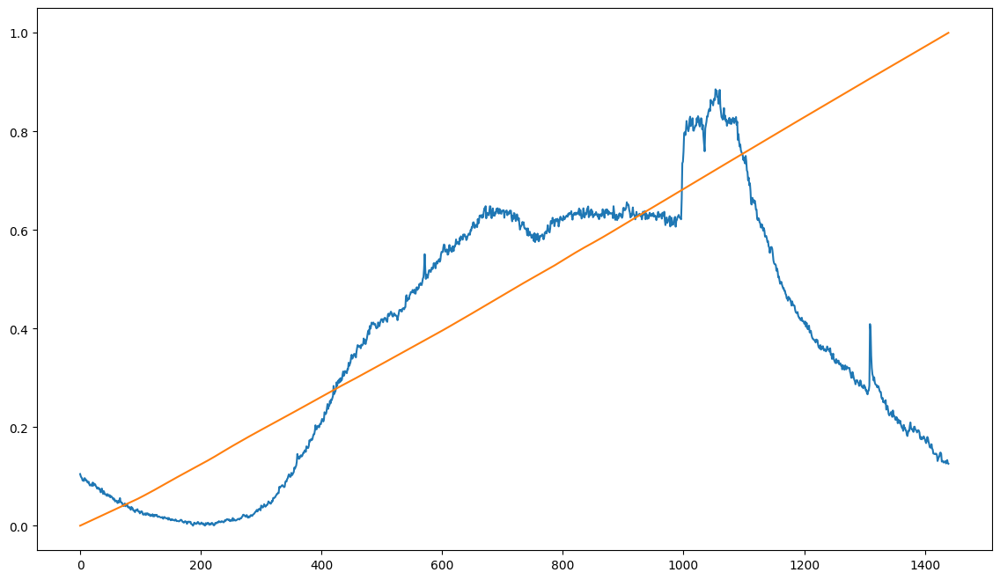

In [141]:
fig,axes = plt.subplots(1,1,figsize=(14,8))
axes.plot(np.arange(1440),data[['volumn']].values[-split:])
axes.plot(np.arange(predictions.shape[0]),predictions)